<a href="https://colab.research.google.com/github/OttoJursch/DRL_robot_exploration/blob/master/TD3_otto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [141]:
#Install pybind11
!git clone https://github.com/pybind/pybind11.git
!cd pybind11 && mkdir build && cd build && cmake .. && make install

fatal: destination path 'pybind11' already exists and is not an empty directory.
mkdir: cannot create directory ‘build’: File exists


In [142]:
#Install Eigen
!apt install libeigen3-dev
!ln -sf /usr/include/eigen3/Eigen /usr/include/Eigen

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libeigen3-dev is already the newest version (3.3.4-4).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.


In [125]:
# Install dependencies on colab
!git clone https://github.com/OttoJursch/DRL_robot_exploration.git

fatal: destination path 'DRL_robot_exploration' already exists and is not an empty directory.


In [126]:
!#Build the C++/pybind stuff
!rm -rf DRL_robot_exploration/build
!cd DRL_robot_exploration && mkdir build && cd build && cmake .. && make

-- The C compiler identification is GNU 7.5.0
-- The CXX compiler identification is GNU 7.5.0
-- Check for working C compiler: /usr/bin/cc
-- Check for working C compiler: /usr/bin/cc -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /usr/bin/c++
-- Check for working CXX compiler: /usr/bin/c++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Found PythonInterp: /usr/bin/python3 (found version "3.6.9") 
-- Found PythonLibs: /usr/lib/x86_64-linux-gnu/libpython3.6m.so
-- Performing Test HAS_FLTO
-- Performing Test HAS_FLTO - Success
-- Found pybind11: /usr/local/include (found version "2.6.2" dev1)
-- Configuring done
-- Generating done
-- Build files have been written to: /content/DRL_robot_exploration/build
Scanning dependencies of target

In [127]:
!cd DRL_robot_exploration && git pull

remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 3 (delta 1), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (3/3), done.
From https://github.com/OttoJursch/DRL_robot_exploration
   657c13b..ac122d4  master     -> origin/master
Updating 657c13b..ac122d4
Fast-forward
 TD3_otto.ipynb | 19249 +++++++++++++++++++++++++++++++++++++++----------------
 1 file changed, 13656 insertions(+), 5593 deletions(-)


In [128]:
#laptop=True
laptop=False

In [129]:
from copy import deepcopy

class PaperRewardFunction:
    '''
    Reward function from the paper
    '''
    def __init__(self):
        pass

    def get_reward(self, robot_position, old_op_map, op_map, coll_index):
        '''
        Takes in map before step and map after step. Measures effect of sensor
        input from last step
        '''
        if not coll_index:
            reward = float(
                np.size(np.where(op_map == 255)) - np.size(np.where(old_op_map == 255))) / 14000
            if reward > 1:
                reward = 1
        else:
            reward = -10
        return reward


class FrontierRewardFunction:
    def __init__(self, reward_scale):
        self.reward_scale = reward_scale
        self.paper_reward = PaperRewardFunction()

    def frontiers(self, op_map, map_size, points):
        y_len = map_size[0]
        x_len = map_size[1]
        mapping = op_map.copy()
        # 0-1 unknown area map
        mapping = (mapping == 127) * 1
        mapping = np.lib.pad(mapping, ((1, 1), (1, 1)),
                             'constant',
                             constant_values=0)
        fro_map = mapping[2:][:, 1:x_len + 1] + mapping[:y_len][:, 1:x_len + 1] + mapping[1:y_len + 1][:, 2:] + \
                  mapping[1:y_len + 1][:, :x_len] + mapping[:y_len][:, 2:] + mapping[2:][:, :x_len] + mapping[2:][:,
                                                                                                      2:] + \
                  mapping[:y_len][:, :x_len]

        ind_free = np.where(op_map.ravel(order='F') == 255)[0]
        ind_fron_1 = np.where(1 < fro_map.ravel(order='F'))[0]
        ind_fron_2 = np.where(fro_map.ravel(order='F') < 8)[0]
        ind_fron = np.intersect1d(ind_fron_1, ind_fron_2)
        ind_to = np.intersect1d(ind_free, ind_fron)
        f = points[ind_to]
        f = f.astype(int)
        return f

    def map_points(self, map_glo):
        map_x = map_glo.shape[1]
        map_y = map_glo.shape[0]
        x = np.linspace(0, map_x - 1, map_x)
        y = np.linspace(0, map_y - 1, map_y)
        t1, t2 = np.meshgrid(x, y)
        points = np.vstack([t1.T.ravel(), t2.T.ravel()]).T
        return points

    def get_reward(self, robot_pos, old_op_map, op_map, coll_index):
        paper_reward = self.paper_reward.get_reward(robot_pos, old_op_map,
                                                    op_map, coll_index)

        #If there was a collision return the collision reward
        if coll_index:
            return paper_reward

        frontiers = np.array(
            self.frontiers(op_map, op_map.shape, self.map_points(op_map)))

        min_frontier_dist = -np.min(np.linalg.norm(robot_pos - frontiers, axis=1))
        return self.reward_scale * min_frontier_dist + paper_reward

sqrt2 = 2**0.5 +0.1
class PolarActionSpace:
    '''
    Action space is polar representation of vector robot should take from its
    current position

    This class will take that and add it to the current robot position to get 
    '''
    def __init__(self, min_travel, max_travel):
        self.max_distance = max_travel
        self.min_travel = min_travel

    def get_action(self, action_polar_coords, robot_position):
        angle = action_polar_coords[0] * (2 * np.pi)
        dist = action_polar_coords[1] * (self.max_distance - self.min_travel) + self.min_travel
        dx = dist * np.sin(angle)
        dy = dist * np.cos(angle)

        return np.array([dx, dy])


In [130]:
from scipy import spatial
from skimage import io
import numpy as np
import numpy.ma as ma
import time
import sys
from scipy import ndimage
from copy import deepcopy
import matplotlib.pyplot as plt

sys.path.append('DRL_robot_exploration')
if laptop:
    from build.inverse_sensor_model import *
    from build.astar import *
else:
    from DRL_robot_exploration.build.inverse_sensor_model import *
    from DRL_robot_exploration.build.astar import *
from random import shuffle
import os
import random


class Robot:
    def __init__(self,
                 index_map,
                 train,
                 plot,
                 root_dir,
                 action_space,
                 reward_function,
                 do_rescue,
                 shuffle=True):
        self.mode = train
        self.action_space = action_space
        self.plot = plot
        self.root_dir = root_dir
        self.index_map = index_map
        self.do_rescue = do_rescue
        self.reward_function = reward_function
        self.reset(index_map, shuffle)

    def reset(self, index_map=None, do_shuffle=True):
        if self.mode:
            self.map_dir = os.path.join(self.root_dir, 'train')
        else:
            self.map_dir = os.path.join(self.root_dir, 'test')
        self.map_list = os.listdir(self.map_dir)
        self.map_number = np.size(self.map_list)
        if self.mode and do_shuffle:
            shuffle(self.map_list)
        if index_map is None:
            index_map = random.choice(range(len(self.map_list)))
        self.li_map = index_map
        self.global_map, self.robot_position = self.map_setup(
            self.map_dir + '/' + self.map_list[self.li_map])
        self.op_map = np.ones(self.global_map.shape) * 127
        self.map_size = np.shape(self.global_map)
        self.finish_percent = 0.985
        self.resolution = 1
        self.sensor_range = 80
        self.old_position = np.zeros([2])
        self.old_op_map = np.empty([0])
        #current_dir = os.path.dirname(os.path.realpath(__file__))
        self.t = self.map_points(self.global_map)
        self.free_tree = spatial.KDTree(
            self.free_points(self.global_map).tolist())
        self.robot_size = 6
        self.local_size = 40
        if self.plot:
            self.xPoint = np.array([self.robot_position[0]])
            self.yPoint = np.array([self.robot_position[1]])
            self.x2frontier = np.empty([0])
            self.y2frontier = np.empty([0])


        return self.begin(), self.robot_position

    def begin(self):
        self.op_map = self.inverse_sensor(self.robot_position,
                                          self.sensor_range, self.op_map,
                                          self.global_map)
        step_map = self.robot_model(self.robot_position, self.robot_size,
                                    self.t, self.op_map)
        map_local = self.local_map(self.robot_position, step_map,
                                   self.map_size,
                                   self.sensor_range + self.local_size)
        if self.plot:
            self.plot_env()
        return self.op_map

    def step(self, action_index):
        terminal = False
        complete = False
        new_location = False
        all_map = False
        self.old_position = self.robot_position.copy()
        self.old_op_map = self.op_map.copy()

        # take action
        self.take_action(action_index, self.robot_position)

        # collision check
        collision_points, collision_index = self.collision_check(
            self.old_position, self.robot_position, self.map_size,
            self.global_map)

        if collision_index:
            self.robot_position = self.nearest_free(self.free_tree,
                                                    collision_points)
            self.op_map = self.inverse_sensor(self.robot_position,
                                              self.sensor_range, self.op_map,
                                              self.global_map)
            step_map = self.robot_model(self.robot_position, self.robot_size,
                                        self.t, self.op_map)
        else:
            self.op_map = self.inverse_sensor(self.robot_position,
                                              self.sensor_range, self.op_map,
                                              self.global_map)
            step_map = self.robot_model(self.robot_position, self.robot_size,
                                        self.t, self.op_map)

        map_local = self.local_map(self.robot_position, step_map,
                                   self.map_size,
                                   self.sensor_range + self.local_size)
        reward = self.reward_function.get_reward(self.robot_position,
                                                 self.old_op_map, self.op_map,
                                                 collision_index)

        if reward <= 0.02 and not collision_index:
            reward = -0.8
            new_location = True
            #terminal = True

        # during training, the robot is relocated if it has a collision
        # during testing, the robot will use collision check to avoid the collision
        if collision_index:
            if not self.mode:
                new_location = False
                terminal = False
            else:
                new_location = True
                terminal = True
            if self.plot and self.mode:
                self.xPoint = ma.append(self.xPoint, self.robot_position[0])
                self.yPoint = ma.append(self.yPoint, self.robot_position[1])
                self.plot_env()
            self.robot_position = self.old_position.copy()
            self.op_map = self.old_op_map.copy()
            if self.plot and self.mode:
                self.xPoint[self.xPoint.size - 1] = ma.masked
                self.yPoint[self.yPoint.size - 1] = ma.masked
        else:
            if self.plot:
                self.xPoint = ma.append(self.xPoint, self.robot_position[0])
                self.yPoint = ma.append(self.yPoint, self.robot_position[1])
                self.plot_env()

        # check if exploration is finished
        if np.size(np.where(self.op_map == 255)) / np.size(
                np.where(self.global_map == 255)) > self.finish_percent:
            self.li_map += 1
            if self.li_map == self.map_number:
                self.li_map = 0
                all_map = True
            #self.__init__(self.li_map, self.mode, self.plot)
            complete = True
            new_location = False
            terminal = True

        return (
            self.op_map, self.robot_position
        ), reward, terminal, complete, new_location, collision_index, all_map

    def rescuer(self):
        complete = False
        all_map = False
        pre_position = self.robot_position.copy()
        robot_position = self.frontier(self.op_map, self.map_size, self.t).astype(np.int16)
        op_map = self.inverse_sensor(robot_position,
                                          self.sensor_range, self.op_map,
                                          self.global_map)

        path = self.astar_path(self.op_map, pre_position.tolist(),
                                   robot_position.tolist())
        #if self.plot:
        #  self.plot_env()
        #  self.x2frontier = ma.append(self.x2frontier, ma.masked)
        #  self.y2frontier = ma.append(self.y2frontier, ma.masked)
        #  self.x2frontier = ma.append(self.x2frontier, path[1, :])
        #  self.y2frontier = ma.append(self.y2frontier, path[0, :])
        #  self.xPoint = ma.append(self.xPoint, ma.masked)
        #  self.yPoint = ma.append(self.yPoint, ma.masked)
        #  self.xPoint = ma.append(self.xPoint, self.robot_position[0])
        #  self.yPoint = ma.append(self.yPoint, self.robot_position[1])

        return op_map, path

    def take_action(self, action_index, robot_position):
        move_action = self.action_space.get_action(action_index,
                                                   robot_position)

        robot_position[0] = np.round(robot_position[0] + move_action[0])
        robot_position[1] = np.round(robot_position[1] + move_action[1])

    def map_setup(self, location):
        global_map = (io.imread(location, 1) * 255).astype(int)
        robot_location = np.nonzero(global_map == 208)
        robot_location = np.array([
            np.array(robot_location)[1, 127],
            np.array(robot_location)[0, 127]
        ])
        global_map = (global_map > 150)
        global_map = global_map * 254 + 1
        return global_map, robot_location

    def map_points(self, map_glo):
        map_x = map_glo.shape[1]
        map_y = map_glo.shape[0]
        x = np.linspace(0, map_x - 1, map_x)
        y = np.linspace(0, map_y - 1, map_y)
        t1, t2 = np.meshgrid(x, y)
        points = np.vstack([t1.T.ravel(), t2.T.ravel()]).T
        return points

    def local_map(self, robot_location, map_glo, map_size, local_size):
        minX = robot_location[0] - local_size
        maxX = robot_location[0] + local_size
        minY = robot_location[1] - local_size
        maxY = robot_location[1] + local_size

        if minX < 0:
            maxX = abs(minX) + maxX
            minX = 0
        if maxX > map_size[1]:
            minX = minX - (maxX - map_size[1])
            maxX = map_size[1]
        if minY < 0:
            maxY = abs(minY) + maxY
            minY = 0
        if maxY > map_size[0]:
            minY = minY - (maxY - map_size[0])
            maxY = map_size[0]

        map_loc = map_glo[minY:maxY][:, minX:maxX]
        return map_loc

    def free_points(self, op_map):
        index = np.where(op_map == 255)
        free = np.asarray([index[1], index[0]]).T
        return free

    def nearest_free(self, tree, point):
        pts = np.atleast_2d(point)
        index = tuple(tree.query(pts)[1])
        nearest = tree.data[index]
        return nearest

    def robot_model(self, position, robot_size, points, map_glo):
        map_copy = map_glo.copy()
        robot_points = self.range_search(position, robot_size, points)
        for i in range(0, robot_points.shape[0]):
            rob_loc = np.int32(robot_points[i, :])
            rob_loc = np.flipud(rob_loc)
            map_copy[tuple(rob_loc)] = 76
        map_with_robot = map_copy
        return map_with_robot

    def range_search(self, position, r, points):
        nvar = position.shape[0]
        r2 = r**2
        s = 0
        for d in range(0, nvar):
            s += (points[:, d] - position[d])**2
        idx = np.nonzero(s <= r2)
        idx = np.asarray(idx).ravel()
        inrange_points = points[idx, :]
        return inrange_points

    def collision_check(self, start_point, end_point, map_size, map_glo):
        x0, y0 = start_point.round()
        x1, y1 = end_point.round()
        dx, dy = abs(x1 - x0), abs(y1 - y0)
        x, y = x0, y0
        error = dx - dy
        x_inc = 1 if x1 > x0 else -1
        y_inc = 1 if y1 > y0 else -1
        dx *= 2
        dy *= 2

        coll_points = np.ones((1, 2), np.uint8) * -1

        while 0 <= x < map_size[1] and 0 <= y < map_size[0]:
            k = map_glo.item(y, x)
            if k == 1:
                coll_points.itemset((0, 0), x)
                coll_points.itemset((0, 1), y)
                break

            if x == end_point[0] and y == end_point[1]:
                break

            if error > 0:
                x += x_inc
                error -= dy
            else:
                y += y_inc
                error += dx
        if np.sum(coll_points) == -2:
            coll_index = False
        else:
            coll_index = True

        return coll_points, coll_index

    def inverse_sensor(self, robot_position, sensor_range, op_map, map_glo):
        op_map = inverse_sensor_model(robot_position[0], robot_position[1],
                                      sensor_range, op_map, map_glo)
        return op_map

    def frontier(self, op_map, map_size, points):
        y_len = map_size[0]
        x_len = map_size[1]
        mapping = op_map.copy()
        # 0-1 unknown area map
        mapping = (mapping == 127) * 1
        mapping = np.lib.pad(mapping, ((1, 1), (1, 1)),
                             'constant',
                             constant_values=0)
        fro_map = mapping[2:][:, 1:x_len + 1] + mapping[:y_len][:, 1:x_len + 1] + mapping[1:y_len + 1][:, 2:] + \
                  mapping[1:y_len + 1][:, :x_len] + mapping[:y_len][:, 2:] + mapping[2:][:, :x_len] + mapping[2:][:,
                                                                                                      2:] + \
                  mapping[:y_len][:, :x_len]
        ind_free = np.where(op_map.ravel(order='F') == 255)[0]
        ind_fron_1 = np.where(1 < fro_map.ravel(order='F'))[0]
        ind_fron_2 = np.where(fro_map.ravel(order='F') < 8)[0]
        ind_fron = np.intersect1d(ind_fron_1, ind_fron_2)
        ind_to = np.intersect1d(ind_free, ind_fron)
        f = points[ind_to]
        f = f.astype(int)
        return f[0]

    def unique_rows(self, a):
        a = np.ascontiguousarray(a)
        unique_a = np.unique(a.view([('', a.dtype)] * a.shape[1]))
        result = unique_a.view(a.dtype).reshape(
            (unique_a.shape[0], a.shape[1]))
        result = result[~np.isnan(result).any(axis=1)]
        return result

    def astar_path(self, weights, start, goal, allow_diagonal=True):
        temp_start = [start[1], start[0]]
        temp_goal = [goal[1], goal[0]]
        temp_weight = (weights < 150) * 254 + 1
        # For the heuristic to be valid, each move must cost at least 1.
        if temp_weight.min(axis=None) < 1.:
            raise ValueError("Minimum cost to move must be 1, but got %f" %
                             (temp_weight.min(axis=None)))
        # Ensure start is within bounds.
        if (temp_start[0] < 0 or temp_start[0] >= temp_weight.shape[0]
                or temp_start[1] < 0 or temp_start[1] >= temp_weight.shape[1]):
            raise ValueError("Start lies outside grid.")
        # Ensure goal is within bounds.
        if (temp_goal[0] < 0 or temp_goal[0] >= temp_weight.shape[0]
                or temp_goal[1] < 0 or temp_goal[1] >= temp_weight.shape[1]):
            raise ValueError("Goal of lies outside grid.")

        height, width = temp_weight.shape
        start_idx = np.ravel_multi_index(temp_start, (height, width))
        goal_idx = np.ravel_multi_index(temp_goal, (height, width))

        path = astar(
            temp_weight.flatten(),
            height,
            width,
            start_idx,
            goal_idx,
            allow_diagonal,
        )
        return path

    def plot_env(self):
        plt.cla()
        plt.imshow(self.op_map, cmap='gray')
        plt.axis((0, self.map_size[1], self.map_size[0], 0))
        plt.plot(self.xPoint, self.yPoint, 'b', linewidth=2)
        plt.plot(self.x2frontier, self.y2frontier, 'r', linewidth=2)
        plt.plot(self.robot_position[0],
                 self.robot_position[1],
                 'mo',
                 markersize=8)
        plt.plot(self.xPoint[0], self.yPoint[0], 'co', markersize=8)
        plt.pause(0.05)


In [131]:
import numpy as np
import random

np.random.seed(1000)
random.seed(10)

reward_func = PaperRewardFunction()
action_space = PolarActionSpace(30, 60)

robot = Robot(0, True, False, 'DRL_robot_exploration/DungeonMaps',action_space,reward_func, False)

test_action = np.array([0.75, 0.5])
print('start')
print(robot.robot_position)

for i in range(10):
  (map, loc), reward, terminal, complete, new_loc, collision, all_map = robot.step(test_action)
  print('reward', reward)
  print('robot loc', loc)
  print(collision)


start
[111 327]
reward 0.06842857142857142
robot loc [ 66 327]
False
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True
reward -10
robot loc [ 66 327]
True


In [132]:
import torch
import torch.nn as nn
import torchsummary
import numpy as np
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence, pad_sequence

def build_conv_feature_extractor(conv_dims, act):
  #Create Conv2D + MaxPool layers
  conv_layers = [nn.Conv2d(*conv_dim) if len(conv_dim) == 3 else nn.MaxPool2d(conv_dim) for conv_dim in conv_dims]
  total_layers = []

  #Add ReLU activations after each conv layer
  for i, layer in enumerate(conv_layers):
    total_layers.append(layer)
    if type(layer) == nn.Conv2d:
      total_layers.append(act())
      total_layers.append(nn.BatchNorm2d(conv_dims[i][1]))
  return nn.Sequential(*total_layers)
  

def get_output_shape(model, image_dim):
    return model(torch.rand(*(image_dim))).data.shape

class RNNActor(nn.Module):
  #TODO Determine if the action space allows negative numbers
  #Potentially replace tanh with sigmoid
  def __init__(self, conv_dims, lstm_hidden, train_length, input_size=(1, 1,84,84), act=nn.ReLU, final_act=nn.Sigmoid):
    super(RNNActor, self).__init__()

    self.conv_mod = build_conv_feature_extractor(conv_dims, act)
    
    #Silly way to determine the size going into the RNN
    with torch.no_grad():
      feature_size = get_output_shape(self.conv_mod, input_size)

    print('LSTM Input Size', feature_size)

    #Construct LSTM
    self.lstm_hidden = lstm_hidden
    self.lstm_input = np.prod(list(feature_size)) + 2
    self.lstm = nn.LSTM(self.lstm_input, lstm_hidden)
    self.linear = nn.Linear(lstm_hidden, 2)
    self.train_length = train_length
    self.final_act = final_act()

  def forward(self, image, positions, lengths, hidden_state=None):
    batch_size = image.size()[1]
    seq_length = image.size()[0]
    conv = self.conv_mod(image.view((seq_length * batch_size, 1, 84, 112)))

    flat = conv.view(-1).view(seq_length, batch_size, self.lstm_input - 2)
    state = torch.cat((flat, positions), 2)
    packed = pack_padded_sequence(state, lengths, enforce_sorted=False)
    self.lstm.flatten_parameters()
    if hidden_state is not None:
      states, final_state = self.lstm(packed, hidden_state)
    else:
      states, final_state = self.lstm(packed)

    unpacked, end_lengths = pad_packed_sequence(states)
    final = self.linear(unpacked)
    return self.final_act(final), final_state, end_lengths

In [133]:
def build_dense_regression(linear_dims, act, final_act=None):
  linear_layers = [nn.Linear(*linear_dim)  for linear_dim in linear_dims]
  activations = [act() for layer in range(len(linear_layers) - 1)]
  #batch_norm = [nn.BatchNorm1d() for layer in range(len(linear_layers) - 1)]
  #batch_norm.append(nn.Identity())
  if final_act is not None:
    activations.append(final_act())
  else:
    activations.append(nn.Identity())
  return nn.Sequential(*[val for tup in zip(*[linear_layers, activations]) for val in tup]
)

class CNNCritic(nn.Module):
  def __init__(self, conv_dims, fc_dims, input_size=(1, 1,84,84), conv_act=nn.ReLU, fc_act=nn.ReLU):
    super(CNNCritic, self).__init__()
    self.conv_mod = build_conv_feature_extractor(conv_dims, conv_act)

    #Silly way to determine the size going into the RNN
    with torch.no_grad():
      feature_size = get_output_shape(self.conv_mod, input_size)

    #Add 4 for action + position
    feature_size = np.prod(list(feature_size)) + 4
    first_output = fc_dims[0][0]
    fc_dims.insert(0, (feature_size, first_output))

    self.fc = build_dense_regression(fc_dims, fc_act)
    self.fc_dims = feature_size

    


  def forward(self, map, positions, action):
    batch_size = map.size()[1]
    seq_length =  map.size()[0]
    conv = self.conv_mod(map.view((seq_length * batch_size, 1, 84, 112)))

    flat = conv.view(-1).view(seq_length, batch_size, self.fc_dims - 4)
    total_feats = torch.cat((flat, positions, action), 2)
    return self.fc(total_feats)

In [134]:
class ActorPolicy:
  def __init__(self, model):
    self.model = model

  def __call__(self, map, position, env):
    map = map.to(device='cuda').float().unsqueeze(0).unsqueeze(1)
    position = position.to(device='cuda').float().unsqueeze(0)

    result = self.model(map, position)

    return [result.cpu().squeeze(0)]

class CNNCriticNoSeq(nn.Module):
  def __init__(self, conv_dims, fc_dims, input_size=(1, 1,84,84), conv_act=nn.LeakyReLU, fc_act=nn.LeakyReLU):
    super(CNNCriticNoSeq, self).__init__()
    self.conv_mod = build_conv_feature_extractor(conv_dims, conv_act)

    #Silly way to determine the size going into the RNN
    with torch.no_grad():
      feature_size = get_output_shape(self.conv_mod, input_size)
    print('convoutput size)', feature_size)
    #Add 4 for action + position
    feature_size = np.prod(list(feature_size)) + 4
    first_output = fc_dims[0][0]
    fc_dims.insert(0, (feature_size, first_output))

    self.fc = nn.Linear(feature_size, int(feature_size/2))#build_dense_regression(fc_dims, fc_act)
    self.fc_dims = feature_size
    self.dropout = nn.Dropout(p=0.5)
    self.fc2 = nn.Linear(int(feature_size/2),1)

    


  def forward(self, map, positions, action):
    conv = self.conv_mod(map)
    batch_size = map.size()[0]
    flat = conv.view(batch_size, self.fc_dims - 4)
#     print('flat', flat.size())
#     print('positions', positions.size())
    total_feats = torch.cat((flat, positions, action), 1)
    return self.fc2(self.dropout(self.fc(total_feats)))



class FCActor(nn.Module):
  #TODO Determine if the action space allows negative numbers
  #Potentially replace tanh with sigmoid
  def __init__(self, conv_dims, linear_dims, input_size=(1, 1,84,84), act=nn.LeakyReLU, final_act=nn.Tanh):
    super(FCActor, self).__init__()
    self.conv_mod = build_conv_feature_extractor(conv_dims, act)

    #Silly way to determine the size going into the RNN
    with torch.no_grad():
      feature_size = get_output_shape(self.conv_mod, input_size)

    #Add 4 for action + position
    feature_size = np.prod(list(feature_size)) + 2
    print('feature size', feature_size)
    first_output = linear_dims[0][0]
    linear_dims.insert(0, (feature_size, first_output))

    self.fc = nn.Linear(feature_size, int(feature_size/2))#build_dense_regression(linear_dims, act, final_act)
    self.fc_dims = feature_size
    self.dropout = nn.Dropout(p=0.2)
    self.fc2 = nn.Linear(int(feature_size/2),2)
    self.sig = nn.Tanh()

  def forward(self, map, positions):
    conv = self.conv_mod(map)

    flat = conv.view(map.size()[0], self.fc_dims - 2)
#     print('flat', flat.size())
#     print('positions', positions.size())
    total_feats = torch.cat((flat, positions), 1)
    return self.sig(self.fc2(self.dropout(self.fc(total_feats))))

In [135]:
""" Learn a policy using DDPG for the reach task"""
import numpy as np
import torch
import time
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import MultivariateNormal
from torch.nn import MSELoss
import random
from skimage.transform import resize
from io import BytesIO
import itertools
import lmdb
from itertools import zip_longest

import gym
import os

import matplotlib.pyplot as plt
import copy
import time
if not laptop:
    from google.colab import drive
    drive.mount('/content/drive')

def save_models(actor, critic1, critic2, actor_target, critic1_target, critic2_target, i):
   torch.save(actor.state_dict(), '/content/drive/My Drive/models/actor_{}.pt'.format(i))
   torch.save(critic1.state_dict(), '/content/drive/My Drive/models/critic1_{}.pt'.format(i))
   torch.save(critic2.state_dict(), '/content/drive/My Drive/models/critic2_{}.pt'.format(i))
   torch.save(critic1_target.state_dict(), '/content/drive/My Drive/models/critic1_target_{}.pt'.format(i))
   torch.save(critic2_target.state_dict(), '/content/drive/My Drive/models/critic2_target_{}.pt'.format(i))
   torch.save(actor_target.state_dict(), '/content/drive/My Drive/models/actor_target_{}.pt'.format(i))
  

# TODO: A function to soft update target networks
def weighSync(target_model, source_model, tau=0.001):
  for (target, src) in zip(target_model.parameters(), source_model.parameters()):
    target.data = (1-tau) * target.data + tau * src.data 

def grouper(iterable, n, fillvalue=None):
  '''Collect data into fixed-length chunks or blocks'''
  # grouper('ABCDEFG', 3, 'x') --> ABC DEF Gxx"
  args = [iter(iterable)] * n
  return zip_longest(*args, fillvalue=fillvalue)

# TODO: Write the ReplayBuffer
class Replay():
    def __init__(self, buffer_size, init_sequences, max_episode_length, sequence_length, action_dim, env, test_env, env_width, env_height):
        """
        A function to initialize the replay buffer.

        param: init_length : Initial number of transitions to collect
        param: state_dim : Size of the state space
        param: action_dim : Size of the action space
        param: env : gym environment object
        """
        try:
          os.remove('db.lmdb')
        except OSError:
          print('cant remove')
          pass
        #shutil.copytree('/content/drive/My Drive/data.lmdb', 'db.lmdb')
        self.db = lmdb.open('db.lmdb', map_size=30e9)
        self.buffer = [{}] * buffer_size
        self.noise = MultivariateNormal(torch.zeros(2), torch.diag(torch.tensor([0.1, 0.1])))
        self.sequence_length = sequence_length
        self.max_episode_length = max_episode_length
        self.env = env
        self.test_env = test_env
        state = self.env.reset()
        self.buffer_length = buffer_size
        self.env_width = env_width
        self.env_height = env_height
        self.buffer_idx = 0
        self.total_steps = 0
        last_state = env.reset()
        init_policy = GuidedExplorationPolicy(0.5, None, action_space, 0.2)
        self.full_buffer = False
        self.current_pointer = 0

        map, position = self.env.reset()
        map = np.pad(map, ((map.shape[0], map.shape[1]), (map.shape[0], map.shape[1])), constant_values=127)
        #idx = (int(map.shape[0] / 2), int(position[1] - map.shape[1] / 2))
        #map = np.roll(map, idx, [0, 1])
        map = resize(map, (84, 112))
        map = map / 255
        position = position.astype(np.float64)
        position[0] = position[0] / 480
        position[1] = position[1] / 640
        action = {'map':torch.from_numpy(map).float(), 'position':torch.from_numpy(position).float()}
        
        while self.buffer_idx < init_sequences:
          action, terminal = self.generate_step(init_policy, action, False)
#           print('action', action)
#           print('terminal', terminal)
          if terminal:
           map, position = self.env.reset()

           map = resize(map, (84, 112))
           map = map / 255
           position = position.astype(np.float64)
           position[0] = position[0] / 480
           position[1] = position[1] / 640
           action = {'map':torch.from_numpy(map).float(), 'position':torch.from_numpy(position).float()}


    def generate_step(self, policy, last_transition, add_noise=True, store=True, test=False):
      if test:
        env = self.test_env
      else:
        env = self.env
      episode = []
      last_map = last_transition['map']
      last_position = last_transition['position']

      terminal = False

      total_reward = 0

      actions = policy(last_map, last_position, env)
      last_act = None
      if len(actions) == 0:
        terminal = True
      for action in actions:
        if add_noise:
          sampled = self.noise.sample()
          #print('adding noise', sampled)
          action = action.cpu() + sampled
        else:
          action = action.cpu()

        action_np = action.detach().numpy().flatten()
        #print('action_np', action_np)
        #if action_np[0] < 0:
        #  action_np[0] = abs(action_np[0])
        #elif action_np[0] > 1:
        #  action_np[0] = action_np[0] - 1

        #if action_np[1] < 0:
        #  action_np[1] = abs(action_np[1])
        #elif action_np[1] > 1:
        #  action_np[1] = action_np[1] - 1

    

        (map, loc), reward, terminal, complete, new_loc, collision, all_map = env.step(action_np)
        #map = np.pad(map, ((map.shape[0], map.shape[1]), (map.shape[0], map.shape[1])), constant_values=127)
        #idx = (int(map.shape[0] / 2 - loc[0]), int(map.shape[1] / 2 - loc[1]))
        #map = np.roll(map, idx, axis=[0, 1])

        #print('shifted', idx)
        #plt.imshow(map)
        #plt.show()
        map = resize(map, (84, 112))
        map = (map / 255)
        loc = loc.astype(np.float64)
        loc[0] = loc[0] / 480.0
        loc[1] = loc[1] / 640.0

        map_tensor = torch.from_numpy(map).float()
        position_tensor = torch.from_numpy(loc).float()
        reward_tensor = torch.tensor(reward).float()
        action = {'last_map':last_map, 'last_position':last_position, 'map': map_tensor.detach(), 'position': position_tensor.detach(), 'reward': reward_tensor.unsqueeze(0).detach(), 'action': action.detach()}
        last_act = action
        total_reward += reward

        if store:
          self.write_one_transition(action, self.buffer_idx)
          self.buffer_idx = (self.buffer_idx + 1) % len(self.buffer)
          if self.buffer_idx == 0:
            self.full_buffer = True

      return last_act, terminal

    def write_one_transition(self, trans, idx):
      actions = trans['action']
      rewards = trans['reward']
      maps = trans['map']
      positions = trans['position']

      last_map = trans['last_map']
      last_position = trans['last_position']

#       print('actions', actions.size())
#       print('rewards', rewards.size())
#       print('maps', maps.size())
#       print('positions', positions.size())
#       print('last_map', last_map.size())
#       print('last_position', last_position.size())

      total_tensor = torch.cat((actions, rewards, positions, last_position), 0)
      total_maps = torch.cat((maps, last_map), 0)
      with self.db.begin(write=True) as txn:
        total_bytes = BytesIO()
        maps_bytes = BytesIO()

        torch.save(total_tensor, total_bytes)
        torch.save(total_maps, maps_bytes)
        
        txn.put('{}_total'.format(idx).encode(), total_bytes.getvalue())
        txn.put('{}_maps'.format(idx).encode(), maps_bytes.getvalue())

    def sample_transitions(self, N):
      """
      A function to sample N points from the buffer
      param: N : Number of samples to obtain from the buffer
      """
      if self.full_buffer:
        samples = np.random.permutation(range(self.buffer_length))
      else:
        samples = np.random.permutation(range(self.buffer_idx))

      samples = samples[:N]
      return self.read_transitions(samples)

    def read_transitions(self, transitions):
      maps = []
      positions = []
      rewards = []
      actions = []
      last_maps = []
      last_positions = []

      for seq in transitions:
        with self.db.begin() as txn:
          total_data = BytesIO(txn.get('{}_total'.format(seq).encode()))
          map_data = BytesIO(txn.get('{}_maps'.format(seq).encode()))      

          total_tensor = torch.load(total_data)
          map_tensor = torch.load(map_data)
#           print('map tensor', map_tensor.size())
          maps.append(map_tensor[:84, :].unsqueeze(0))
          last_maps.append(map_tensor[84:, :].unsqueeze(0))
          positions.append(total_tensor[3:5].unsqueeze(0))
          actions.append(total_tensor[:2].unsqueeze(0))
          rewards.append(total_tensor[2].unsqueeze(0))
          last_positions.append(total_tensor[5:].unsqueeze(0))

      map_pad = torch.cat(maps, 0).to(device='cuda').float()
      pos_pad = torch.cat(positions, 0).to(device='cuda').float()
      reward_pad = torch.cat(rewards, 0).to(device='cuda').float()
      action_pad = torch.cat(actions, 0).to(device='cuda').float()
      last_positions = torch.cat(last_positions, 0).to(device='cuda').float()
      last_maps = torch.cat(last_maps, 0).to(device='cuda').float()

      return map_pad, pos_pad, reward_pad, action_pad, last_positions, last_maps

    def generate_episode(self, policy, add_noise=True, store=True, test=False, plot=False, do_print=False):
      episode = []
      self.env.plot = plot
      map, position = self.env.reset()
      position = position.astype(np.float64)
      map = resize(map, (84, 112))
      map = ((map - 127) / 255) * 2

      position[0] = position[0]/ 640.0
      position[1] = position[1] / 480.0
      last_map = torch.from_numpy(map).float()
      last_position = torch.from_numpy(position).float()
      terminal = False

      total_reward = 0
      last_state = None
      for i in range(self.max_episode_length):
        if last_state is None:
          action, last_state, lengths = policy(last_map.unsqueeze(0).unsqueeze(0).to(device='cuda'), last_position.unsqueeze(0).unsqueeze(0).to(device='cuda'), [1])
        else:
          action, last_state, lengths = policy(last_map.unsqueeze(0).unsqueeze(0).to(device='cuda'), last_position.unsqueeze(0).unsqueeze(0).to(device='cuda'), [1], last_state)
      
        if add_noise:
          sampled = torch.clamp(self.noise.sample(), -0.25, 0.25)
          #print('adding noise', sampled)
          action = action.cpu().squeeze(0).squeeze(1) + sampled
        else:
          action = action.cpu().squeeze(0).squeeze(1)

        action_np = action.detach().numpy().flatten()
        if action_np[0] < 0:
          action_np[0] = abs(action_np[0])
        elif action_np[0] > 1:
          action_np[0] = action_np[0] - 1

        if action_np[1] < 0:
          action_np[1] = abs(action_np[1])
        elif action_np[1] > 1:
          action_np[1] = action_np[1] - 1


        if do_print:
          print('action', action_np)

    

        (map, loc), reward, terminal, complete, new_loc, collision, all_map = self.env.step(action_np)
        map = resize(map, (84, 112))
        map = ((map - 127) / 255) * 2
        loc = loc.astype(np.float64)
        loc[0] = loc[0] / 640.0
        loc[1] = loc[1] / 480.0

        map_tensor = torch.from_numpy(map).float()
        position_tensor = torch.from_numpy(loc).float()
        reward_tensor = torch.tensor(reward).float()
        episode.append({'map': map_tensor.detach(), 'position': position_tensor.detach(), 'reward': reward_tensor.detach(), 'action': action.detach()})
        last_map = map_tensor.to(device='cuda')
        last_position = position_tensor.to(device='cuda')
        total_reward += reward
        if terminal:
          break

      if store:
        sequences = self.episode_to_sequences(episode)
        for sequence in sequences:
          self.write_sequence(sequence, self.buffer_idx)
          self.buffer_idx = (self.buffer_idx + 1) % len(self.buffer)
          if self.buffer_idx == 0:
            self.full_buffer = True

      self.env.plot = False
      return total_reward

    def write_sequence(self, sequence, idx):
      actions = sequence['actions']
      rewards = sequence['rewards']
      maps = sequence['maps']
      positions = sequence['positions']

      len = sequence['len']
      total_tensor = torch.cat((actions, rewards.unsqueeze(1).unsqueeze(1), positions.unsqueeze(1)), 2)
      with self.db.begin(write=True) as txn:
        total_bytes = BytesIO()
        maps_bytes = BytesIO()

        torch.save(total_tensor, total_bytes)
        torch.save(maps, maps_bytes)
        
        txn.put('{}_total'.format(idx).encode(), total_bytes.getvalue())
        txn.put('{}_maps'.format(idx).encode(), maps_bytes.getvalue())
        txn.put('{}_len'.format(idx).encode(), str(len).encode())

    def read_sequences(self, sequences):
        map_sequences = []
        position_sequences = []
        reward_sequences = []
        action_sequences = []
        seq_lens = []

        for seq in sequences:
            with self.db.begin() as txn:
                total_data = BytesIO(txn.get('{}_total'.format(seq).encode()))
                map_data = BytesIO(txn.get('{}_maps'.format(seq).encode()))
                length = txn.get('{}_len'.format(seq).encode())


                total_tensor = torch.load(total_data)
                map_tensor = torch.load(map_data)
                map_sequences.append(map_tensor)
                position_sequences.append(total_tensor[:, :, 3:])
                action_sequences.append(total_tensor[:, :, :2])
                reward_sequences.append(total_tensor[:, :, 2])
                seq_lens.append(int(length))

        map_pad = pad_sequence(map_sequences).to(device='cuda').float()
        pos_pad = pad_sequence(position_sequences).to(device='cuda').float()
        reward_pad = pad_sequence(reward_sequences).to(device='cuda').float()
        action_pad = pad_sequence(action_sequences).to(device='cuda').float()
        seqs = seq_lens



        return map_pad, pos_pad, reward_pad, action_pad, seqs
    
    def episode_to_sequences(self, episode):
      sequences = []
      last_idx = 0
      for i in np.arange(self.sequence_length, len(episode), self.sequence_length):
        window = episode[last_idx:i]
        map_tensor = torch.cat([torch.unsqueeze(data['map'], 0) for data in window], 0)
        position_tensor = torch.cat([torch.unsqueeze(data['position'], 0) for data in window], 0)
        reward_tensor = torch.cat([torch.unsqueeze(data['reward'], 0) for data in window], 0)
        action_tensor = torch.cat([torch.unsqueeze(data['action'], 0) for data in window], 0)
        sequences.append({'maps':map_tensor, 'positions': position_tensor, 'rewards': reward_tensor, 'actions':action_tensor, 'len':len(window)})
        last_idx = i

      window = episode[last_idx:]
      map_tensor = torch.cat([torch.unsqueeze(data['map'], 0) for data in window], 0)
      position_tensor = torch.cat([torch.unsqueeze(data['position'], 0) for data in window], 0)
      reward_tensor = torch.cat([torch.unsqueeze(data['reward'], 0) for data in window], 0)
      action_tensor = torch.cat([torch.unsqueeze(data['action'], 0) for data in window], 0)
      sequences.append({'maps':map_tensor, 'positions': position_tensor, 'rewards': reward_tensor, 'actions':action_tensor, 'len':len(window)})
      return sequences
    

    #TODO: Complete the function
    def buffer_sample(self, N):
        """
        A function to sample N points from the buffer
        param: N : Number of samples to obtain from the buffer
        """
        if self.full_buffer:
          samples = np.random.permutation(range(self.buffer_length))
        else:
          samples = np.random.permutation(range(self.buffer_idx))

        samples = samples[:N]
        return self.read_sequences(samples)

    def batchify(self, samples):
      
      map_sequences = []
      position_sequences = []
      reward_sequences = []
      action_sequences = []
      seq_lens = []

      for sequence in samples:

        map_sequences.append(sequence['maps'])
        position_sequences.append(sequence['positions'])
        reward_sequences.append(sequence['rewards'])
        action_sequences.append(sequence['actions'])
        seq_lens.append(sequence['len'])

      map_pad = pad_sequence(map_sequences).to(device='cuda').float()
      pos_pad = pad_sequence(position_sequences).to(device='cuda').float()
      reward_pad = pad_sequence(reward_sequences).to(device='cuda').float()
      action_pad = pad_sequence(action_sequences).to(device='cuda').float()
      seqs = seq_lens

      return map_pad, pos_pad, reward_pad, action_pad, seqs

      


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [136]:
!rm -rf db.lmdb

In [137]:
# TODO: Implement a DDPG class
def plot_grad_flow(named_parameters):
    ave_grads = []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.abs().mean())
    plt.plot(ave_grads, alpha=0.3, color="b")
    plt.hlines(0, 0, len(ave_grads)+1, linewidth=1, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(ave_grads))
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)
    plt.show()

import shutil
class TD3():
    def __init__(
            self,
            env,
            conv_dims,
            state_dim,
            linear_dims,
            actor_linear_dims,
            sequence_length,
            replay,
            critic_lr=3e-4,
            actor_lr=3e-4,
            gamma=0.99,
            batch_size=100,
            seed=1000
    ):
        """
        param: env: An gym environment
        param: action_dim: Size of action space
        param: state_dim: Size of state space
        param: critic_lr: Learning rate of the critic
        param: actor_lr: Learning rate of the actor
        param: gamma: The discount factor
        param: batch_size: The batch size for training
        """
        np.random.seed(seed)
        torch.manual_seed(seed)
        action_dim = 2
        self.gamma = gamma
        self.batch_size = batch_size
        self.sequence_length = sequence_length
        self.env = env
        self.state_dim = state_dim
        self.actor = FCActor(conv_dims, actor_linear_dims).float().to(device='cuda')
        print(self.actor)

        # TODO: Create a actor and actor_target
        self.actor_target = copy.deepcopy(self.actor)

        # TODO: Make sure that both networks have the same initial weights

        # TODO: Create a critic and critic_target object
        self.critic1 = CNNCriticNoSeq(conv_dims, linear_dims).float().to(device='cuda')
        self.critic1_target = copy.deepcopy(self.critic1)
        # TODO: Make sure that both networks have the same initial weights

        self.critic2 = CNNCriticNoSeq(conv_dims, linear_dims).float().to(device='cuda')
        self.critic2_target = copy.deepcopy(self.critic2)
        # TODO: Make sure that both networks have the same initial weights

        # TODO: Define the optimizer for the actor
        self.optimizer_actor = optim.Adam(self.actor.parameters(), actor_lr)
        self.lr_sched_actor = optim.lr_scheduler.StepLR(self.optimizer_actor, step_size=200, gamma=0.99)
        # TODO: Define the optimizer for the critic
        self.optimizer_critic1 = optim.Adam(self.critic1.parameters(), critic_lr)
        self.lr_sched_critic1 = optim.lr_scheduler.StepLR(self.optimizer_critic1, step_size=100, gamma=0.95)
        
        self.optimizer_critic2 = optim.Adam(self.critic2.parameters(), critic_lr)
        self.lr_sched_critic2 = optim.lr_scheduler.StepLR(self.optimizer_critic2, step_size=100, gamma=0.95)

        # TODO: define a replay buffer
        #buffer_size, init_episodes, max_episode_length, state_dim, action_dim, env, env_width, env_height
        self.replay = replay

    # TODO: Complete the function
    def update_target_networks(self):
        """
        A function to update the target networks
        """
        weighSync(self.actor_target, self.actor)
        weighSync(self.critic1_target, self.critic1)
        weighSync(self.critic2_target, self.critic2)

    # TODO: Complete the function
    def update_network(self, y_i, maps, positions, actions, last_maps, last_positions, i):
        """
        A function to update the function just once
        """
        
        qs1 = self.critic1(last_maps, last_positions, actions)
        #print('critic loss sizes')
        #print(y_i.size())
        #print(qs.size())
        #should be (seq_len, batch, 1)
        #should be (seq_len, batch, 1)
        criterion = nn.MSELoss()
        critic1_loss = criterion(qs1, y_i)
        #print('critic loss', critic_loss)
        critic1_loss.backward()
        torch.nn.utils.clip_grad_norm_(self.critic1.parameters(), 1)
        if i % 500 == 0:
          print("CRITIC")
          plot_grad_flow(self.critic1.named_parameters())

        self.optimizer_critic1.step()
        self.lr_sched_critic1.step()
        
        qs2 = self.critic2(last_maps, last_positions, actions)

        #print('critic loss sizes')
        #print(y_i.size())
        #print(qs.size())
        #should be (seq_len, batch, 1)
        #should be (seq_len, batch, 1)
        critic2_loss = criterion(qs2, y_i)
        torch.nn.utils.clip_grad_norm_(self.critic2.parameters(), 1)

        #print('critic loss', critic_loss)
        critic2_loss.backward()
        self.optimizer_critic2.step()
        self.lr_sched_critic2.step()

        #last_positions = (last_positions - last_positions.mean(0)) / last_positions.std(0)

        if i%2==0:
            new_act = self.actor(last_maps, last_positions)
            new_qs = self.critic1(last_maps, last_positions, new_act)
            actor_loss = -new_qs.mean()
            #print('actor_loss', actor_loss)
            actor_loss.backward()
            torch.nn.utils.clip_grad_norm_(self.actor.parameters(), 1)

            if i % 500 == 0:
                print("ACTOR")
                plot_grad_flow(self.actor.named_parameters())
                
            self.optimizer_actor.step()
            self.lr_sched_actor.step()
            

  
    # TODO: Complete the function
    def train(self, num_steps):
        """
        Train the policy for the given number of iterations
        :param num_steps:The number of steps to train the policy for
        """
        self.critic_criterion = MSELoss()
        num_episodes = 0
        i = 0
        total_reward = 0
        total_test_reward = 0
        total_steps = 0
        episode_reward = 0
        steps_list = []
        self.rewards = []
        start = time.time()
        total_target_time = 0
        total_backprop_time = 0
        total_gen_episode_time = 0
        total_test_time = 0
        total_dataload_time = 0

        
        map, position = self.replay.env.reset()
        #map, position = self.env.reset(self.env.index_map, False)
        map = resize(map, (84, 112))
        map = map / 255
        position = position.astype(np.float64)
        position[0] = position[0] / 480
        position[1] = position[1] / 640
        action = {'map':torch.from_numpy(map).float(), 'position':torch.from_numpy(position).float()}
        
        while i < num_steps:
            self.optimizer_critic1.zero_grad()
            self.optimizer_critic2.zero_grad()
            self.optimizer_actor.zero_grad()
            gen_start = time.time()
            action, terminal = self.replay.generate_step(ActorPolicy(self.actor), action)
            total_gen_episode_time += time.time() - gen_start
            total_reward += action['reward'].item()
            if i%100==0:
                print('step {}'.format(i))
                save_models(self.actor, self.critic1, self.critic2, self.actor_target, self.critic1_target, self.critic2_target, i)
                shutil.rmtree('/content/drive/My Drive/data.lmdb')
                shutil.copytree('db.lmdb', '/content/drive/My Drive/data.lmdb')
                #print(total_reward)
                #print(action)
            if terminal:
                self.rewards.append(total_reward)
                total_reward = 0                
                map, position = self.env.reset()
                #map, position = #self.env.reset(self.env.index_map, False)
                map = resize(map, (84, 112))
                map = map / 255
                position = position.astype(np.float64)
                position[0] = position[0] / 480
                position[1] = position[1] / 640
                action = {'map':torch.from_numpy(map).float(), 'position':torch.from_numpy(position).float()}


            #maps.size() -> (seq_len, batch_size, 1, 224, 224)
            #positons.size() -> (seq_len, batch_size, 2)
            #rewards.size() -> (seq_len, batch_size, 1)
            # actions -> (seq_len, batch_size, 2)
            dataload_time = time.time()
            maps, positions, rewards, actions, last_positions, last_maps = self.replay.sample_transitions(self.batch_size)
            maps = maps.unsqueeze(1)
            last_maps = last_maps.unsqueeze(1)

            total_dataload_time += time.time() - dataload_time

            target_start = time.time()
            with torch.no_grad():
                target_action = self.actor_target(last_maps, last_positions)
                #print('target action', target_action.size())
                #Should be (seq_len, batch_size, 2)
                #Should be (seq_len, batch_size, 1)
                crit1 = self.critic1_target(maps, positions, target_action)
                crit2 = self.critic2_target(maps, positions, target_action)
                #print('rewards', rewards.size())
                #print('crit', crit.size())
                ys = rewards.unsqueeze(1) + self.gamma * torch.minimum(crit1, crit2)

            total_target_time += time.time() - target_start
            update_start = time.time()
            self.update_network(ys, maps, positions, actions, last_maps, last_positions, i)

            if i%2==0:
              self.update_target_networks()
            total_backprop_time += time.time() - update_start
            i += 1
            if i % 100 == 0:
              print('step {}'.format(i))
              print('avg iter time {}'.format((time.time() - start) / i))

              reward = 0
              start_test = time.time()
              for j in range(5):
                test_map, test_position = self.replay.test_env.reset()
                #test_map, test_position = self.replay.test_env.reset(self.env.index_map, False)
                test_map = resize(test_map, (84, 112))
                test_map = test_map / 255
                test_position = test_position.astype(np.float64)
                test_position[0] = test_position[0] / 480
                test_position[1] = test_position[1] / 640
                test_action = {'map':torch.from_numpy(test_map).float(), 'position':torch.from_numpy(test_position).float()}
                x = 0
                reward= 0
                total_test_reward = 0
                while x < 300:
                  test_action, test_terminal = self.replay.generate_step(ActorPolicy(self.actor), test_action, False, False, True)
                  print('action', test_action)
                  print('terminal', test_terminal)
                  reward += test_action['reward'].item()
                  if test_terminal:
                    test_map, test_position = self.replay.test_env.reset()
                    #test_map, test_position = self.replay.test_env.reset(self.env.index_map, False)

                    test_map = resize(test_map, (84, 112))
                    test_map = test_map / 255
                    test_position = test_position.astype(np.float64)
                    test_position[0] = test_position[0] / 480
                    test_position[1] = test_position[1] / 640
                    test_action = {'map':torch.from_numpy(test_map).float(), 'position':torch.from_numpy(test_position).float()}
                    break
                  x += 1
                print('reward', reward)

#             print('test reward', total_reward)
#             total_test_time = time.time() - start
#             print('avg test time', total_test_time / 5)
#             print('avg target time', total_target_time / i)
#             print('avg backprop time', total_backprop_time / i)
#             print('avg data load time', total_dataload_time / i)
#             print('avg gen episode time', total_gen_episode_time / i)
            #  test_done = False
            #  episode_reward = 0
            #  the_steps = 0
            #  s = test_env.reset()
            #  while not test_done:
            #    total_steps += 1
            #    the_steps += 1
            #    action = self.actor(torch.from_numpy(s).float().to(device='cuda')).detach().squeeze().cpu().numpy()
            #    n_state, r, test_done, _ = test_env.step(action)
            #    s = n_state
            #    episode_reward += r

            #  rewards.append(episode_reward)
            #  steps_list.append(the_steps)
            #  print('Episode reward')
            #  print(episode_reward)

        return rewards, steps_list

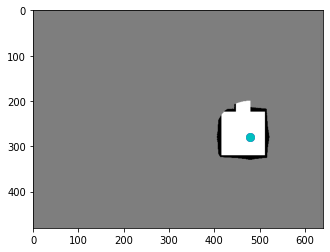

In [138]:
class ClippedLinearFrontierDistanceReward:
    def __init__(self, reward_scale):
        self.reward_scale = reward_scale
        self.paper_reward = PaperRewardFunction()

    def frontiers(self, op_map, map_size, points):
        y_len = map_size[0]
        x_len = map_size[1]
        mapping = op_map.copy()
        # 0-1 unknown area map
        mapping = (mapping == 127) * 1
        mapping = np.lib.pad(mapping, ((1, 1), (1, 1)),
                             'constant',
                             constant_values=0)
        fro_map = mapping[2:][:, 1:x_len + 1] + mapping[:y_len][:, 1:x_len + 1] + mapping[1:y_len + 1][:, 2:] + \
                  mapping[1:y_len + 1][:, :x_len] + mapping[:y_len][:, 2:] + mapping[2:][:, :x_len] + mapping[2:][:,
                                                                                                      2:] + \
                  mapping[:y_len][:, :x_len]

        ind_free = np.where(op_map.ravel(order='F') == 255)[0]
        ind_fron_1 = np.where(1 < fro_map.ravel(order='F'))[0]
        ind_fron_2 = np.where(fro_map.ravel(order='F') < 8)[0]
        ind_fron = np.intersect1d(ind_fron_1, ind_fron_2)
        ind_to = np.intersect1d(ind_free, ind_fron)
        f = points[ind_to]
        f = f.astype(int)
        return f

    def map_points(self, map_glo):
        map_x = map_glo.shape[1]
        map_y = map_glo.shape[0]
        x = np.linspace(0, map_x - 1, map_x)
        y = np.linspace(0, map_y - 1, map_y)
        t1, t2 = np.meshgrid(x, y)
        points = np.vstack([t1.T.ravel(), t2.T.ravel()]).T
        return points

    def astar_path(self, weights, start, goal, allow_diagonal=True):
        temp_start = [start[1], start[0]]
        temp_goal = [goal[1], goal[0]]
        temp_weight = (weights < 150) * 254 + 1
        # For the heuristic to be valid, each move must cost at least 1.
        if temp_weight.min(axis=None) < 1.:
            raise ValueError("Minimum cost to move must be 1, but got %f" % (
                temp_weight.min(axis=None)))
        # Ensure start is within bounds.
        if (temp_start[0] < 0 or temp_start[0] >= temp_weight.shape[0] or
                temp_start[1] < 0 or temp_start[1] >= temp_weight.shape[1]):
            raise ValueError("Start lies outside grid.")
        # Ensure goal is within bounds.
        if (temp_goal[0] < 0 or temp_goal[0] >= temp_weight.shape[0] or
                temp_goal[1] < 0 or temp_goal[1] >= temp_weight.shape[1]):
            raise ValueError("Goal of lies outside grid.")

        height, width = temp_weight.shape
        start_idx = np.ravel_multi_index(temp_start, (height, width))
        goal_idx = np.ravel_multi_index(temp_goal, (height, width))

        path = astar(
            temp_weight.flatten(), height, width, start_idx, goal_idx, allow_diagonal,
        )
        return path

    def get_reward(self, robot_pos, old_op_map, op_map, coll_index):
        paper_reward = self.paper_reward.get_reward(robot_pos, old_op_map,
                                                    op_map, coll_index)
        
        #If there was a collision return the collision reward
        if coll_index:
            return paper_reward

        frontiers = np.array(
            self.frontiers(op_map, op_map.shape, self.map_points(op_map)))
        
        frontiers = frontiers[np.random.choice(np.arange(0, frontiers.shape[0]), (10,)), :]

        for frontier in range(frontiers.shape[0]):
          frontier = frontiers[frontier, :]
          path = self.astar_path(op_map, robot_pos, frontier)
          dist = 0
          last_point = robot_pos
          for point in range(1, path.shape[1]):
            point = path[:, point]
            dist += np.linalg.norm(point - last_point)
            paper_reward += np.clip(-self.reward_scale * dist + 1, 0, 1)
        
        return paper_reward


import random
from copy import deepcopy

class GuidedExplorationPolicy:

  def __init__(self, prob_guided, model, action_space, noise_var):
    self.prob_guided = prob_guided
    self.model = model
    self.action_space = action_space
    #self.noise = torch.MultivariateGaussian(torch.zeros(2), torch.diag([noise_var,noise_var]))

  def __call__(self, map, location, env):
    p = random.random()
    actions = []
    max_distance = np.sqrt(self.action_space.max_x_travel**2 + self.action_space.max_y_travel**2)
    if p < self.prob_guided:
      rescue_map, rescue_path = env.rescuer()
      location = location.cpu().numpy()
      location[0] *= 640
      location[1] *= 480
      last_point = location
      point = 0
      count  = 0
      while point < rescue_path.shape[1]:
        count += 1
        next_point = rescue_path[[1, 0], point].astype(np.float64)
        dist = np.linalg.norm(next_point - location)
        _, coll = env.collision_check(location.astype(np.int64), next_point.astype(np.int64), env.map_size, env.global_map) 

        if coll or dist > max_distance:
          diff = (last_point - location).astype(np.float64)
          #angle = np.arctan2(diff[0], diff[1])
          #dist = np.linalg.norm(diff)
          #if angle < 0:
          #  angle += 2 * np.pi
          #angle = angle / (2 * np.pi)
          #dist = np.clip((dist - self.action_space.min_travel) / (self.action_space.max_distance - self.action_space.min_travel), 0, 1)
          location = next_point
          last_point = next_point
          diff[0] = np.clip(diff[0] / action_space.max_x_travel, -1, 1)
          diff[1] = np.clip(diff[1] / action_space.max_y_travel, -1, 1)
          
          if np.linalg.norm(diff) > 0.00001:
            print('appending', diff)
            actions.append(torch.from_numpy(diff).to(device='cuda').float())
        else:
          point += 1
          last_point = next_point
      
      
      _, coll = env.collision_check(location.astype(np.int64), last_point.astype(np.int64), env.map_size, env.global_map)
      dist = np.linalg.norm(last_point - location)
      #if coll or dist > self.action_space.max_distance:
      diff = (last_point - location).astype(np.float64)
      diff[0] = np.clip(diff[0] / action_space.max_x_travel, -1, 1)
      diff[1] = np.clip(diff[1] / action_space.max_y_travel, -1, 1)
      if np.linalg.norm(diff) > 0.00001:

        print('appending last', diff)

        actions.append(torch.from_numpy(diff).to(device='cuda').float())
    else:
      return [torch.from_numpy(np.random.uniform(-1, 1, (2,)))]

    return actions



class OffsetActionSpace:
  def __init__(self, max_x_travel, max_y_travel, min_distance):
    self.max_x_travel = max_x_travel
    self.max_y_travel = max_y_travel
    self.min_distance = min_distance

  def get_action(self, action, last_pos):
    #print('action offset', action)
    action[0] = action[0] * self.max_y_travel
    action[1] = action[1] * self.max_x_travel
    mag = np.linalg.norm(action)
    
    unit_vec = action / mag
    if mag < self.min_distance:
      unit_vec = unit_vec * self.min_distance
      action = unit_vec
    if mag < 0.000001:
      action = np.array([self.min_distance, 0])
    
    #print('row move', row_move)
    #print('col move', col_move)
    return action

reward_func = PaperRewardFunction()#ClippedLinearFrontierDistanceReward(1/320)
action_space = OffsetActionSpace(70.7, 70.7, 10)#PolarActionSpace(1, 100)

if laptop:
    robot = Robot(0, True, False, 'DungeonMaps',action_space,reward_func, False)
    test_robot = Robot(0, True, True, 'DungeonMaps',action_space,reward_func, False)
else:
    robot = Robot(0, True, False, 'DRL_robot_exploration/DungeonMaps',action_space,reward_func, False)
    test_robot = Robot(0, True, True, 'DRL_robot_exploration/DungeonMaps',action_space,reward_func, False)

In [139]:
replay = Replay(50000, 10000, 300, 4, 2, robot, test_robot, 640, 480)

Streaming output truncated to the last 5000 lines.
appending [-0.45261669 -0.08486563]
appending last [-0.43847242 -0.52333805]
appending last [-1.         -0.11315417]
appending [-1.         -0.21216407]
appending last [-0.55162659  0.        ]
appending last [-1.        -0.0990099]
appending [-0.26874116  0.        ]
appending last [-0.82036775 -0.01414427]
appending last [-0.2451673   0.26520509]
appending last [-1.          0.15558699]
appending [ 0.0990099  -0.02828854]
appending last [ 0.         -0.79207921]
appending last [-0.33946252 -0.00353607]
appending last [-1.         -0.11315417]
appending [-1.         -0.05657709]
appending last [-0.08486563  0.        ]
appending last [-1.         -0.11315417]
appending last [-1.          0.01414427]
appending last [-0.82036775  0.74964639]
appending [-0.71192826  0.64002829]
appending last [-1.        -0.0990099]
appending last [-0.60348899 -0.4738331 ]
appending last [-1.        -0.0990099]
appending last [-0.93352192 -0.62234795]
a

In [140]:
# linear_dims = [(256, 1)]
# actor_linear_dims = [(512, 2)]
# conv_dims = [(1, 64, 8), (2, 2), (64, 128, 8), (2, 2), (128, 256), (2, 2)]
# lstm_hidden = 512
# lstm_out = 2
# train_length = 4

# linear_dims = [(256, 128), (128, 1)]
# actor_linear_dims = [(512,256), (256, 2)] 
# conv_dims = [(1, 128, 32), (2, 2), (128, 64, 6), (2, 2), (64, 16, 1)] 
# lstm_hidden = 512
# lstm_out = 2
# train_length = 8


linear_dims = [(256, 128), (128, 1)]
actor_linear_dims = [(512,256), (256, 2)] 
conv_dims = [(1, 32, 8), (2, 2), (32, 64, 4), (2, 2), (64, 64, 3), (64, 16, 1)] 
lstm_hidden = 512
lstm_out = 2
train_length = 8
td3 = TD3(robot, conv_dims, lstm_hidden, linear_dims, actor_linear_dims, train_length, replay, 1e-5, 1e-8, 0.99,500)

feature size 3602
FCActor(
  (conv_mod): Sequential(
    (0): Conv2d(1, 32, kernel_size=(8, 8), stride=(1, 1))
    (1): LeakyReLU(negative_slope=0.01)
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(4, 4), stride=(1, 1))
    (5): LeakyReLU(negative_slope=0.01)
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
    (9): LeakyReLU(negative_slope=0.01)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
    (12): LeakyReLU(negative_slope=0.01)
    (13): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )


step 0
CRITIC


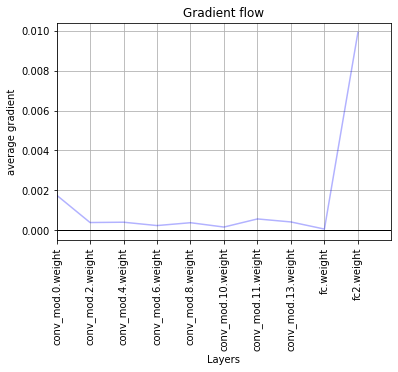

ACTOR


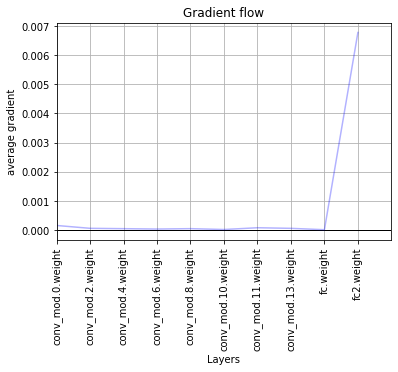

step 100
avg iter time 0.6886942934989929


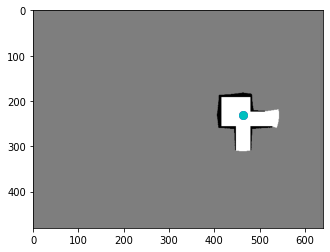

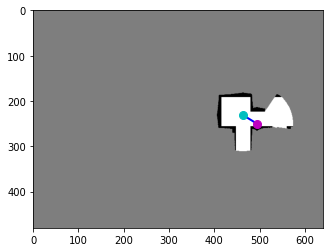

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0292, 0.3906]), 'reward': tensor([0.3149]), 'action': tensor([0.4339, 0.2666])}
terminal False


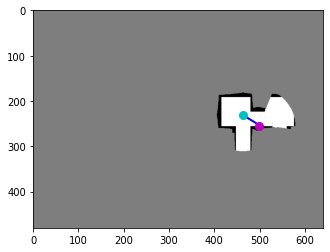

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0292, 0.3906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0292, 0.3906]), 'reward': tensor([-10.]), 'action': tensor([0.2730, 0.2805])}
terminal True


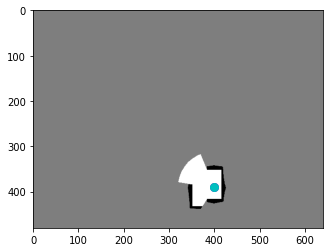

reward -9.68514284491539


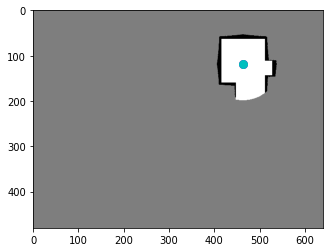

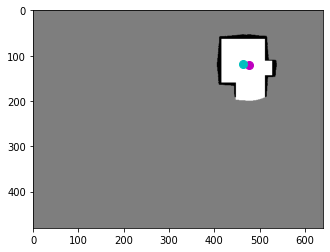

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9937, 0.1875]), 'reward': tensor([0.0296]), 'action': tensor([0.2032, 0.0181])}
terminal False


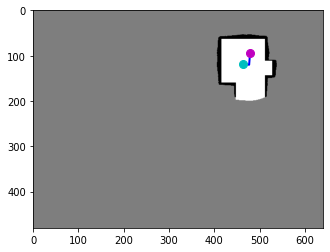

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9937, 0.1875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9979, 0.1469]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0334, -0.3729])}
terminal False


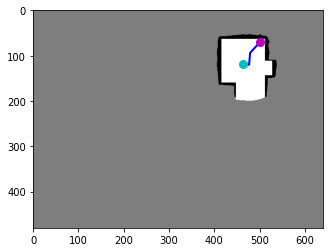

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.1469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0438, 0.1094]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3153, -0.3445])}
terminal False


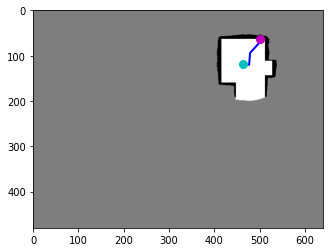

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0438, 0.1094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0438, 0.1094]), 'reward': tensor([-10.]), 'action': tensor([ 0.0324, -0.3097])}
terminal True


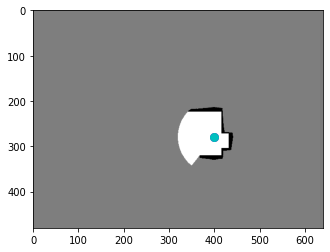

reward -11.570428594946861


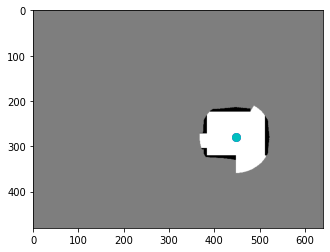

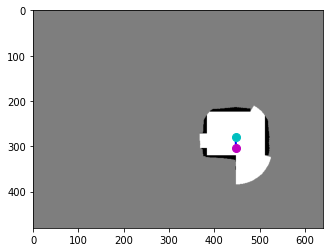

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.4750]), 'reward': tensor([0.2701]), 'action': tensor([0.0103, 0.3582])}
terminal False


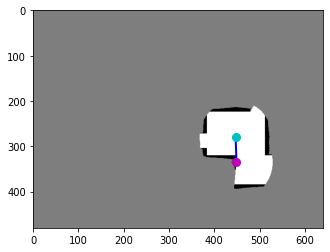

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.4750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9354, 0.5234]), 'reward': tensor([0.1759]), 'action': tensor([0.0145, 0.4409])}
terminal False


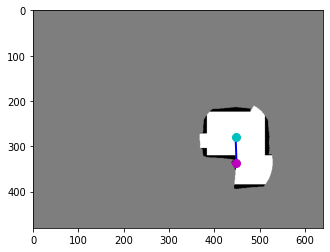

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9354, 0.5234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9354, 0.5234]), 'reward': tensor([-10.]), 'action': tensor([-0.2320,  0.1618])}
terminal True


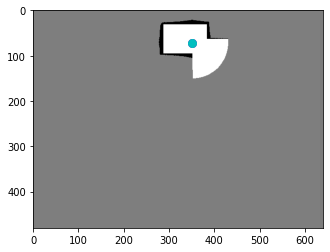

reward -9.554000005126


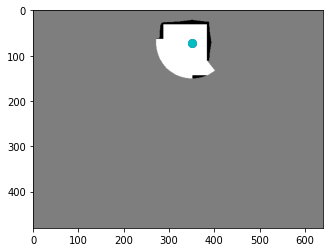

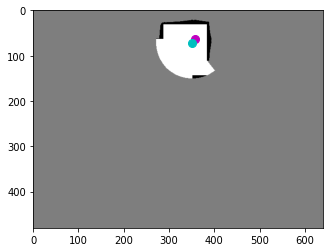

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7458, 0.1000]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0510, -0.0567])}
terminal False


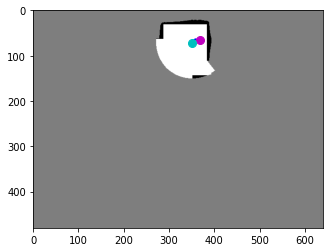

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7458, 0.1000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7667, 0.1031]), 'reward': tensor([-0.8000]), 'action': tensor([0.1145, 0.0214])}
terminal False


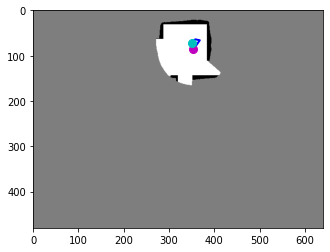

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7667, 0.1031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7375, 0.1344]), 'reward': tensor([0.1526]), 'action': tensor([-0.1989,  0.2859])}
terminal False


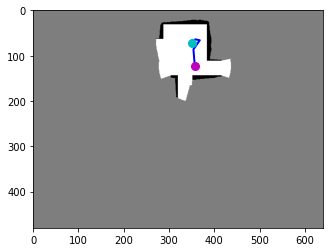

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7375, 0.1344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7437, 0.1922]), 'reward': tensor([0.3341]), 'action': tensor([0.0380, 0.5282])}
terminal False


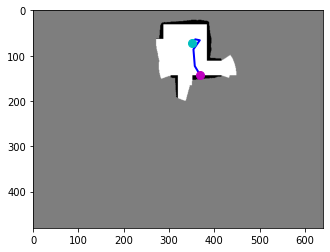

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7437, 0.1922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7437, 0.1922]), 'reward': tensor([-10.]), 'action': tensor([0.2646, 0.4496])}
terminal True


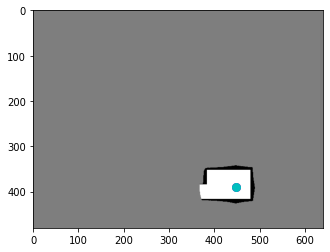

reward -11.11328573524952


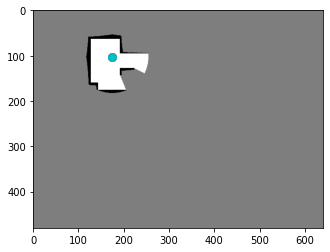

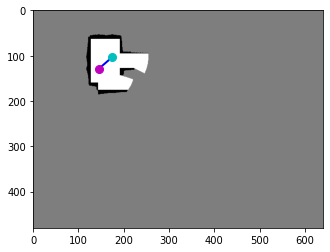

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3021, 0.2016]), 'reward': tensor([0.0687]), 'action': tensor([-0.4226,  0.3728])}
terminal False


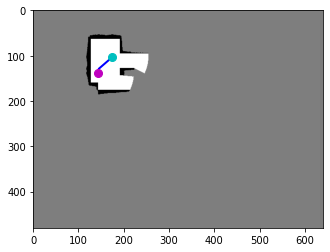

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3021, 0.2016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2979, 0.2172]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0136,  0.0788])}
terminal False


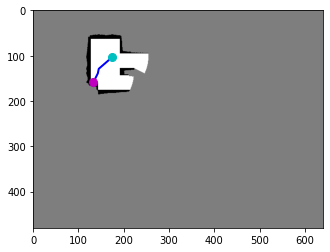

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.2172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2979, 0.2172]), 'reward': tensor([-10.]), 'action': tensor([-0.2242,  0.4630])}
terminal True


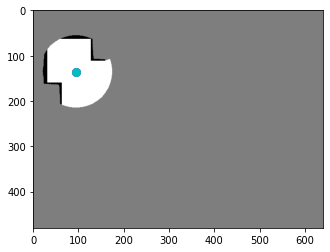

reward -10.731285728514194
step 100
step 200
avg iter time 0.7580687034130097


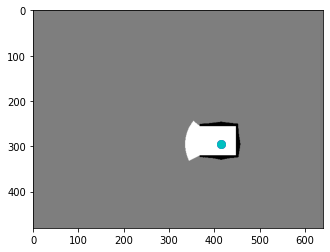

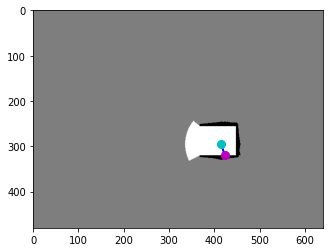

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8646, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([0.1163, 0.3470])}
terminal True


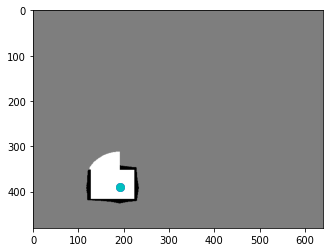

reward -10.0


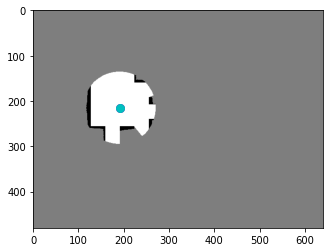

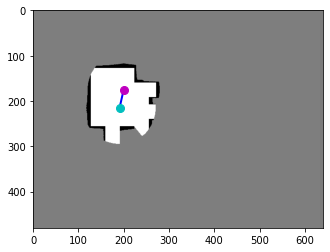

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4167, 0.2734]), 'reward': tensor([0.2551]), 'action': tensor([ 0.1310, -0.5704])}
terminal False


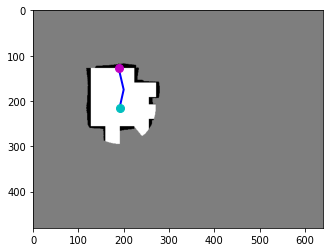

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4167, 0.2734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4167, 0.2734]), 'reward': tensor([-10.]), 'action': tensor([-0.1642, -0.7417])}
terminal True


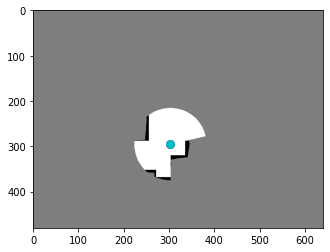

reward -9.744857132434845


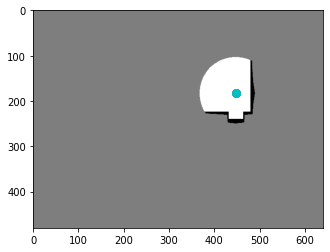

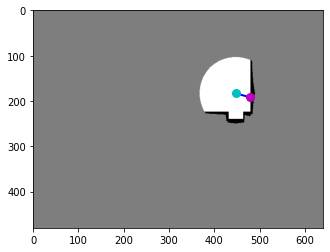

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9312, 0.2859]), 'reward': tensor([-10.]), 'action': tensor([0.6301, 0.1843])}
terminal True


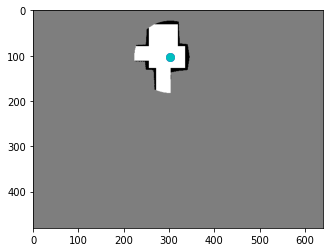

reward -10.0


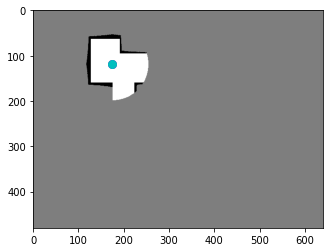

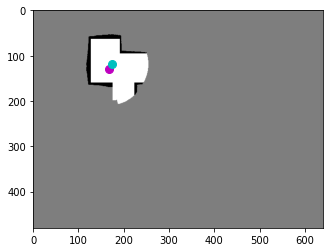

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3500, 0.2031]), 'reward': tensor([0.0409]), 'action': tensor([-0.0937,  0.1512])}
terminal False


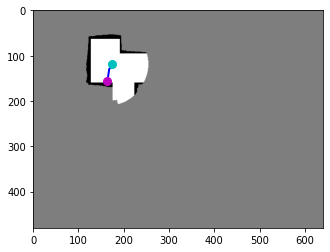

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3500, 0.2031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3417, 0.2453]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0550,  0.3848])}
terminal False


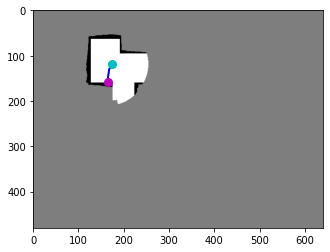

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3417, 0.2453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3417, 0.2453]), 'reward': tensor([-10.]), 'action': tensor([0.1402, 0.4547])}
terminal True


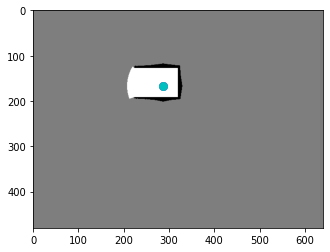

reward -10.759142868220806


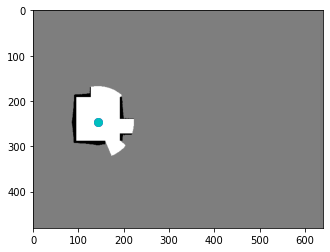

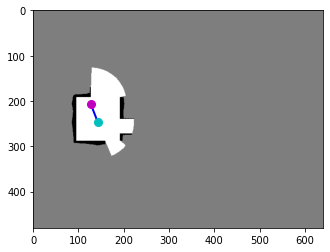

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.3219]), 'reward': tensor([0.3479]), 'action': tensor([-0.2295, -0.5836])}
terminal False


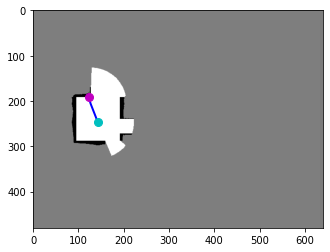

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.3219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.3219]), 'reward': tensor([-10.]), 'action': tensor([-0.1611, -0.5738])}
terminal True


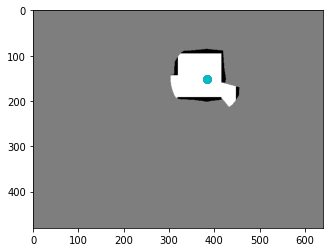

reward -9.652142852544785
step 200
step 300
avg iter time 0.7762676898638408


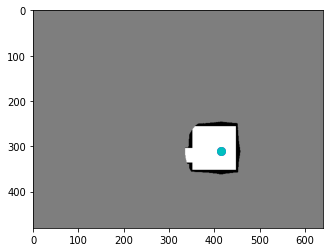

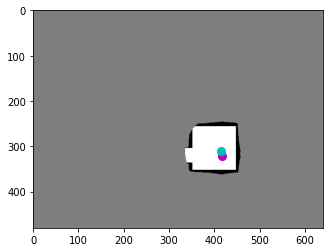

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8708, 0.5031]), 'reward': tensor([-0.8000]), 'action': tensor([0.0419, 0.1564])}
terminal False


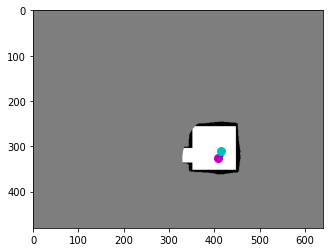

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8708, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8521, 0.5094]), 'reward': tensor([0.0283]), 'action': tensor([-0.0447,  0.0180])}
terminal False


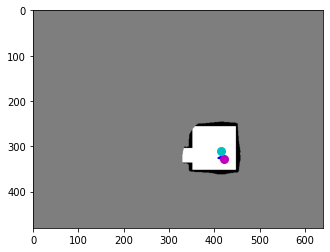

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8521, 0.5094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8792, 0.5125]), 'reward': tensor([-0.8000]), 'action': tensor([0.1786, 0.0269])}
terminal False


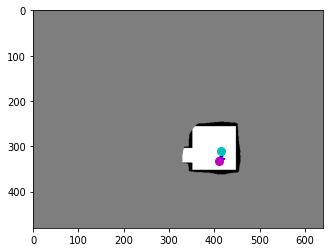

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8792, 0.5125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.5188]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1589,  0.0563])}
terminal False


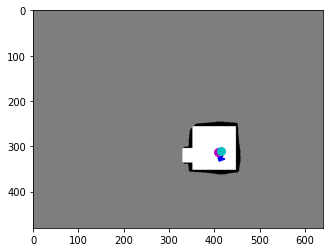

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8562, 0.5188]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8521, 0.4891]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0305, -0.2719])}
terminal False


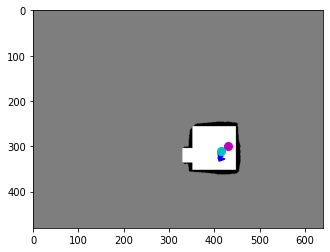

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8521, 0.4891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8958, 0.4688]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3000, -0.1830])}
terminal False


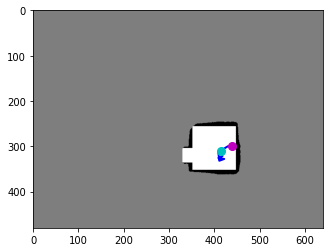

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8958, 0.4688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9167, 0.4688]), 'reward': tensor([-0.8000]), 'action': tensor([0.1007, 0.0002])}
terminal False


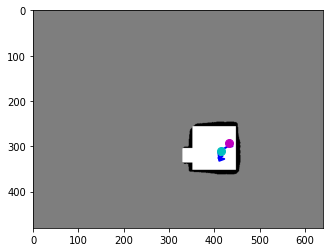

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9167, 0.4688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9021, 0.4563]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0922, -0.1168])}
terminal False


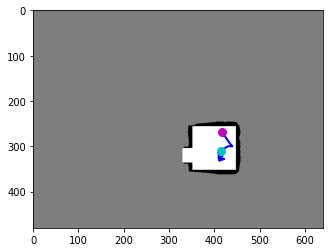

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9021, 0.4563]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8687, 0.4187]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2213, -0.3338])}
terminal False


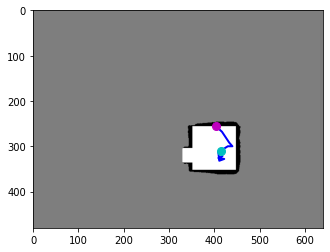

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8687, 0.4187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8687, 0.4187]), 'reward': tensor([-10.]), 'action': tensor([-0.1952, -0.1858])}
terminal True


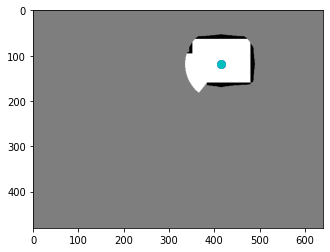

reward -16.37171438150108


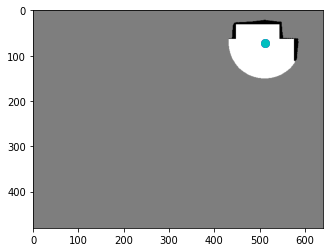

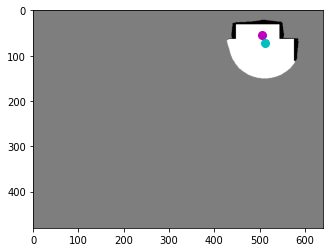

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0542, 0.0844]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0754, -0.2391])}
terminal False


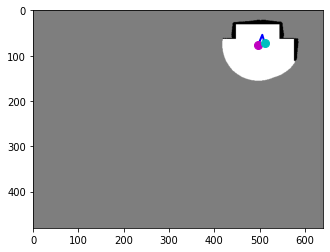

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0542, 0.0844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0354, 0.1187]), 'reward': tensor([0.2391]), 'action': tensor([-0.1323,  0.3152])}
terminal False


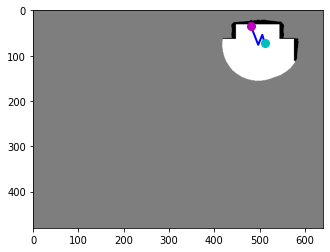

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0354, 0.1187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0021, 0.0547]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2321, -0.5761])}
terminal False


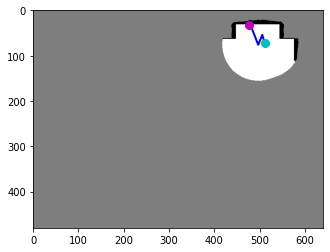

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0021, 0.0547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0021, 0.0547]), 'reward': tensor([-10.]), 'action': tensor([-0.4866, -0.3976])}
terminal True


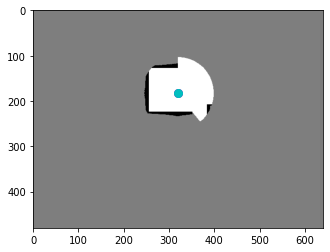

reward -11.360857173800468


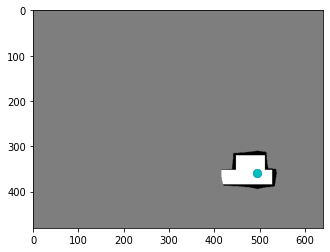

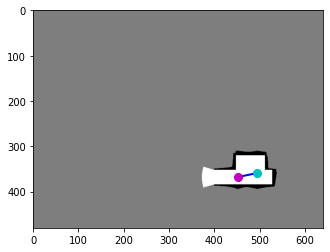

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9417, 0.5750]), 'reward': tensor([0.2237]), 'action': tensor([-0.6040,  0.1332])}
terminal False


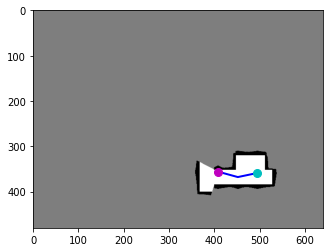

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9417, 0.5750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8500, 0.5562]), 'reward': tensor([0.1100]), 'action': tensor([-0.6184, -0.1668])}
terminal False


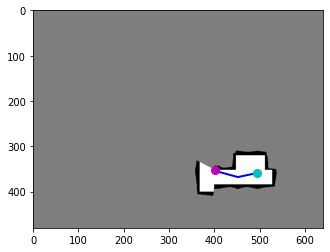

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8500, 0.5562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8500, 0.5562]), 'reward': tensor([-10.]), 'action': tensor([-0.4921, -0.3739])}
terminal True


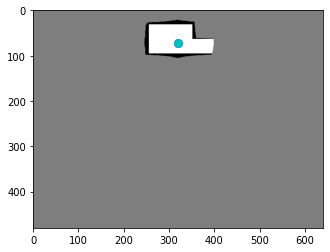

reward -9.666285708546638


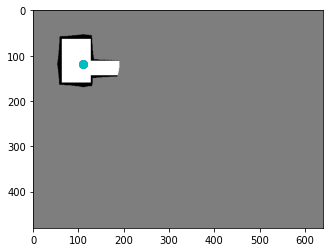

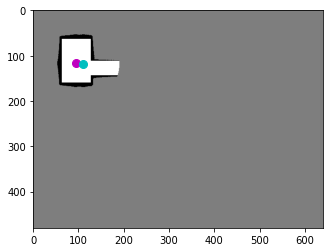

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1958, 0.1813]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2436, -0.0478])}
terminal False


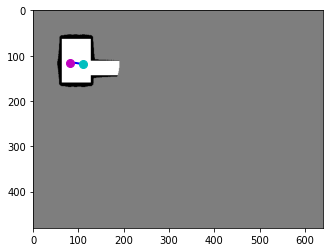

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1958, 0.1813]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1688, 0.1813]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1778, -0.0020])}
terminal False


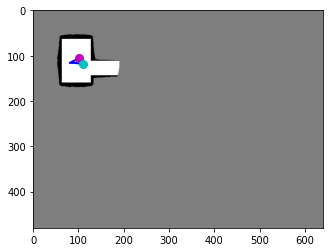

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1688, 0.1813]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2104, 0.1656]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2773, -0.1436])}
terminal False


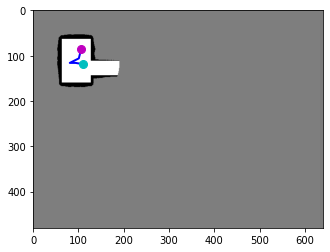

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2104, 0.1656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2208, 0.1344]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0639, -0.2863])}
terminal False


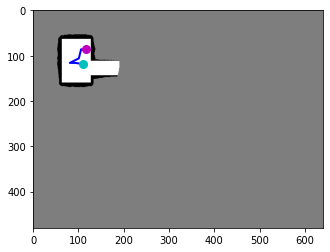

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2208, 0.1344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2417, 0.1344]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1421, -0.0044])}
terminal False


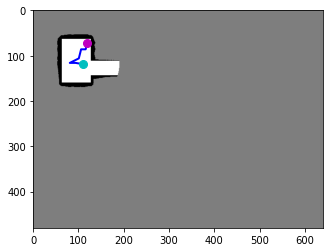

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2417, 0.1344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2500, 0.1125]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0577, -0.2003])}
terminal False


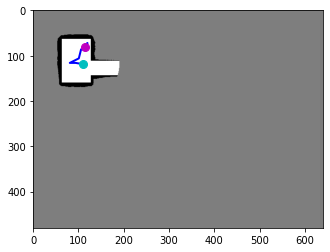

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2500, 0.1125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2375, 0.1250]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0345,  0.0508])}
terminal False


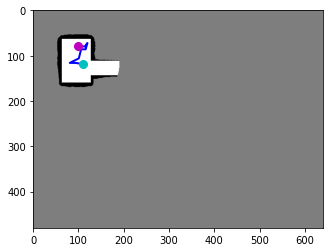

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2375, 0.1250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2062, 0.1219]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2070, -0.0284])}
terminal False


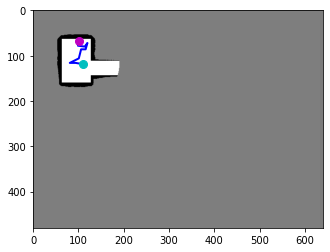

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2062, 0.1219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2104, 0.1063]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0323, -0.1441])}
terminal False


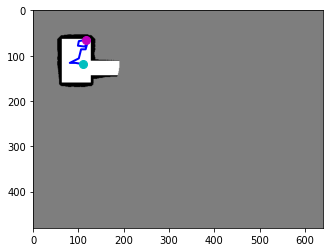

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2104, 0.1063]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2417, 0.1016]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2137, -0.0469])}
terminal False


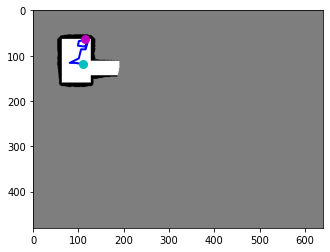

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2417, 0.1016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2417, 0.1016]), 'reward': tensor([-10.]), 'action': tensor([-0.0314, -0.0253])}
terminal True


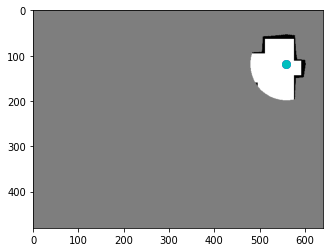

reward -18.00000011920929


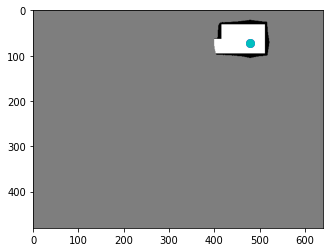

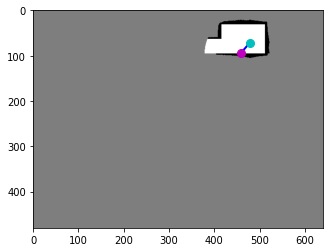

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9979, 0.1109]), 'reward': tensor([-10.]), 'action': tensor([-0.4378,  0.5286])}
terminal True


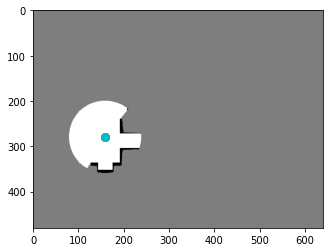

reward -10.0
step 300
step 400
avg iter time 0.7913269466161728


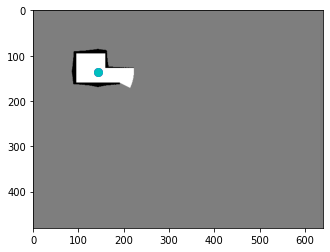

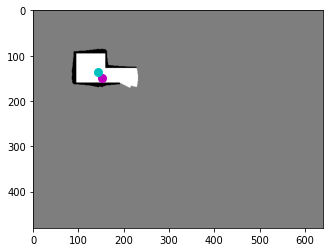

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3167, 0.2328]), 'reward': tensor([0.0579]), 'action': tensor([0.1341, 0.2009])}
terminal False


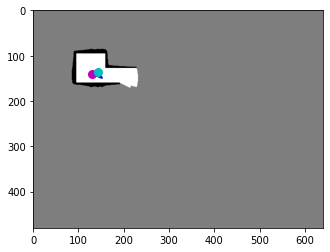

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3167, 0.2328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2688, 0.2188]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3275, -0.1304])}
terminal False


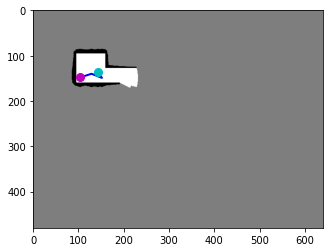

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2688, 0.2188]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2167, 0.2313]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3515,  0.1136])}
terminal False


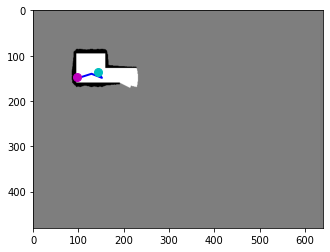

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2167, 0.2313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2167, 0.2313]), 'reward': tensor([-10.]), 'action': tensor([-0.1208, -0.0028])}
terminal True


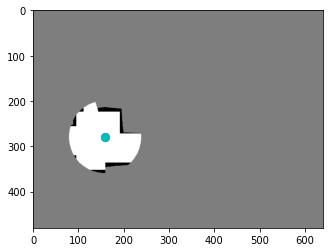

reward -11.542142879217863


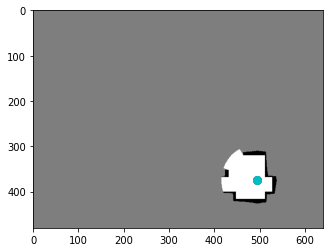

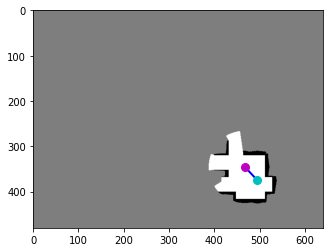

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9729, 0.5391]), 'reward': tensor([0.4020]), 'action': tensor([-0.3981, -0.4214])}
terminal False


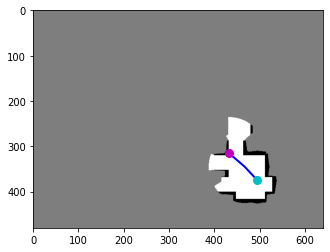

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9729, 0.5391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9729, 0.5391]), 'reward': tensor([-10.]), 'action': tensor([-0.6095, -0.5092])}
terminal True


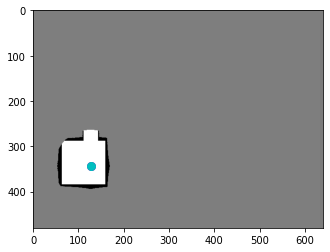

reward -9.59799998998642


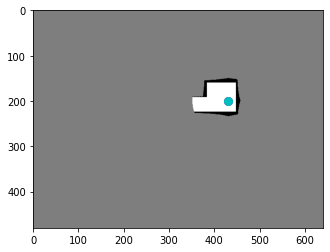

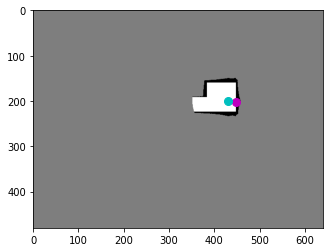

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.3109]), 'reward': tensor([-10.]), 'action': tensor([0.6291, 0.1270])}
terminal True


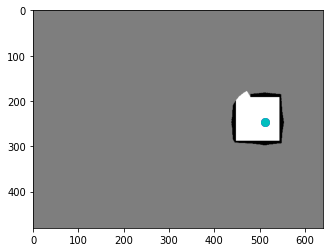

reward -10.0


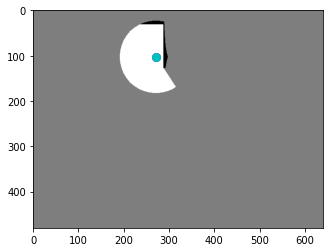

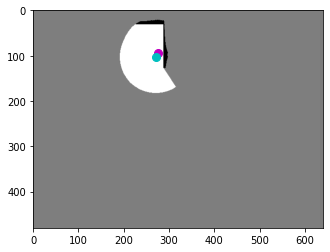

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.1469]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0091, -0.0234])}
terminal False


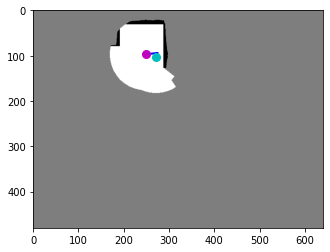

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5729, 0.1469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5188, 0.1516]), 'reward': tensor([0.3770]), 'action': tensor([-0.3665,  0.0368])}
terminal False


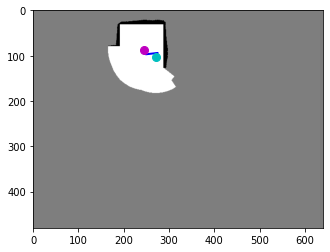

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5188, 0.1516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5104, 0.1359]), 'reward': tensor([0.0254]), 'action': tensor([-0.0537, -0.1479])}
terminal False


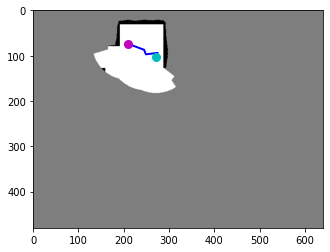

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5104, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4375, 0.1156]), 'reward': tensor([0.2009]), 'action': tensor([-0.4931, -0.1792])}
terminal False


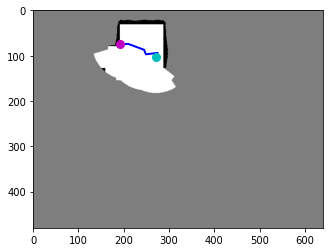

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4375, 0.1156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4375, 0.1156]), 'reward': tensor([-10.]), 'action': tensor([-0.4178,  0.0108])}
terminal True


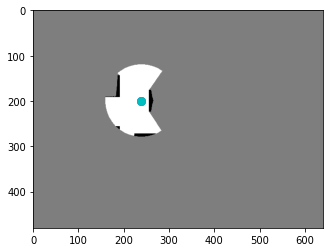

reward -10.196714289486408


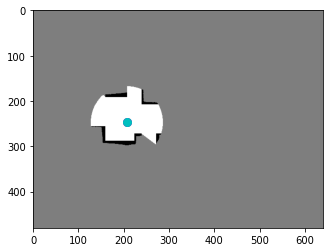

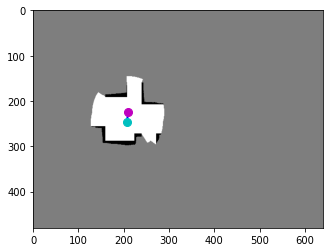

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4375, 0.3516]), 'reward': tensor([0.1929]), 'action': tensor([ 0.0463, -0.3120])}
terminal False


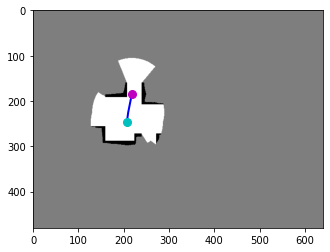

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4375, 0.3516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4542, 0.2891]), 'reward': tensor([0.3813]), 'action': tensor([ 0.1163, -0.5677])}
terminal False


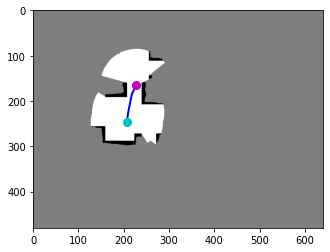

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4542, 0.2891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4750, 0.2578]), 'reward': tensor([0.5163]), 'action': tensor([ 0.1356, -0.2818])}
terminal False


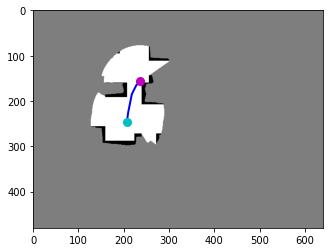

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4750, 0.2578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4917, 0.2453]), 'reward': tensor([0.1389]), 'action': tensor([ 0.1066, -0.1067])}
terminal False


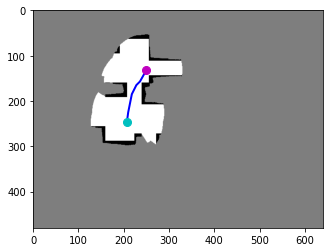

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4917, 0.2453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5208, 0.2062]), 'reward': tensor([0.3707]), 'action': tensor([ 0.1959, -0.3474])}
terminal False


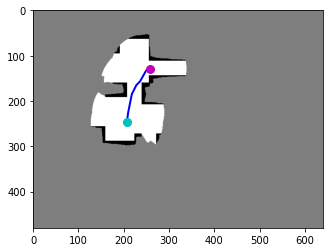

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5208, 0.2062]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5396, 0.2016]), 'reward': tensor([0.0417]), 'action': tensor([ 0.0634, -0.0215])}
terminal False


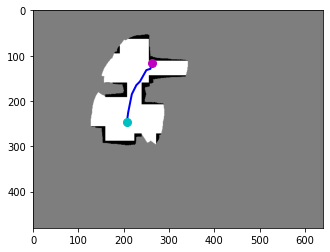

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5396, 0.2016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5458, 0.1828]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0437, -0.1689])}
terminal False


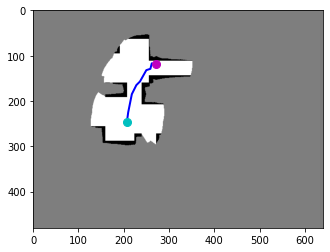

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5458, 0.1828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5667, 0.1859]), 'reward': tensor([0.0469]), 'action': tensor([0.1218, 0.0304])}
terminal False


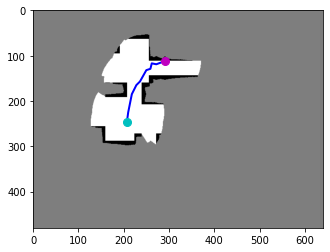

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5667, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5667, 0.1859]), 'reward': tensor([-10.]), 'action': tensor([ 0.3472, -0.1405])}
terminal True


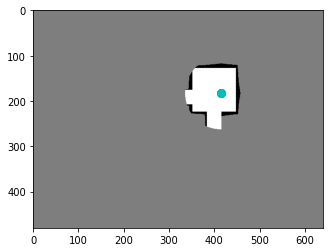

reward -9.111428573727608
step 400
step 500
avg iter time 0.790693437576294


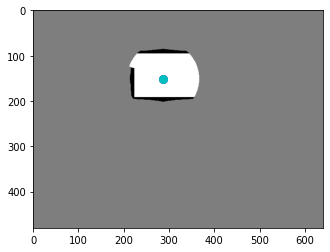

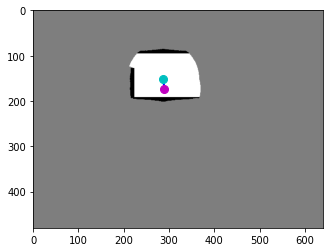

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5979, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6042, 0.2703]), 'reward': tensor([0.0326]), 'action': tensor([0.0457, 0.3094])}
terminal False


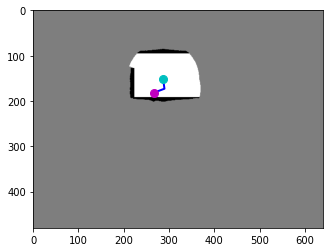

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6042, 0.2703]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5542, 0.2844]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3409,  0.1333])}
terminal False


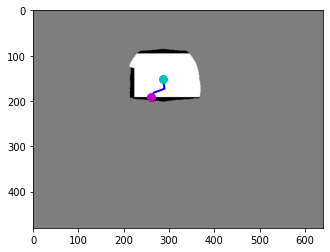

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5542, 0.2844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5542, 0.2844]), 'reward': tensor([-10.]), 'action': tensor([-0.1722,  0.3061])}
terminal True


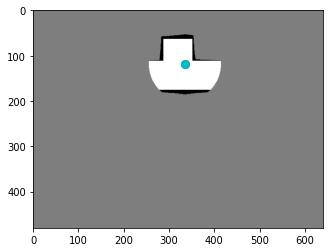

reward -10.76742858439684


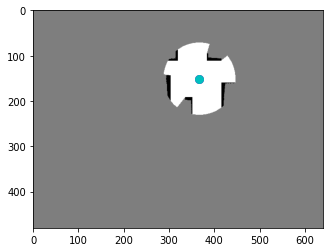

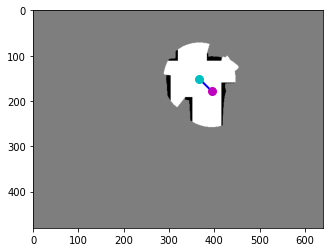

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8208, 0.2781]), 'reward': tensor([0.2839]), 'action': tensor([0.3822, 0.3841])}
terminal False


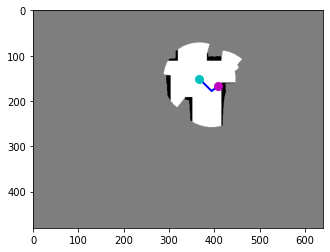

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8208, 0.2781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8500, 0.2625]), 'reward': tensor([0.0887]), 'action': tensor([ 0.2041, -0.1408])}
terminal False


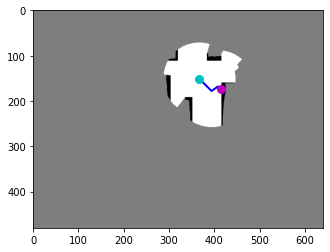

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8500, 0.2625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8500, 0.2625]), 'reward': tensor([-10.]), 'action': tensor([0.3812, 0.2645])}
terminal True


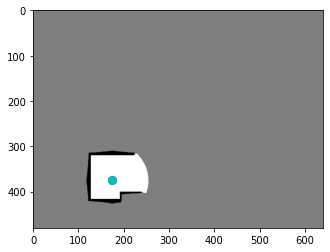

reward -9.627428576350212


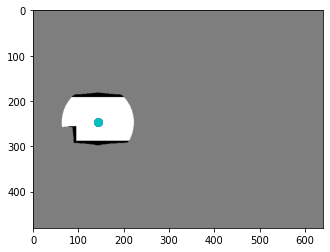

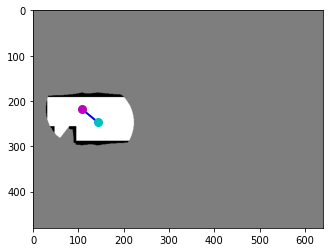

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2250, 0.3406]), 'reward': tensor([0.4117]), 'action': tensor([-0.4942, -0.4044])}
terminal False


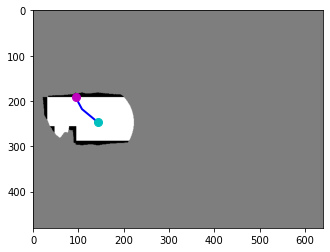

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2250, 0.3406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2250, 0.3406]), 'reward': tensor([-10.]), 'action': tensor([-0.4163, -0.7488])}
terminal True


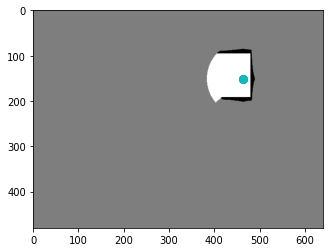

reward -9.588285714387894


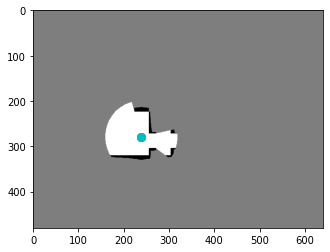

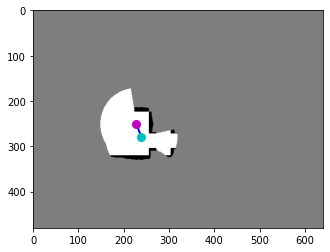

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4750, 0.3922]), 'reward': tensor([0.4074]), 'action': tensor([-0.1531, -0.3980])}
terminal False


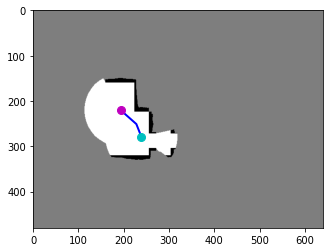

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4750, 0.3922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4021, 0.3438]), 'reward': tensor([0.8411]), 'action': tensor([-0.4908, -0.4417])}
terminal False


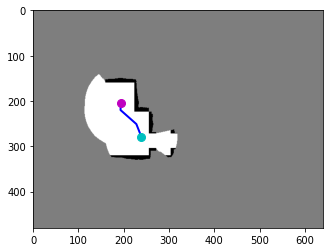

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4021, 0.3438]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4042, 0.3187]), 'reward': tensor([0.0719]), 'action': tensor([ 0.0168, -0.2271])}
terminal False


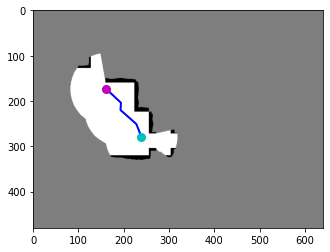

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4042, 0.3187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3375, 0.2719]), 'reward': tensor([0.6604]), 'action': tensor([-0.4535, -0.4238])}
terminal False


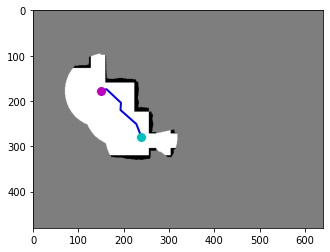

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3375, 0.2719]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3125, 0.2781]), 'reward': tensor([0.2594]), 'action': tensor([-0.1691,  0.0510])}
terminal False


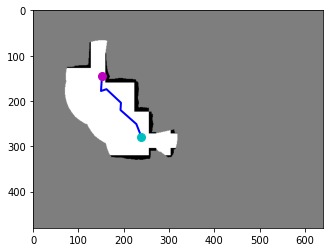

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3125, 0.2781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3167, 0.2281]), 'reward': tensor([0.1771]), 'action': tensor([ 0.0318, -0.4569])}
terminal False


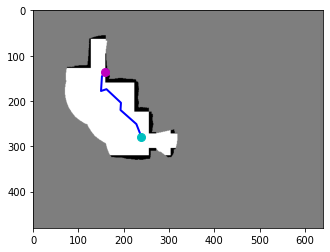

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3167, 0.2281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3167, 0.2281]), 'reward': tensor([-10.]), 'action': tensor([ 0.1326, -0.1878])}
terminal True


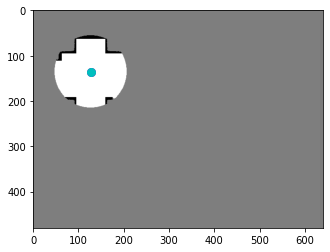

reward -7.582571461796761


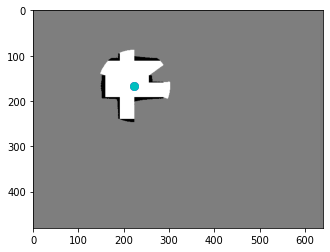

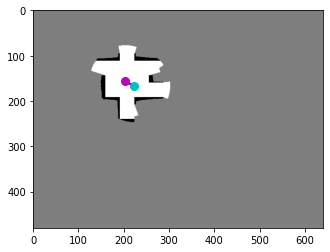

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4250, 0.2453]), 'reward': tensor([0.1833]), 'action': tensor([-0.2730, -0.1435])}
terminal False


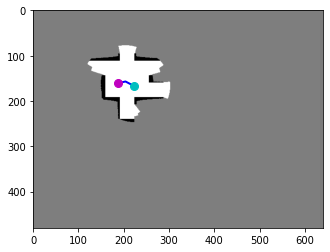

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4250, 0.2453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3896, 0.2516]), 'reward': tensor([0.0331]), 'action': tensor([-0.2399,  0.0509])}
terminal False


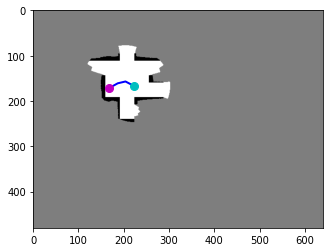

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3896, 0.2516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3479, 0.2688]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2804,  0.1580])}
terminal False


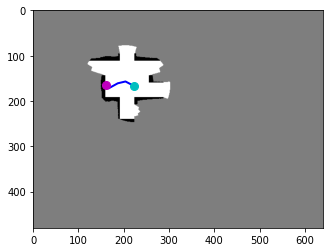

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3479, 0.2688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3479, 0.2688]), 'reward': tensor([-10.]), 'action': tensor([-0.2680, -0.2363])}
terminal True


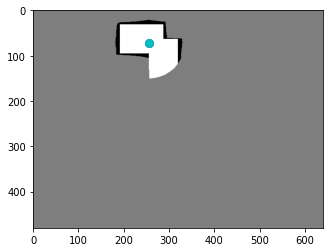

reward -10.583571441471577
step 500
CRITIC


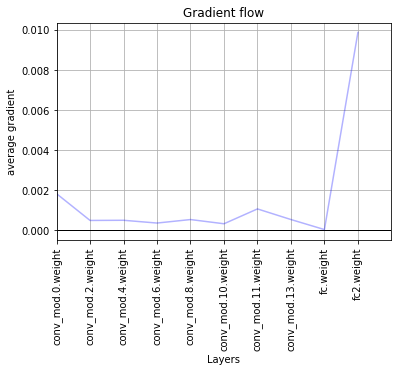

ACTOR


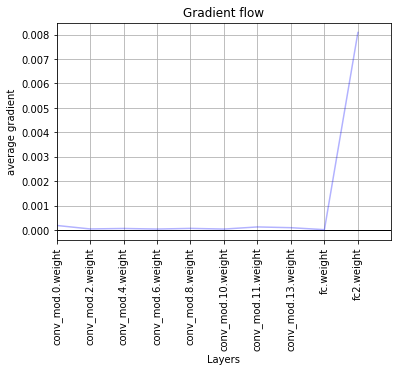

step 600
avg iter time 0.7863073114554088


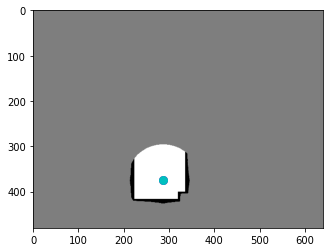

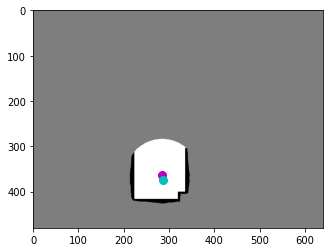

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5979, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5938, 0.5672]), 'reward': tensor([0.1960]), 'action': tensor([-0.0289, -0.1645])}
terminal False


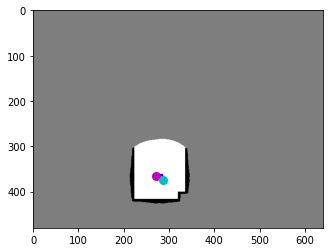

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5938, 0.5672]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.5703]), 'reward': tensor([0.0286]), 'action': tensor([-0.1961,  0.0301])}
terminal False


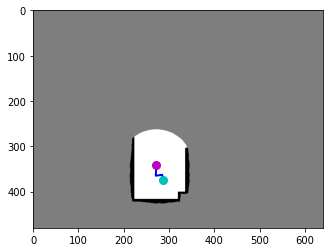

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.5703]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5667, 0.5344]), 'reward': tensor([0.3067]), 'action': tensor([ 0.0083, -0.3256])}
terminal False


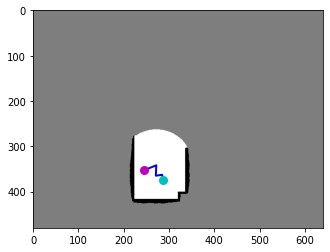

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5667, 0.5344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5104, 0.5516]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3814,  0.1588])}
terminal False


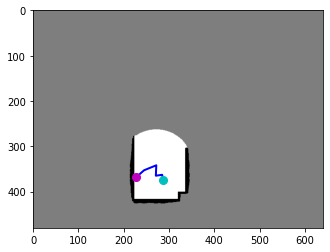

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5104, 0.5516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4750, 0.5750]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2431,  0.2185])}
terminal False


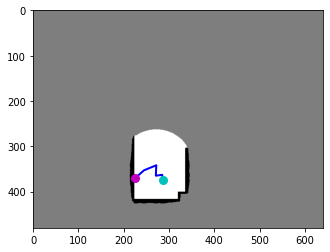

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4750, 0.5750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4750, 0.5750]), 'reward': tensor([-10.]), 'action': tensor([-0.2838,  0.0894])}
terminal True


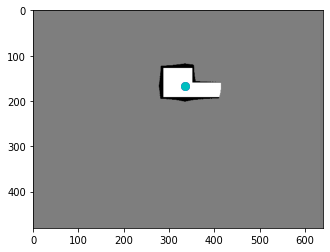

reward -11.068714303895831


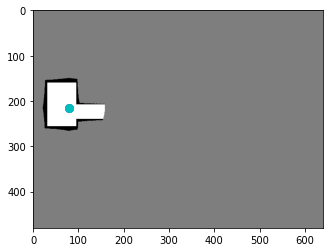

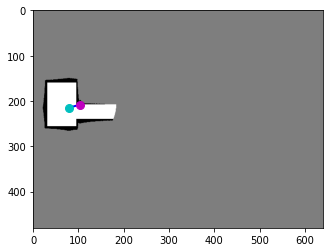

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1646, 0.3359]), 'reward': tensor([-10.]), 'action': tensor([ 0.5141, -0.1563])}
terminal True


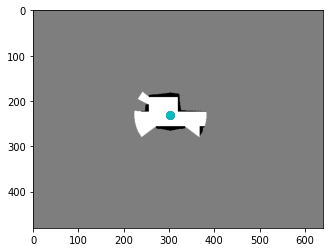

reward -10.0


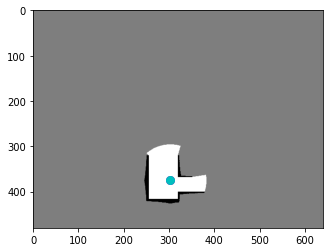

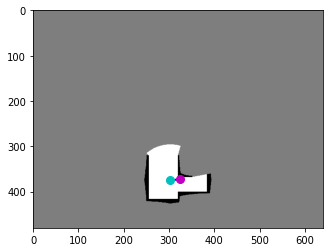

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6750, 0.5828]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2974, -0.0307])}
terminal False


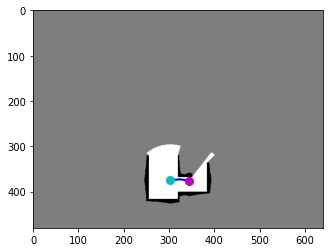

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6750, 0.5828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7188, 0.5875]), 'reward': tensor([0.1077]), 'action': tensor([0.2952, 0.0487])}
terminal False


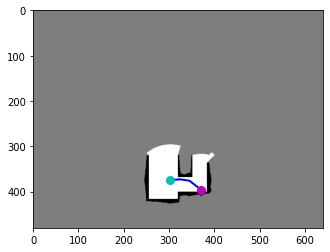

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7188, 0.5875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7729, 0.6187]), 'reward': tensor([0.1343]), 'action': tensor([0.3718, 0.2819])}
terminal False


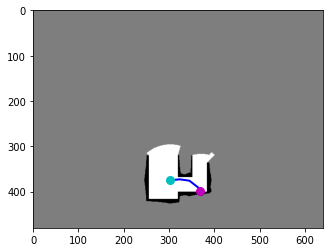

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7729, 0.6187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7729, 0.6187]), 'reward': tensor([-10.]), 'action': tensor([-0.0749,  0.1526])}
terminal True


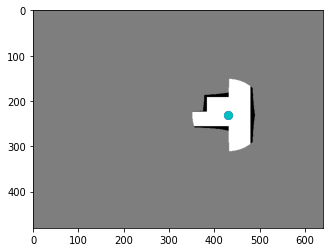

reward -10.55800000578165


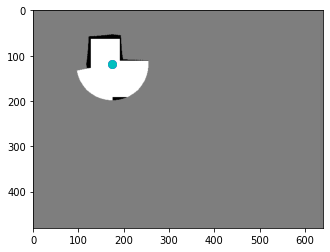

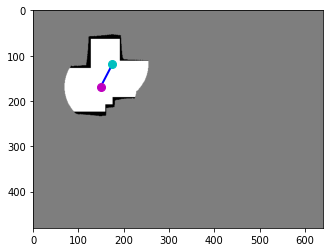

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3104, 0.2641]), 'reward': tensor([0.7501]), 'action': tensor([-0.3677,  0.7132])}
terminal False


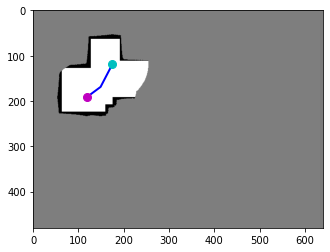

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3104, 0.2641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2458, 0.3000]), 'reward': tensor([0.1526]), 'action': tensor([-0.4411,  0.3220])}
terminal False


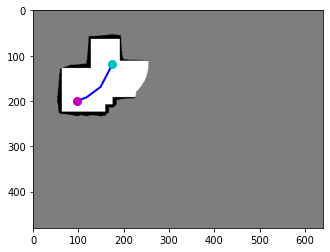

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2458, 0.3000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2021, 0.3125]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2915,  0.1102])}
terminal False


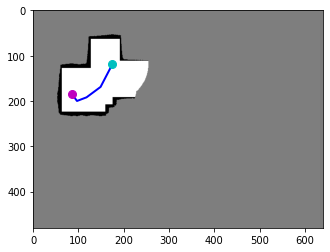

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2021, 0.3125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1771, 0.2875]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1735, -0.2193])}
terminal False


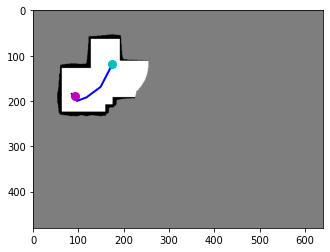

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1771, 0.2875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1937, 0.2969]), 'reward': tensor([-0.8000]), 'action': tensor([0.0239, 0.0194])}
terminal False


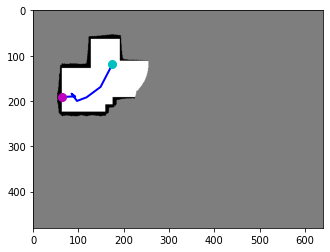

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1937, 0.2969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1937, 0.2969]), 'reward': tensor([-10.]), 'action': tensor([-0.4251,  0.0208])}
terminal True


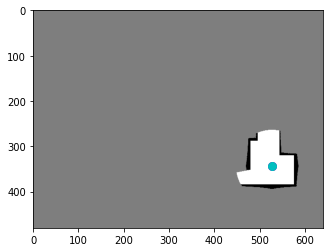

reward -11.49728573858738


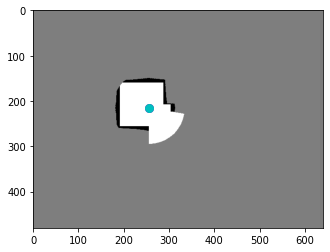

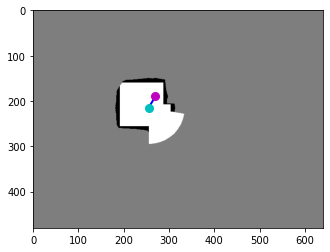

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5625, 0.2969]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2189, -0.3528])}
terminal False


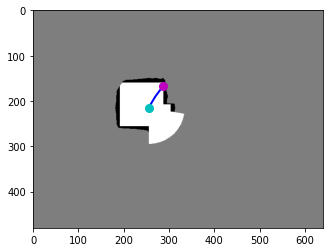

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5625, 0.2969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5625, 0.2969]), 'reward': tensor([-10.]), 'action': tensor([ 0.3709, -0.4835])}
terminal True


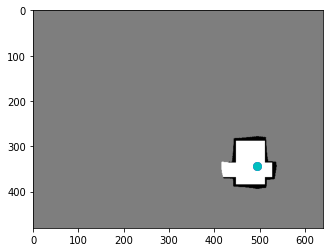

reward -10.800000011920929
step 600
step 700
avg iter time 0.7868315253938948


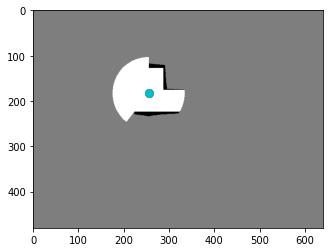

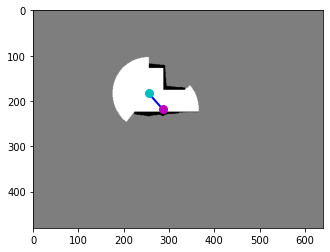

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5958, 0.3406]), 'reward': tensor([0.2226]), 'action': tensor([0.4346, 0.4941])}
terminal False


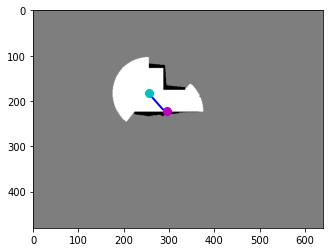

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5958, 0.3406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5958, 0.3406]), 'reward': tensor([-10.]), 'action': tensor([0.6936, 0.3870])}
terminal True


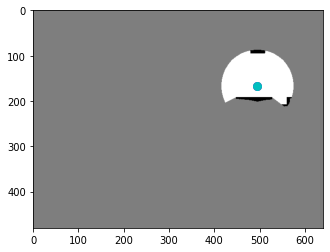

reward -9.777428567409515


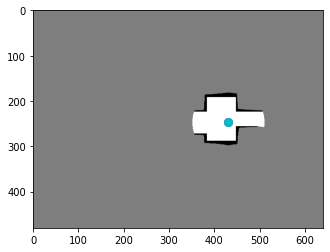

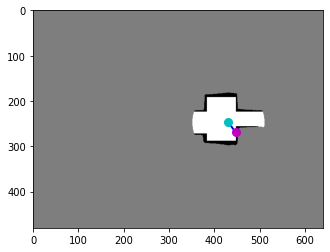

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.3859]), 'reward': tensor([-10.]), 'action': tensor([0.4775, 0.6548])}
terminal True


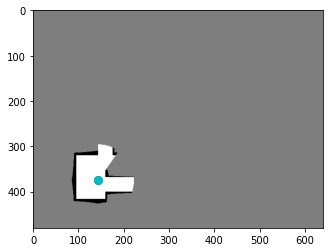

reward -10.0


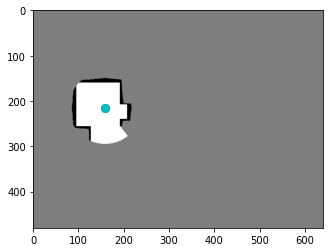

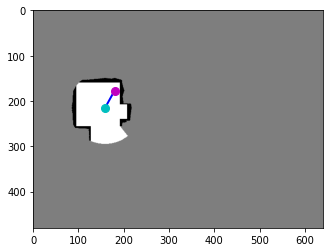

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3750, 0.2766]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2962, -0.5341])}
terminal False


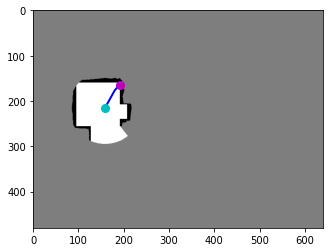

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3750, 0.2766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3750, 0.2766]), 'reward': tensor([-10.]), 'action': tensor([ 0.4880, -0.5281])}
terminal True


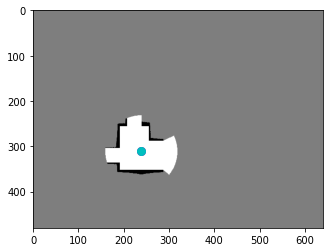

reward -10.800000011920929


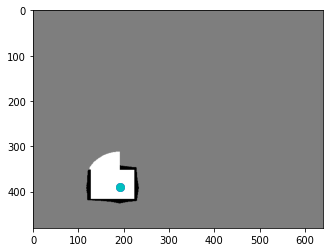

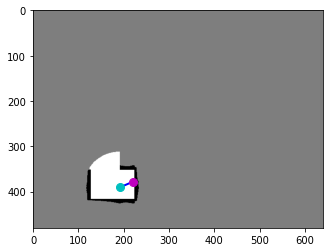

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4604, 0.5906]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.4238, -0.1859])}
terminal False


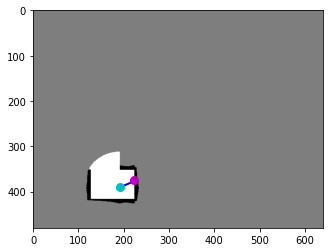

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4604, 0.5906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4604, 0.5906]), 'reward': tensor([-10.]), 'action': tensor([ 0.1443, -0.1514])}
terminal True


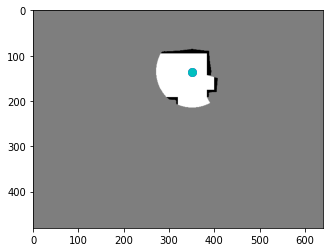

reward -10.800000011920929


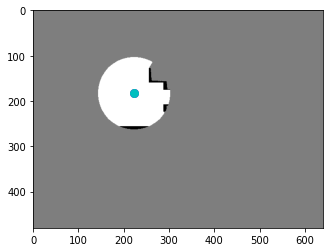

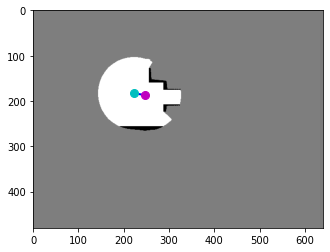

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5146, 0.2922]), 'reward': tensor([0.2051]), 'action': tensor([0.3463, 0.0586])}
terminal False


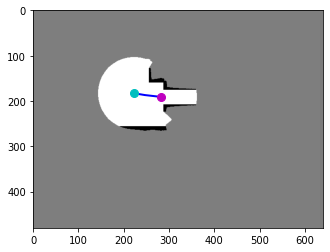

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5146, 0.2922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5875, 0.2984]), 'reward': tensor([0.1620]), 'action': tensor([0.4990, 0.0522])}
terminal False


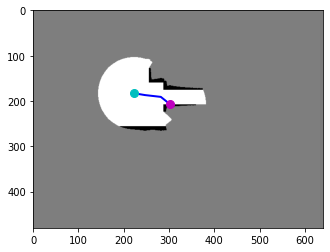

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5875, 0.2984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5875, 0.2984]), 'reward': tensor([-10.]), 'action': tensor([0.3034, 0.2395])}
terminal True


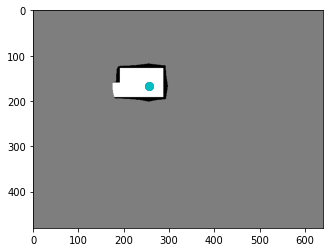

reward -9.632857143878937
step 700
step 800
avg iter time 0.785791200697422


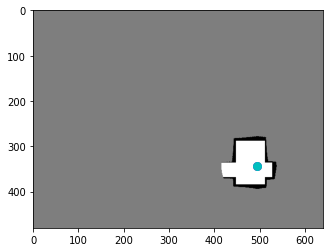

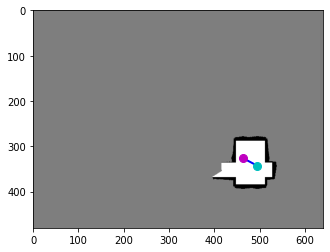

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9646, 0.5094]), 'reward': tensor([0.0234]), 'action': tensor([-0.4539, -0.2451])}
terminal False


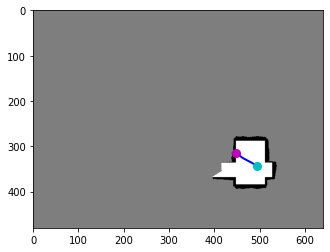

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.5094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9646, 0.5094]), 'reward': tensor([-10.]), 'action': tensor([-0.4886, -0.3510])}
terminal True


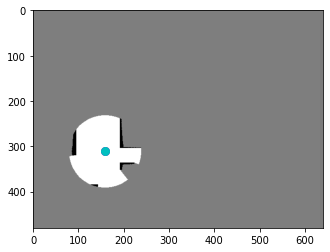

reward -9.9765714276582


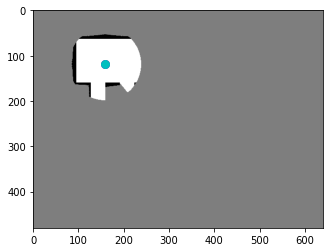

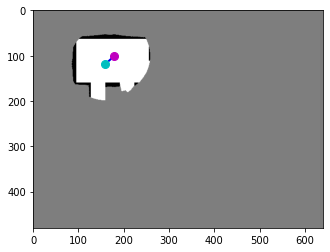

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3729, 0.1578]), 'reward': tensor([0.2713]), 'action': tensor([ 0.2895, -0.2521])}
terminal False


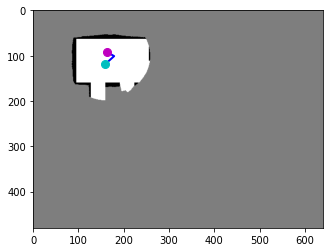

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3729, 0.1578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3396, 0.1437]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2315, -0.1233])}
terminal False


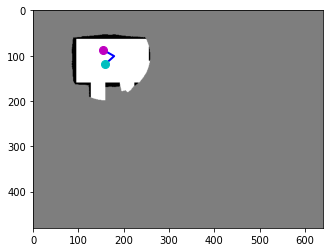

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3396, 0.1437]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3229, 0.1359]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0993, -0.0637])}
terminal False


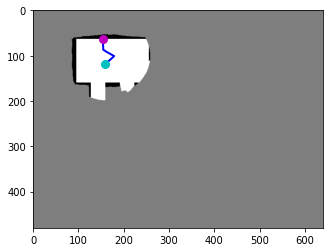

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3229, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3229, 0.1359]), 'reward': tensor([-10.]), 'action': tensor([-0.0132, -0.4639])}
terminal True


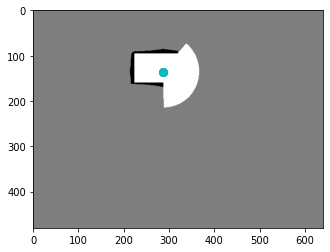

reward -11.328714311122894


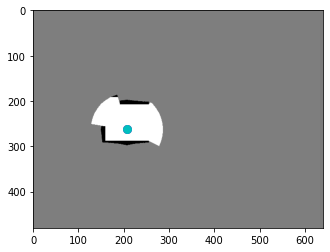

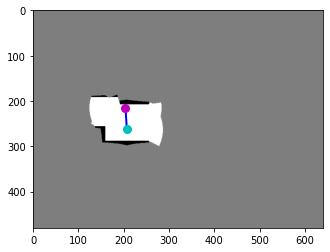

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4250, 0.3359]), 'reward': tensor([0.1840]), 'action': tensor([-0.0493, -0.6739])}
terminal False


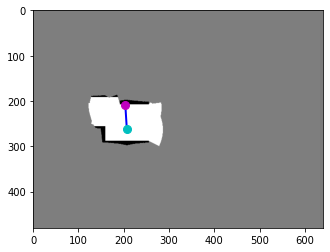

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4250, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4250, 0.3359]), 'reward': tensor([-10.]), 'action': tensor([-0.1295, -0.5044])}
terminal True


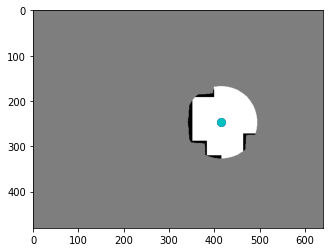

reward -9.815999999642372


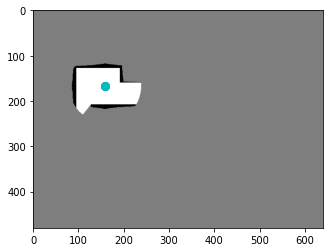

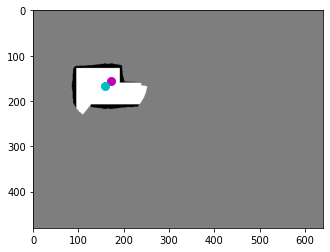

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3604, 0.2453]), 'reward': tensor([0.0619]), 'action': tensor([ 0.1959, -0.1449])}
terminal False


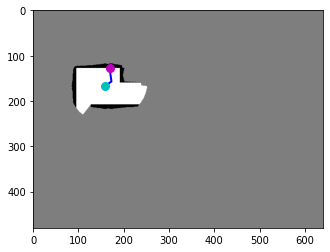

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3604, 0.2453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3521, 0.2000]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0623, -0.4064])}
terminal False


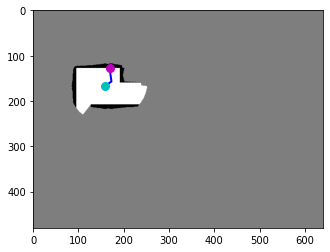

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3521, 0.2000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3521, 0.2000]), 'reward': tensor([-10.]), 'action': tensor([-0.2169, -0.4382])}
terminal True


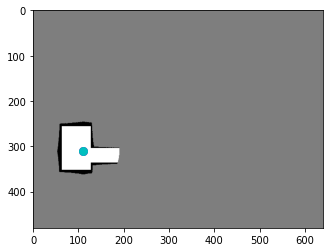

reward -10.738142870366573


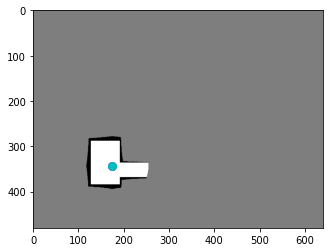

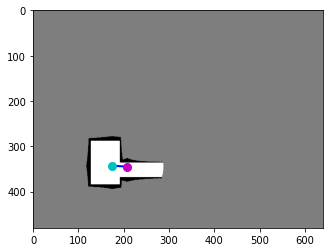

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4333, 0.5391]), 'reward': tensor([0.1517]), 'action': tensor([0.4617, 0.0299])}
terminal False


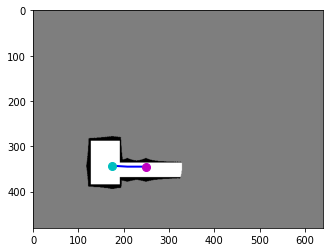

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4333, 0.5391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5188, 0.5391]), 'reward': tensor([0.1874]), 'action': tensor([ 5.8007e-01, -2.7402e-04])}
terminal False


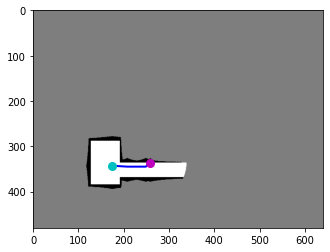

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5188, 0.5391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5188, 0.5391]), 'reward': tensor([-10.]), 'action': tensor([ 0.4290, -0.3947])}
terminal True


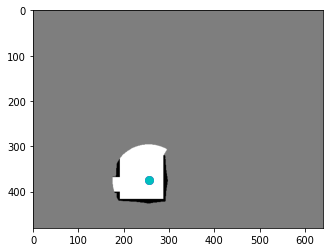

reward -9.660857141017914
step 800
step 900
avg iter time 0.7888399934768677


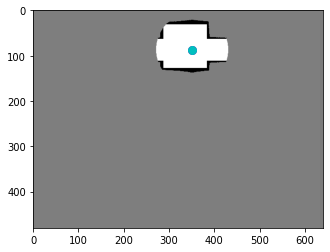

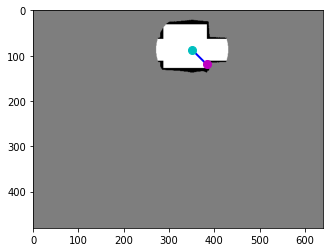

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.1859]), 'reward': tensor([-0.8000]), 'action': tensor([0.4458, 0.4505])}
terminal False


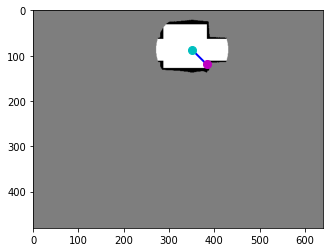

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.1859]), 'reward': tensor([-10.]), 'action': tensor([0.2923, 0.2545])}
terminal True


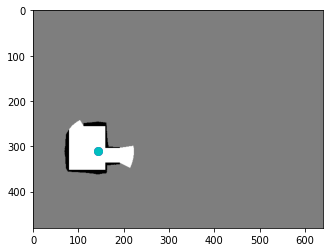

reward -10.800000011920929


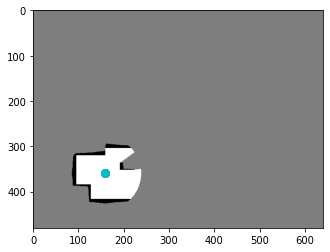

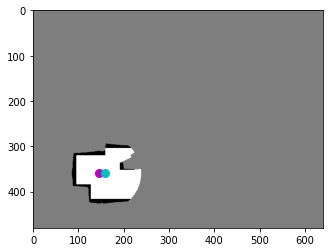

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3021, 0.5594]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2022, -0.0082])}
terminal False


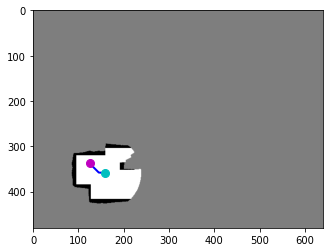

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3021, 0.5594]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2604, 0.5281]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2830, -0.2774])}
terminal False


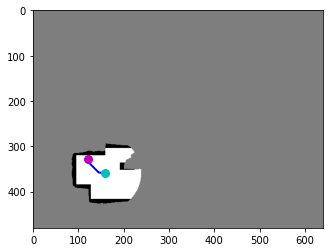

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2604, 0.5281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2542, 0.5125]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0342, -0.1066])}
terminal False


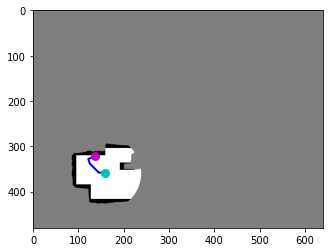

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2542, 0.5125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2854, 0.5031]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2094, -0.0890])}
terminal False


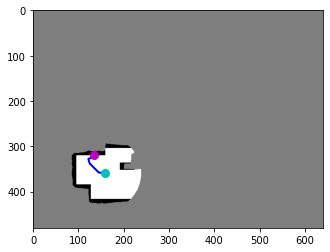

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2854, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2854, 0.5031]), 'reward': tensor([-10.]), 'action': tensor([-0.0159, -0.0252])}
terminal True


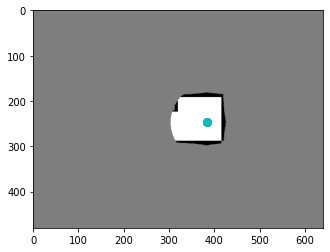

reward -13.200000047683716


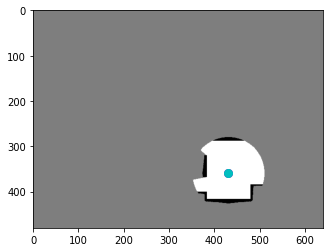

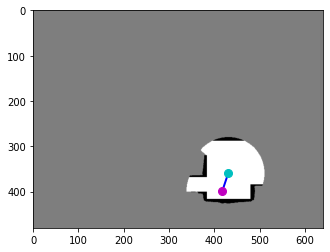

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8708, 0.6219]), 'reward': tensor([0.0839]), 'action': tensor([-0.1806,  0.5453])}
terminal False


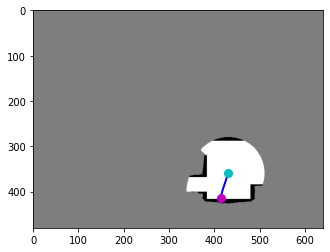

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8708, 0.6219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8708, 0.6219]), 'reward': tensor([-10.]), 'action': tensor([-0.1168,  0.4572])}
terminal True


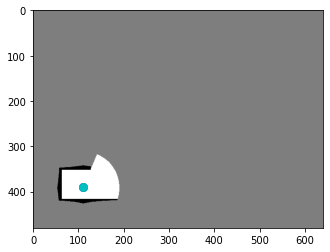

reward -9.916142858564854


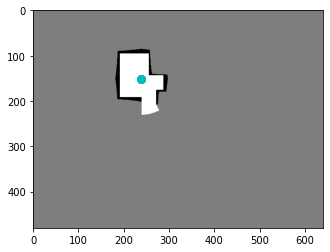

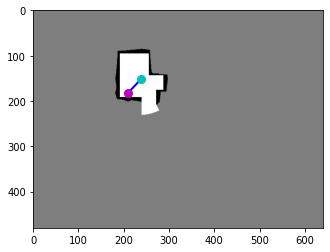

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4375, 0.2844]), 'reward': tensor([-0.8000]), 'action': tensor([-0.4151,  0.4331])}
terminal False


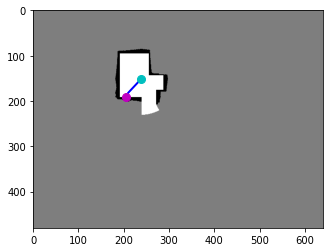

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4375, 0.2844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4375, 0.2844]), 'reward': tensor([-10.]), 'action': tensor([-0.2364,  0.4306])}
terminal True


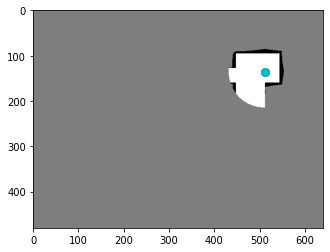

reward -10.800000011920929


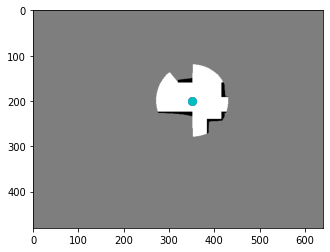

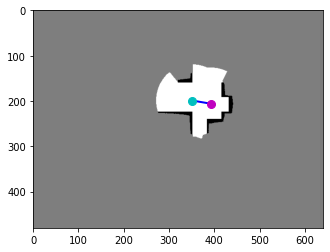

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8167, 0.3219]), 'reward': tensor([0.0899]), 'action': tensor([0.5731, 0.1049])}
terminal False


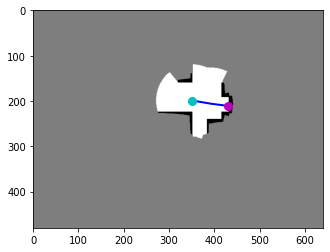

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8167, 0.3219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8167, 0.3219]), 'reward': tensor([-10.]), 'action': tensor([0.7340, 0.0912])}
terminal True


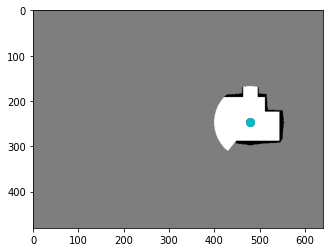

reward -9.910142853856087
step 900
step 1000
avg iter time 0.7845051517486572


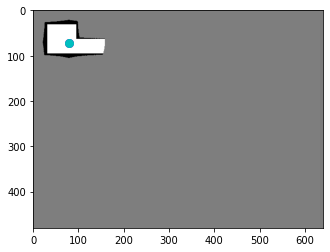

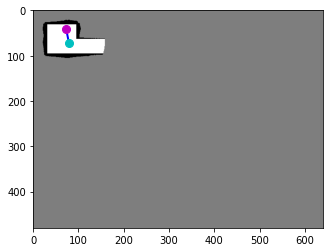

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1521, 0.0641]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0888, -0.4198])}
terminal False


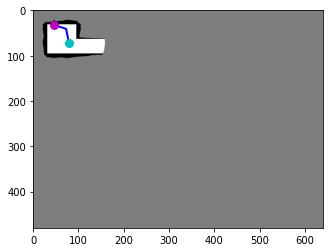

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1521, 0.0641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.0979, 0.0500]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3630, -0.1231])}
terminal False


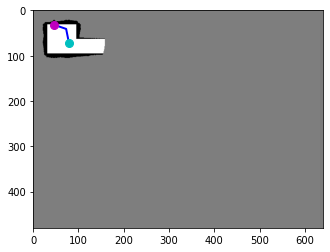

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.0979, 0.0500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.0979, 0.0500]), 'reward': tensor([-10.]), 'action': tensor([-0.4208, -0.3072])}
terminal True


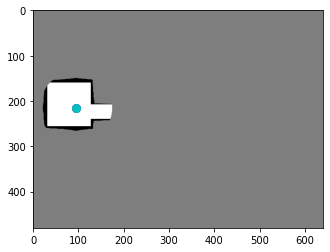

reward -11.600000023841858


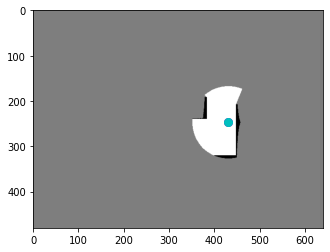

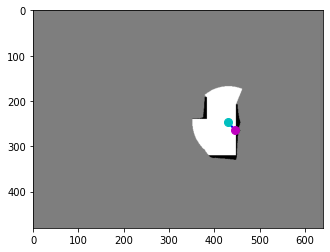

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9292, 0.4141]), 'reward': tensor([-0.8000]), 'action': tensor([0.2168, 0.2519])}
terminal False


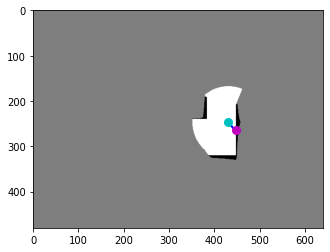

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9292, 0.4141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9292, 0.4141]), 'reward': tensor([-10.]), 'action': tensor([ 0.5664, -0.1043])}
terminal True


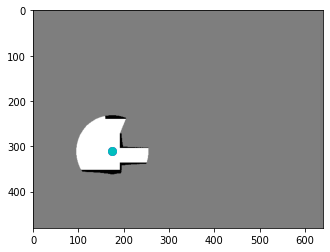

reward -10.800000011920929


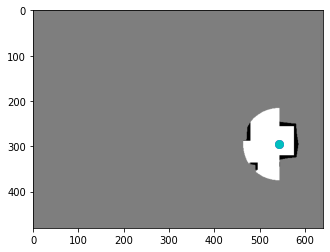

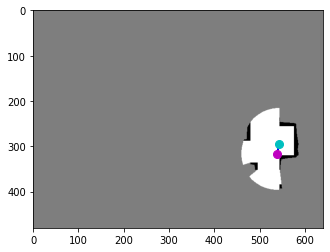

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1313, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1229, 0.4938]), 'reward': tensor([0.2511]), 'action': tensor([-0.0616,  0.2908])}
terminal False


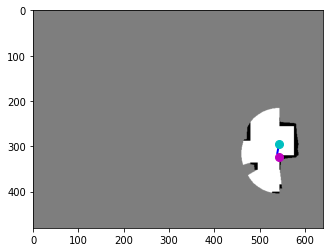

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1229, 0.4938]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1229, 0.4938]), 'reward': tensor([-10.]), 'action': tensor([0.2130, 0.3519])}
terminal True


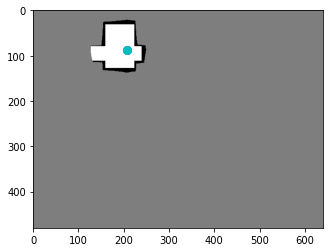

reward -9.748857140541077


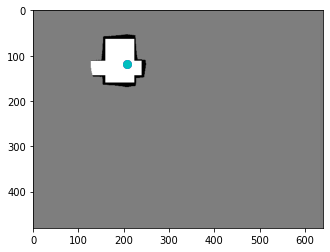

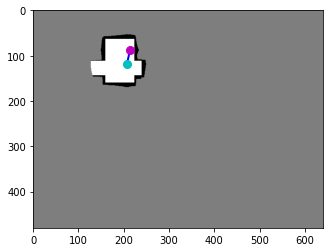

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4458, 0.1375]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1036, -0.4357])}
terminal False


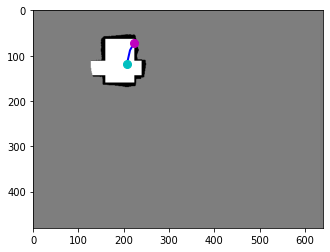

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4458, 0.1375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4458, 0.1375]), 'reward': tensor([-10.]), 'action': tensor([ 0.2064, -0.3555])}
terminal True


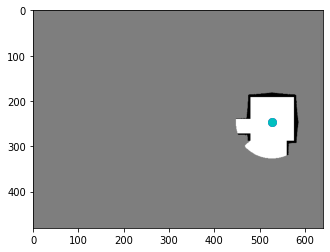

reward -10.800000011920929


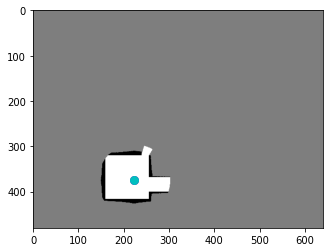

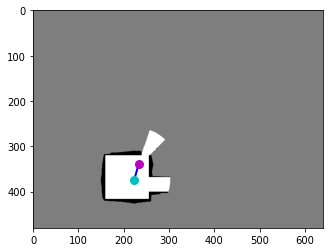

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4854, 0.5312]), 'reward': tensor([0.1709]), 'action': tensor([ 0.1439, -0.4983])}
terminal False


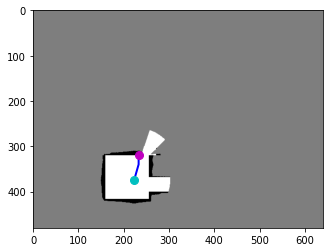

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4854, 0.5312]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4854, 0.5312]), 'reward': tensor([-10.]), 'action': tensor([ 0.0057, -0.3973])}
terminal True


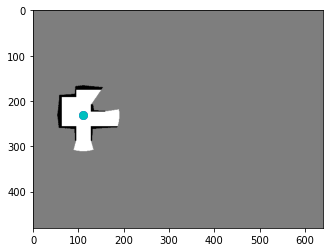

reward -9.829142853617668
step 1000
CRITIC


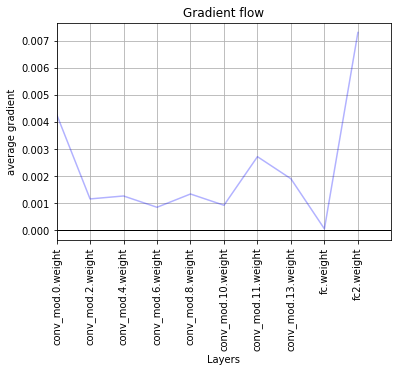

ACTOR


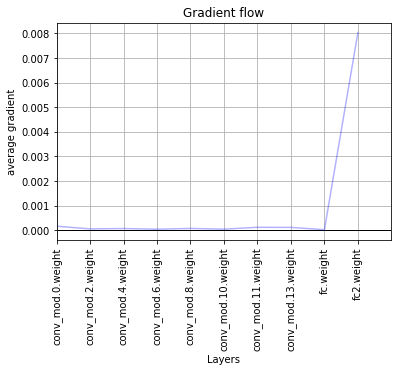

step 1100
avg iter time 0.7843630251017484


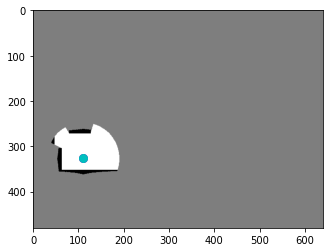

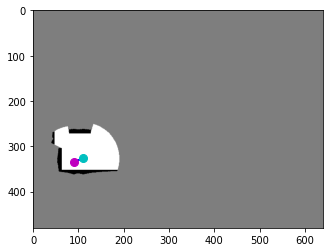

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1875, 0.5219]), 'reward': tensor([0.0269]), 'action': tensor([-0.2933,  0.0947])}
terminal False


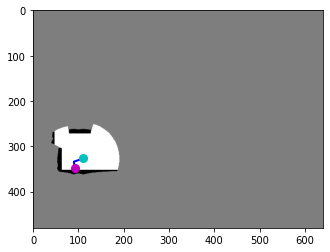

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1875, 0.5219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1917, 0.5437]), 'reward': tensor([-0.8000]), 'action': tensor([0.0234, 0.2036])}
terminal False


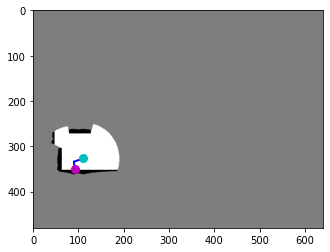

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1917, 0.5437]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1917, 0.5437]), 'reward': tensor([-10.]), 'action': tensor([0.0211, 0.1258])}
terminal True


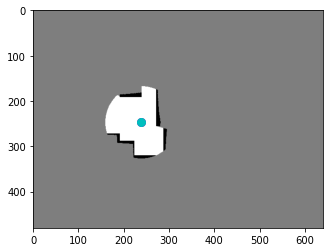

reward -10.77314286865294


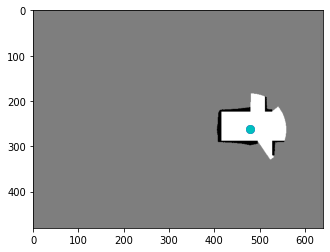

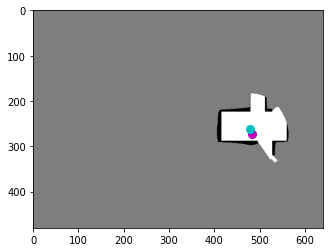

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0083, 0.4266]), 'reward': tensor([0.0296]), 'action': tensor([0.0679, 0.1363])}
terminal False


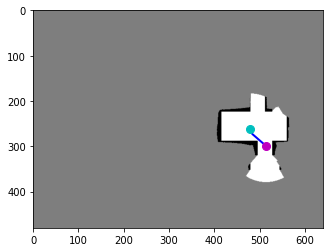

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0083, 0.4266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0708, 0.4672]), 'reward': tensor([0.5403]), 'action': tensor([0.4294, 0.3627])}
terminal False


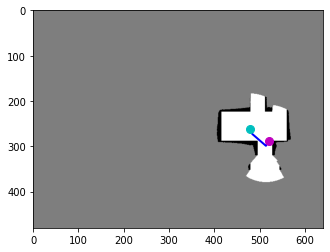

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0708, 0.4672]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0833, 0.4500]), 'reward': tensor([0.0380]), 'action': tensor([ 0.0877, -0.1621])}
terminal False


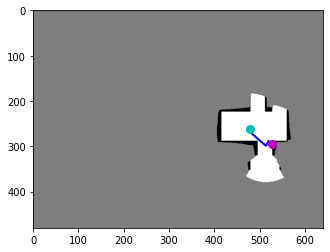

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0833, 0.4500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0833, 0.4500]), 'reward': tensor([-10.]), 'action': tensor([0.1686, 0.1751])}
terminal True


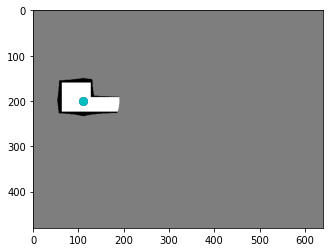

reward -9.392142865806818


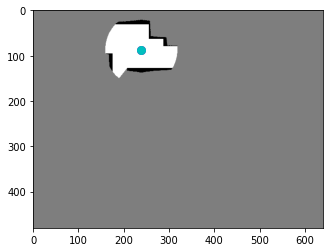

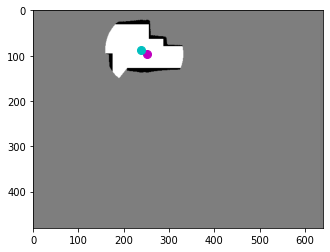

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5250, 0.1516]), 'reward': tensor([0.0993]), 'action': tensor([0.1864, 0.1381])}
terminal False


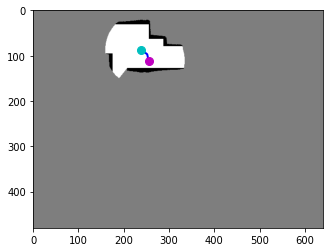

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5250, 0.1516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5312, 0.1734]), 'reward': tensor([0.0207]), 'action': tensor([0.0444, 0.1956])}
terminal False


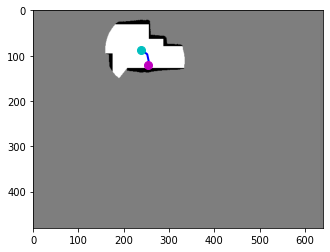

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.1734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5292, 0.1891]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0071,  0.0676])}
terminal False


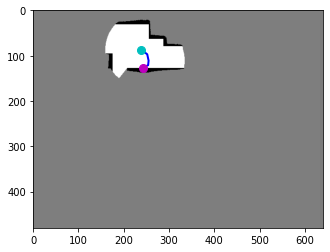

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5292, 0.1891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5292, 0.1891]), 'reward': tensor([-10.]), 'action': tensor([-0.2576,  0.1450])}
terminal True


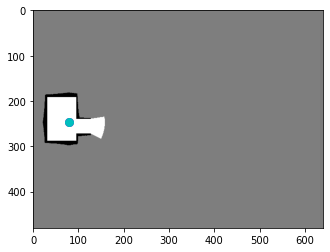

reward -10.680000012740493


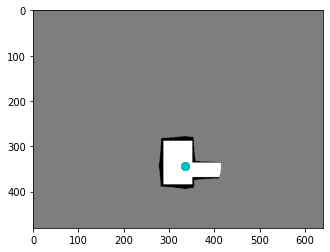

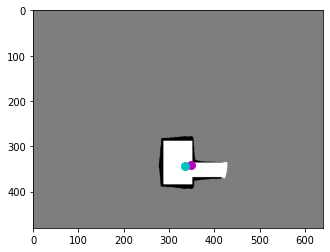

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7271, 0.5328]), 'reward': tensor([0.0659]), 'action': tensor([ 0.1973, -0.0308])}
terminal False


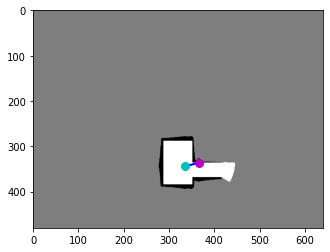

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7271, 0.5328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7625, 0.5250]), 'reward': tensor([0.0906]), 'action': tensor([ 0.2417, -0.0730])}
terminal False


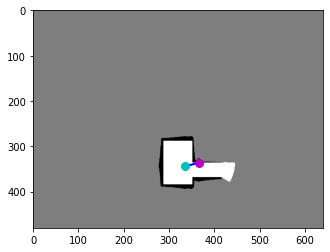

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7625, 0.5250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7625, 0.5250]), 'reward': tensor([-10.]), 'action': tensor([ 0.3965, -0.4245])}
terminal True


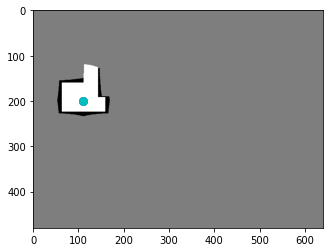

reward -9.843571431934834


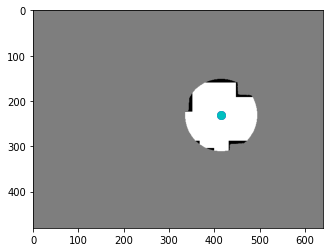

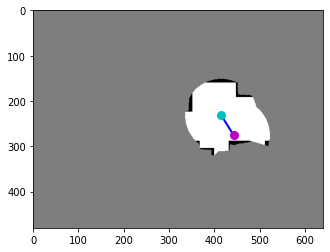

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9229, 0.4313]), 'reward': tensor([0.3120]), 'action': tensor([0.4025, 0.6307])}
terminal False


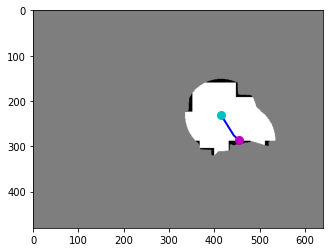

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9229, 0.4313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9229, 0.4313]), 'reward': tensor([-10.]), 'action': tensor([0.6632, 0.6352])}
terminal True


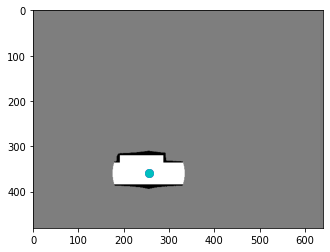

reward -9.687999993562698
step 1100
step 1200
avg iter time 0.788590876062711


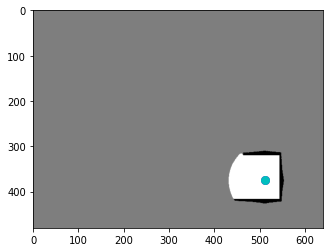

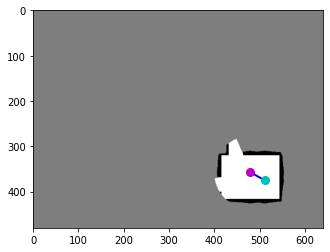

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9979, 0.5578]), 'reward': tensor([0.4493]), 'action': tensor([-0.4494, -0.2486])}
terminal False


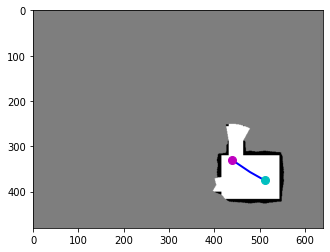

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.5578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9146, 0.5156]), 'reward': tensor([0.2566]), 'action': tensor([-0.5617, -0.3879])}
terminal False


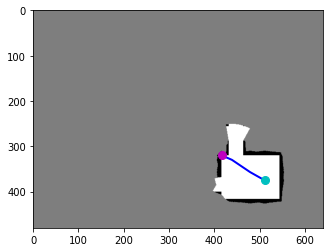

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9146, 0.5156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9146, 0.5156]), 'reward': tensor([-10.]), 'action': tensor([-0.6726, -0.3180])}
terminal True


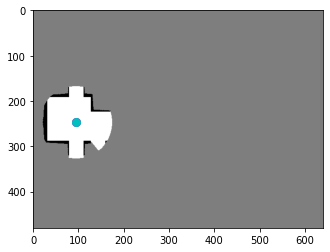

reward -9.294142842292786


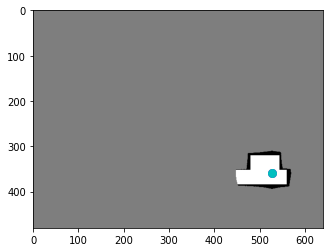

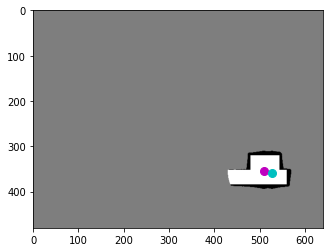

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0604, 0.5531]), 'reward': tensor([0.0790]), 'action': tensor([-0.2558, -0.0761])}
terminal False


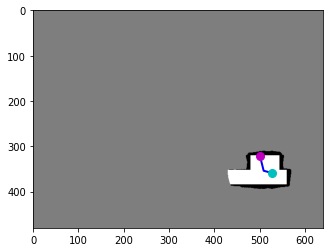

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0604, 0.5531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0438, 0.5031]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1094, -0.4482])}
terminal False


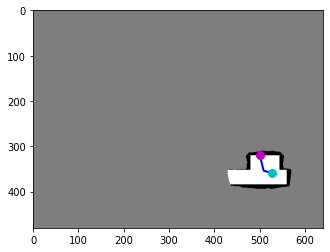

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0438, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0438, 0.5031]), 'reward': tensor([-10.]), 'action': tensor([-0.0850, -0.3877])}
terminal True


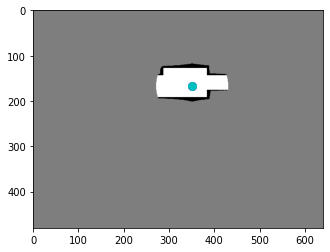

reward -10.721000008285046


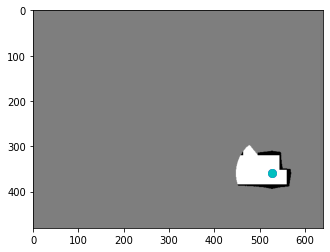

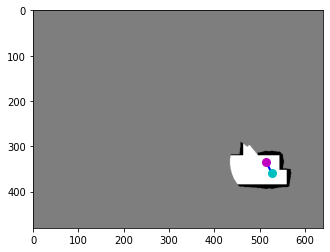

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0708, 0.5219]), 'reward': tensor([0.1131]), 'action': tensor([-0.1891, -0.3474])}
terminal False


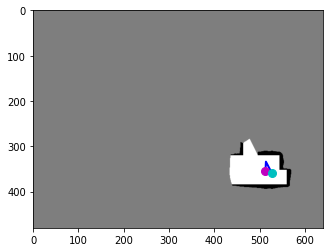

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0708, 0.5219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0688, 0.5547]), 'reward': tensor([0.0749]), 'action': tensor([-0.0155,  0.2976])}
terminal False


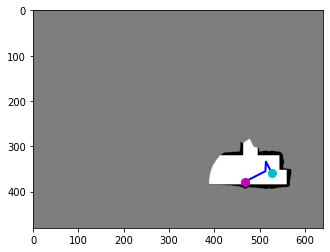

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0688, 0.5547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9750, 0.5906]), 'reward': tensor([0.3683]), 'action': tensor([-0.6297,  0.3217])}
terminal False


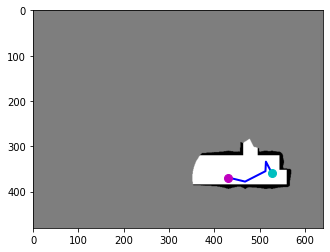

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9750, 0.5906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.5766]), 'reward': tensor([0.3639]), 'action': tensor([-0.5191, -0.1280])}
terminal False


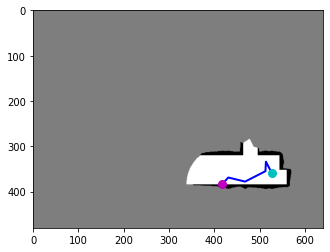

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.5766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.5766]), 'reward': tensor([-10.]), 'action': tensor([-0.3858,  0.4288])}
terminal True


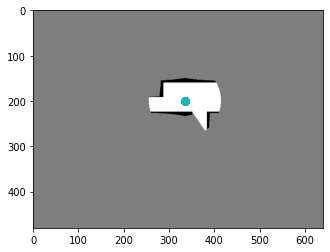

reward -9.079857133328915


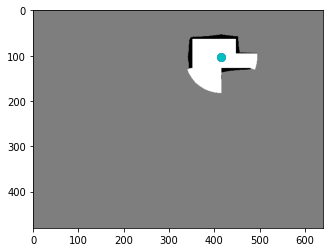

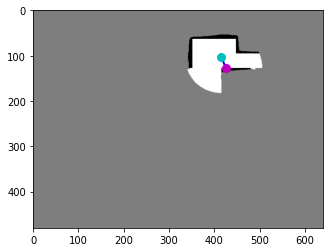

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8646, 0.1609]), 'reward': tensor([-10.]), 'action': tensor([0.3410, 0.7316])}
terminal True


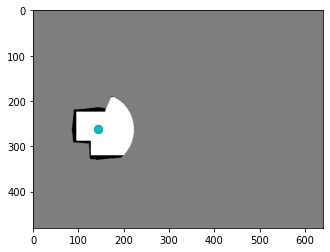

reward -10.0


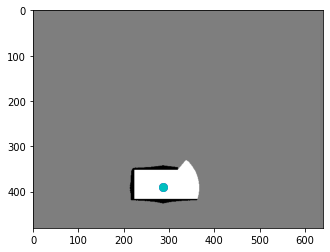

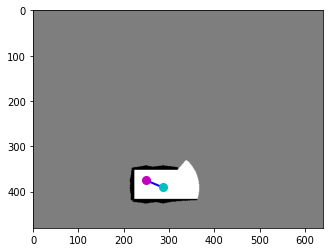

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5979, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5188, 0.5859]), 'reward': tensor([-0.8000]), 'action': tensor([-0.5335, -0.2210])}
terminal False


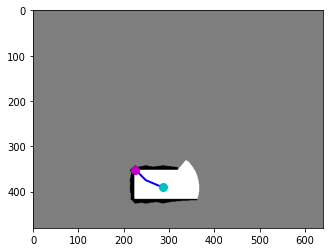

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5188, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5188, 0.5859]), 'reward': tensor([-10.]), 'action': tensor([-0.4575, -0.4531])}
terminal True


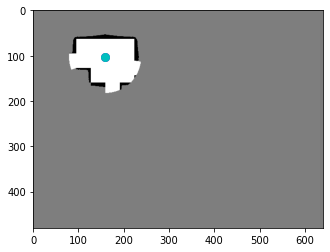

reward -10.800000011920929
step 1200
step 1300
avg iter time 0.7891957347209637


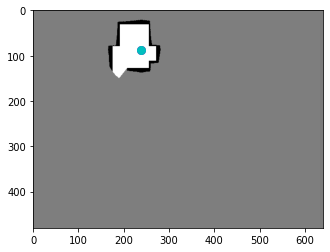

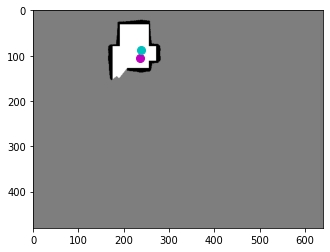

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4917, 0.1656]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0445,  0.2732])}
terminal False


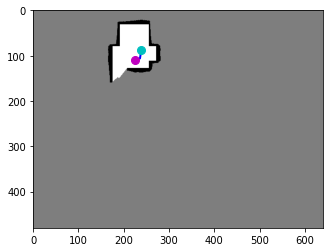

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4917, 0.1656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4708, 0.1719]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1464,  0.0627])}
terminal False


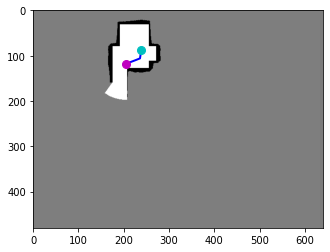

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4708, 0.1719]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4271, 0.1844]), 'reward': tensor([0.2754]), 'action': tensor([-0.3004,  0.1149])}
terminal False


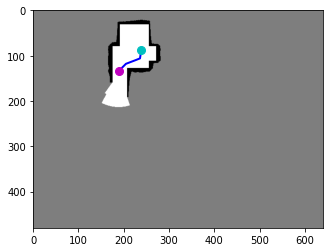

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4271, 0.1844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3938, 0.2094]), 'reward': tensor([0.1483]), 'action': tensor([-0.2215,  0.2325])}
terminal False


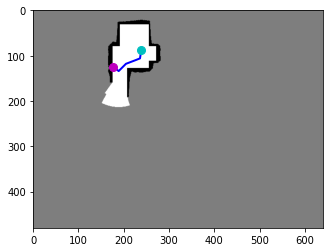

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3938, 0.2094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3938, 0.2094]), 'reward': tensor([-10.]), 'action': tensor([-0.3739, -0.2836])}
terminal True


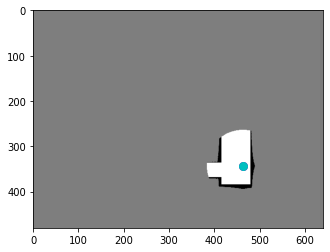

reward -11.176285743713379


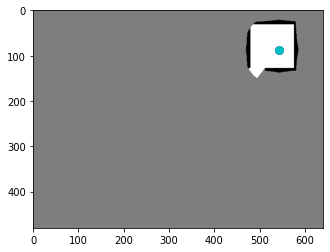

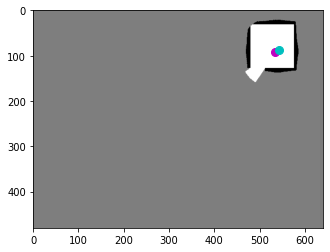

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1313, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1146, 0.1453]), 'reward': tensor([0.0519]), 'action': tensor([-0.0948,  0.0708])}
terminal False


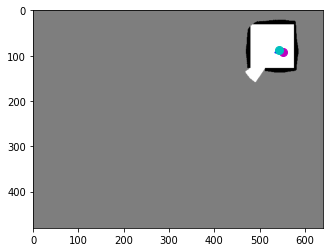

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1146, 0.1453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1500, 0.1437]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2365, -0.0190])}
terminal False


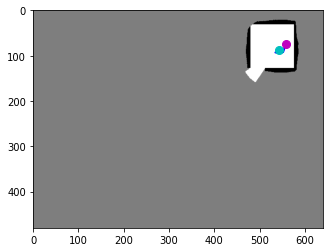

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1500, 0.1437]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1625, 0.1156]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0787, -0.2553])}
terminal False


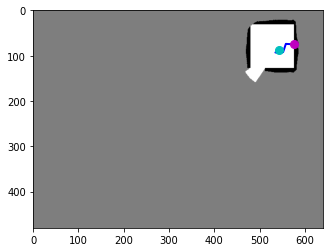

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1625, 0.1156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1625, 0.1156]), 'reward': tensor([-10.]), 'action': tensor([0.3406, 0.0235])}
terminal True


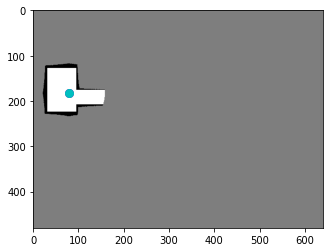

reward -11.54814288020134


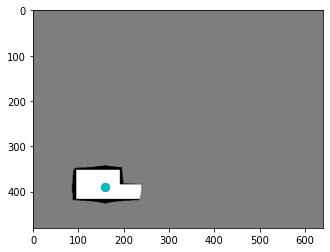

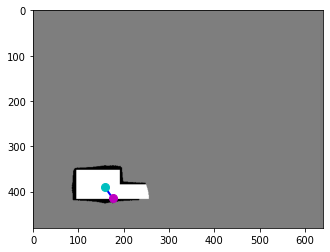

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3313, 0.6109]), 'reward': tensor([-10.]), 'action': tensor([0.4319, 0.6483])}
terminal True


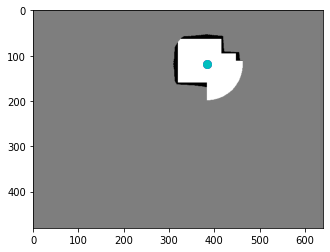

reward -10.0


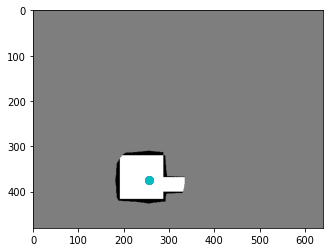

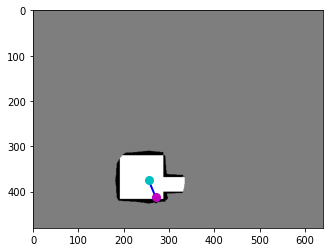

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.6453]), 'reward': tensor([-0.8000]), 'action': tensor([0.2268, 0.5442])}
terminal False


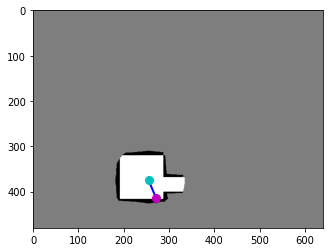

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.6453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.6453]), 'reward': tensor([-10.]), 'action': tensor([-0.0189,  0.4200])}
terminal True


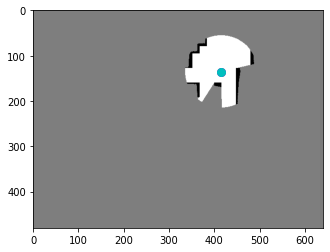

reward -10.800000011920929


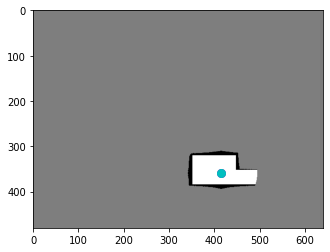

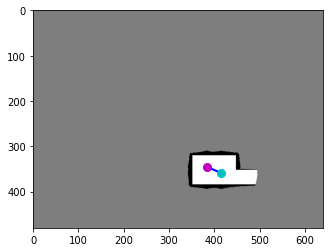

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.5391]), 'reward': tensor([-0.8000]), 'action': tensor([-0.4556, -0.1930])}
terminal False


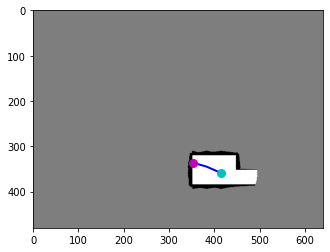

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.5391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.5391]), 'reward': tensor([-10.]), 'action': tensor([-0.5457, -0.1528])}
terminal True


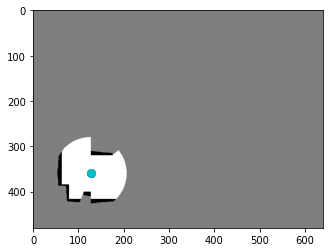

reward -10.800000011920929
step 1300
step 1400
avg iter time 0.7882606981481824


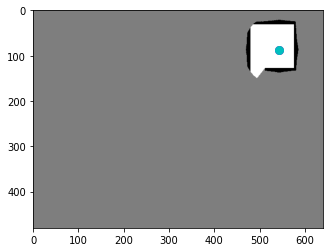

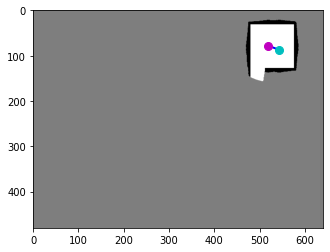

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1313, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0812, 0.1219]), 'reward': tensor([0.0530]), 'action': tensor([-0.3419, -0.1239])}
terminal False


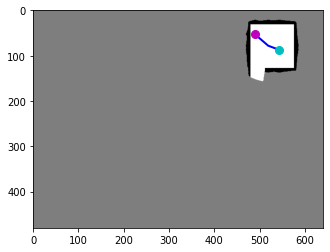

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0812, 0.1219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0208, 0.0828]), 'reward': tensor([-0.8000]), 'action': tensor([-0.4112, -0.3516])}
terminal False


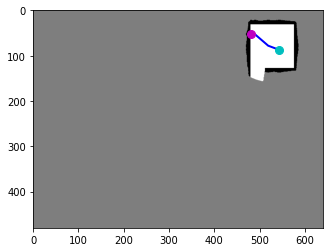

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0208, 0.0828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0208, 0.0828]), 'reward': tensor([-10.]), 'action': tensor([-0.4877, -0.0595])}
terminal True


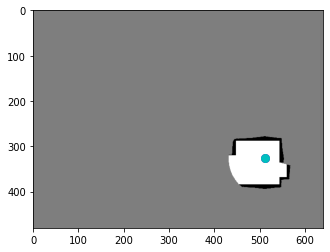

reward -10.747000012546778


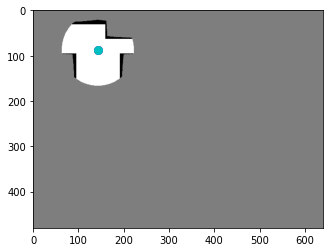

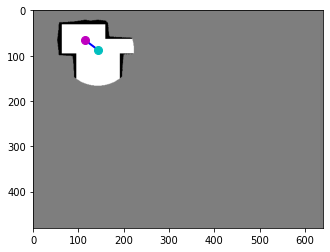

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2396, 0.1031]), 'reward': tensor([0.0547]), 'action': tensor([-0.3917, -0.2916])}
terminal False


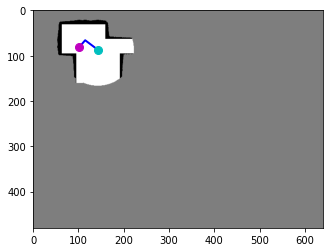

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2396, 0.1031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2125, 0.1266]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1864,  0.2122])}
terminal False


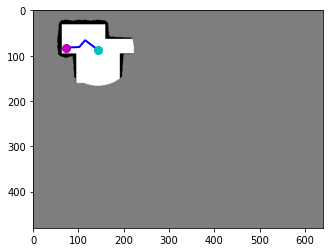

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2125, 0.1266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1521, 0.1281]), 'reward': tensor([-0.8000]), 'action': tensor([-0.4053,  0.0141])}
terminal False


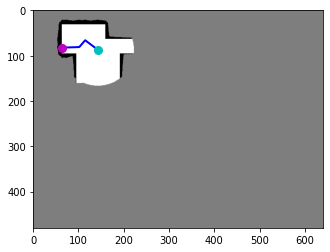

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1521, 0.1281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1521, 0.1281]), 'reward': tensor([-10.]), 'action': tensor([-0.4452,  0.0851])}
terminal True


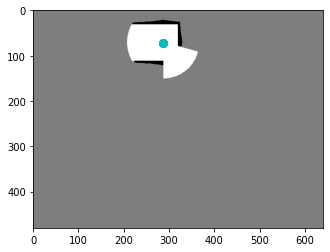

reward -11.545285739004612


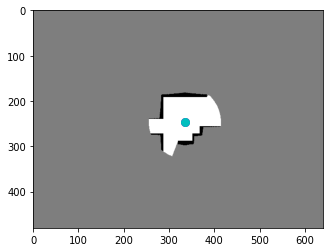

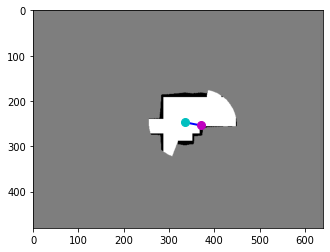

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7708, 0.3969]), 'reward': tensor([0.3337]), 'action': tensor([0.4985, 0.0977])}
terminal False


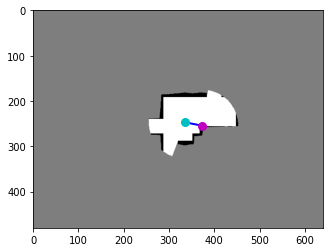

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7708, 0.3969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7708, 0.3969]), 'reward': tensor([-10.]), 'action': tensor([0.1091, 0.0539])}
terminal True


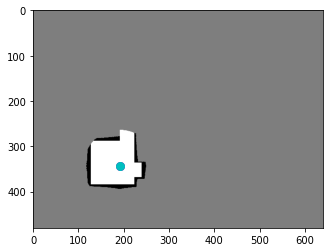

reward -9.6662857234478


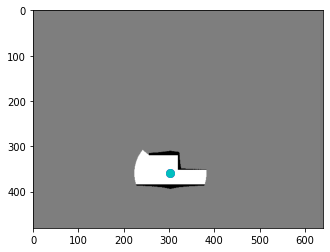

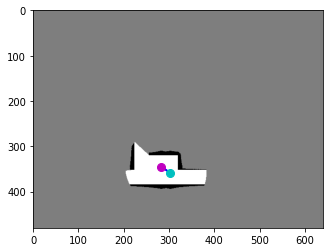

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5896, 0.5391]), 'reward': tensor([0.1456]), 'action': tensor([-0.2852, -0.1988])}
terminal False


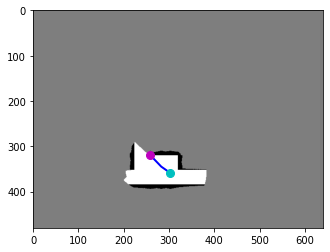

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5896, 0.5391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5396, 0.5000]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3410, -0.3477])}
terminal False


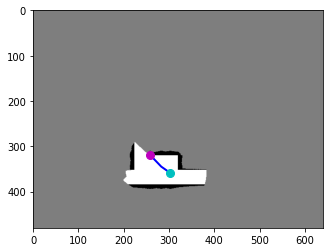

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5396, 0.5000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5396, 0.5000]), 'reward': tensor([-10.]), 'action': tensor([-0.2338, -0.1411])}
terminal True


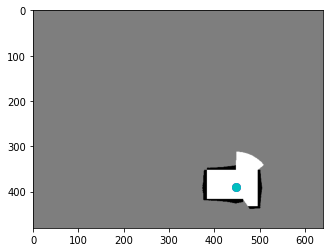

reward -10.654428586363792


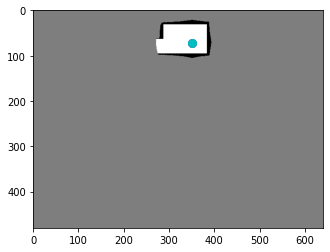

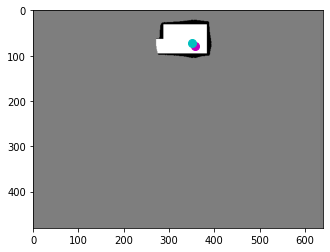

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7458, 0.1219]), 'reward': tensor([-0.8000]), 'action': tensor([0.1046, 0.0942])}
terminal False


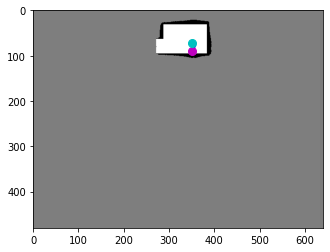

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7458, 0.1219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7312, 0.1406]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0954,  0.1690])}
terminal False


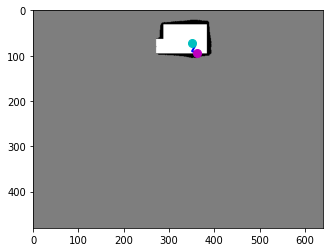

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.1406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7312, 0.1406]), 'reward': tensor([-10.]), 'action': tensor([0.4973, 0.2867])}
terminal True


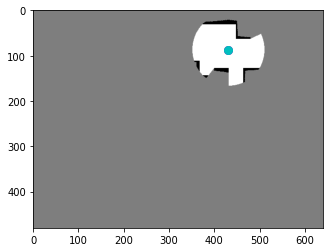

reward -11.600000023841858
step 1400
step 1500
avg iter time 0.7868202962875366


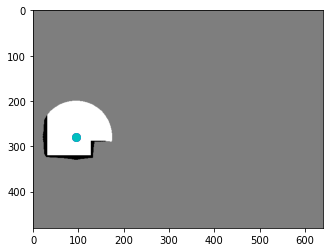

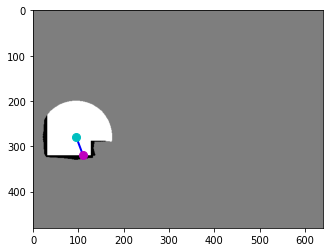

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1979, 0.4359]), 'reward': tensor([-10.]), 'action': tensor([0.2443, 0.6473])}
terminal True


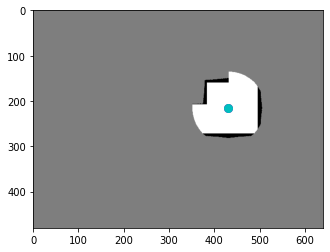

reward -10.0


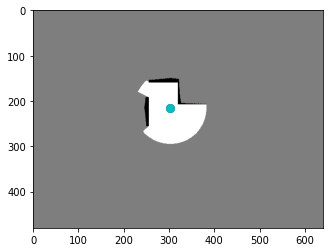

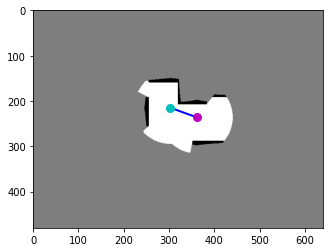

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7521, 0.3688]), 'reward': tensor([0.9449]), 'action': tensor([0.8161, 0.2957])}
terminal False


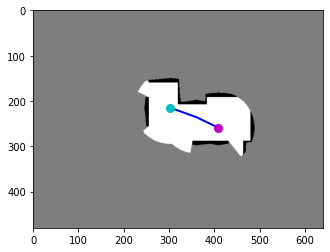

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7521, 0.3688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8521, 0.4047]), 'reward': tensor([0.6607]), 'action': tensor([0.6720, 0.3236])}
terminal False


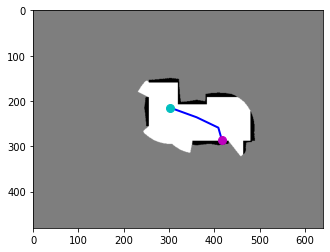

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8521, 0.4047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8521, 0.4047]), 'reward': tensor([-10.]), 'action': tensor([0.1191, 0.4068])}
terminal True


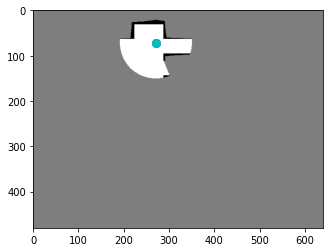

reward -8.394428610801697


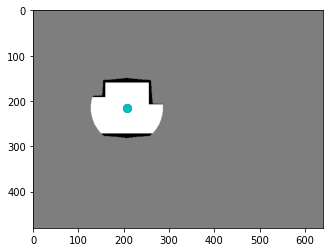

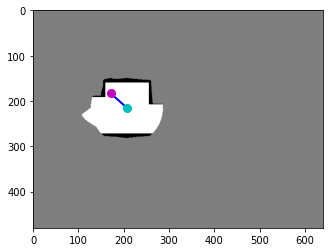

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3562, 0.2859]), 'reward': tensor([0.0720]), 'action': tensor([-0.5142, -0.4541])}
terminal False


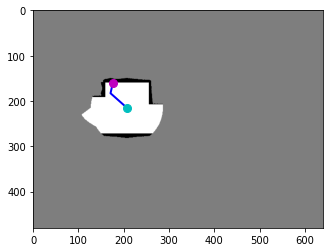

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3562, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3562, 0.2859]), 'reward': tensor([-10.]), 'action': tensor([ 0.1577, -0.6891])}
terminal True


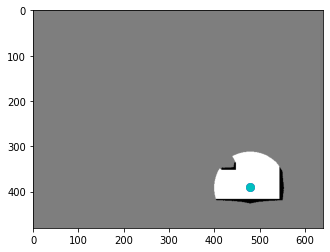

reward -9.928000003099442


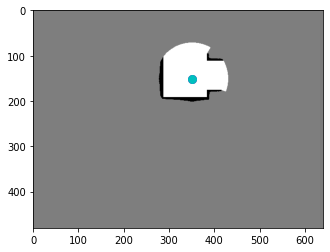

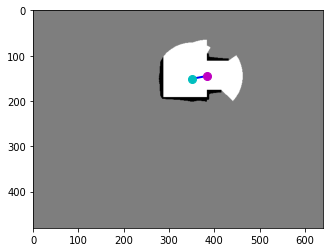

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.2266]), 'reward': tensor([0.4190]), 'action': tensor([ 0.4535, -0.0865])}
terminal False


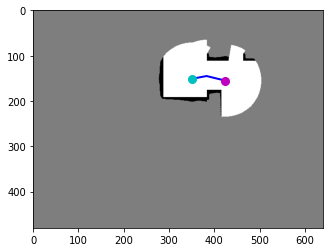

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.2266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8833, 0.2422]), 'reward': tensor([0.9573]), 'action': tensor([0.5808, 0.1451])}
terminal False


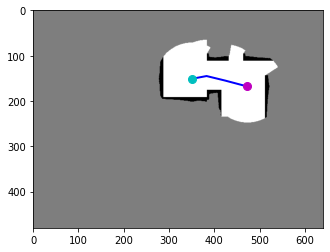

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8833, 0.2422]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9854, 0.2625]), 'reward': tensor([0.5543]), 'action': tensor([0.6911, 0.1827])}
terminal False


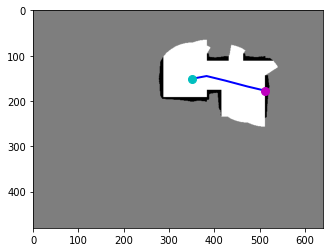

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9854, 0.2625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9854, 0.2625]), 'reward': tensor([-10.]), 'action': tensor([0.6118, 0.1396])}
terminal True


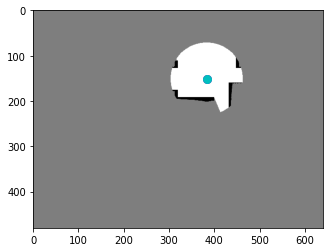

reward -8.069428592920303


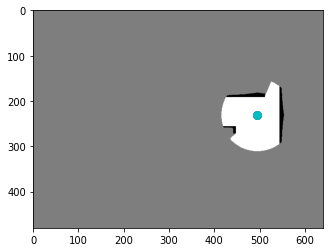

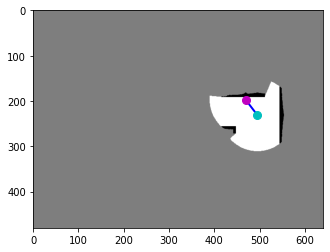

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9771, 0.3078]), 'reward': tensor([0.2027]), 'action': tensor([-0.3726, -0.4769])}
terminal False


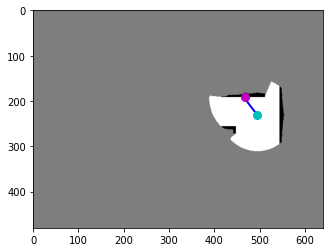

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9771, 0.3078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9771, 0.3078]), 'reward': tensor([-10.]), 'action': tensor([-0.0551, -0.3171])}
terminal True


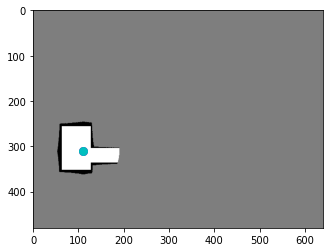

reward -9.797285720705986
step 1500
CRITIC


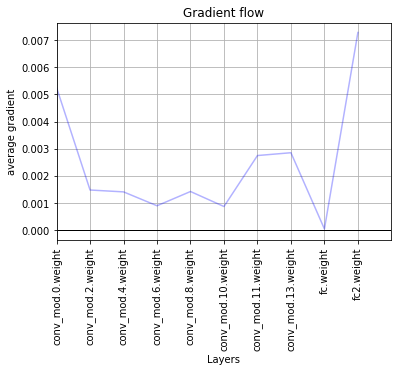

ACTOR


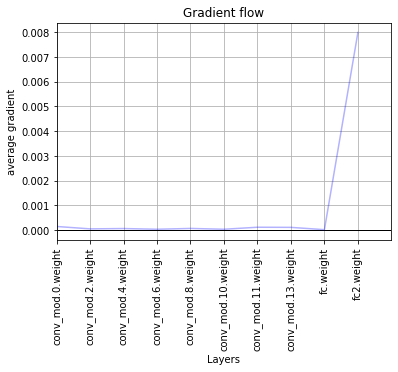

step 1600
avg iter time 0.7872496914863586


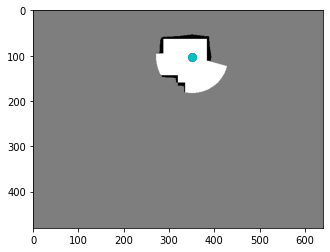

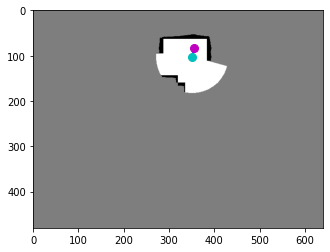

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.1312]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0654, -0.2701])}
terminal False


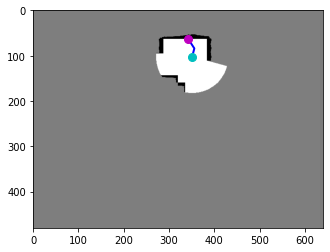

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7417, 0.1312]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.1312]), 'reward': tensor([-10.]), 'action': tensor([-0.2948, -0.4714])}
terminal True


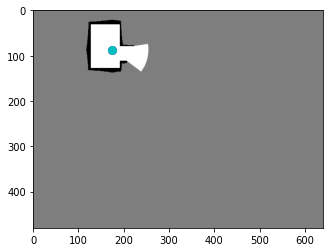

reward -10.800000011920929


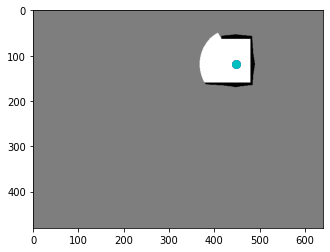

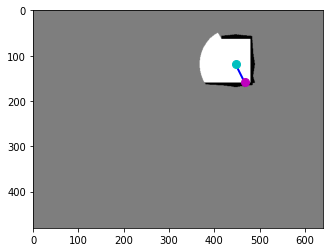

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9312, 0.1859]), 'reward': tensor([-10.]), 'action': tensor([0.2975, 0.5883])}
terminal True


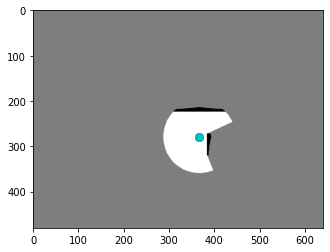

reward -10.0


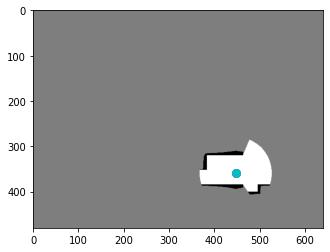

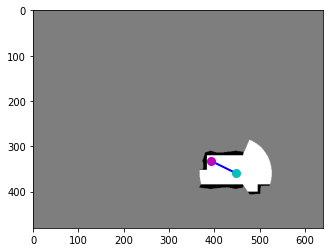

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8167, 0.5188]), 'reward': tensor([-0.8000]), 'action': tensor([-0.7730, -0.3785])}
terminal False


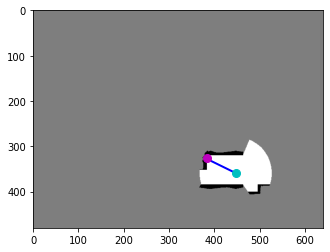

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8167, 0.5188]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8167, 0.5188]), 'reward': tensor([-10.]), 'action': tensor([-0.4947, -0.3934])}
terminal True


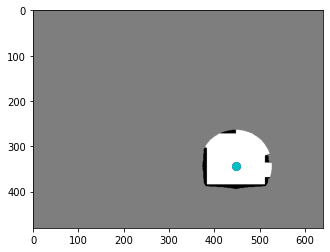

reward -10.800000011920929


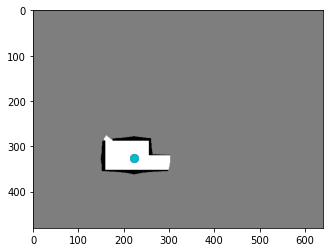

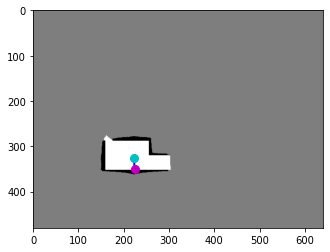

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4646, 0.5109]), 'reward': tensor([-10.]), 'action': tensor([0.0121, 0.3914])}
terminal True


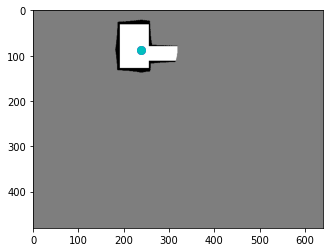

reward -10.0


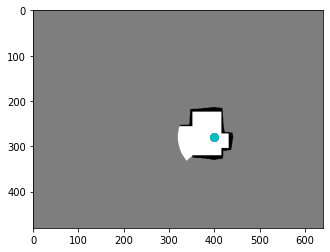

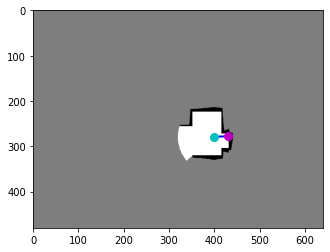

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8313, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8313, 0.4359]), 'reward': tensor([-10.]), 'action': tensor([ 0.5582, -0.0073])}
terminal True


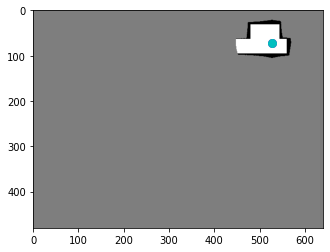

reward -10.0
step 1600
step 1700
avg iter time 0.7862057368895586


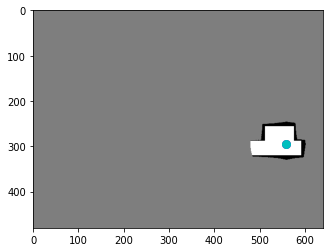

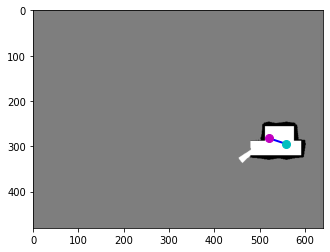

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0833, 0.4406]), 'reward': tensor([0.0520]), 'action': tensor([-0.5564, -0.1826])}
terminal False


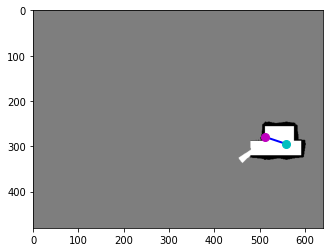

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0833, 0.4406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0833, 0.4406]), 'reward': tensor([-10.]), 'action': tensor([-0.5861, -0.1382])}
terminal True


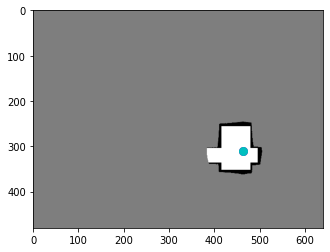

reward -9.947999998927116


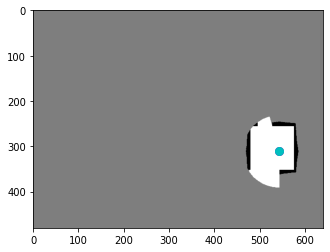

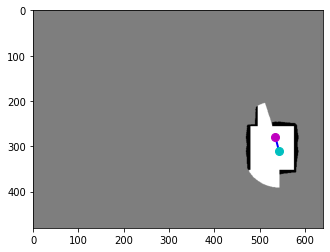

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1313, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1146, 0.4375]), 'reward': tensor([0.1067]), 'action': tensor([-0.1160, -0.4425])}
terminal False


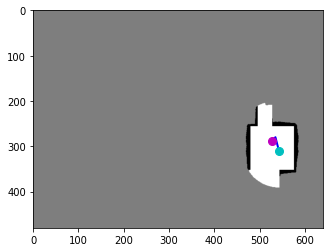

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1146, 0.4375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0979, 0.4500]), 'reward': tensor([0.0457]), 'action': tensor([-0.1183,  0.1126])}
terminal False


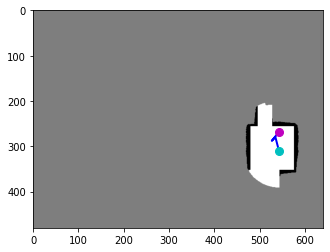

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.4500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1313, 0.4187]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2233, -0.2898])}
terminal False


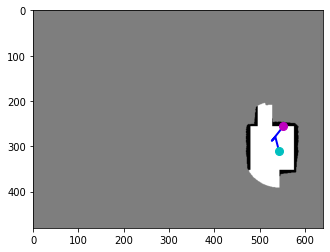

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1313, 0.4187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1313, 0.4187]), 'reward': tensor([-10.]), 'action': tensor([ 0.1524, -0.2095])}
terminal True


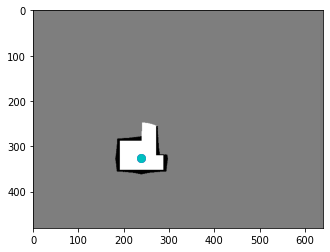

reward -10.647571440786123


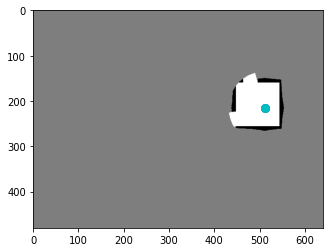

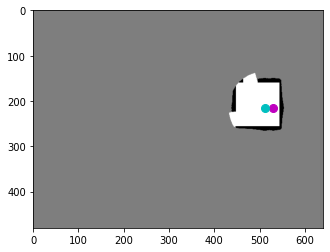

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1042, 0.3375]), 'reward': tensor([-0.8000]), 'action': tensor([0.2674, 0.0158])}
terminal False


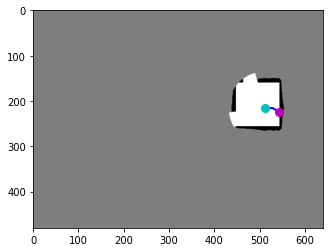

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1042, 0.3375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1042, 0.3375]), 'reward': tensor([-10.]), 'action': tensor([0.5223, 0.3653])}
terminal True


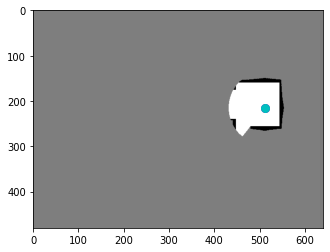

reward -10.800000011920929


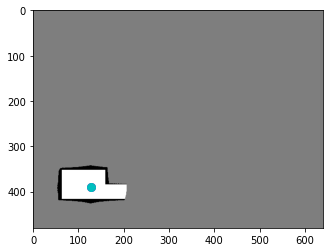

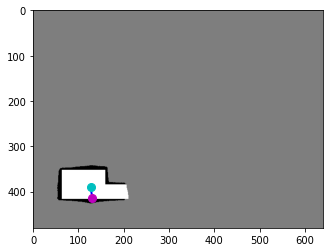

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.6109]), 'reward': tensor([-10.]), 'action': tensor([0.0886, 0.4959])}
terminal True


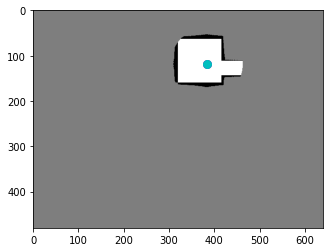

reward -10.0


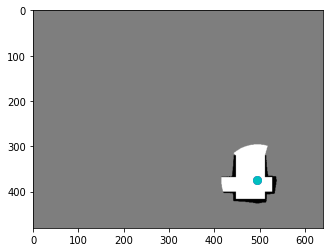

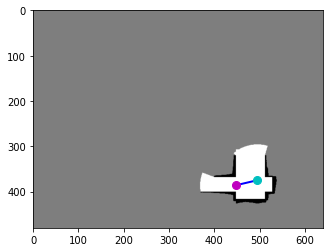

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.6031]), 'reward': tensor([0.2399]), 'action': tensor([-0.6653,  0.1586])}
terminal False


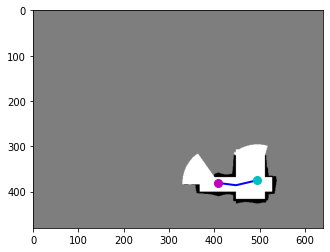

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.6031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8521, 0.5953]), 'reward': tensor([0.3680]), 'action': tensor([-0.5517, -0.0736])}
terminal False


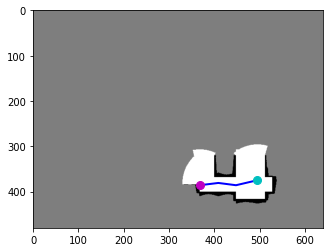

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8521, 0.5953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8521, 0.5953]), 'reward': tensor([-10.]), 'action': tensor([-0.7814,  0.0957])}
terminal True


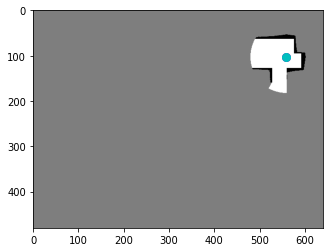

reward -9.392142862081528
step 1700
step 1800
avg iter time 0.7852098617288802


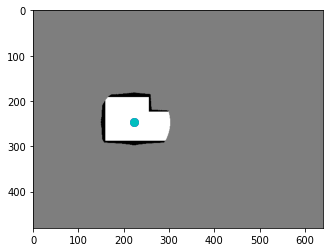

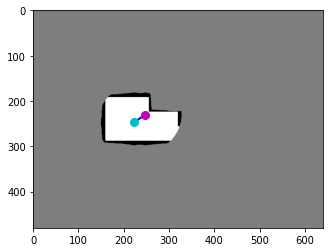

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5167, 0.3594]), 'reward': tensor([0.1599]), 'action': tensor([ 0.3605, -0.2355])}
terminal False


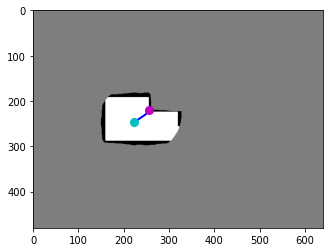

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5167, 0.3594]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5167, 0.3594]), 'reward': tensor([-10.]), 'action': tensor([ 0.4600, -0.5536])}
terminal True


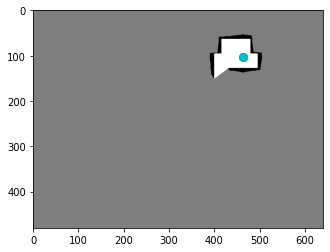

reward -9.840142861008644


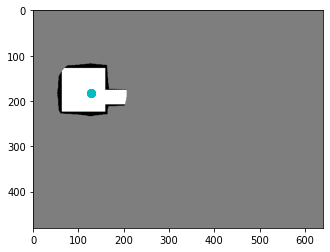

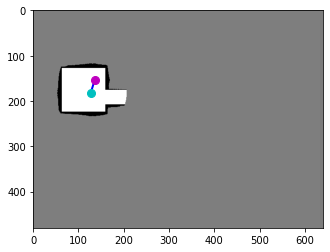

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2833, 0.2406]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1329, -0.4064])}
terminal False


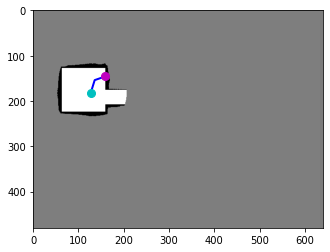

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2833, 0.2406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2833, 0.2406]), 'reward': tensor([-10.]), 'action': tensor([ 0.3652, -0.1249])}
terminal True


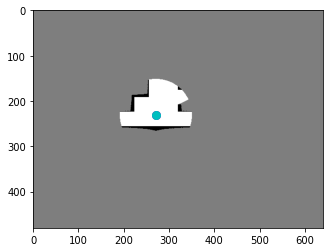

reward -10.800000011920929


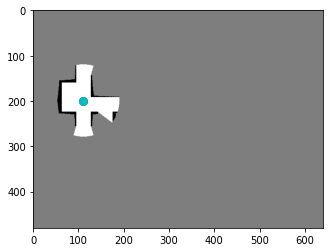

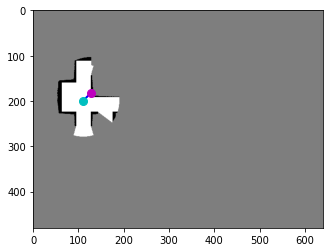

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2313, 0.3109]), 'reward': tensor([-10.]), 'action': tensor([ 0.3404, -0.3323])}
terminal True


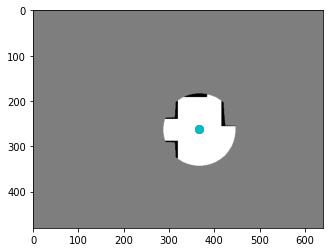

reward -10.0


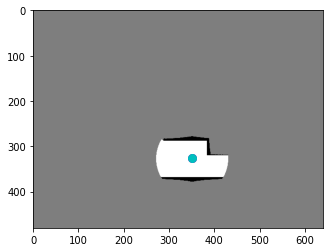

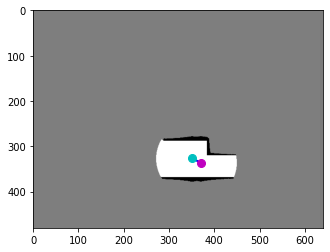

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7708, 0.5250]), 'reward': tensor([0.1399]), 'action': tensor([0.2658, 0.1251])}
terminal False


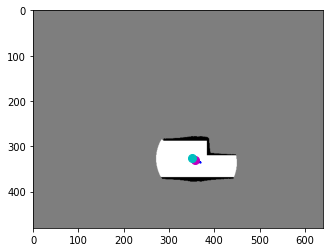

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7708, 0.5250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7458, 0.5156]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1715, -0.0825])}
terminal False


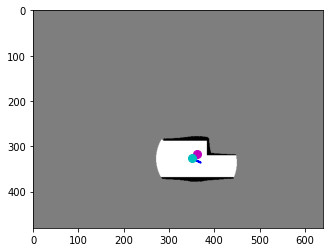

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7458, 0.5156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7542, 0.4969]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0606, -0.1667])}
terminal False


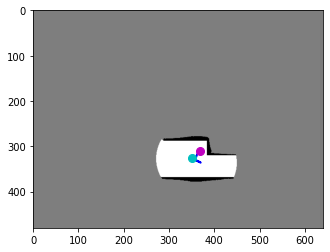

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7542, 0.4969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7667, 0.4844]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0089, -0.0107])}
terminal False


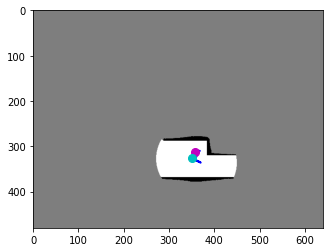

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7667, 0.4844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7458, 0.4875]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0855,  0.0199])}
terminal False


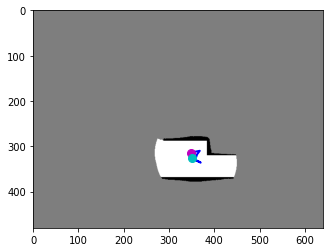

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7458, 0.4875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7250, 0.4906]), 'reward': tensor([0.0353]), 'action': tensor([-0.1065,  0.0262])}
terminal False


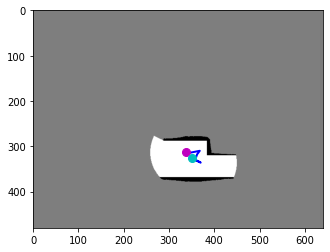

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7250, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7042, 0.4891]), 'reward': tensor([0.1146]), 'action': tensor([-0.1440, -0.0194])}
terminal False


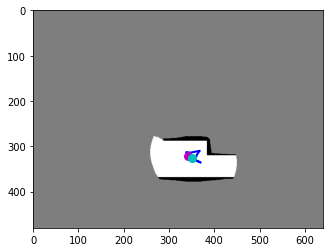

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7042, 0.4891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7104, 0.5031]), 'reward': tensor([-0.8000]), 'action': tensor([0.0357, 0.0981])}
terminal False


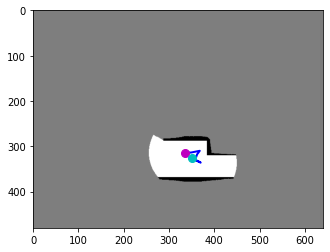

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7104, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6979, 0.4906]), 'reward': tensor([0.0357]), 'action': tensor([-0.0595, -0.0718])}
terminal False


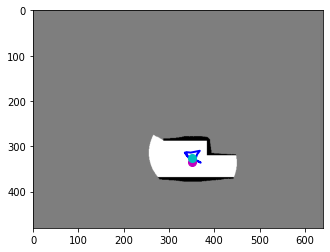

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7292, 0.5219]), 'reward': tensor([-0.8000]), 'action': tensor([0.2055, 0.2762])}
terminal False


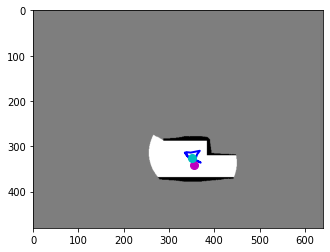

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7292, 0.5219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.5344]), 'reward': tensor([-0.8000]), 'action': tensor([0.0479, 0.0596])}
terminal False


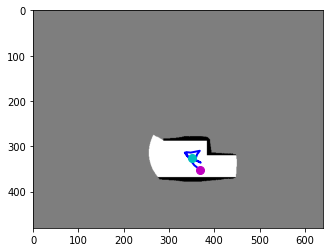

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7417, 0.5344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7688, 0.5500]), 'reward': tensor([-0.8000]), 'action': tensor([0.1874, 0.1369])}
terminal False


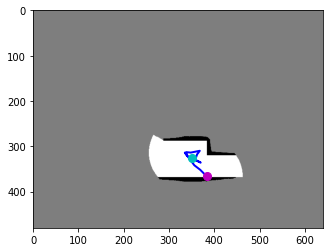

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7688, 0.5500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.5719]), 'reward': tensor([0.0634]), 'action': tensor([0.1958, 0.1917])}
terminal False


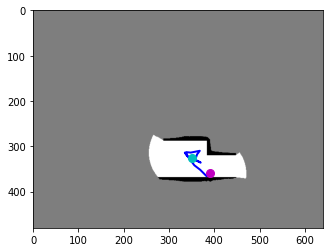

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.5719]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8146, 0.5625]), 'reward': tensor([0.0767]), 'action': tensor([ 0.0418, -0.0280])}
terminal False


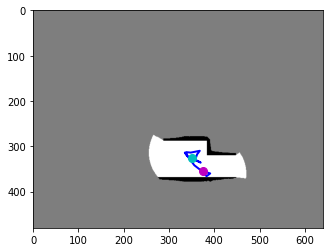

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8146, 0.5625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7812, 0.5547]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2274, -0.0649])}
terminal False


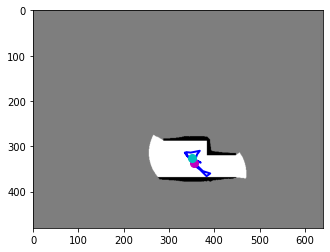

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7812, 0.5547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.5266]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2646, -0.2520])}
terminal False


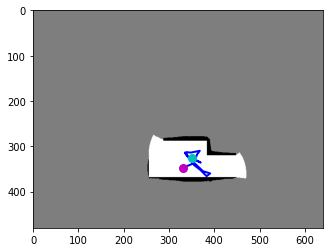

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7417, 0.5266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.5422]), 'reward': tensor([0.0493]), 'action': tensor([-0.3326,  0.1424])}
terminal False


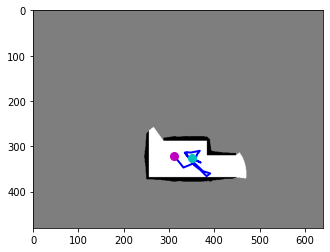

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6917, 0.5422]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6500, 0.5031]), 'reward': tensor([0.0646]), 'action': tensor([-0.2772, -0.3558])}
terminal False


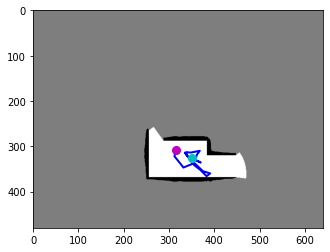

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6500, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6583, 0.4828]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0542, -0.1894])}
terminal False


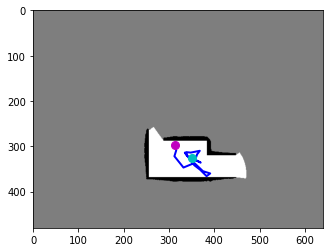

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6583, 0.4828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6521, 0.4641]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0471, -0.1697])}
terminal False


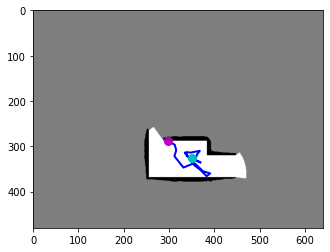

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6521, 0.4641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6521, 0.4641]), 'reward': tensor([-10.]), 'action': tensor([-0.2398, -0.1536])}
terminal True


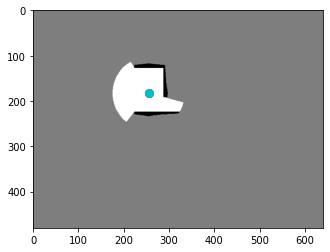

reward -19.020571570843458


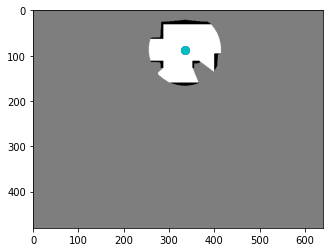

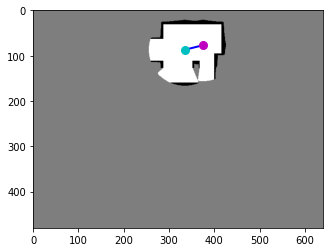

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7812, 0.1203]), 'reward': tensor([0.2154]), 'action': tensor([ 0.5613, -0.1420])}
terminal False


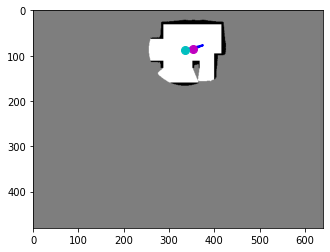

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7812, 0.1203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7375, 0.1344]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3015,  0.1285])}
terminal False


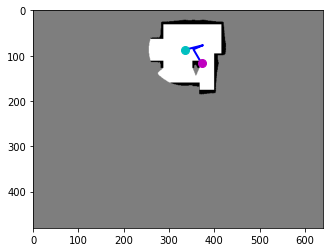

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7375, 0.1344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7750, 0.1828]), 'reward': tensor([0.1037]), 'action': tensor([0.2539, 0.4352])}
terminal False


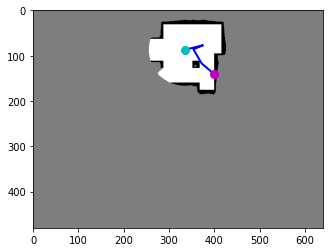

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7750, 0.1828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8313, 0.2188]), 'reward': tensor([-0.8000]), 'action': tensor([0.3826, 0.3209])}
terminal False


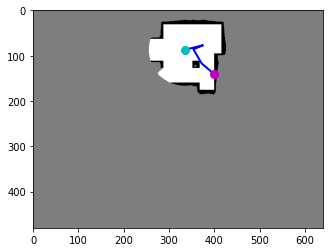

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8313, 0.2188]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8313, 0.2188]), 'reward': tensor([-10.]), 'action': tensor([0.4076, 0.2915])}
terminal True


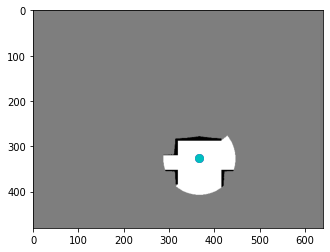

reward -11.280857160687447
step 1800
step 1900
avg iter time 0.787212480620334


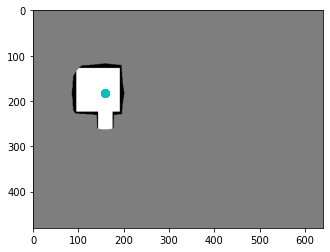

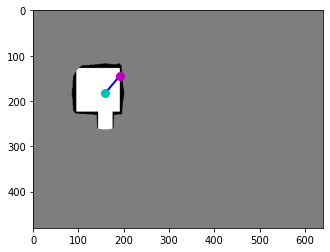

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3313, 0.2859]), 'reward': tensor([-10.]), 'action': tensor([ 0.5062, -0.5871])}
terminal True


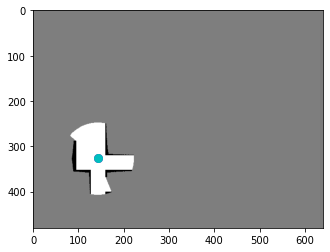

reward -10.0


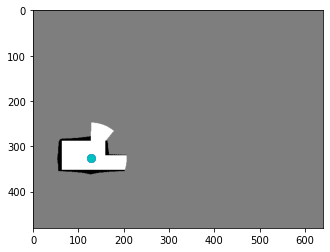

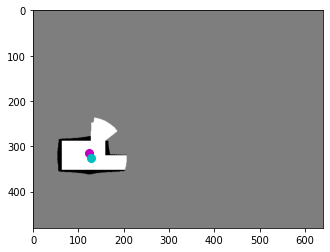

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2562, 0.4922]), 'reward': tensor([0.0816]), 'action': tensor([-0.0531, -0.1627])}
terminal False


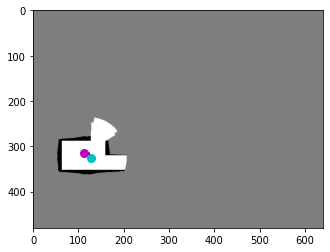

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2562, 0.4922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2354, 0.4922]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0853, -0.0033])}
terminal False


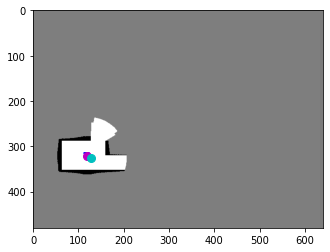

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2354, 0.4922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2500, 0.5031]), 'reward': tensor([-0.8000]), 'action': tensor([0.0495, 0.0478])}
terminal False


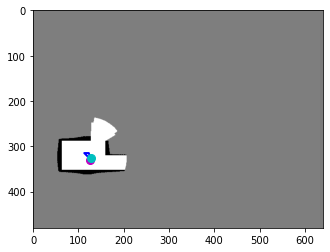

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2500, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2604, 0.5172]), 'reward': tensor([-0.8000]), 'action': tensor([0.0313, 0.0549])}
terminal False


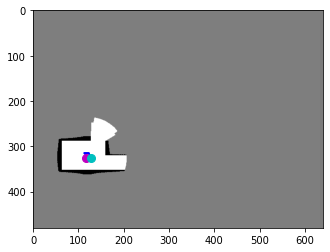

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2604, 0.5172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2417, 0.5094]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0595, -0.0310])}
terminal False


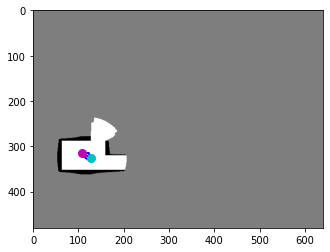

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2417, 0.5094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2229, 0.4906]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1297, -0.1653])}
terminal False


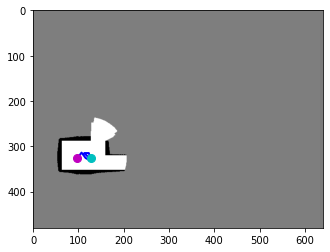

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2229, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2042, 0.5094]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1242,  0.1664])}
terminal False


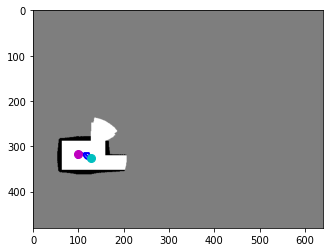

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2042, 0.5094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2062, 0.4938]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0075, -0.1059])}
terminal False


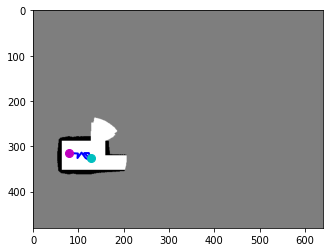

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2062, 0.4938]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1646, 0.4922]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2802, -0.0143])}
terminal False


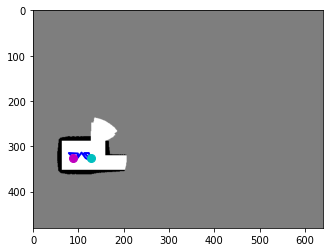

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.4922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1854, 0.5094]), 'reward': tensor([-0.8000]), 'action': tensor([0.1422, 0.1609])}
terminal False


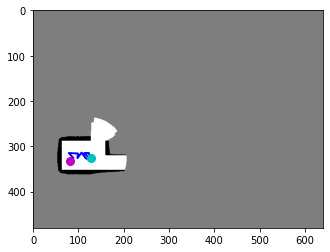

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1854, 0.5094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1708, 0.5203]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0875,  0.0885])}
terminal False


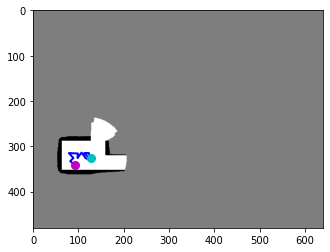

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1708, 0.5203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1937, 0.5344]), 'reward': tensor([-0.8000]), 'action': tensor([0.1577, 0.1240])}
terminal False


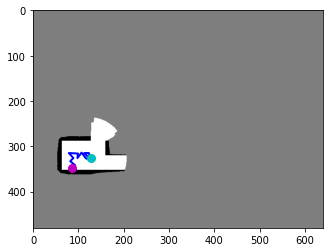

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1937, 0.5344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1792, 0.5453]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0246,  0.0277])}
terminal False


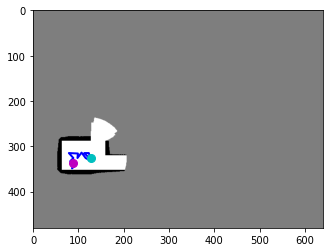

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1792, 0.5453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1854, 0.5281]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0486, -0.1521])}
terminal False


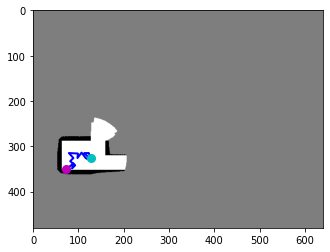

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1854, 0.5281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1854, 0.5281]), 'reward': tensor([-10.]), 'action': tensor([-0.2500,  0.2149])}
terminal True


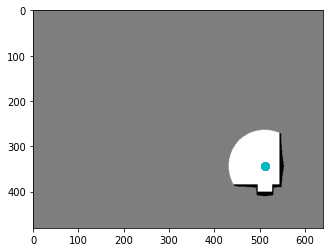

reward -20.318428725004196


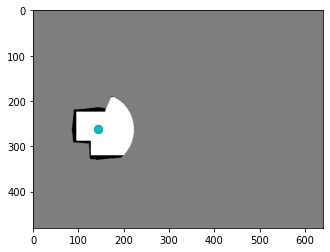

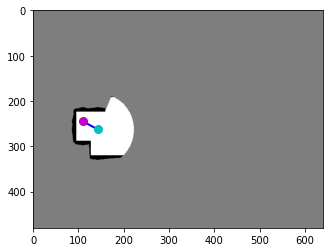

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2292, 0.3828]), 'reward': tensor([-0.8000]), 'action': tensor([-0.4711, -0.2563])}
terminal False


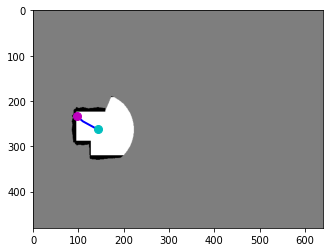

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2292, 0.3828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2292, 0.3828]), 'reward': tensor([-10.]), 'action': tensor([-0.4294, -0.3374])}
terminal True


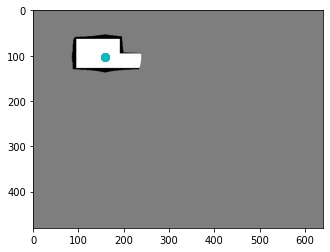

reward -10.800000011920929


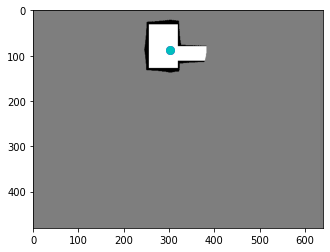

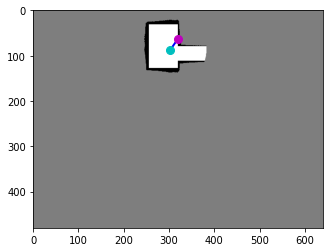

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6313, 0.1359]), 'reward': tensor([-10.]), 'action': tensor([ 0.3358, -0.4778])}
terminal True


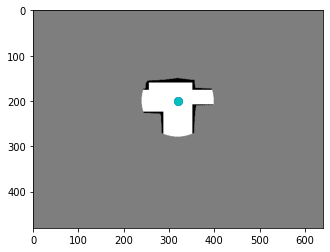

reward -10.0


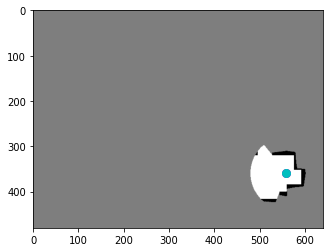

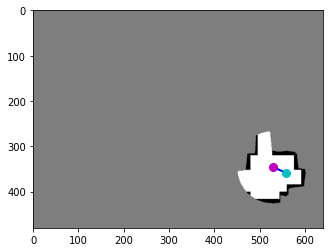

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1042, 0.5406]), 'reward': tensor([0.3699]), 'action': tensor([-0.4153, -0.1814])}
terminal False


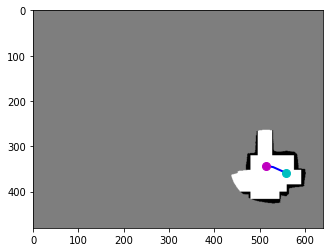

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1042, 0.5406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0708, 0.5359]), 'reward': tensor([0.1274]), 'action': tensor([-0.2291, -0.0458])}
terminal False


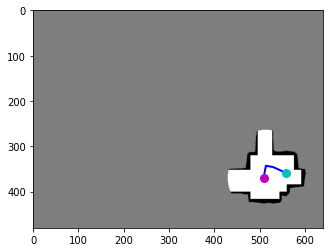

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0708, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0604, 0.5766]), 'reward': tensor([0.1076]), 'action': tensor([-0.0747,  0.3627])}
terminal False


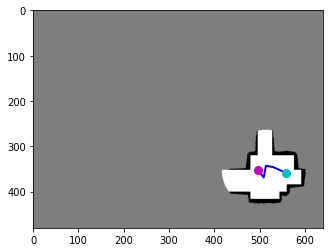

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0604, 0.5766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0333, 0.5500]), 'reward': tensor([0.0659]), 'action': tensor([-0.1792, -0.2390])}
terminal False


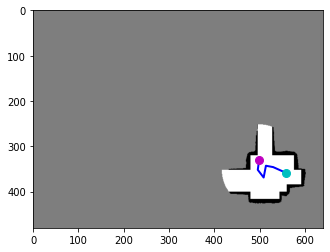

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0333, 0.5500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0396, 0.5172]), 'reward': tensor([0.0504]), 'action': tensor([ 0.0454, -0.2982])}
terminal False


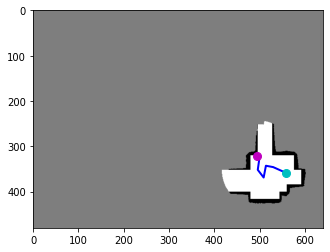

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0396, 0.5172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0312, 0.5031]), 'reward': tensor([0.0203]), 'action': tensor([-0.0438, -0.1116])}
terminal False


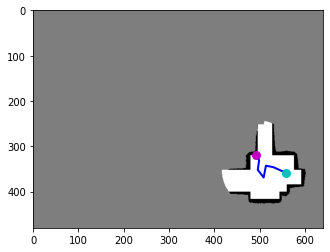

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0312, 0.5031]), 'reward': tensor([-10.]), 'action': tensor([-0.3638, -0.3216])}
terminal True


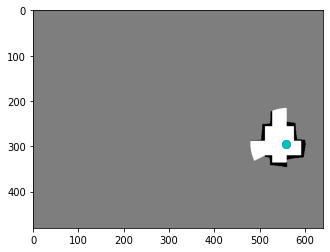

reward -9.258571431040764
step 1900
step 2000
avg iter time 0.790101407289505


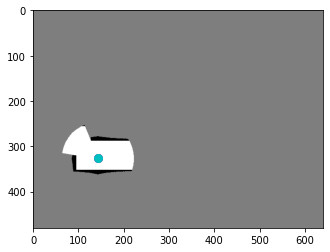

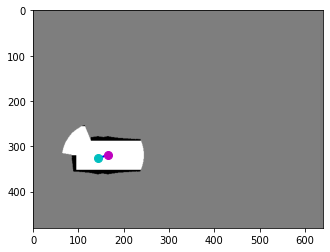

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3438, 0.4984]), 'reward': tensor([0.2051]), 'action': tensor([ 0.3049, -0.1201])}
terminal False


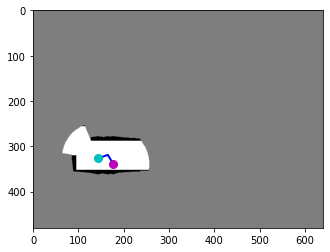

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3438, 0.4984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3688, 0.5297]), 'reward': tensor([0.0859]), 'action': tensor([0.1652, 0.2858])}
terminal False


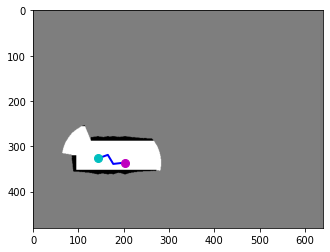

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3688, 0.5297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4229, 0.5250]), 'reward': tensor([0.2460]), 'action': tensor([ 0.3630, -0.0387])}
terminal False


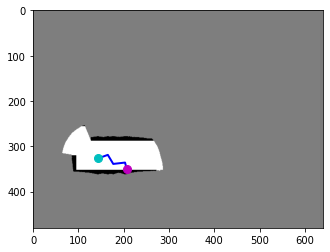

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4229, 0.5250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4229, 0.5250]), 'reward': tensor([-10.]), 'action': tensor([0.0736, 0.3135])}
terminal True


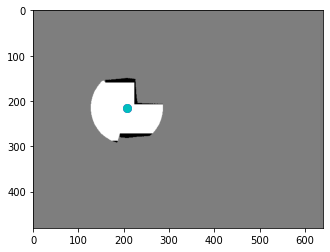

reward -9.462999992072582


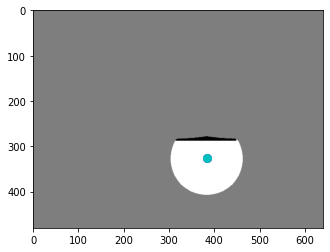

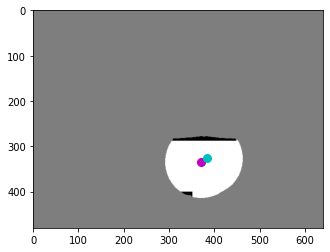

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7729, 0.5219]), 'reward': tensor([0.2737]), 'action': tensor([-0.1651,  0.0985])}
terminal False


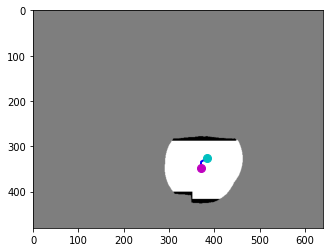

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7729, 0.5219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7708, 0.5437]), 'reward': tensor([0.1409]), 'action': tensor([-0.0096,  0.1991])}
terminal False


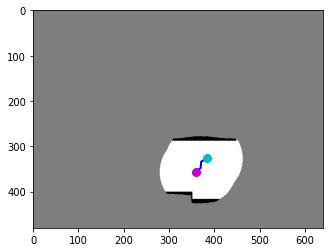

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7708, 0.5437]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7479, 0.5562]), 'reward': tensor([0.1367]), 'action': tensor([-0.1621,  0.1202])}
terminal False


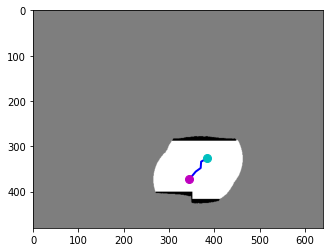

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7479, 0.5562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7188, 0.5828]), 'reward': tensor([0.1471]), 'action': tensor([-0.1923,  0.2469])}
terminal False


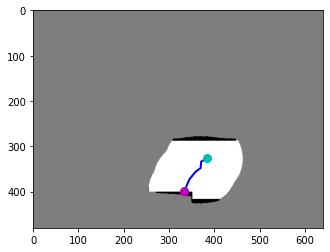

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7188, 0.5828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7188, 0.5828]), 'reward': tensor([-10.]), 'action': tensor([-0.1627,  0.3912])}
terminal True


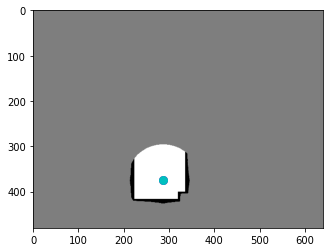

reward -9.301571443676949


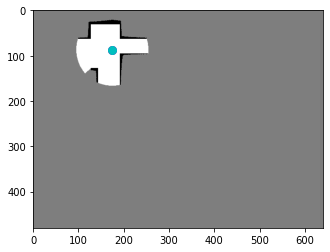

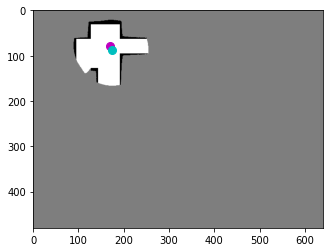

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3521, 0.1219]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0894, -0.1219])}
terminal False


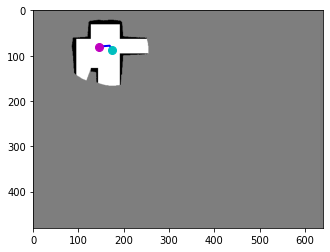

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3521, 0.1219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3021, 0.1250]), 'reward': tensor([0.0824]), 'action': tensor([-0.3370,  0.0344])}
terminal False


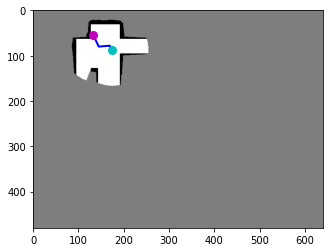

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3021, 0.1250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2771, 0.0859]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1743, -0.3553])}
terminal False


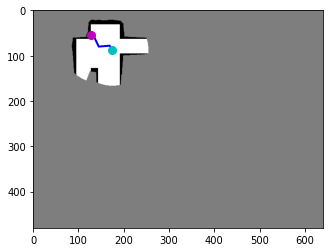

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2771, 0.0859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2771, 0.0859]), 'reward': tensor([-10.]), 'action': tensor([-0.3075,  0.0066])}
terminal True


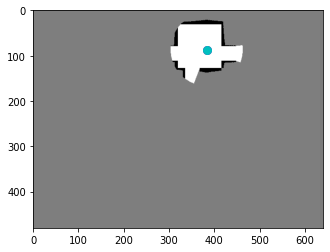

reward -11.517571449279785


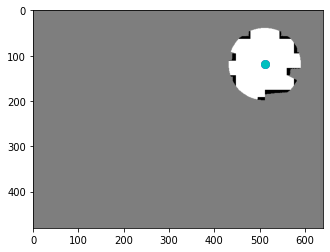

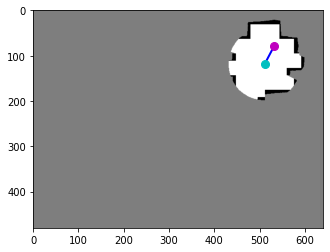

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1083, 0.1234]), 'reward': tensor([0.1027]), 'action': tensor([ 0.2947, -0.5675])}
terminal False


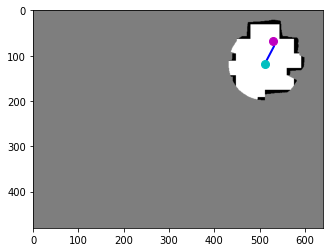

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1083, 0.1234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1021, 0.1063]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0371, -0.1547])}
terminal False


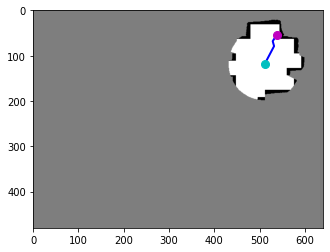

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1021, 0.1063]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1208, 0.0844]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1309, -0.1995])}
terminal False


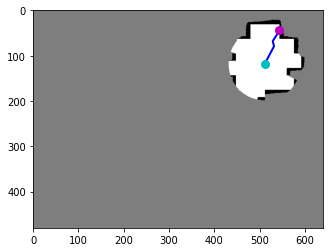

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1208, 0.0844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1208, 0.0844]), 'reward': tensor([-10.]), 'action': tensor([ 0.1561, -0.2678])}
terminal True


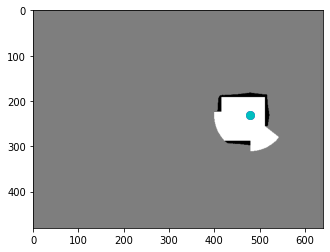

reward -11.49728573858738


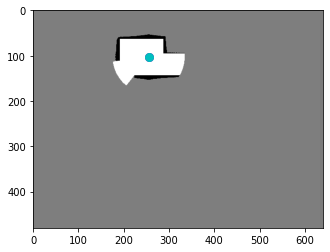

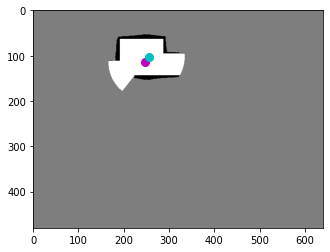

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5125, 0.1797]), 'reward': tensor([0.1339]), 'action': tensor([-0.1262,  0.1694])}
terminal False


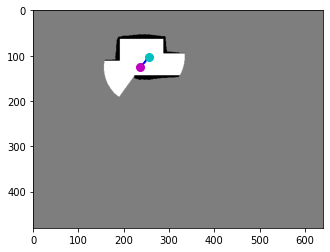

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5125, 0.1797]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4917, 0.1969]), 'reward': tensor([0.1613]), 'action': tensor([-0.1478,  0.1513])}
terminal False


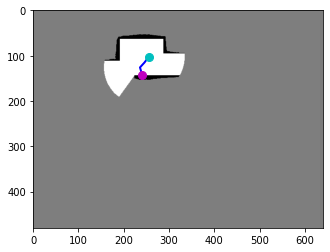

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4917, 0.1969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4917, 0.1969]), 'reward': tensor([-10.]), 'action': tensor([0.1826, 0.6129])}
terminal True


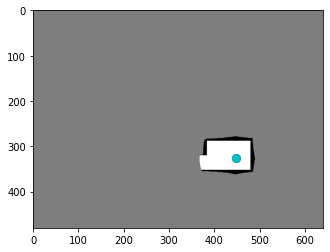

reward -9.704857140779495
step 2000
CRITIC


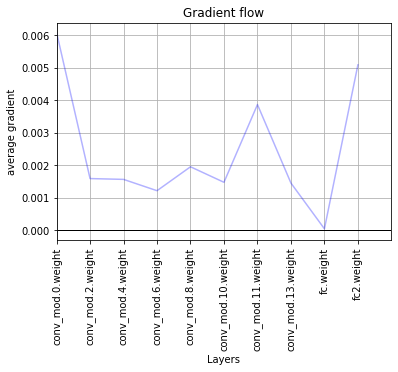

ACTOR


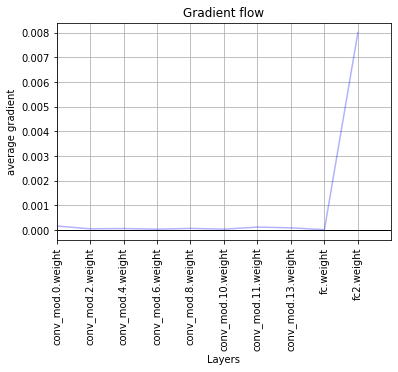

step 2100
avg iter time 0.7936405179614112


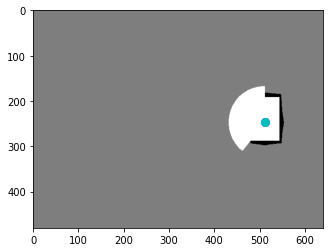

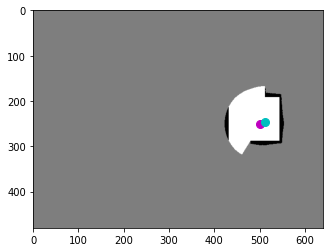

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0458, 0.3906]), 'reward': tensor([0.1164]), 'action': tensor([-0.0521,  0.0182])}
terminal False


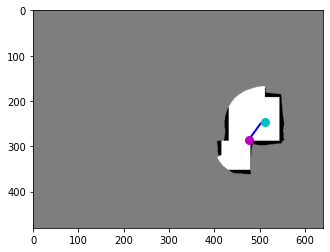

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0458, 0.3906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9917, 0.4469]), 'reward': tensor([0.4687]), 'action': tensor([-0.3695,  0.5070])}
terminal False


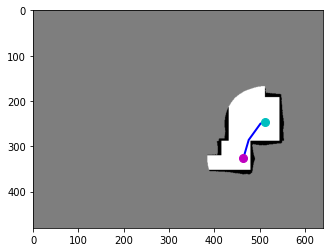

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9917, 0.4469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9667, 0.5109]), 'reward': tensor([0.1367]), 'action': tensor([-0.1709,  0.5744])}
terminal False


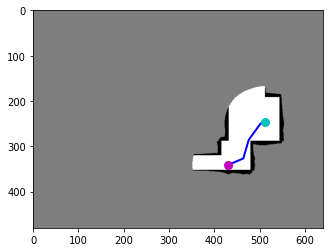

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9667, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.5328]), 'reward': tensor([0.1520]), 'action': tensor([-0.4704,  0.1949])}
terminal False


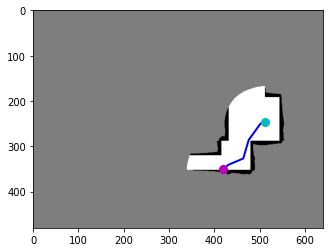

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.5328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.5328]), 'reward': tensor([-10.]), 'action': tensor([-0.4685,  0.4184])}
terminal True


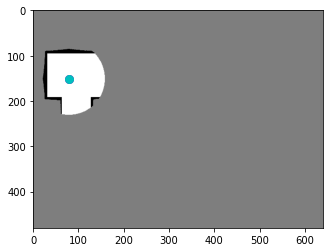

reward -9.126142859458923


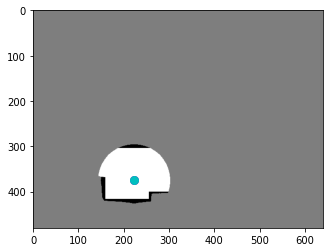

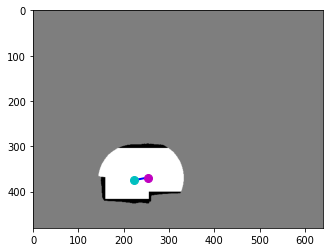

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5271, 0.5766]), 'reward': tensor([0.4407]), 'action': tensor([ 0.4253, -0.0858])}
terminal False


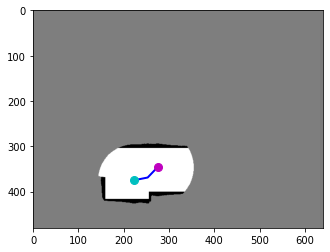

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5271, 0.5766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.5406]), 'reward': tensor([0.3320]), 'action': tensor([ 0.3115, -0.3227])}
terminal False


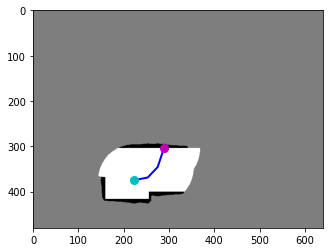

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5729, 0.5406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.5406]), 'reward': tensor([-10.]), 'action': tensor([ 0.2234, -0.7060])}
terminal True


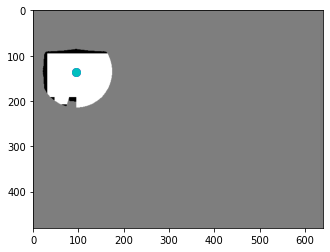

reward -9.227285712957382


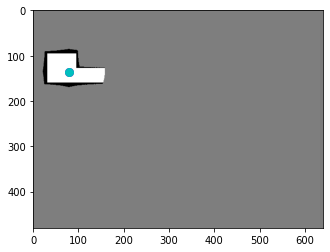

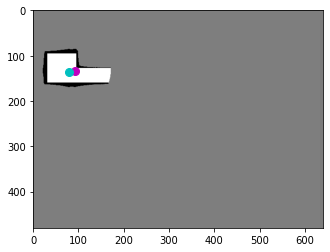

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1917, 0.2078]), 'reward': tensor([0.0583]), 'action': tensor([ 0.1786, -0.0224])}
terminal False


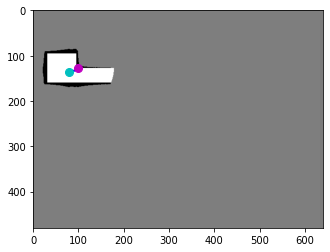

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1917, 0.2078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1917, 0.2078]), 'reward': tensor([-10.]), 'action': tensor([ 0.3986, -0.3259])}
terminal True


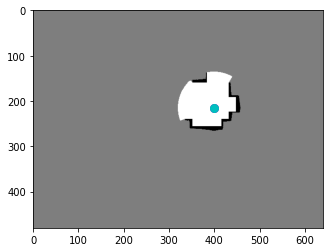

reward -9.9417142868042


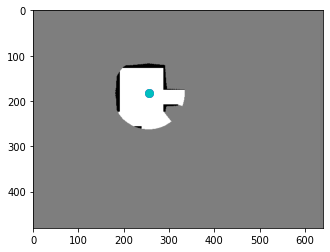

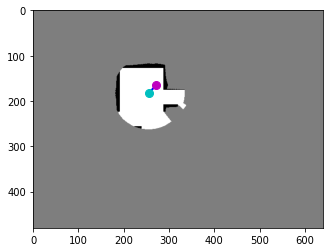

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5667, 0.2578]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2343, -0.2531])}
terminal False


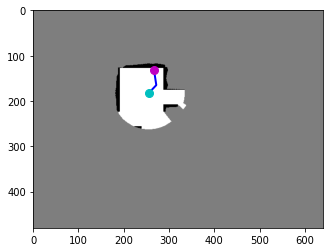

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5667, 0.2578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5562, 0.2062]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0771, -0.4668])}
terminal False


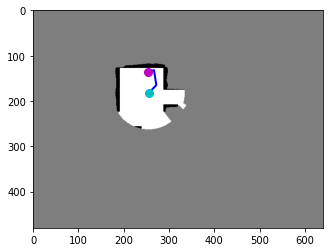

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5562, 0.2062]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5271, 0.2109]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2003,  0.0375])}
terminal False


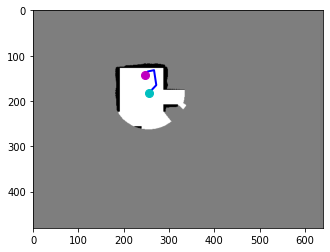

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5271, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5146, 0.2234]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0708,  0.1000])}
terminal False


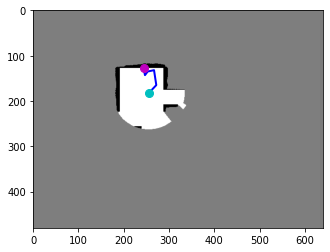

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5146, 0.2234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5146, 0.2234]), 'reward': tensor([-10.]), 'action': tensor([-0.0960, -0.4816])}
terminal True


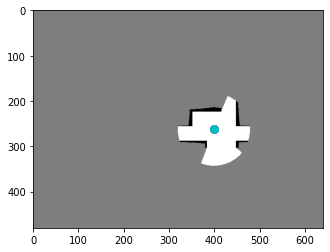

reward -13.200000047683716


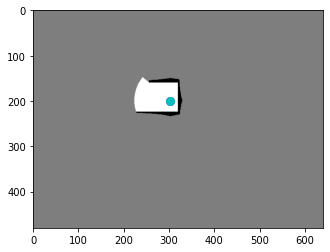

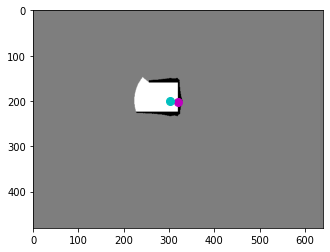

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6313, 0.3109]), 'reward': tensor([-10.]), 'action': tensor([0.5756, 0.0936])}
terminal True


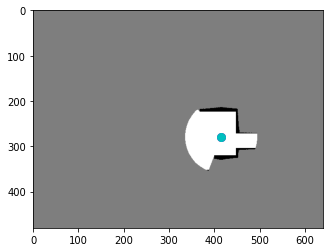

reward -10.0
step 2100
step 2200
avg iter time 0.7937496733665467


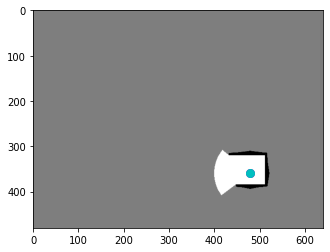

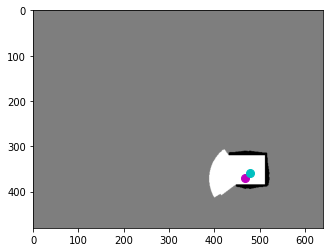

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9750, 0.5797]), 'reward': tensor([0.1437]), 'action': tensor([-0.1543,  0.1685])}
terminal False


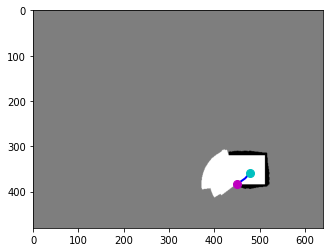

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9750, 0.5797]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9750, 0.5797]), 'reward': tensor([-10.]), 'action': tensor([-0.5095,  0.3860])}
terminal True


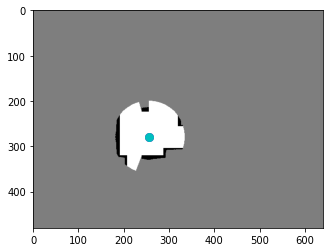

reward -9.856285721063614


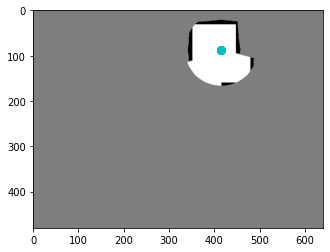

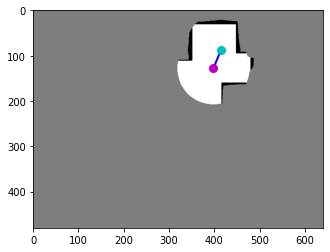

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8292, 0.2000]), 'reward': tensor([0.7384]), 'action': tensor([-0.2374,  0.5870])}
terminal False


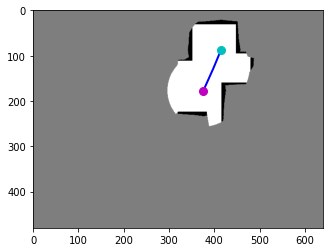

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8292, 0.2000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7833, 0.2766]), 'reward': tensor([0.7743]), 'action': tensor([-0.3107,  0.6937])}
terminal False


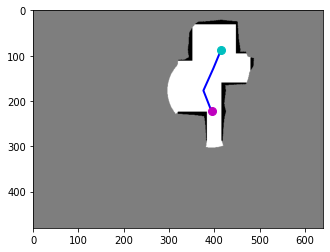

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7833, 0.2766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8208, 0.3484]), 'reward': tensor([0.2417]), 'action': tensor([0.2540, 0.6451])}
terminal False


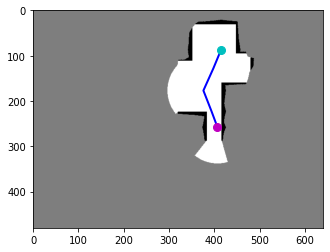

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8208, 0.3484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8479, 0.4031]), 'reward': tensor([0.2999]), 'action': tensor([0.1871, 0.4968])}
terminal False


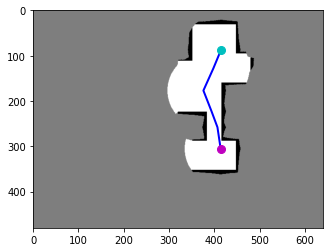

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8479, 0.4031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8625, 0.4766]), 'reward': tensor([0.6339]), 'action': tensor([0.0985, 0.6657])}
terminal False


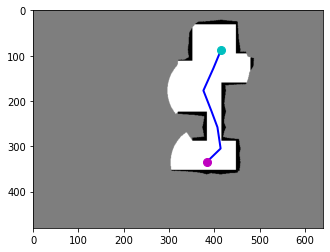

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8625, 0.4766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.5234]), 'reward': tensor([0.3240]), 'action': tensor([-0.4424,  0.4239])}
terminal False


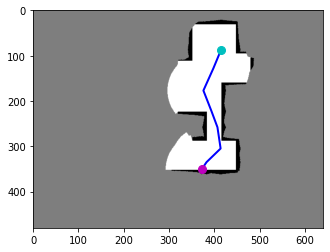

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.5234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.5234]), 'reward': tensor([-10.]), 'action': tensor([-0.2371,  0.3485])}
terminal True


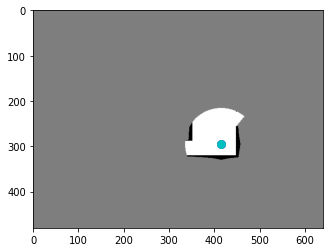

reward -6.9878571182489395


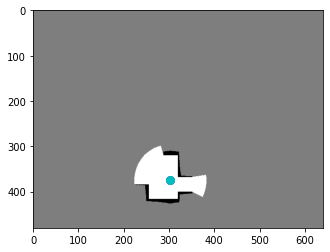

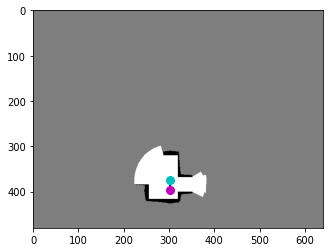

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6292, 0.6203]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0104,  0.3120])}
terminal False


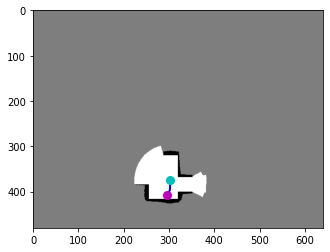

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6292, 0.6203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6167, 0.6359]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0782,  0.1469])}
terminal False


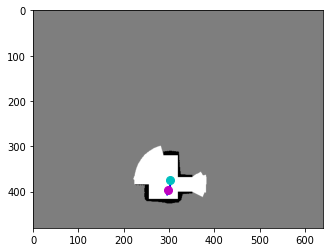

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6167, 0.6359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6187, 0.6187]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0163, -0.1614])}
terminal False


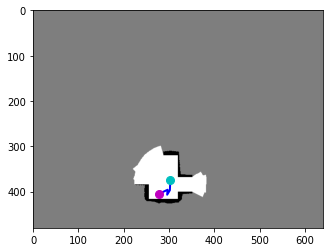

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6187, 0.6187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5792, 0.6328]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2730,  0.1309])}
terminal False


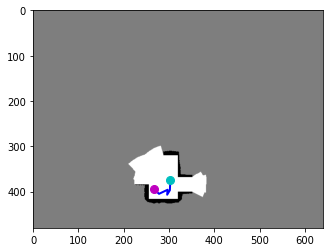

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5792, 0.6328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5562, 0.6172]), 'reward': tensor([0.0577]), 'action': tensor([-0.1569, -0.1348])}
terminal False


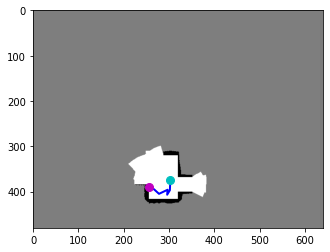

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5562, 0.6172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5562, 0.6172]), 'reward': tensor([-10.]), 'action': tensor([-0.3707, -0.1841])}
terminal True


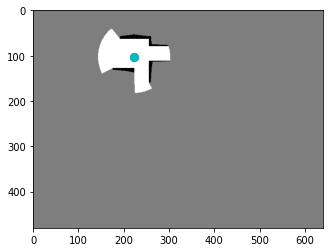

reward -13.142285760492086


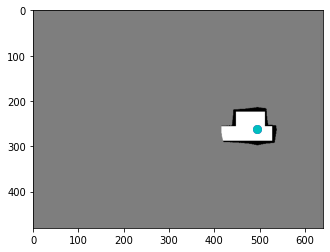

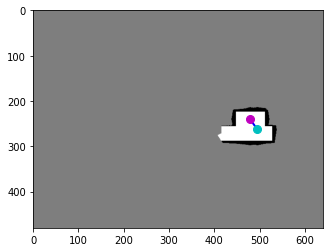

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9979, 0.3750]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2289, -0.3272])}
terminal False


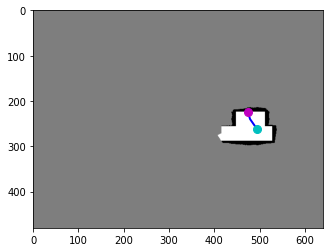

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.3750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9875, 0.3500]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0727, -0.2270])}
terminal False


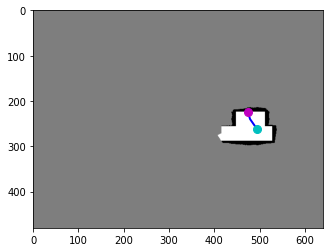

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9875, 0.3500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9875, 0.3500]), 'reward': tensor([-10.]), 'action': tensor([-0.1574, -0.2560])}
terminal True


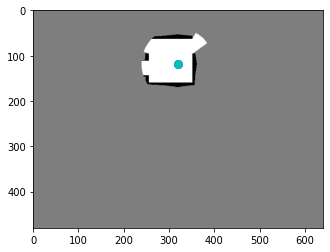

reward -11.600000023841858


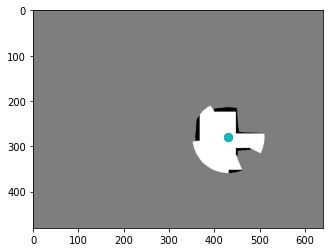

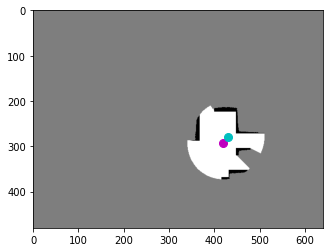

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8750, 0.4578]), 'reward': tensor([0.3321]), 'action': tensor([-0.1566,  0.1994])}
terminal False


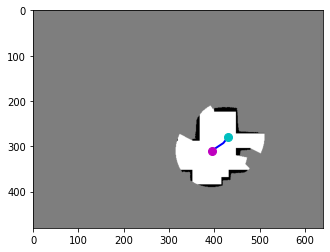

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8750, 0.4578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8208, 0.4844]), 'reward': tensor([0.5277]), 'action': tensor([-0.3712,  0.2402])}
terminal False


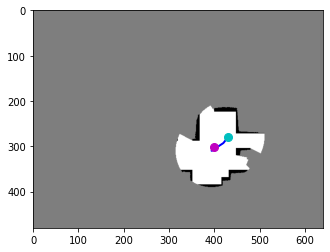

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8208, 0.4844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8333, 0.4719]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0363, -0.0488])}
terminal False


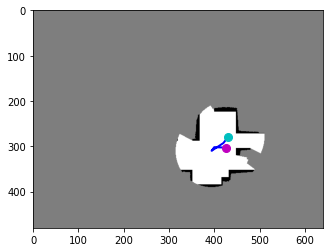

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8333, 0.4719]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8854, 0.4734]), 'reward': tensor([-0.8000]), 'action': tensor([0.3500, 0.0202])}
terminal False


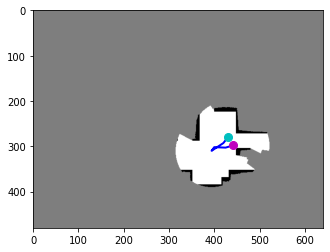

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8854, 0.4734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9208, 0.4656]), 'reward': tensor([0.0600]), 'action': tensor([ 0.2430, -0.0739])}
terminal False


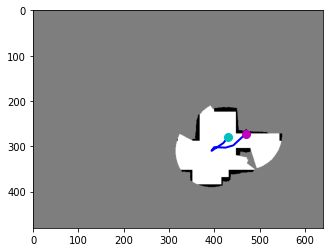

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9208, 0.4656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9208, 0.4656]), 'reward': tensor([-10.]), 'action': tensor([ 0.4752, -0.4475])}
terminal True


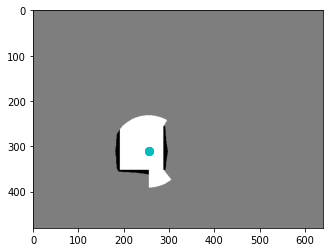

reward -10.680142853409052
step 2200
step 2300
avg iter time 0.794961764605149


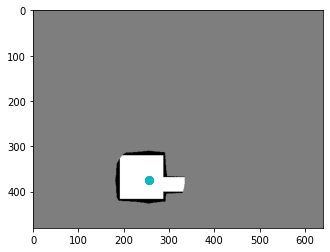

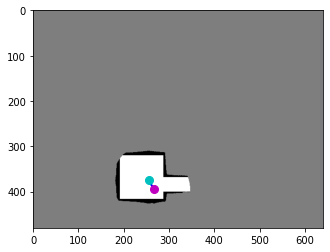

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5562, 0.6172]), 'reward': tensor([0.0530]), 'action': tensor([0.1650, 0.2829])}
terminal False


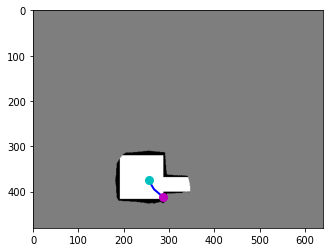

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5562, 0.6172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5562, 0.6172]), 'reward': tensor([-10.]), 'action': tensor([0.3811, 0.3253])}
terminal True


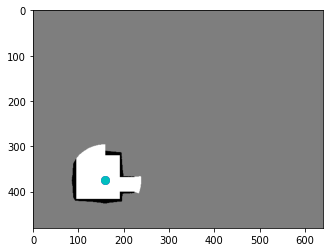

reward -9.947000000625849


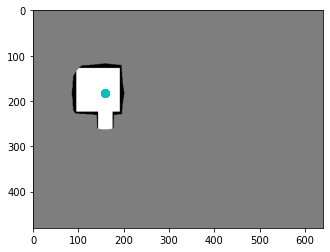

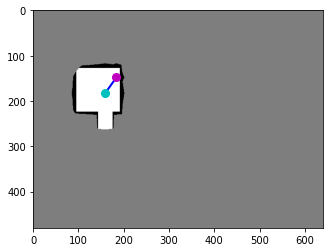

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3833, 0.2313]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3481, -0.4903])}
terminal False


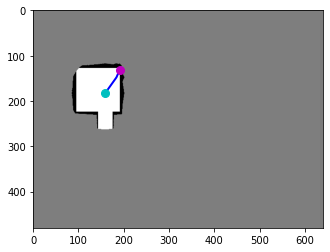

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3833, 0.2313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3833, 0.2313]), 'reward': tensor([-10.]), 'action': tensor([ 0.2231, -0.4772])}
terminal True


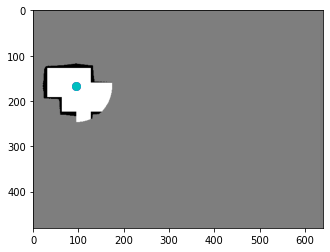

reward -10.800000011920929


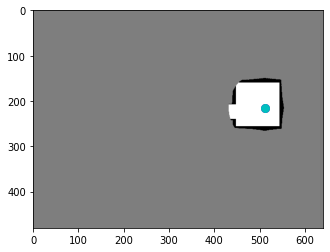

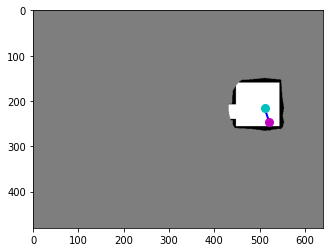

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0854, 0.3844]), 'reward': tensor([-0.8000]), 'action': tensor([0.1483, 0.4436])}
terminal False


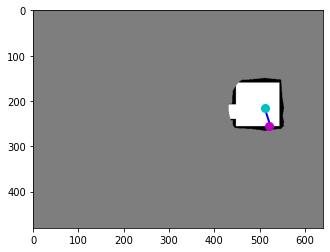

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0854, 0.3844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0854, 0.3844]), 'reward': tensor([-10.]), 'action': tensor([0.0085, 0.4708])}
terminal True


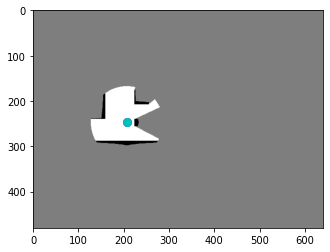

reward -10.800000011920929


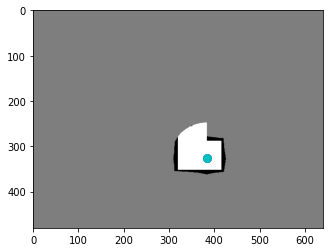

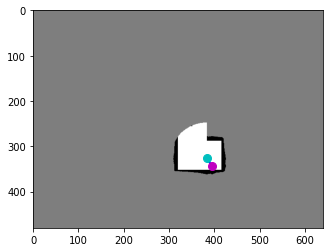

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8229, 0.5359]), 'reward': tensor([-0.8000]), 'action': tensor([0.1750, 0.2210])}
terminal False


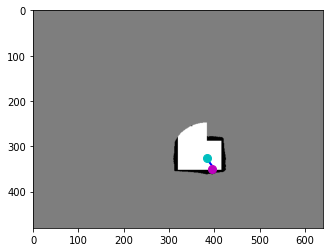

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8229, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8229, 0.5359]), 'reward': tensor([-10.]), 'action': tensor([0.0065, 0.1126])}
terminal True


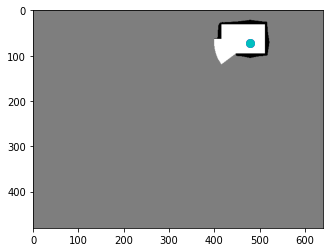

reward -10.800000011920929


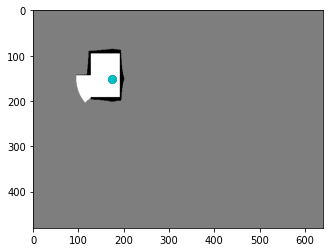

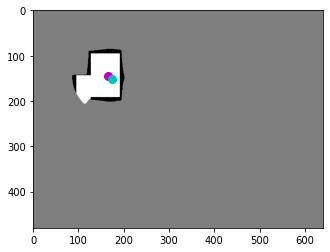

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3458, 0.2281]), 'reward': tensor([0.0310]), 'action': tensor([-0.0698, -0.0394])}
terminal False


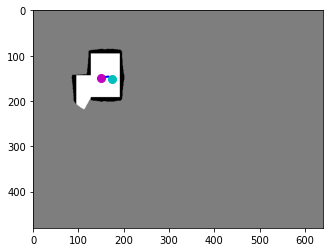

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3458, 0.2281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3146, 0.2328]), 'reward': tensor([0.0540]), 'action': tensor([-0.2071,  0.0375])}
terminal False


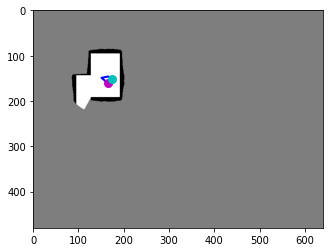

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3146, 0.2328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3458, 0.2516]), 'reward': tensor([-0.8000]), 'action': tensor([0.2061, 0.1689])}
terminal False


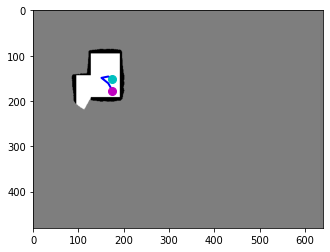

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3458, 0.2516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3646, 0.2766]), 'reward': tensor([-0.8000]), 'action': tensor([0.1270, 0.2258])}
terminal False


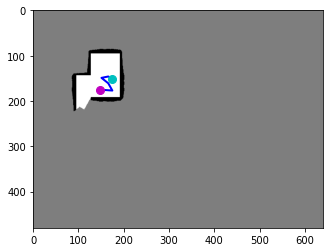

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.2766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3063, 0.2734]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3981, -0.0248])}
terminal False


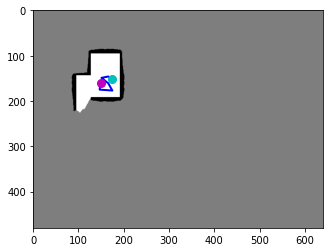

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3063, 0.2734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3104, 0.2500]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0261, -0.2151])}
terminal False


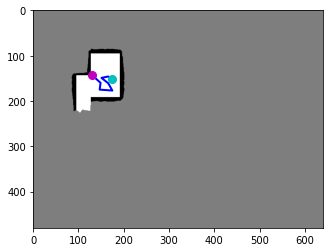

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3104, 0.2500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2688, 0.2219]), 'reward': tensor([0.0307]), 'action': tensor([-0.2837, -0.2553])}
terminal False


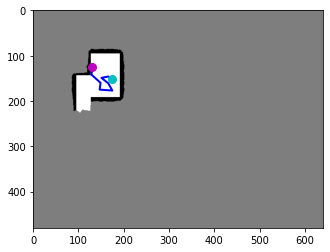

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2688, 0.2219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2729, 0.1953]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0236, -0.2429])}
terminal False


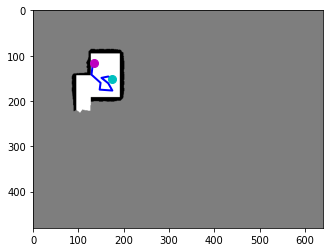

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2729, 0.1953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2792, 0.1813]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0396, -0.1150])}
terminal False


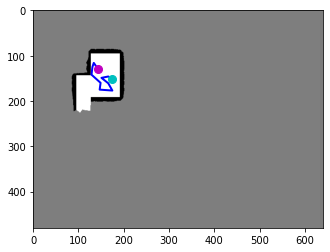

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2792, 0.1813]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2979, 0.2016]), 'reward': tensor([-0.8000]), 'action': tensor([0.1330, 0.1813])}
terminal False


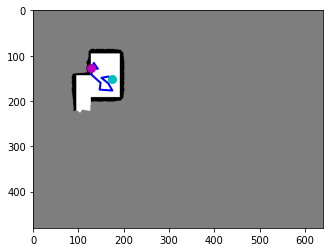

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.2016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2979, 0.2016]), 'reward': tensor([-10.]), 'action': tensor([-0.2440, -0.0107])}
terminal True


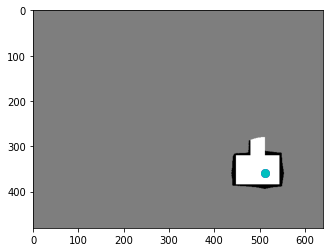

reward -15.484285796061158
step 2300
step 2400
avg iter time 0.7958225059509277


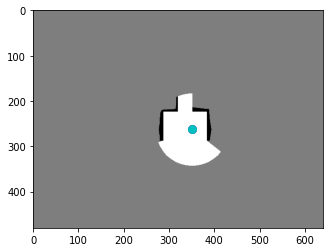

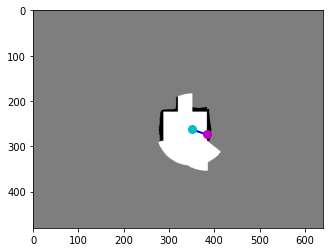

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7312, 0.4109]), 'reward': tensor([-10.]), 'action': tensor([0.6353, 0.2165])}
terminal True


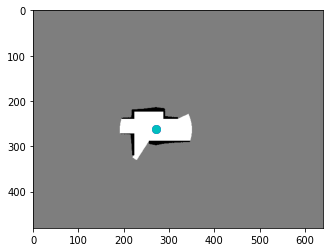

reward -10.0


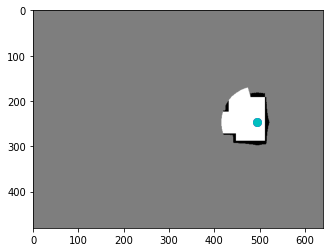

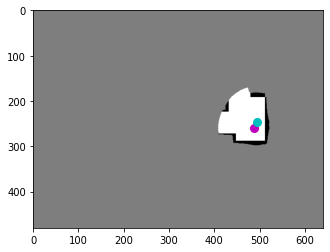

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0167, 0.4047]), 'reward': tensor([0.0437]), 'action': tensor([-0.0968,  0.1721])}
terminal False


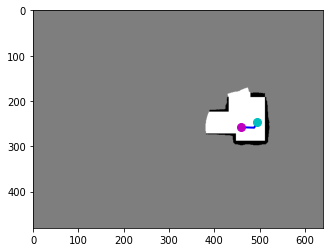

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0167, 0.4047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.4031]), 'reward': tensor([0.2164]), 'action': tensor([-0.3917, -0.0101])}
terminal False


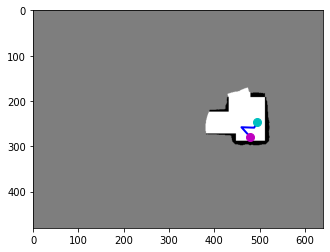

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.4031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9979, 0.4359]), 'reward': tensor([-0.8000]), 'action': tensor([0.2645, 0.3040])}
terminal False


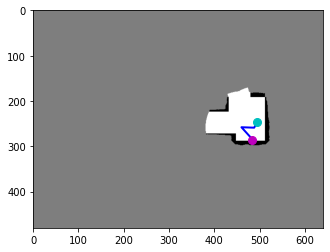

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9979, 0.4359]), 'reward': tensor([-10.]), 'action': tensor([0.0536, 0.1115])}
terminal True


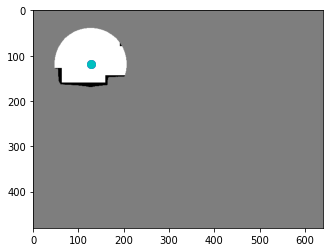

reward -10.539857149124146


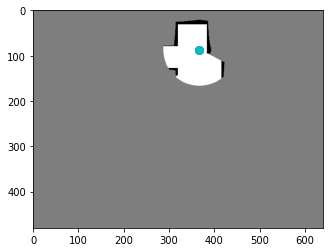

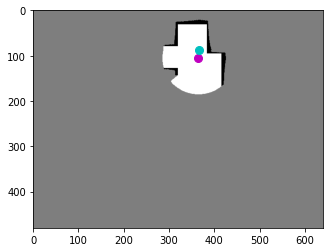

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7604, 0.1656]), 'reward': tensor([0.3539]), 'action': tensor([-0.0313,  0.2713])}
terminal False


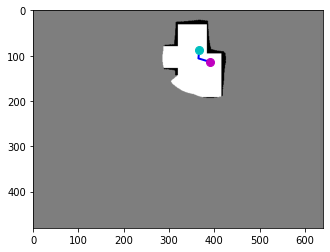

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7604, 0.1656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8146, 0.1781]), 'reward': tensor([0.0847]), 'action': tensor([0.3725, 0.1162])}
terminal False


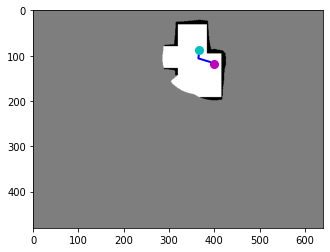

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8146, 0.1781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8333, 0.1859]), 'reward': tensor([-0.8000]), 'action': tensor([0.0670, 0.0344])}
terminal False


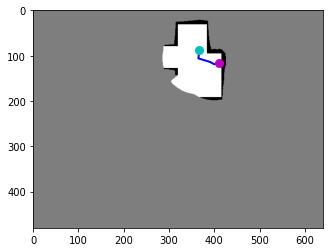

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8333, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.1813]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1495, -0.0441])}
terminal False


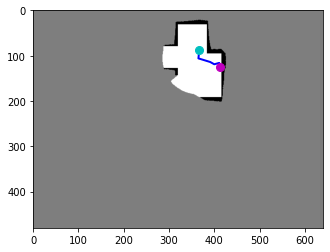

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8562, 0.1813]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8604, 0.1969]), 'reward': tensor([-0.8000]), 'action': tensor([0.0173, 0.0951])}
terminal False


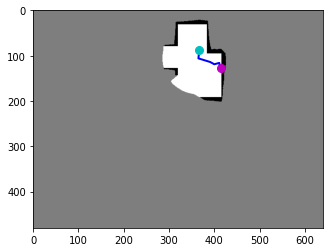

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8604, 0.1969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8604, 0.1969]), 'reward': tensor([-10.]), 'action': tensor([0.1230, 0.0614])}
terminal True


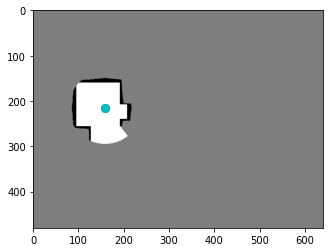

reward -11.961428619921207


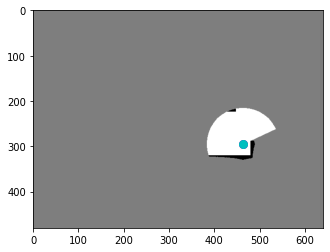

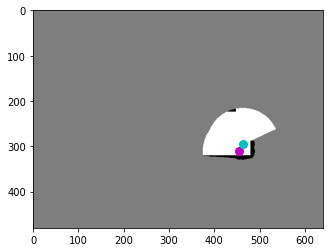

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9458, 0.4859]), 'reward': tensor([0.0524]), 'action': tensor([-0.1281,  0.2265])}
terminal False


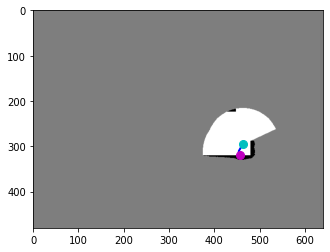

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9458, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9458, 0.4859]), 'reward': tensor([-10.]), 'action': tensor([0.0754, 0.3781])}
terminal True


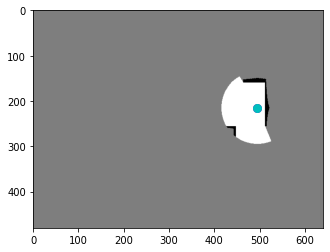

reward -9.94757143035531


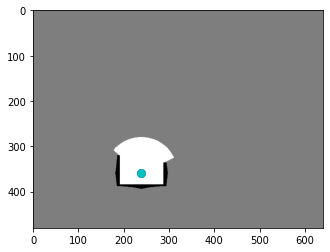

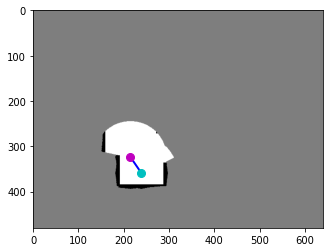

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4479, 0.5063]), 'reward': tensor([0.6636]), 'action': tensor([-0.3330, -0.5010])}
terminal False


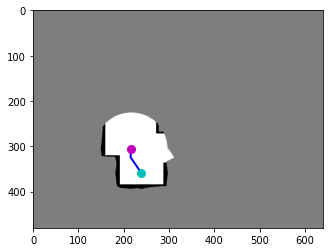

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4479, 0.5063]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4521, 0.4766]), 'reward': tensor([0.3563]), 'action': tensor([ 0.0326, -0.2623])}
terminal False


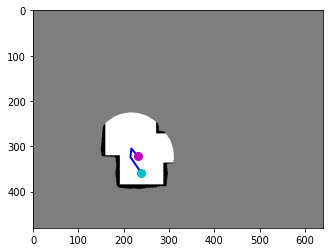

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4521, 0.4766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4812, 0.5031]), 'reward': tensor([0.0676]), 'action': tensor([0.2006, 0.2455])}
terminal False


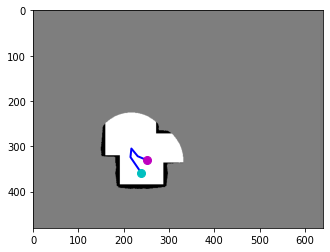

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4812, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5250, 0.5172]), 'reward': tensor([0.1650]), 'action': tensor([0.2955, 0.1323])}
terminal False


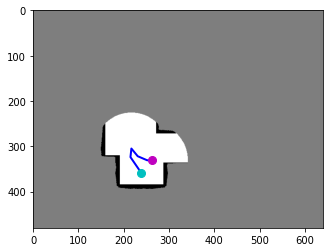

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5250, 0.5172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5458, 0.5156]), 'reward': tensor([0.0951]), 'action': tensor([ 0.1360, -0.0187])}
terminal False


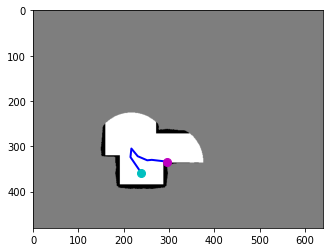

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5458, 0.5156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6167, 0.5219]), 'reward': tensor([0.2951]), 'action': tensor([0.4764, 0.0594])}
terminal False


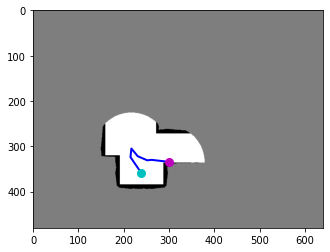

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6167, 0.5219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6167, 0.5219]), 'reward': tensor([-10.]), 'action': tensor([0.3053, 0.1617])}
terminal True


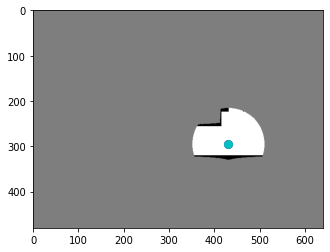

reward -8.35728570818901
step 2400
step 2500
avg iter time 0.797554650592804


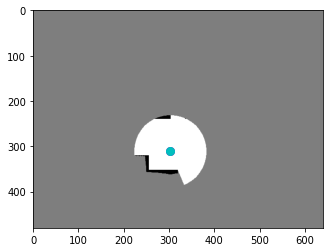

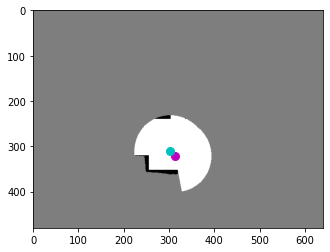

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6542, 0.5016]), 'reward': tensor([0.2840]), 'action': tensor([0.1487, 0.1472])}
terminal False


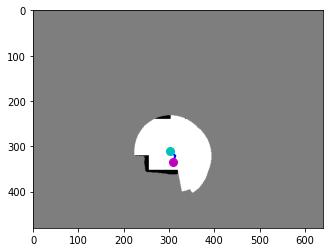

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6542, 0.5016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6438, 0.5234]), 'reward': tensor([0.0439]), 'action': tensor([-0.0718,  0.1982])}
terminal False


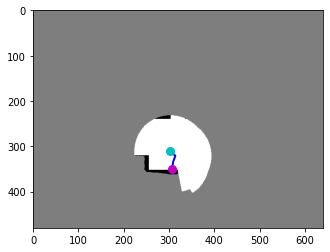

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6438, 0.5234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6438, 0.5234]), 'reward': tensor([-10.]), 'action': tensor([-0.0438,  0.3018])}
terminal True


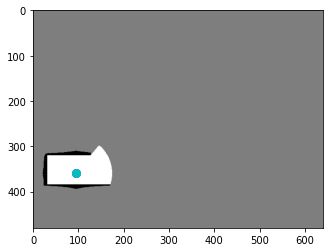

reward -9.67214284837246


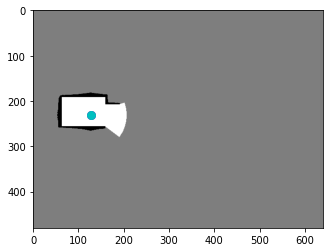

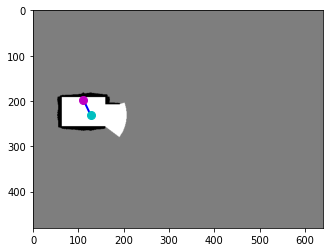

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2313, 0.3078]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2323, -0.4801])}
terminal False


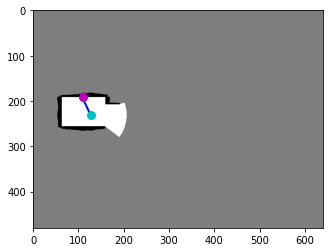

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.3078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2313, 0.3078]), 'reward': tensor([-10.]), 'action': tensor([-0.0479, -0.5001])}
terminal True


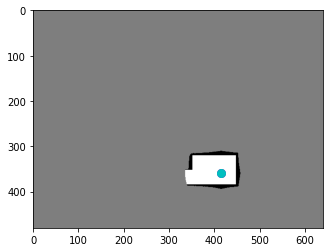

reward -10.800000011920929


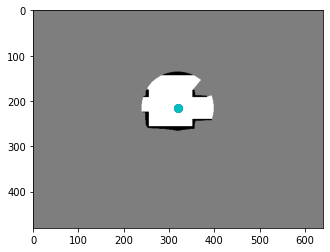

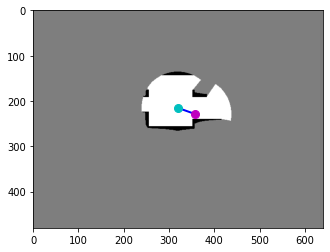

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7458, 0.3578]), 'reward': tensor([0.3651]), 'action': tensor([0.5465, 0.1947])}
terminal False


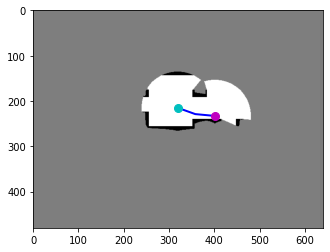

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7458, 0.3578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8354, 0.3641]), 'reward': tensor([0.5820]), 'action': tensor([0.6096, 0.0626])}
terminal False


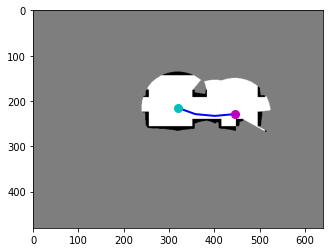

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8354, 0.3641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9271, 0.3578]), 'reward': tensor([0.5691]), 'action': tensor([ 0.6227, -0.0532])}
terminal False


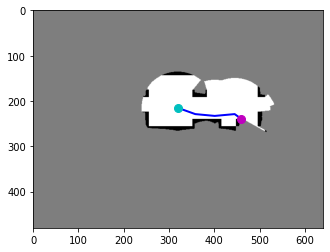

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9271, 0.3578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9271, 0.3578]), 'reward': tensor([-10.]), 'action': tensor([0.3846, 0.2887])}
terminal True


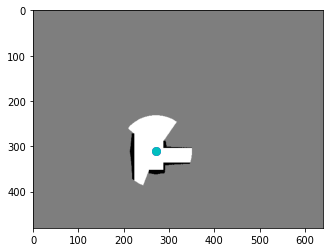

reward -8.483714252710342


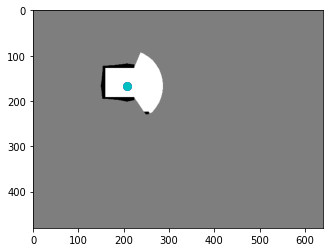

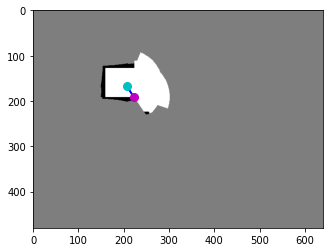

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4313, 0.2609]), 'reward': tensor([-10.]), 'action': tensor([0.2293, 0.3733])}
terminal True


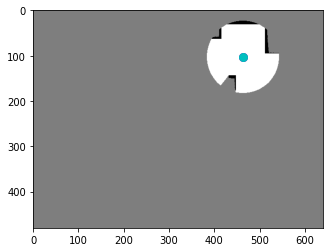

reward -10.0


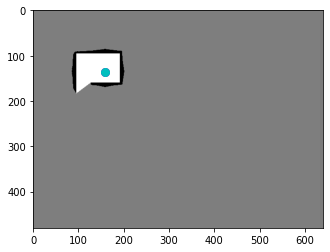

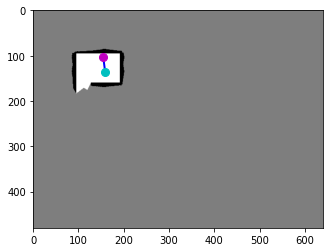

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3229, 0.1625]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0624, -0.4355])}
terminal False


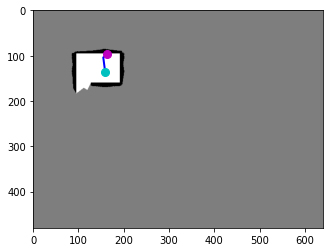

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3229, 0.1625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3229, 0.1625]), 'reward': tensor([-10.]), 'action': tensor([ 0.3979, -0.3656])}
terminal True


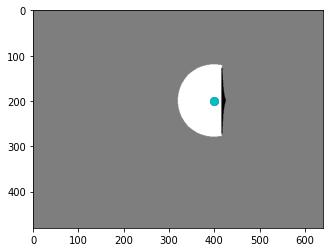

reward -10.800000011920929
step 2500
CRITIC


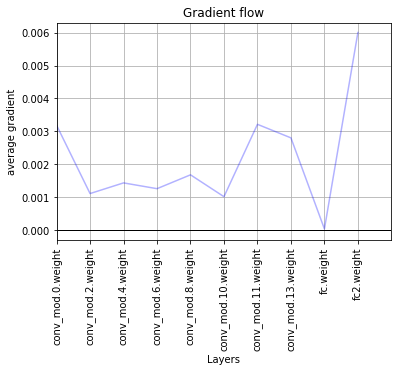

ACTOR


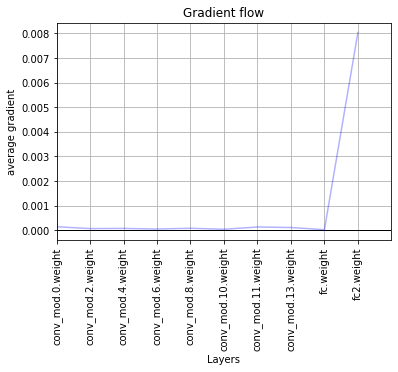

step 2600
avg iter time 0.797993837411587


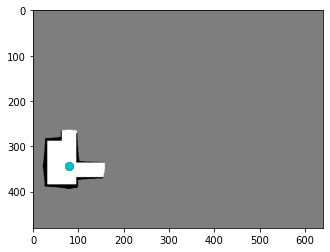

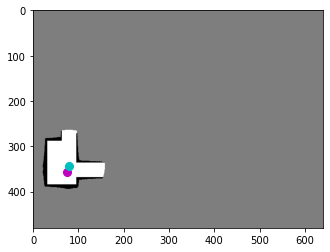

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1562, 0.5562]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0618,  0.1819])}
terminal False


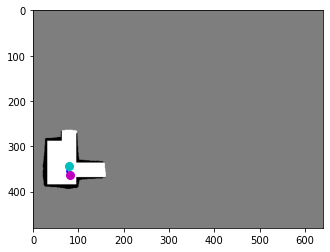

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1562, 0.5562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1688, 0.5688]), 'reward': tensor([-0.8000]), 'action': tensor([0.0719, 0.0910])}
terminal False


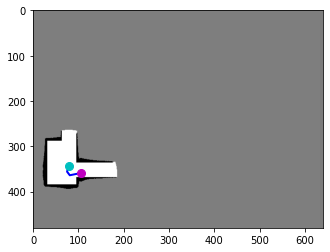

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1688, 0.5688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2208, 0.5609]), 'reward': tensor([0.1161]), 'action': tensor([ 0.3602, -0.0662])}
terminal False


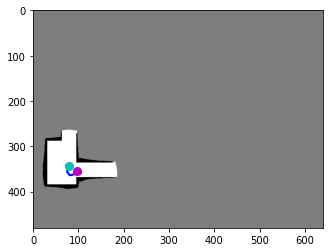

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2208, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2021, 0.5547]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1117, -0.0556])}
terminal False


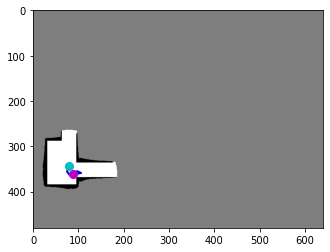

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2021, 0.5547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1854, 0.5641]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0920,  0.0621])}
terminal False


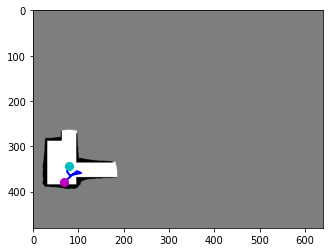

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1854, 0.5641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1437, 0.5922]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2769,  0.2561])}
terminal False


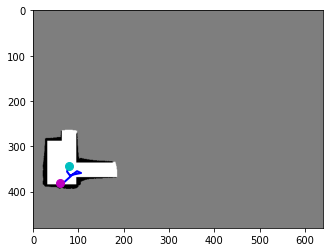

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1437, 0.5922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1229, 0.5953]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1219,  0.0273])}
terminal False


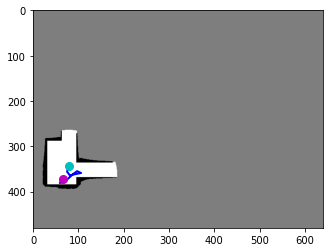

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1229, 0.5953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1354, 0.5828]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0288, -0.0355])}
terminal False


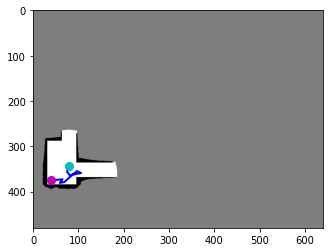

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1354, 0.5828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.0833, 0.5859]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3557,  0.0243])}
terminal False


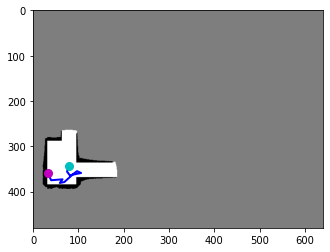

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.0833, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.0833, 0.5859]), 'reward': tensor([-10.]), 'action': tensor([-0.2327, -0.4299])}
terminal True


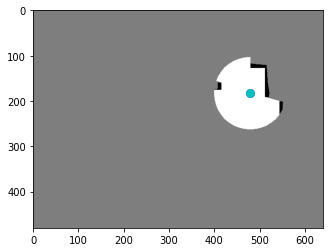

reward -16.283857241272926


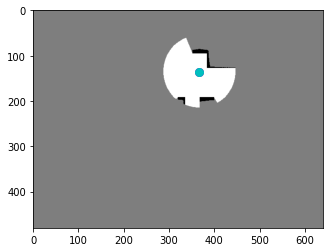

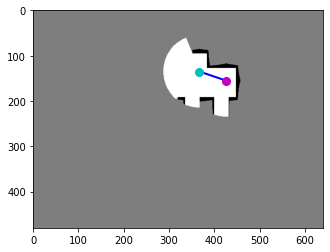

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8875, 0.2422]), 'reward': tensor([0.2343]), 'action': tensor([0.8371, 0.2854])}
terminal False


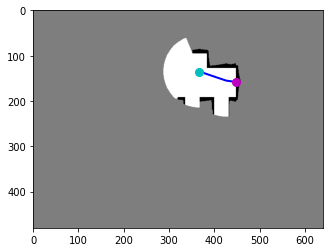

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8875, 0.2422]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8875, 0.2422]), 'reward': tensor([-10.]), 'action': tensor([0.6575, 0.0983])}
terminal True


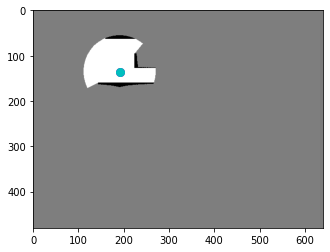

reward -9.765714287757874


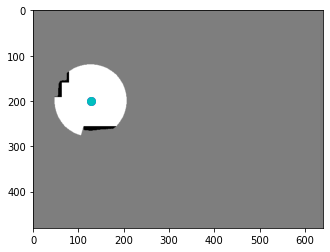

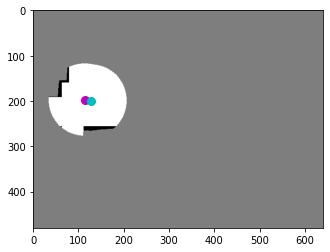

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2375, 0.3078]), 'reward': tensor([0.1794]), 'action': tensor([-0.1787, -0.0291])}
terminal False


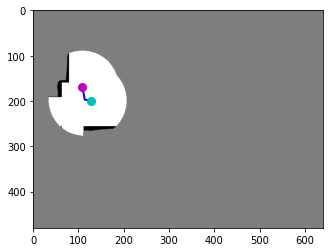

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2375, 0.3078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2271, 0.2641]), 'reward': tensor([0.3471]), 'action': tensor([-0.0767, -0.4001])}
terminal False


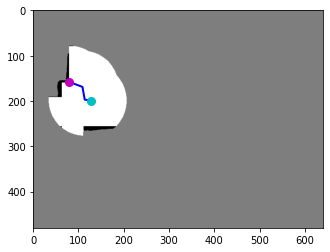

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2271, 0.2641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2271, 0.2641]), 'reward': tensor([-10.]), 'action': tensor([-0.4914, -0.1818])}
terminal True


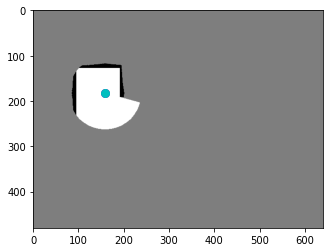

reward -9.473428577184677


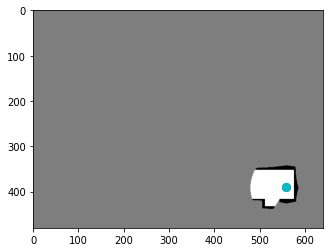

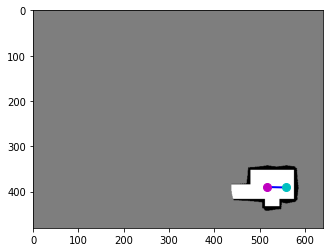

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0771, 0.6094]), 'reward': tensor([0.2204]), 'action': tensor([-0.5994, -0.0175])}
terminal False


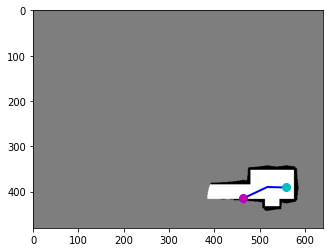

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0771, 0.6094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0771, 0.6094]), 'reward': tensor([-10.]), 'action': tensor([-0.7647,  0.3725])}
terminal True


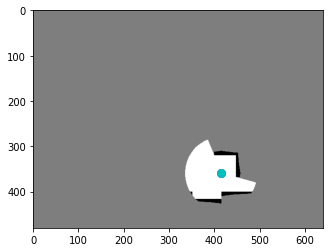

reward -9.779571428894997


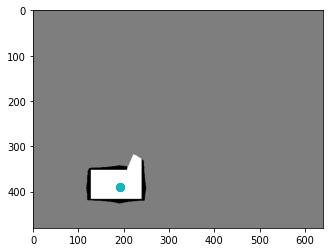

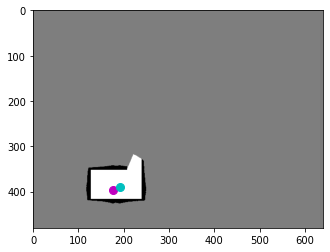

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3667, 0.6187]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2125,  0.0778])}
terminal False


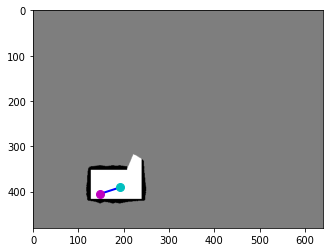

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3667, 0.6187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3083, 0.6328]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3981,  0.1259])}
terminal False


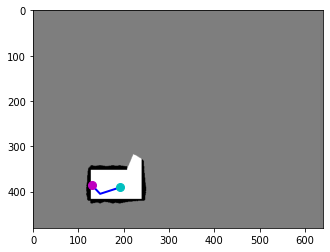

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3083, 0.6328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2688, 0.6016]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2656, -0.2847])}
terminal False


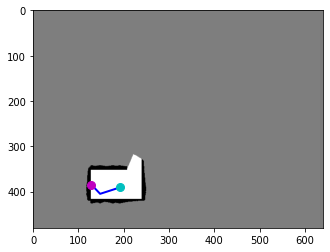

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2688, 0.6016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2688, 0.6016]), 'reward': tensor([-10.]), 'action': tensor([-0.4144, -0.0623])}
terminal True


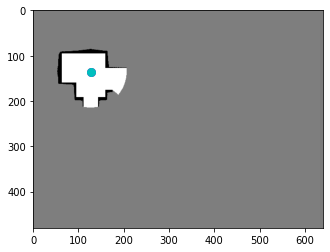

reward -12.400000035762787
step 2600
step 2700
avg iter time 0.798108106719123


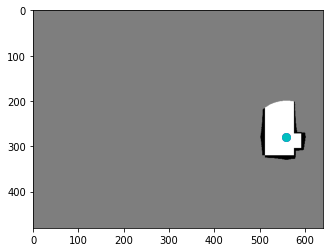

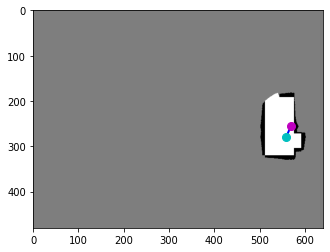

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1854, 0.4000]), 'reward': tensor([0.1173]), 'action': tensor([ 0.1442, -0.3277])}
terminal False


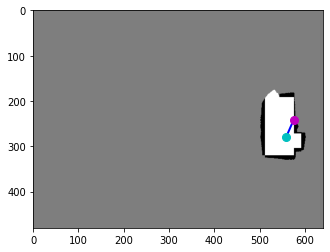

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1854, 0.4000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1979, 0.3781]), 'reward': tensor([0.0313]), 'action': tensor([ 0.0882, -0.2026])}
terminal False


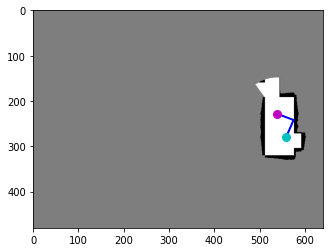

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1979, 0.3781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1208, 0.3562]), 'reward': tensor([0.2037]), 'action': tensor([-0.5182, -0.1951])}
terminal False


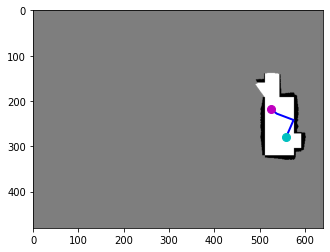

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1208, 0.3562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0938, 0.3406]), 'reward': tensor([0.0490]), 'action': tensor([-0.1827, -0.1380])}
terminal False


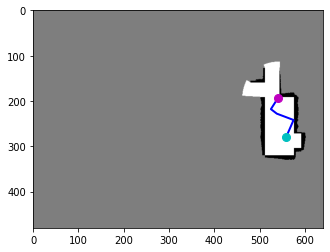

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0938, 0.3406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1271, 0.3016]), 'reward': tensor([0.2709]), 'action': tensor([ 0.2288, -0.3551])}
terminal False


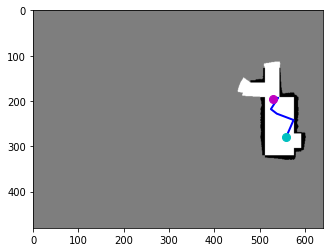

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1271, 0.3016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1021, 0.3047]), 'reward': tensor([0.0501]), 'action': tensor([-0.1643,  0.0281])}
terminal False


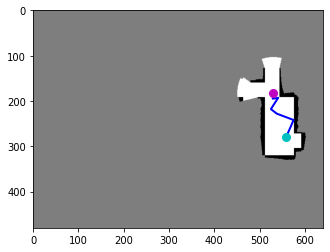

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1021, 0.3047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1042, 0.2859]), 'reward': tensor([0.1244]), 'action': tensor([ 0.0205, -0.1741])}
terminal False


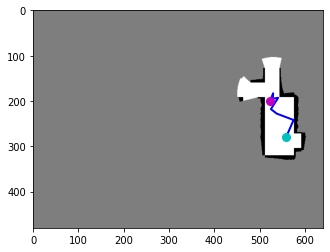

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1042, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0896, 0.3125]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1051,  0.2431])}
terminal False


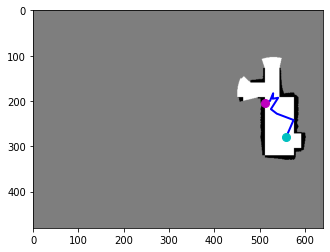

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0896, 0.3125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0896, 0.3125]), 'reward': tensor([-10.]), 'action': tensor([-0.1822,  0.0687])}
terminal True


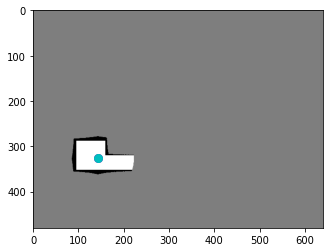

reward -9.953285720199347


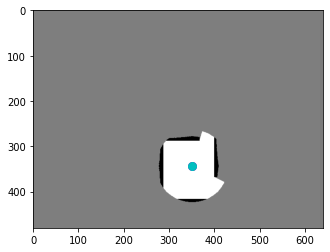

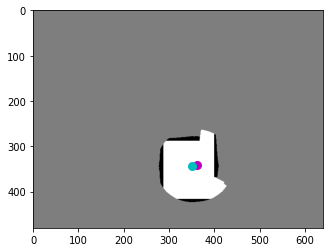

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7521, 0.5344]), 'reward': tensor([0.0646]), 'action': tensor([ 0.1213, -0.0098])}
terminal False


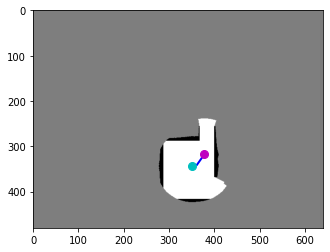

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7521, 0.5344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7875, 0.4969]), 'reward': tensor([0.1379]), 'action': tensor([ 0.2461, -0.3465])}
terminal False


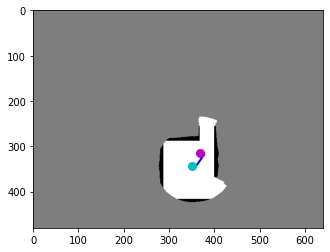

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7875, 0.4969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7688, 0.4906]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0669, -0.0321])}
terminal False


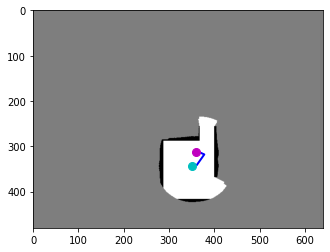

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7688, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7479, 0.4875]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0648, -0.0126])}
terminal False


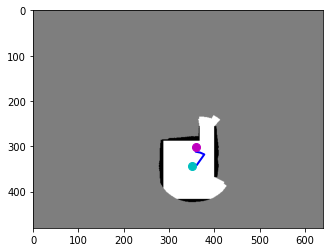

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7479, 0.4875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7500, 0.4703]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0117, -0.1521])}
terminal False


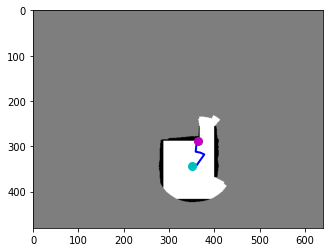

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7500, 0.4703]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7500, 0.4703]), 'reward': tensor([-10.]), 'action': tensor([ 0.0592, -0.2568])}
terminal True


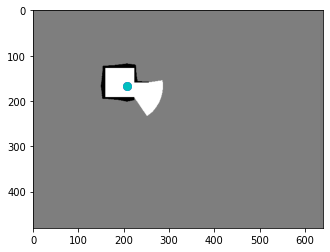

reward -12.197571471333504


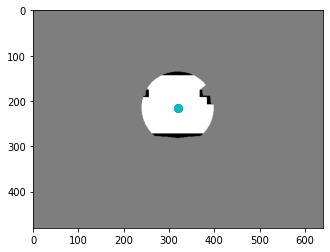

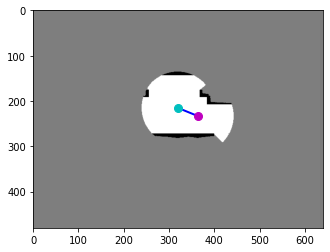

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7563, 0.3641]), 'reward': tensor([0.4887]), 'action': tensor([0.6237, 0.2553])}
terminal False


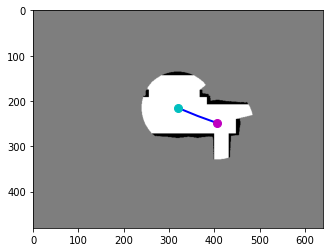

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7563, 0.3641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8479, 0.3891]), 'reward': tensor([0.4066]), 'action': tensor([0.6189, 0.2211])}
terminal False


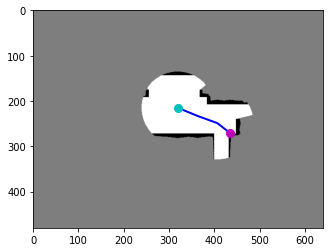

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8479, 0.3891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8479, 0.3891]), 'reward': tensor([-10.]), 'action': tensor([0.5905, 0.4754])}
terminal True


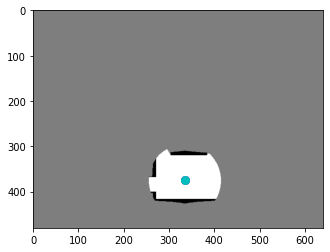

reward -9.104714304208755


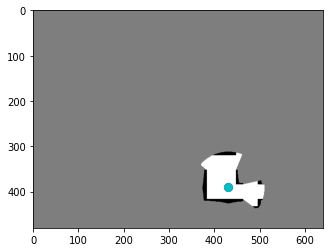

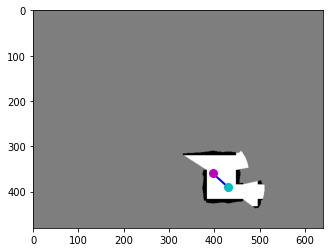

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8271, 0.5625]), 'reward': tensor([0.1771]), 'action': tensor([-0.4781, -0.4424])}
terminal False


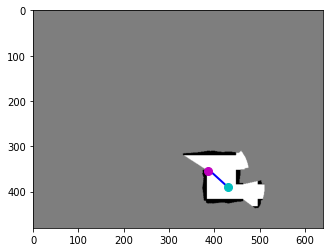

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8271, 0.5625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8062, 0.5531]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1430, -0.0803])}
terminal False


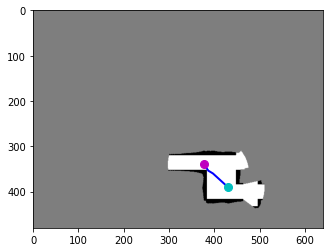

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8062, 0.5531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7854, 0.5312]), 'reward': tensor([0.2716]), 'action': tensor([-0.1421, -0.2025])}
terminal False


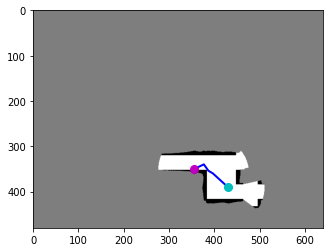

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7854, 0.5312]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.5469]), 'reward': tensor([0.0904]), 'action': tensor([-0.2936,  0.1455])}
terminal False


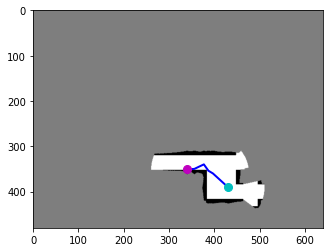

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7417, 0.5469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.5469]), 'reward': tensor([-10.]), 'action': tensor([-0.6161,  0.0601])}
terminal True


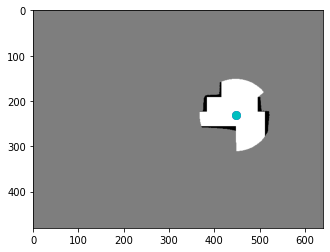

reward -10.260857157409191


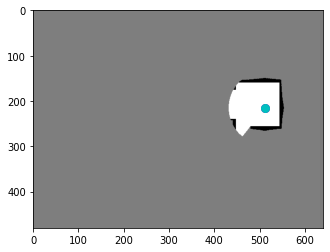

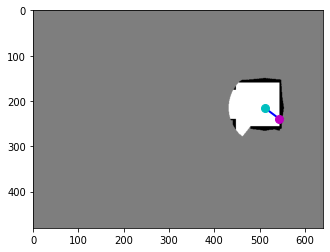

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0646, 0.3359]), 'reward': tensor([-10.]), 'action': tensor([0.4745, 0.3500])}
terminal True


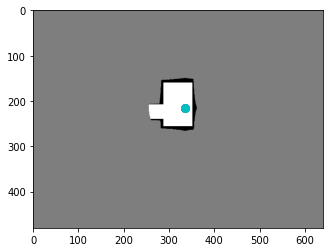

reward -10.0
step 2700
step 2800
avg iter time 0.8007465532847813


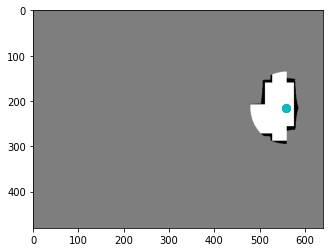

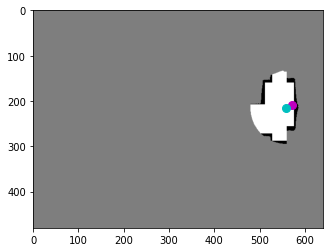

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1917, 0.3281]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1819, -0.0656])}
terminal False


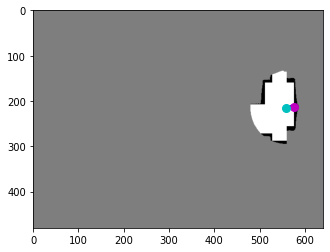

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1917, 0.3281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1917, 0.3281]), 'reward': tensor([-10.]), 'action': tensor([0.2311, 0.1738])}
terminal True


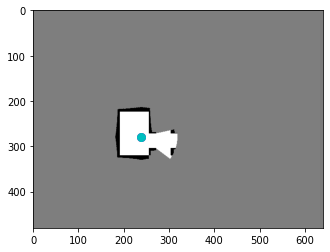

reward -10.800000011920929


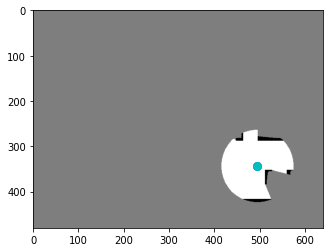

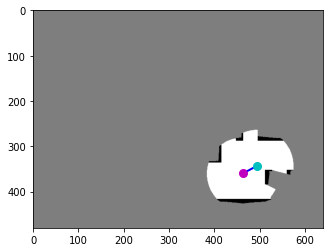

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9646, 0.5625]), 'reward': tensor([0.5303]), 'action': tensor([-0.4524,  0.2412])}
terminal False


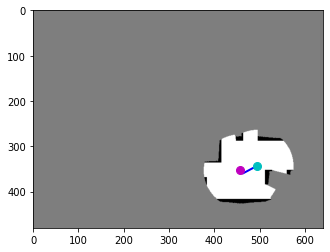

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.5625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9500, 0.5516]), 'reward': tensor([0.0916]), 'action': tensor([-0.0719, -0.0726])}
terminal False


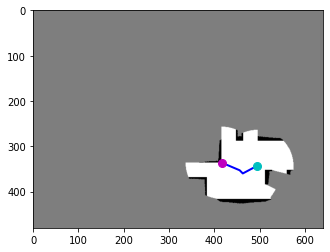

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9500, 0.5516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8667, 0.5250]), 'reward': tensor([0.2959]), 'action': tensor([-0.5693, -0.2390])}
terminal False


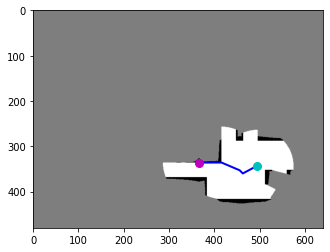

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8667, 0.5250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7625, 0.5250]), 'reward': tensor([0.2286]), 'action': tensor([-0.7041,  0.0061])}
terminal False


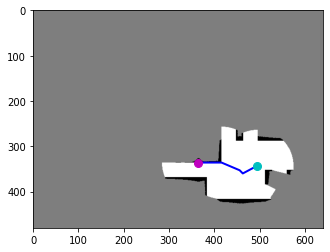

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7625, 0.5250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7625, 0.5250]), 'reward': tensor([-10.]), 'action': tensor([-0.5157, -0.1228])}
terminal True


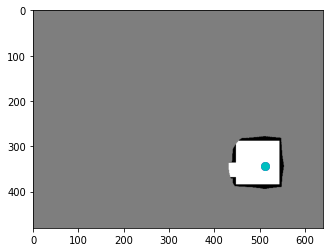

reward -8.853714294731617


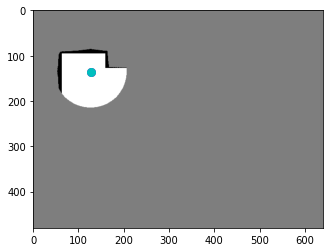

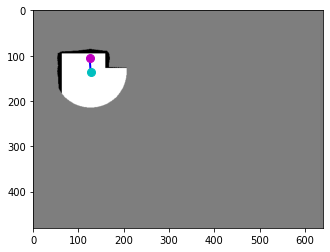

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2604, 0.1656]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0312, -0.4062])}
terminal False


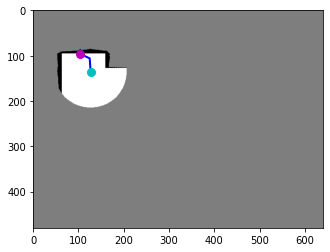

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2604, 0.1656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2604, 0.1656]), 'reward': tensor([-10.]), 'action': tensor([-0.4214, -0.2166])}
terminal True


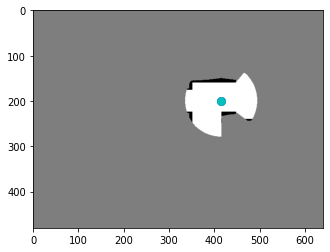

reward -10.800000011920929


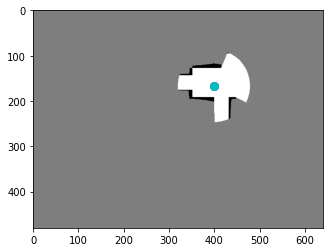

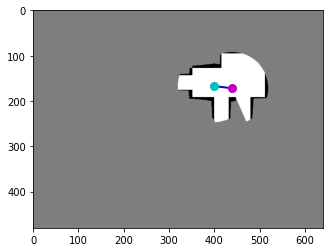

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8313, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9146, 0.2688]), 'reward': tensor([0.6390]), 'action': tensor([0.5695, 0.0650])}
terminal False


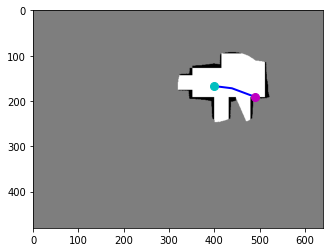

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9146, 0.2688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9146, 0.2688]), 'reward': tensor([-10.]), 'action': tensor([0.7381, 0.2785])}
terminal True


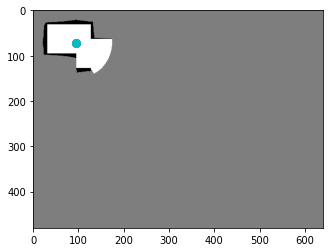

reward -9.361000001430511


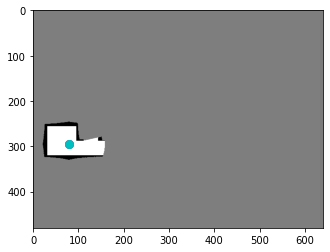

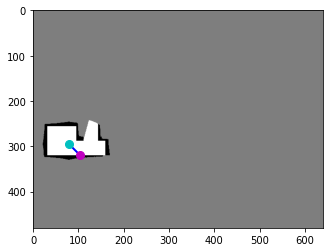

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2146, 0.4984]), 'reward': tensor([0.1530]), 'action': tensor([0.3362, 0.3390])}
terminal False


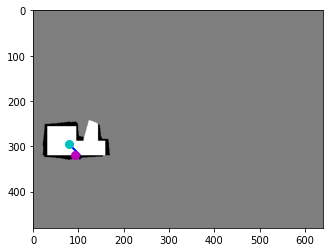

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2146, 0.4984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1937, 0.4984]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1478, -0.0060])}
terminal False


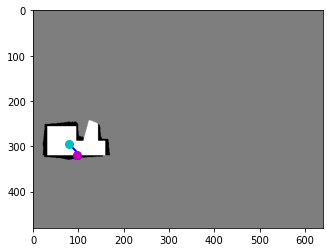

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1937, 0.4984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1937, 0.4984]), 'reward': tensor([-10.]), 'action': tensor([0.2290, 0.0324])}
terminal True


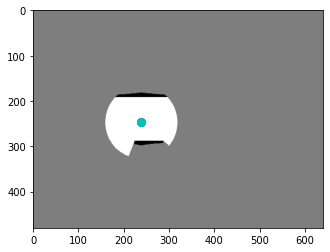

reward -10.647000014781952
step 2800
step 2900
avg iter time 0.8007156996069283


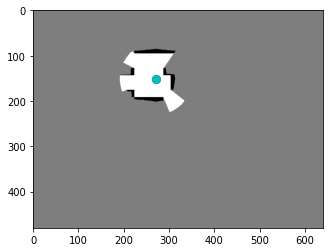

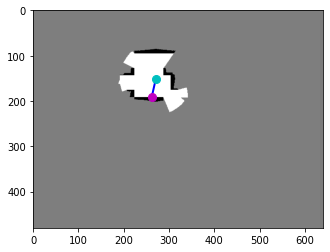

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.2359]), 'reward': tensor([-10.]), 'action': tensor([-0.1369,  0.6373])}
terminal True


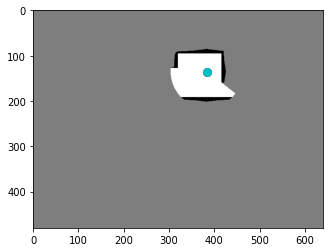

reward -10.0


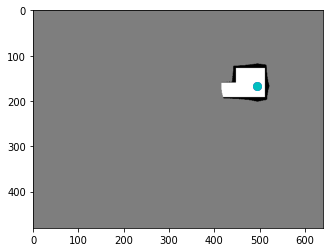

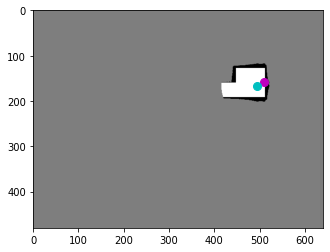

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0604, 0.2484]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1971, -0.1146])}
terminal False


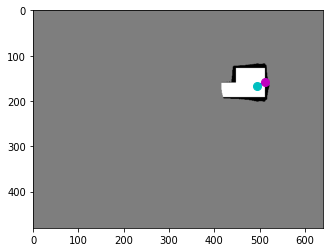

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0604, 0.2484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0604, 0.2484]), 'reward': tensor([-10.]), 'action': tensor([0.3340, 0.0055])}
terminal True


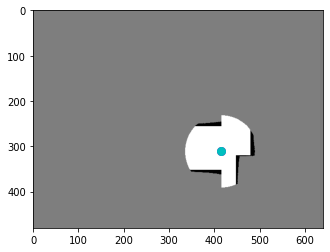

reward -10.800000011920929


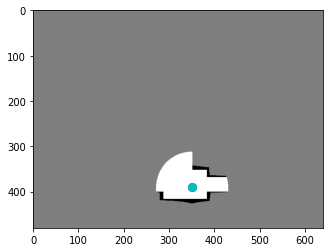

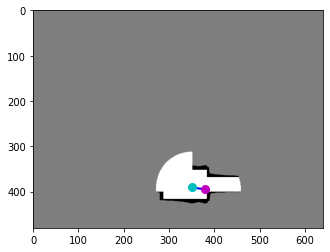

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7896, 0.6172]), 'reward': tensor([0.1256]), 'action': tensor([0.3977, 0.0564])}
terminal False


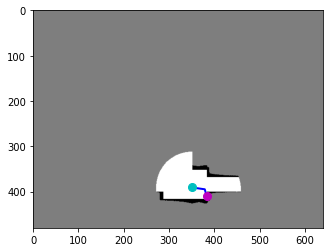

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7896, 0.6172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7896, 0.6172]), 'reward': tensor([-10.]), 'action': tensor([0.1443, 0.4333])}
terminal True


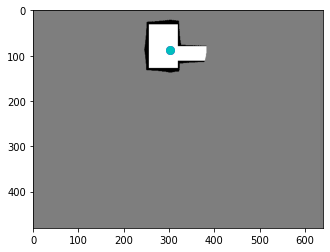

reward -9.874428570270538


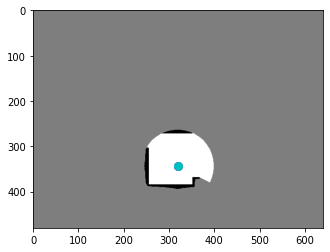

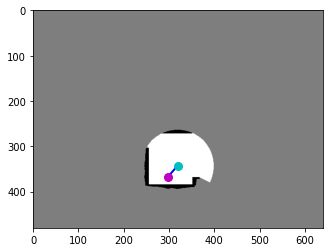

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6646, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6208, 0.5734]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3026,  0.3331])}
terminal False


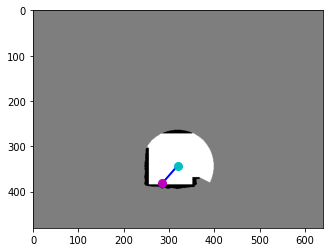

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6208, 0.5734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5938, 0.5969]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1881,  0.2090])}
terminal False


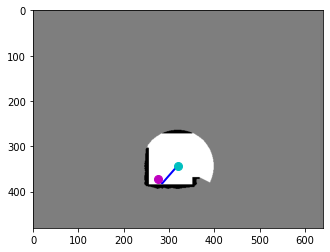

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5938, 0.5969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.5813]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1381, -0.1426])}
terminal False


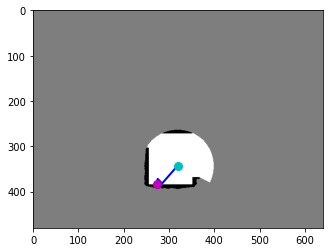

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5729, 0.5813]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.5813]), 'reward': tensor([-10.]), 'action': tensor([-0.0446,  0.2580])}
terminal True


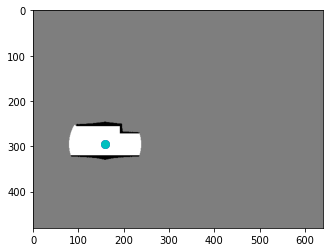

reward -12.400000035762787


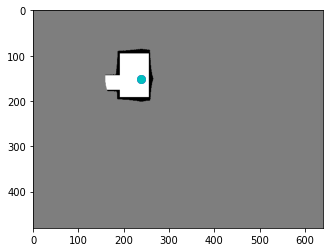

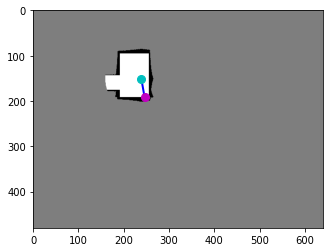

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4979, 0.2359]), 'reward': tensor([-10.]), 'action': tensor([0.1092, 0.6374])}
terminal True


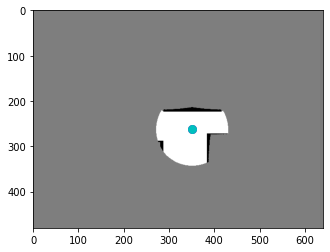

reward -10.0
step 2900
step 3000
avg iter time 0.7997630778948466


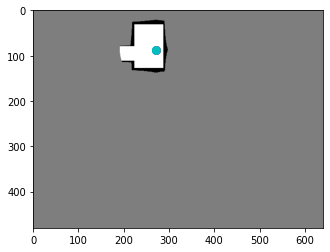

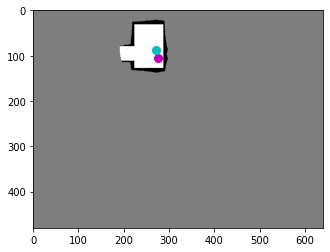

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.1656]), 'reward': tensor([-0.8000]), 'action': tensor([0.0632, 0.2733])}
terminal False


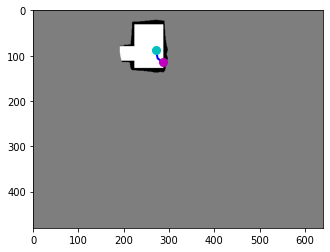

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5729, 0.1656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.1656]), 'reward': tensor([-10.]), 'action': tensor([0.2185, 0.1589])}
terminal True


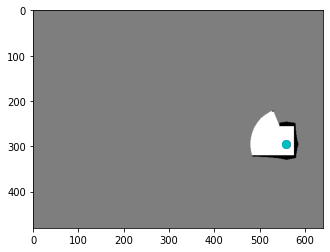

reward -10.800000011920929


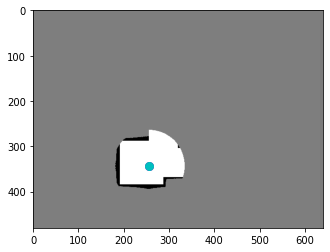

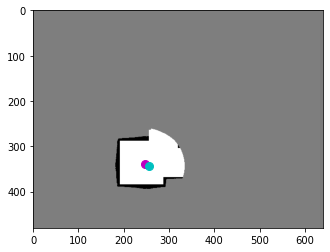

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5125, 0.5297]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0983, -0.0396])}
terminal False


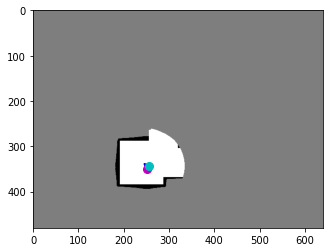

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5125, 0.5297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5229, 0.5484]), 'reward': tensor([-0.8000]), 'action': tensor([0.0722, 0.1636])}
terminal False


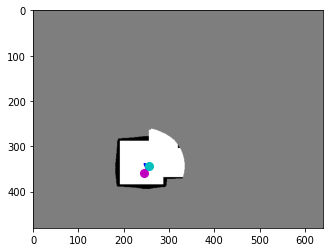

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5229, 0.5484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5083, 0.5594]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0335,  0.0377])}
terminal False


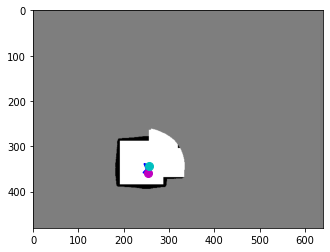

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5083, 0.5594]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5292, 0.5625]), 'reward': tensor([-0.8000]), 'action': tensor([0.1423, 0.0277])}
terminal False


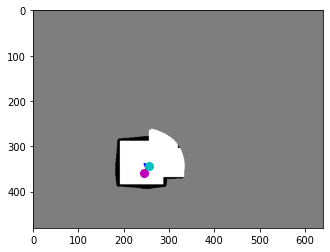

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5292, 0.5625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5083, 0.5625]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0820,  0.0037])}
terminal False


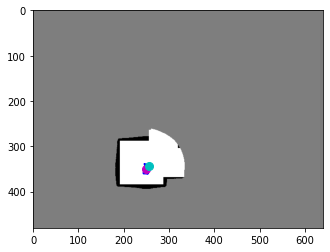

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5083, 0.5625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5188, 0.5484]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0303, -0.0546])}
terminal False


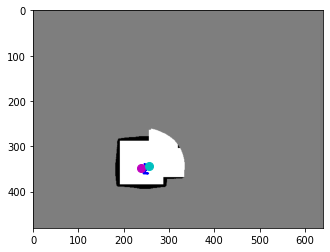

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5188, 0.5484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4979, 0.5437]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1366, -0.0494])}
terminal False


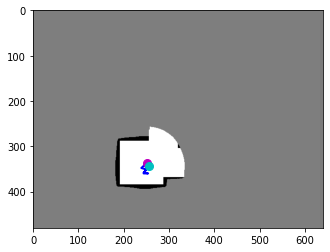

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.5437]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5250, 0.5250]), 'reward': tensor([0.0420]), 'action': tensor([ 0.1844, -0.1695])}
terminal False


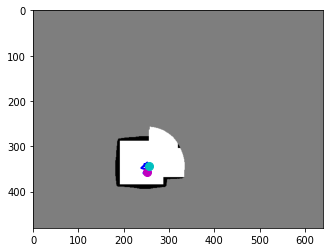

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5250, 0.5250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5229, 0.5562]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0135,  0.2848])}
terminal False


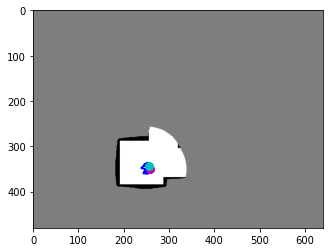

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5229, 0.5562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5396, 0.5469]), 'reward': tensor([0.0250]), 'action': tensor([ 0.1172, -0.0790])}
terminal False


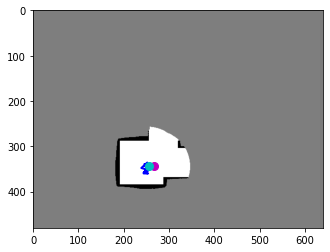

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5396, 0.5469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5562, 0.5375]), 'reward': tensor([0.0947]), 'action': tensor([ 0.0862, -0.0581])}
terminal False


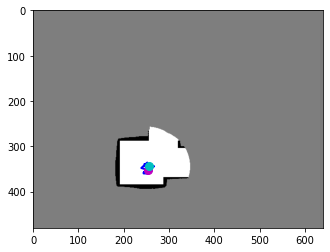

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5562, 0.5375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5292, 0.5516]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1888,  0.1285])}
terminal False


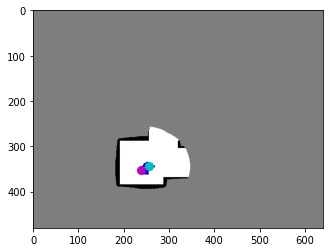

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5292, 0.5516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4979, 0.5500]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2148, -0.0133])}
terminal False


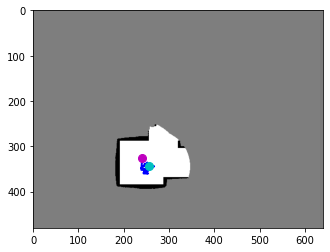

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.5500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5021, 0.5078]), 'reward': tensor([0.0207]), 'action': tensor([ 0.0334, -0.3838])}
terminal False


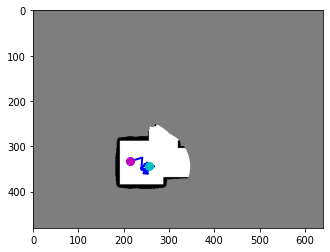

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5021, 0.5078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4479, 0.5203]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3710,  0.1167])}
terminal False


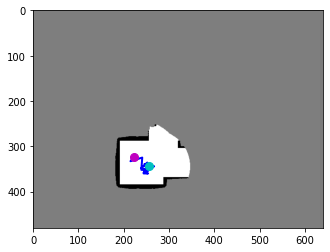

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4479, 0.5203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4646, 0.5047]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1159, -0.1457])}
terminal False


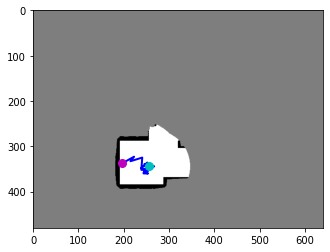

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.5047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4083, 0.5281]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3869,  0.2122])}
terminal False


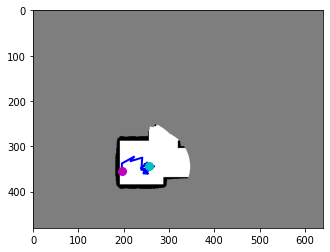

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4083, 0.5281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4083, 0.5531]), 'reward': tensor([-0.8000]), 'action': tensor([5.3575e-05, 2.2789e-01])}
terminal False


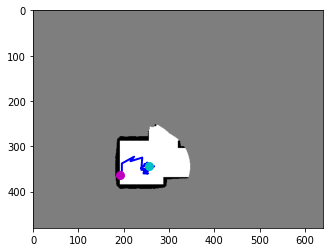

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4083, 0.5531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4083, 0.5531]), 'reward': tensor([-10.]), 'action': tensor([-0.2220,  0.4779])}
terminal True


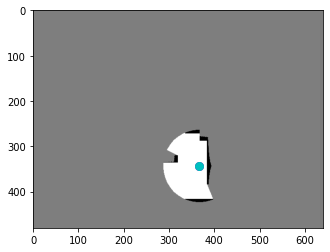

reward -21.017571598291397


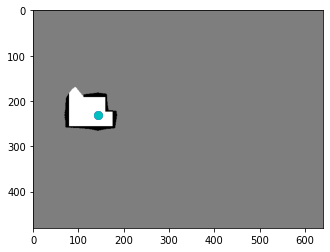

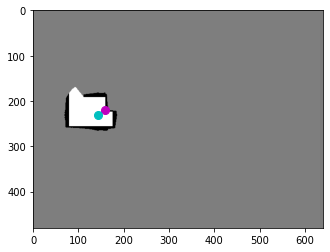

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2979, 0.3609]), 'reward': tensor([-10.]), 'action': tensor([ 0.4744, -0.3124])}
terminal True


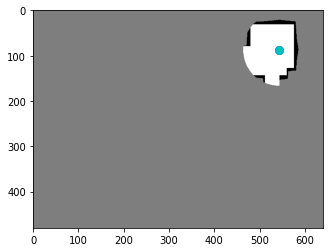

reward -10.0


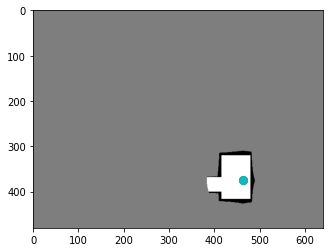

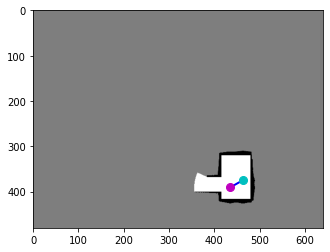

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9062, 0.6109]), 'reward': tensor([0.1469]), 'action': tensor([-0.3934,  0.2288])}
terminal False


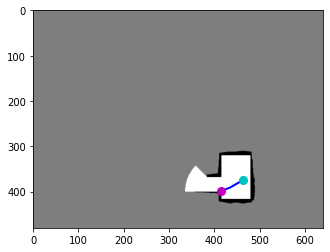

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9062, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9062, 0.6109]), 'reward': tensor([-10.]), 'action': tensor([-0.4972,  0.2187])}
terminal True


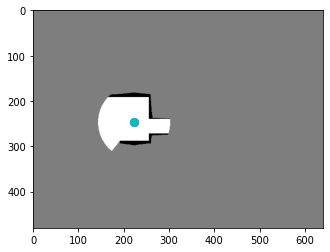

reward -9.853142857551575


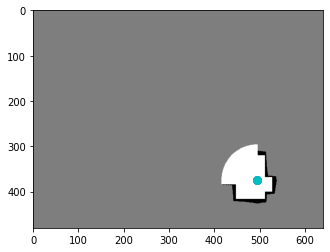

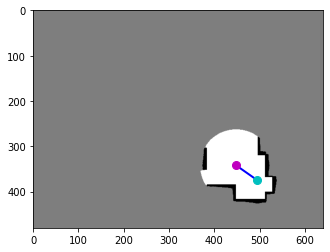

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.5344]), 'reward': tensor([1.]), 'action': tensor([-0.6700, -0.4613])}
terminal False


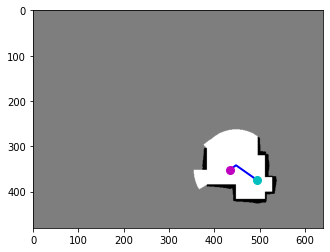

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.5344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9042, 0.5500]), 'reward': tensor([0.1046]), 'action': tensor([-0.1978,  0.1440])}
terminal False


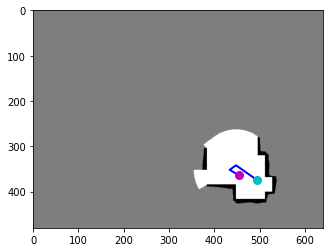

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9042, 0.5500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9458, 0.5688]), 'reward': tensor([-0.8000]), 'action': tensor([0.2845, 0.1648])}
terminal False


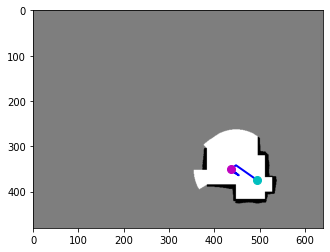

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9458, 0.5688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9083, 0.5469]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2569, -0.1923])}
terminal False


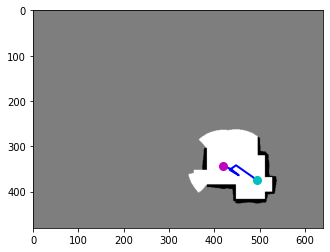

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9083, 0.5469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8750, 0.5359]), 'reward': tensor([0.1614]), 'action': tensor([-0.2248, -0.0957])}
terminal False


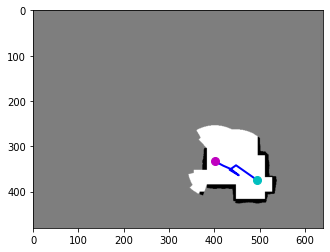

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8750, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8354, 0.5203]), 'reward': tensor([0.1551]), 'action': tensor([-0.2720, -0.1363])}
terminal False


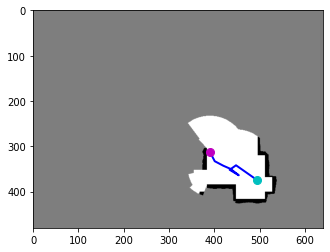

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8354, 0.5203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8125, 0.4875]), 'reward': tensor([0.3021]), 'action': tensor([-0.1626, -0.2915])}
terminal False


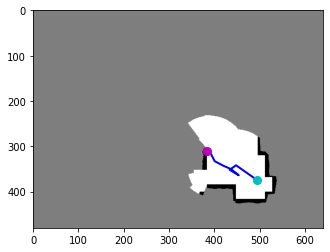

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8125, 0.4875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8125, 0.4875]), 'reward': tensor([-10.]), 'action': tensor([-0.2571, -0.0363])}
terminal True


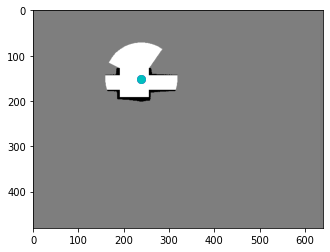

reward -9.876714304089546
step 3000
CRITIC


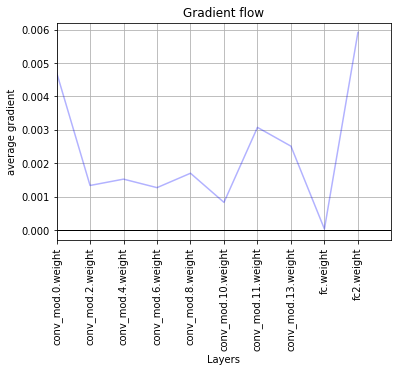

ACTOR


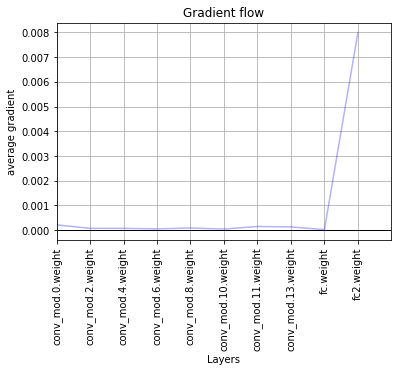

step 3100
avg iter time 0.8021728400261171


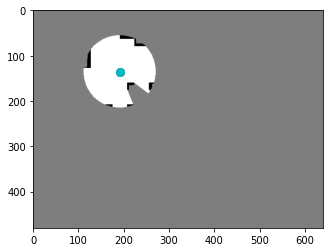

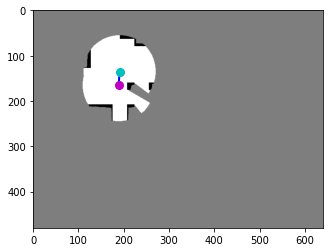

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3938, 0.2578]), 'reward': tensor([0.4086]), 'action': tensor([-0.0284,  0.4194])}
terminal False


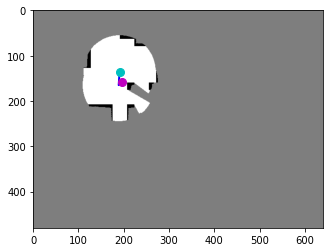

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3938, 0.2578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4083, 0.2469]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0740, -0.0718])}
terminal False


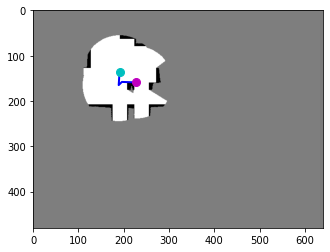

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4083, 0.2469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4750, 0.2484]), 'reward': tensor([0.3827]), 'action': tensor([0.4576, 0.0160])}
terminal False


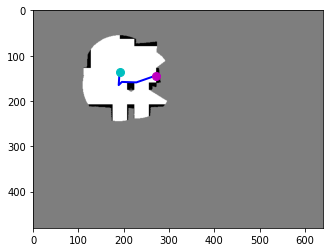

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4750, 0.2484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4750, 0.2484]), 'reward': tensor([-10.]), 'action': tensor([ 0.7601, -0.2643])}
terminal True


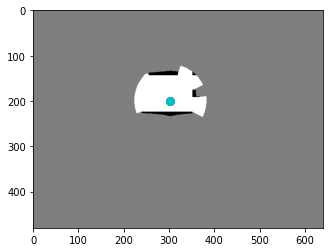

reward -10.008714318275452


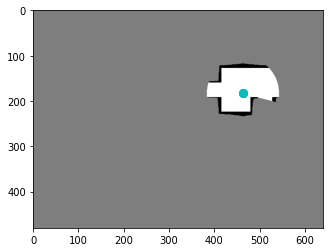

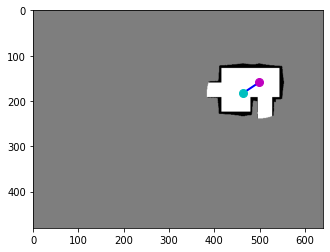

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0396, 0.2484]), 'reward': tensor([0.2501]), 'action': tensor([ 0.5063, -0.3364])}
terminal False


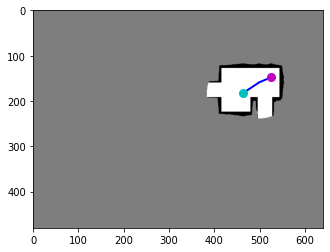

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0396, 0.2484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0938, 0.2313]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3690, -0.1611])}
terminal False


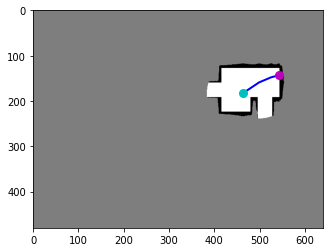

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0938, 0.2313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0938, 0.2313]), 'reward': tensor([-10.]), 'action': tensor([ 0.6217, -0.1717])}
terminal True


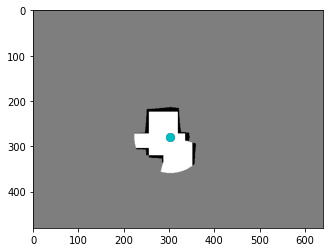

reward -10.549857169389725


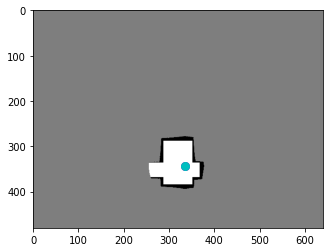

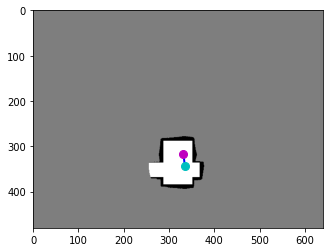

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.4969]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0436, -0.3557])}
terminal False


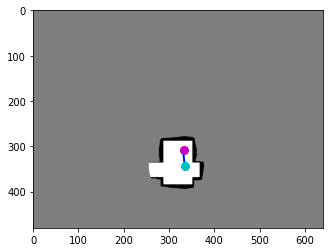

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6917, 0.4969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6938, 0.4812]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0110, -0.0888])}
terminal False


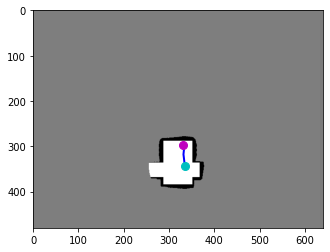

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6938, 0.4812]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6896, 0.4656]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0159, -0.0635])}
terminal False


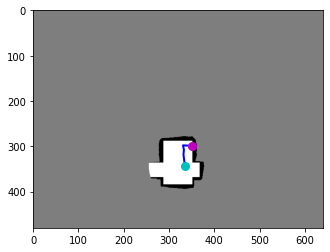

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6896, 0.4656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6896, 0.4656]), 'reward': tensor([-10.]), 'action': tensor([0.4162, 0.0074])}
terminal True


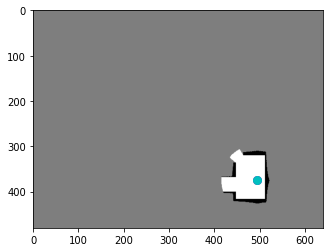

reward -12.400000035762787


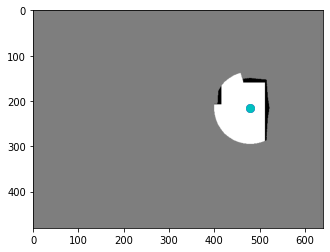

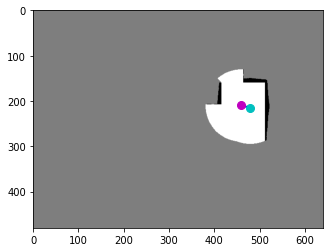

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.3281]), 'reward': tensor([0.2884]), 'action': tensor([-0.2663, -0.0683])}
terminal False


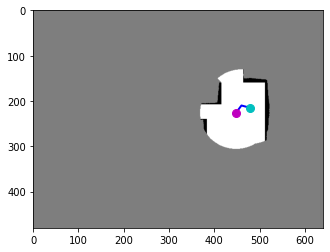

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.3281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.3531]), 'reward': tensor([0.3324]), 'action': tensor([-0.1695,  0.2293])}
terminal False


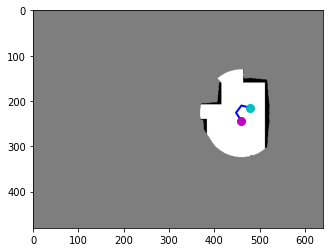

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.3531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.3812]), 'reward': tensor([0.2800]), 'action': tensor([0.1688, 0.2575])}
terminal False


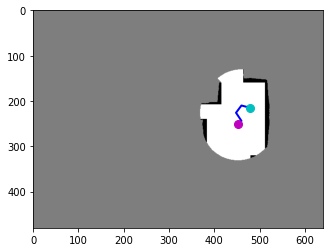

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.3812]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9417, 0.3922]), 'reward': tensor([0.1487]), 'action': tensor([-0.1164,  0.1048])}
terminal False


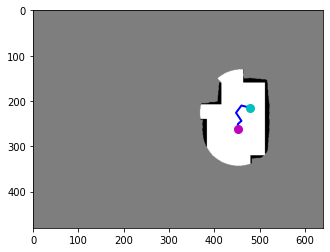

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9417, 0.3922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9438, 0.4109]), 'reward': tensor([0.1774]), 'action': tensor([0.0132, 0.1755])}
terminal False


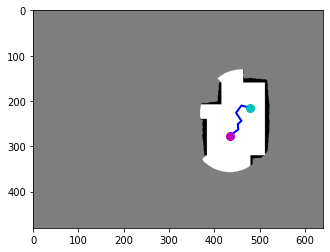

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9438, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9042, 0.4328]), 'reward': tensor([0.2589]), 'action': tensor([-0.2624,  0.2030])}
terminal False


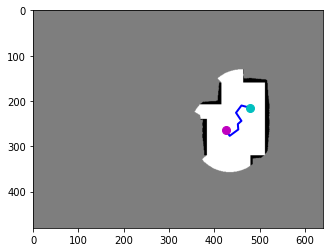

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9042, 0.4328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8854, 0.4125]), 'reward': tensor([0.0239]), 'action': tensor([-0.1336, -0.1900])}
terminal False


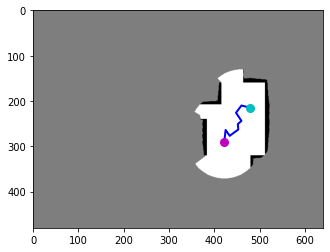

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8854, 0.4125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8792, 0.4547]), 'reward': tensor([0.2507]), 'action': tensor([-0.0406,  0.3887])}
terminal False


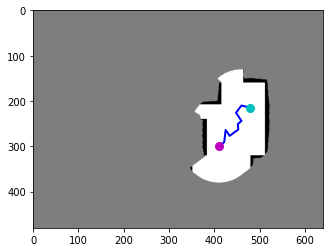

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8792, 0.4547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8542, 0.4688]), 'reward': tensor([0.1676]), 'action': tensor([-0.1647,  0.1270])}
terminal False


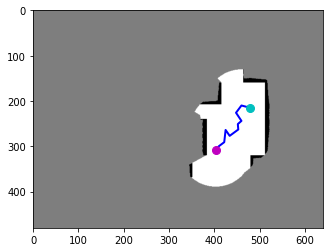

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8542, 0.4688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8396, 0.4828]), 'reward': tensor([0.1587]), 'action': tensor([-0.0961,  0.1236])}
terminal False


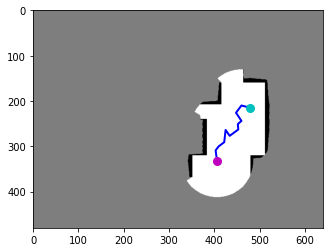

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8396, 0.4828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8458, 0.5188]), 'reward': tensor([0.4820]), 'action': tensor([0.0367, 0.3213])}
terminal False


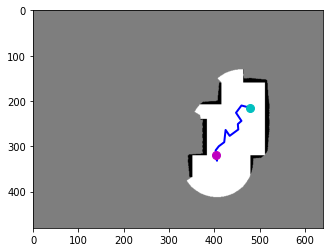

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8458, 0.5188]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8396, 0.5000]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0485, -0.1678])}
terminal False


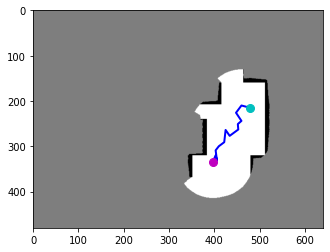

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8396, 0.5000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8271, 0.5219]), 'reward': tensor([0.0644]), 'action': tensor([-0.0913,  0.1922])}
terminal False


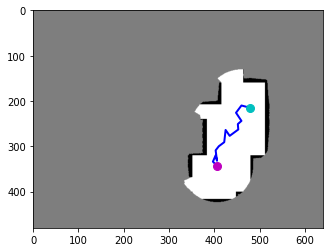

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8271, 0.5219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8458, 0.5359]), 'reward': tensor([0.1110]), 'action': tensor([0.1208, 0.1317])}
terminal False


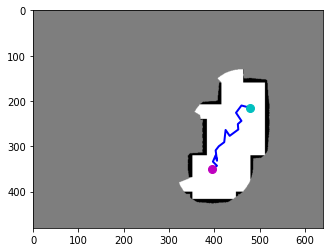

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8458, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8250, 0.5469]), 'reward': tensor([0.0614]), 'action': tensor([-0.1421,  0.0944])}
terminal False


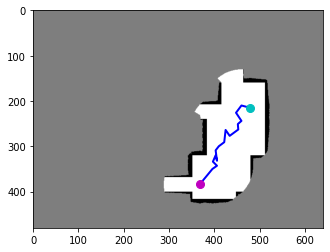

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8250, 0.5469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7667, 0.6000]), 'reward': tensor([0.1900]), 'action': tensor([-0.3896,  0.4851])}
terminal False


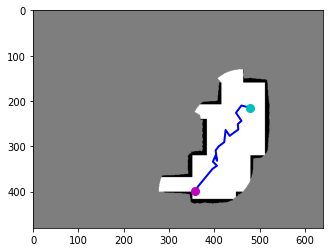

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7667, 0.6000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7437, 0.6219]), 'reward': tensor([0.0440]), 'action': tensor([-0.1569,  0.2038])}
terminal False


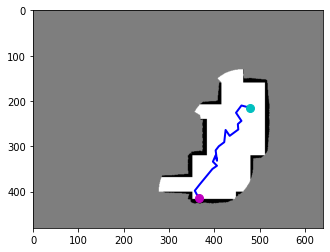

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7437, 0.6219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7437, 0.6219]), 'reward': tensor([-10.]), 'action': tensor([0.1556, 0.3061])}
terminal True


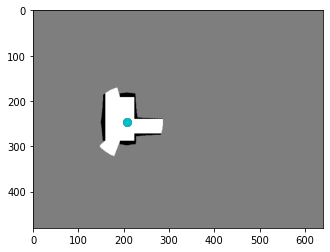

reward -7.760428614914417


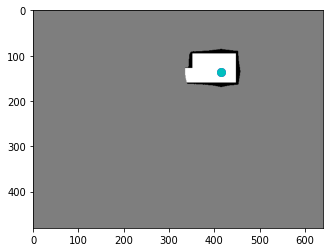

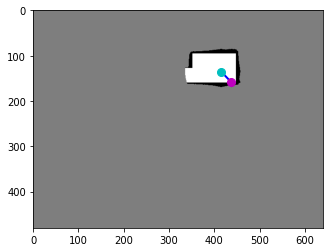

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8646, 0.2109]), 'reward': tensor([-10.]), 'action': tensor([0.3250, 0.3521])}
terminal True


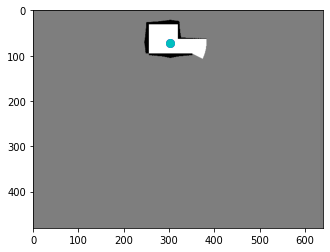

reward -10.0
step 3100
step 3200
avg iter time 0.8051190586388111


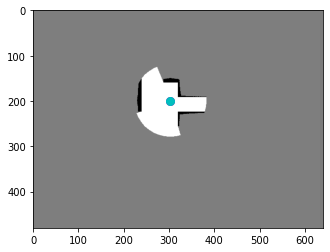

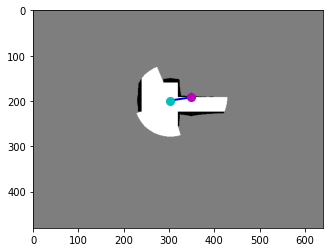

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6313, 0.3109]), 'reward': tensor([-10.]), 'action': tensor([ 0.6861, -0.1116])}
terminal True


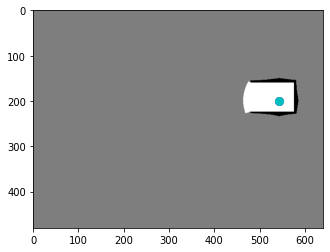

reward -10.0


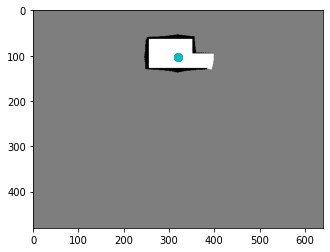

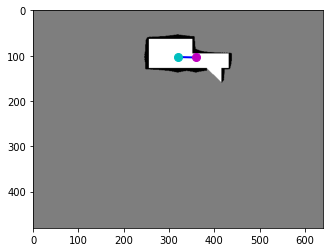

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6646, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7479, 0.1625]), 'reward': tensor([0.2249]), 'action': tensor([0.5725, 0.0156])}
terminal False


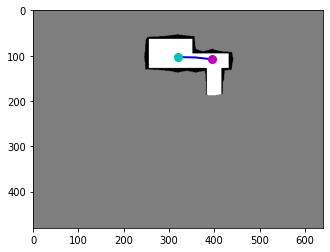

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7479, 0.1625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8229, 0.1688]), 'reward': tensor([0.1984]), 'action': tensor([0.5042, 0.0518])}
terminal False


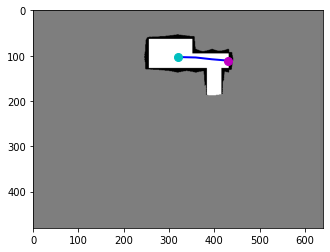

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8229, 0.1688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8229, 0.1688]), 'reward': tensor([-10.]), 'action': tensor([0.7047, 0.0632])}
terminal True


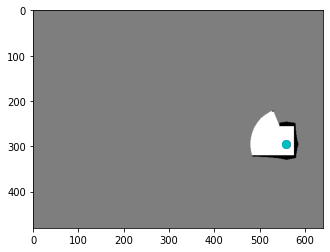

reward -9.576714292168617


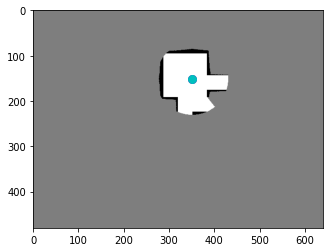

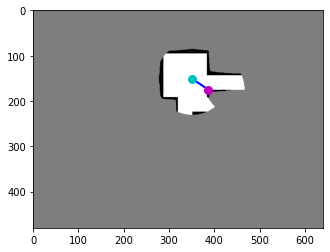

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7312, 0.2359]), 'reward': tensor([-10.]), 'action': tensor([0.8422, 0.5743])}
terminal True


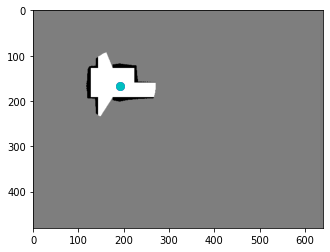

reward -10.0


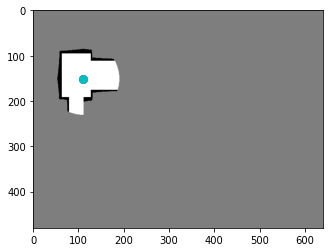

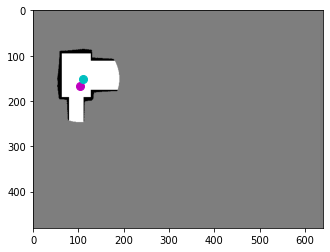

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2146, 0.2609]), 'reward': tensor([0.0787]), 'action': tensor([-0.1062,  0.2305])}
terminal False


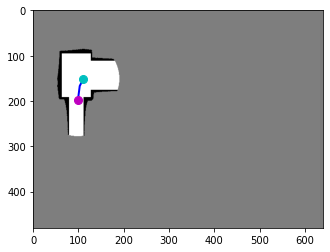

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2146, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2062, 0.3094]), 'reward': tensor([0.1429]), 'action': tensor([-0.0527,  0.4323])}
terminal False


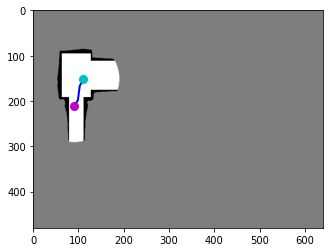

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2062, 0.3094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1896, 0.3297]), 'reward': tensor([0.0591]), 'action': tensor([-0.1202,  0.1821])}
terminal False


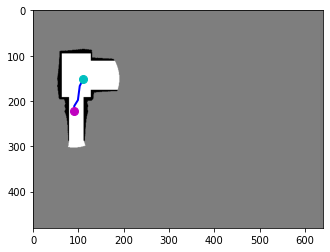

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1896, 0.3297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1875, 0.3484]), 'reward': tensor([0.0604]), 'action': tensor([-0.0210,  0.1685])}
terminal False


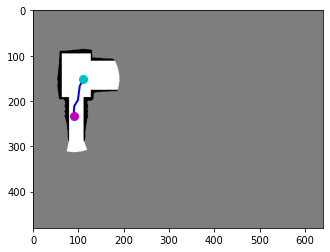

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1875, 0.3484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1896, 0.3641]), 'reward': tensor([0.0627]), 'action': tensor([0.0060, 0.0957])}
terminal False


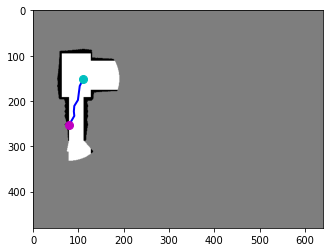

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1896, 0.3641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1896, 0.3641]), 'reward': tensor([-10.]), 'action': tensor([-0.2312,  0.3783])}
terminal True


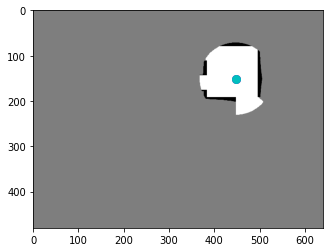

reward -9.59614284709096


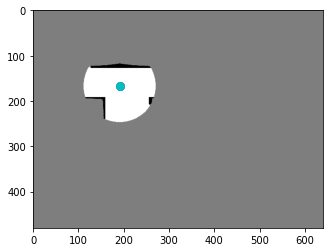

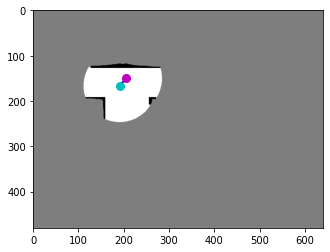

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4271, 0.2344]), 'reward': tensor([0.1260]), 'action': tensor([ 0.1932, -0.2335])}
terminal False


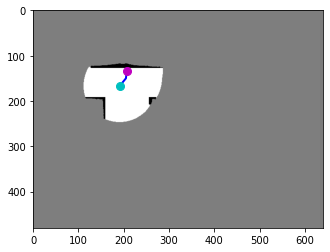

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4271, 0.2344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4313, 0.2078]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0269, -0.2415])}
terminal False


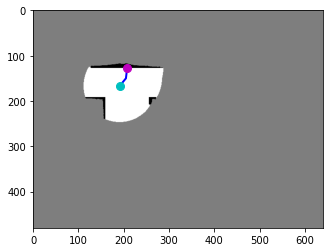

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4313, 0.2078]), 'reward': tensor([-10.]), 'action': tensor([ 0.0467, -0.2552])}
terminal True


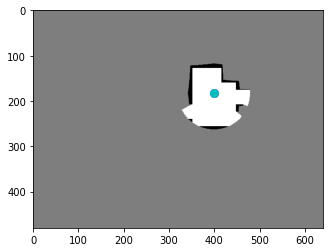

reward -10.674000009894371
step 3200
step 3300
avg iter time 0.8038392489606684


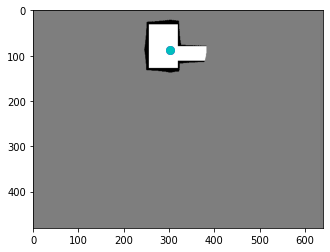

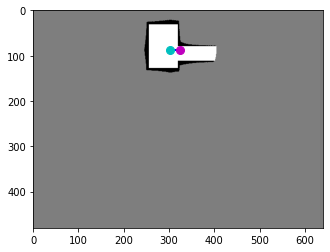

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6771, 0.1375]), 'reward': tensor([0.1011]), 'action': tensor([0.3093, 0.0130])}
terminal False


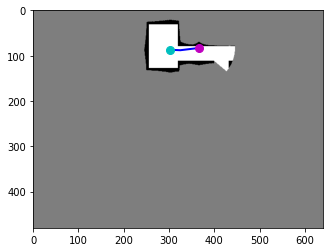

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6771, 0.1375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7625, 0.1297]), 'reward': tensor([0.2443]), 'action': tensor([ 0.5771, -0.0742])}
terminal False


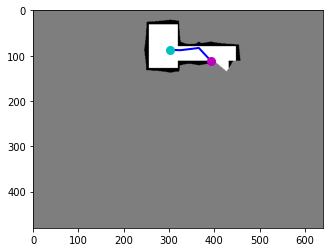

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7625, 0.1297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7625, 0.1297]), 'reward': tensor([-10.]), 'action': tensor([0.4646, 0.5154])}
terminal True


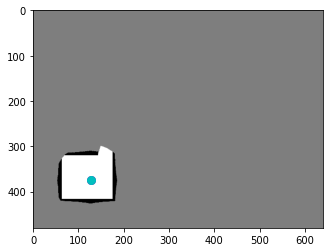

reward -9.654571428894997


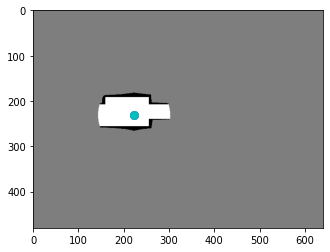

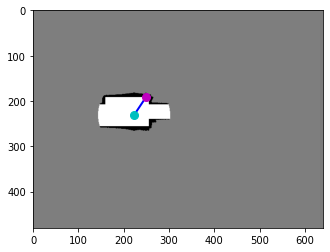

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4646, 0.3609]), 'reward': tensor([-10.]), 'action': tensor([ 0.5064, -0.7751])}
terminal True


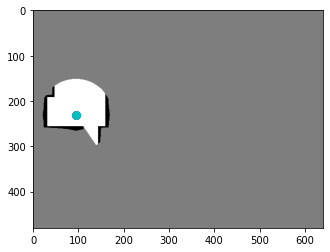

reward -10.0


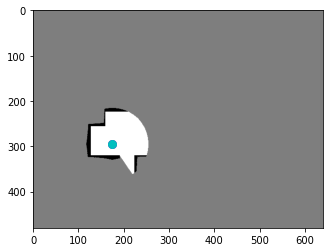

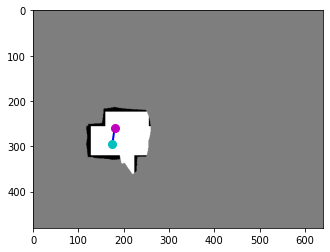

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3750, 0.4062]), 'reward': tensor([0.1540]), 'action': tensor([ 0.0749, -0.4940])}
terminal False


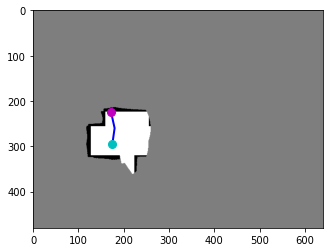

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3750, 0.4062]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3750, 0.4062]), 'reward': tensor([-10.]), 'action': tensor([-0.1297, -0.5972])}
terminal True


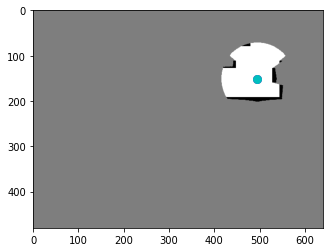

reward -9.846000000834465


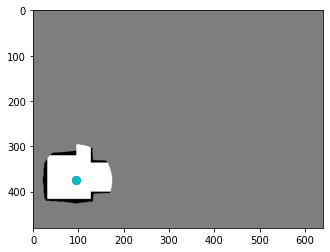

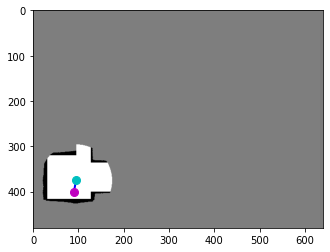

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1979, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1875, 0.6266]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0775,  0.3734])}
terminal False


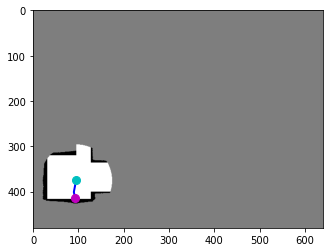

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1875, 0.6266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1875, 0.6266]), 'reward': tensor([-10.]), 'action': tensor([0.1141, 0.4770])}
terminal True


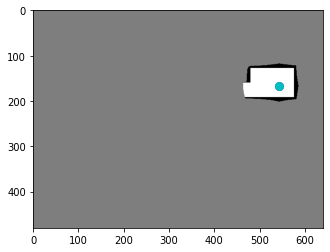

reward -10.800000011920929


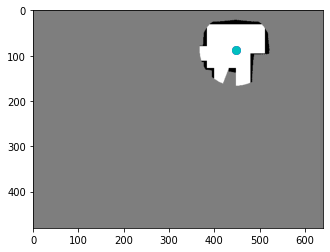

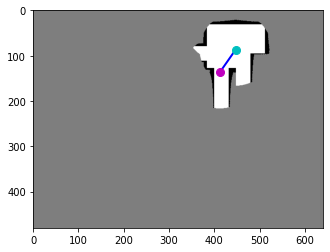

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8583, 0.2141]), 'reward': tensor([0.3133]), 'action': tensor([-0.4952,  0.7062])}
terminal False


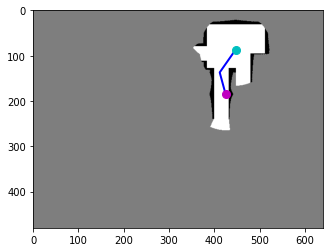

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8583, 0.2141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8854, 0.2891]), 'reward': tensor([0.2370]), 'action': tensor([0.1828, 0.6826])}
terminal False


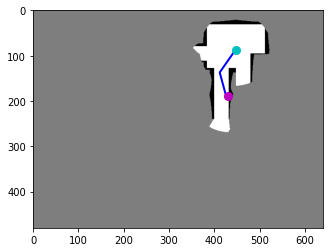

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8854, 0.2891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8854, 0.2891]), 'reward': tensor([-10.]), 'action': tensor([0.6785, 0.4678])}
terminal True


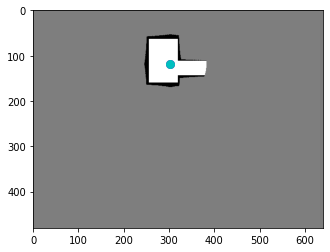

reward -9.449714288115501
step 3300
step 3400
avg iter time 0.8035541136825786


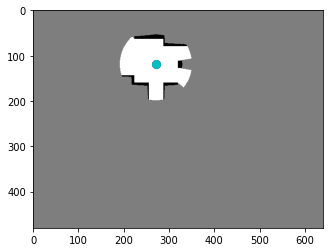

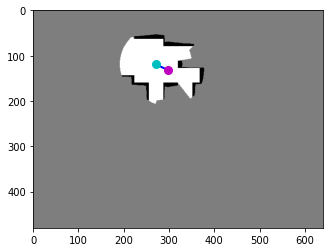

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6208, 0.2062]), 'reward': tensor([0.2041]), 'action': tensor([0.3822, 0.1897])}
terminal False


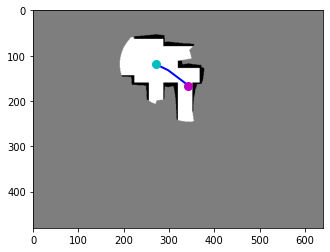

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6208, 0.2062]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7146, 0.2594]), 'reward': tensor([0.3014]), 'action': tensor([0.6378, 0.4784])}
terminal False


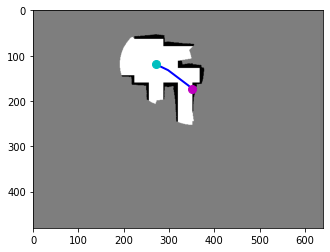

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7146, 0.2594]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7146, 0.2594]), 'reward': tensor([-10.]), 'action': tensor([0.2285, 0.1958])}
terminal True


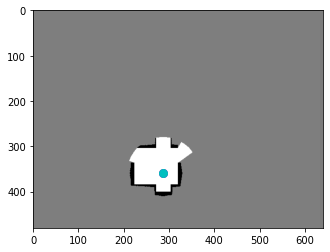

reward -9.494428560137749


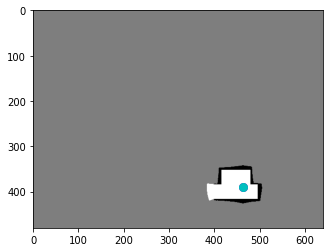

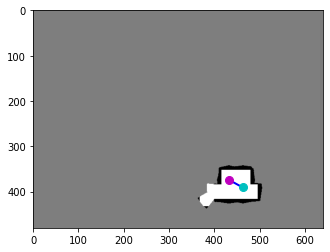

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9000, 0.5844]), 'reward': tensor([0.0761]), 'action': tensor([-0.4363, -0.2352])}
terminal False


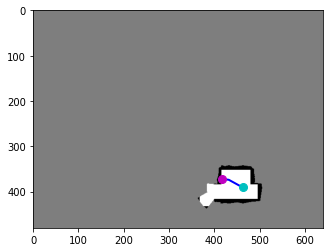

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9000, 0.5844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9000, 0.5844]), 'reward': tensor([-10.]), 'action': tensor([-0.3070, -0.0385])}
terminal True


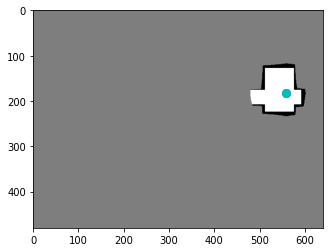

reward -9.923857145011425


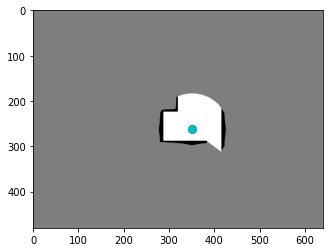

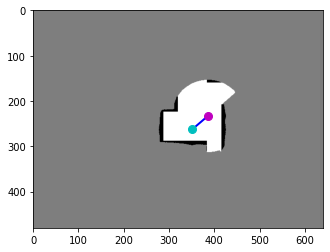

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8042, 0.3641]), 'reward': tensor([0.5524]), 'action': tensor([ 0.4961, -0.4232])}
terminal False


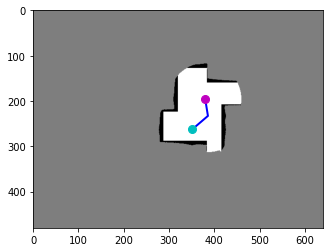

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8042, 0.3641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7917, 0.3063]), 'reward': tensor([0.4841]), 'action': tensor([-0.0824, -0.5201])}
terminal False


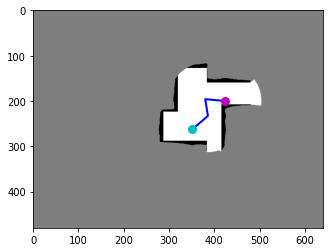

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7917, 0.3063]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8833, 0.3125]), 'reward': tensor([0.3086]), 'action': tensor([0.6285, 0.0575])}
terminal False


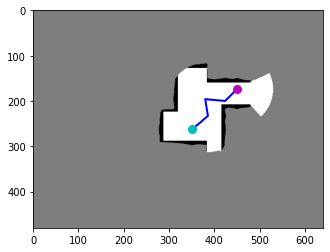

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8833, 0.3125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9375, 0.2719]), 'reward': tensor([0.3411]), 'action': tensor([ 0.3674, -0.3716])}
terminal False


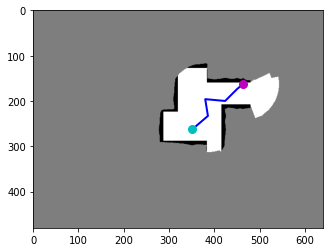

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9375, 0.2719]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9646, 0.2547]), 'reward': tensor([0.1389]), 'action': tensor([ 0.1861, -0.1555])}
terminal False


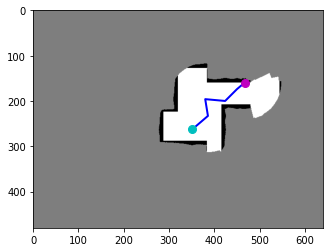

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.2547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9646, 0.2547]), 'reward': tensor([-10.]), 'action': tensor([ 0.5333, -0.3963])}
terminal True


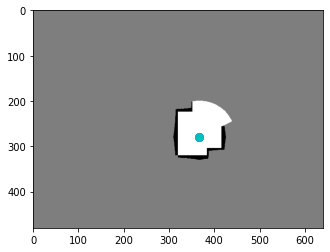

reward -8.174857154488564


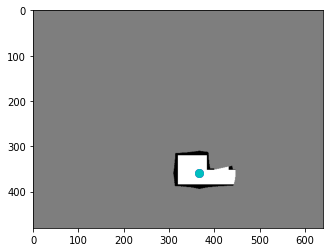

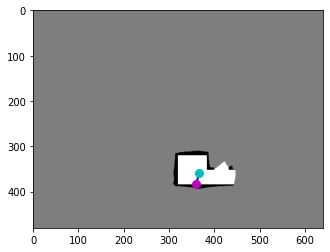

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7646, 0.5609]), 'reward': tensor([-10.]), 'action': tensor([-0.1968,  0.6614])}
terminal True


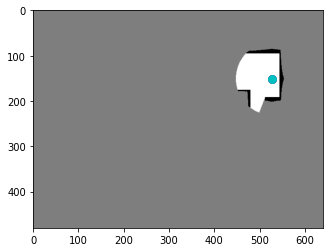

reward -10.0


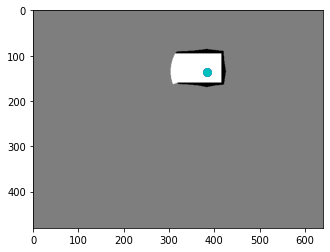

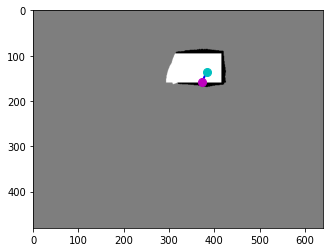

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.2109]), 'reward': tensor([-10.]), 'action': tensor([-0.2080,  0.4890])}
terminal True


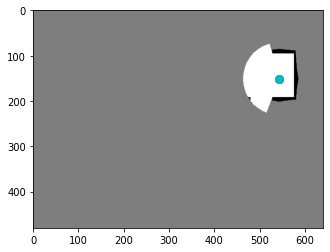

reward -10.0
step 3400
step 3500
avg iter time 0.8037810833113535


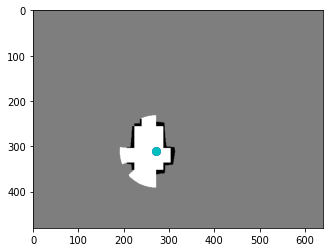

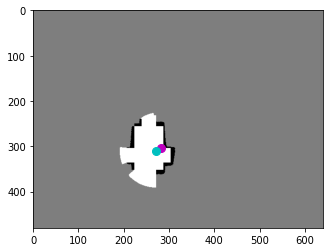

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5875, 0.4750]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1602, -0.1050])}
terminal False


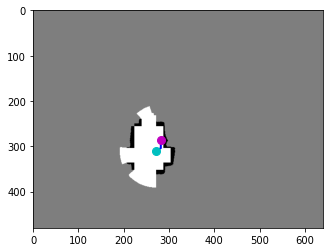

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5875, 0.4750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5875, 0.4484]), 'reward': tensor([0.0646]), 'action': tensor([ 0.0023, -0.2369])}
terminal False


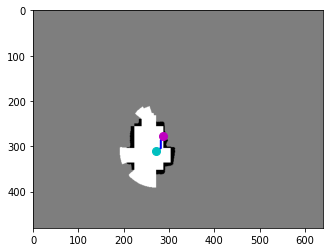

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5875, 0.4484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5875, 0.4484]), 'reward': tensor([-10.]), 'action': tensor([ 0.1949, -0.3069])}
terminal True


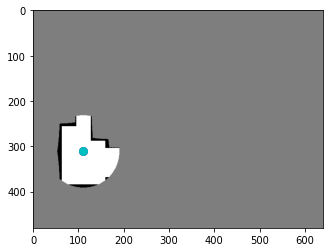

reward -10.735428586602211


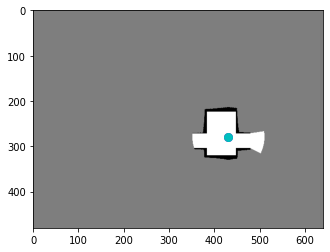

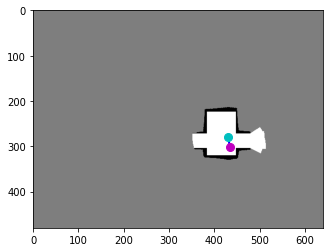

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9042, 0.4703]), 'reward': tensor([0.0340]), 'action': tensor([0.0360, 0.3126])}
terminal False


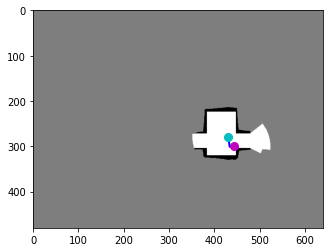

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9042, 0.4703]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9250, 0.4688]), 'reward': tensor([0.0827]), 'action': tensor([ 0.1179, -0.0111])}
terminal False


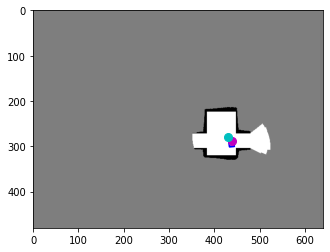

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9250, 0.4688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9167, 0.4500]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0500, -0.1736])}
terminal False


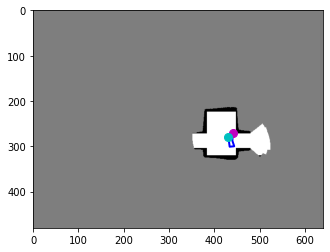

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9167, 0.4500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9187, 0.4219]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0154, -0.2491])}
terminal False


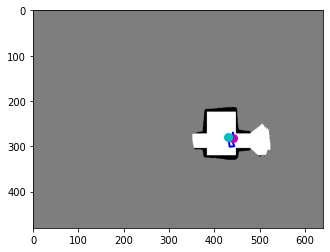

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9187, 0.4219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9208, 0.4406]), 'reward': tensor([-0.8000]), 'action': tensor([0.0169, 0.1717])}
terminal False


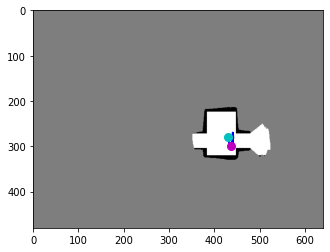

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9208, 0.4406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9104, 0.4672]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0695,  0.2384])}
terminal False


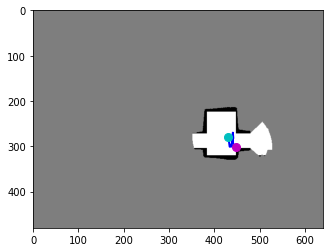

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9104, 0.4672]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.4703]), 'reward': tensor([0.0317]), 'action': tensor([0.1544, 0.0250])}
terminal False


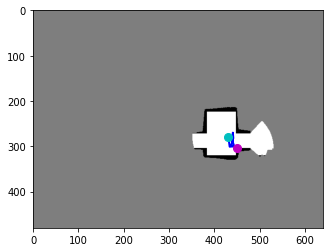

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.4703]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.4703]), 'reward': tensor([-10.]), 'action': tensor([0.3971, 0.2831])}
terminal True


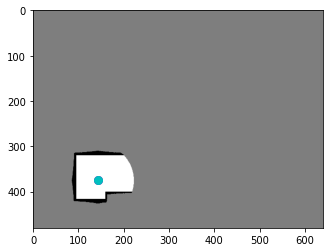

reward -13.05157146975398


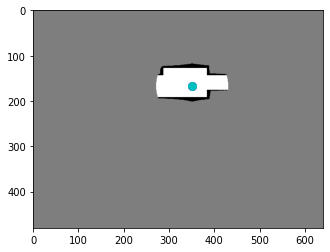

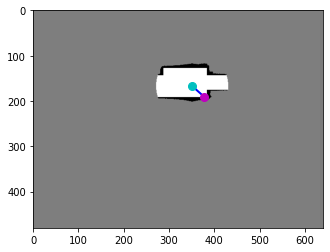

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7312, 0.2609]), 'reward': tensor([-10.]), 'action': tensor([0.6100, 0.5566])}
terminal True


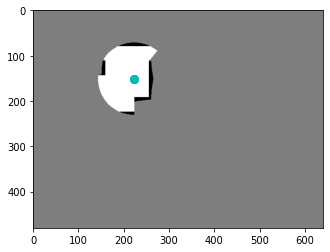

reward -10.0


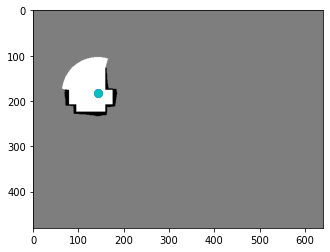

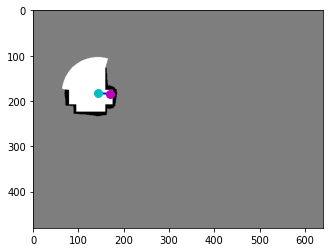

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3521, 0.2875]), 'reward': tensor([-0.8000]), 'action': tensor([0.3637, 0.0163])}
terminal False


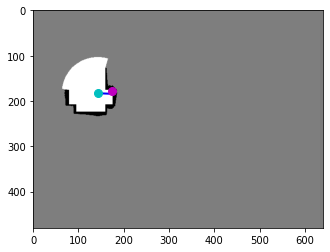

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3521, 0.2875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3521, 0.2875]), 'reward': tensor([-10.]), 'action': tensor([ 0.4344, -0.4823])}
terminal True


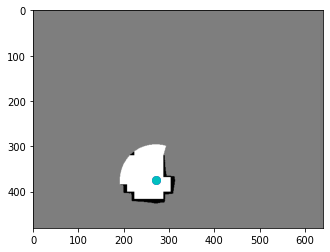

reward -10.800000011920929


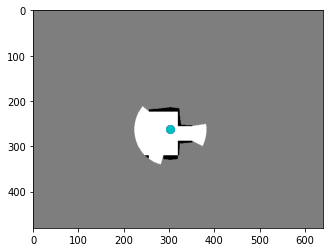

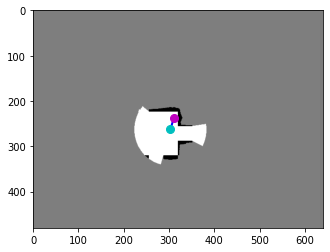

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6479, 0.3703]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1091, -0.3706])}
terminal False


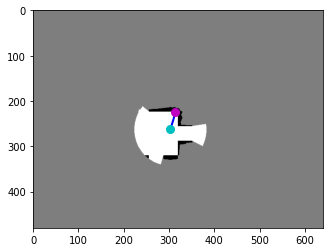

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6479, 0.3703]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6479, 0.3703]), 'reward': tensor([-10.]), 'action': tensor([ 0.1053, -0.6849])}
terminal True


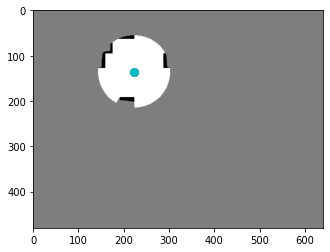

reward -10.800000011920929
step 3500
CRITIC


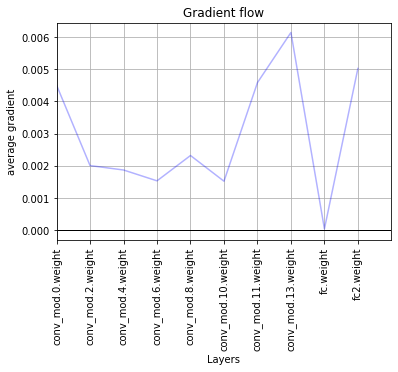

ACTOR


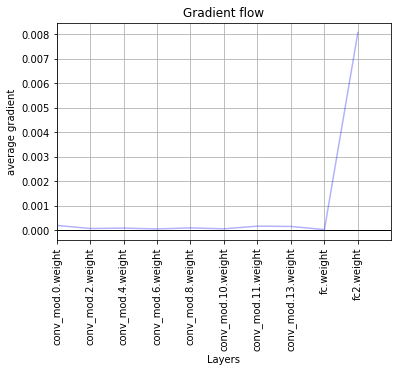

step 3600
avg iter time 0.8042842972278595


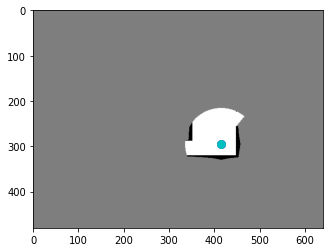

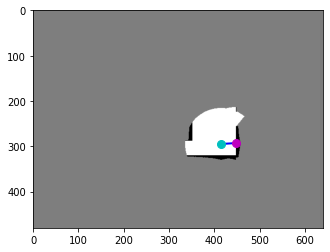

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8646, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([ 0.4989, -0.0285])}
terminal True


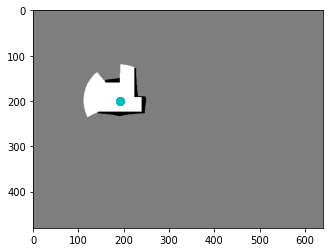

reward -10.0


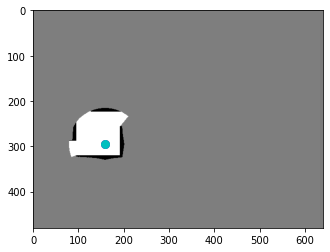

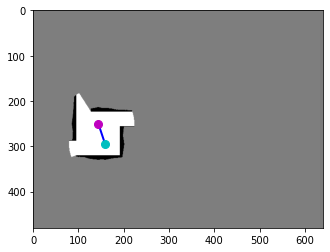

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3000, 0.3906]), 'reward': tensor([0.2427]), 'action': tensor([-0.2148, -0.6326])}
terminal False


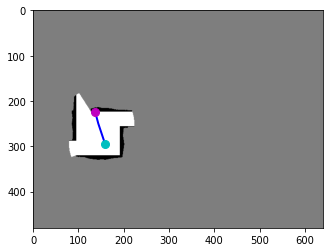

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3000, 0.3906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3000, 0.3906]), 'reward': tensor([-10.]), 'action': tensor([-0.2066, -0.7643])}
terminal True


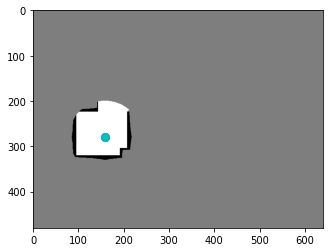

reward -9.757285714149475


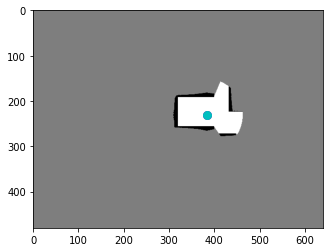

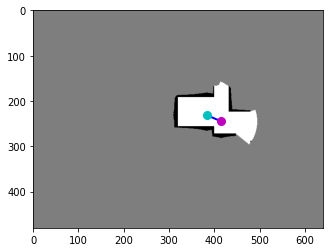

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8646, 0.3828]), 'reward': tensor([0.3394]), 'action': tensor([0.4532, 0.1956])}
terminal False


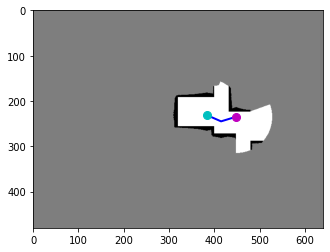

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.3828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.3672]), 'reward': tensor([0.4609]), 'action': tensor([ 0.4620, -0.1385])}
terminal False


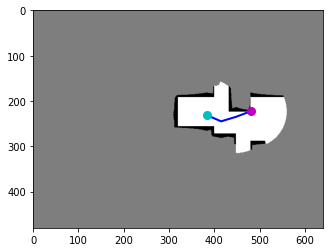

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.3672]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.3672]), 'reward': tensor([-10.]), 'action': tensor([ 0.6469, -0.2391])}
terminal True


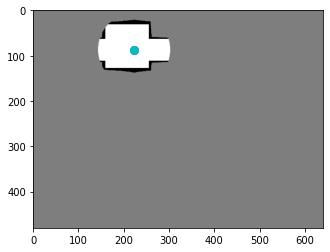

reward -9.19971427321434


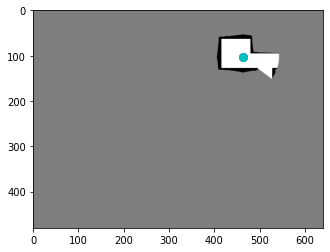

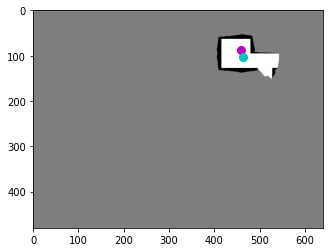

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.1359]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0405, -0.2307])}
terminal False


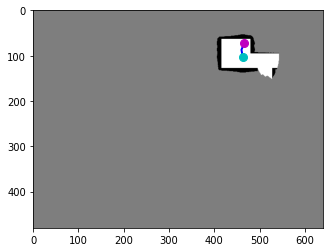

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9708, 0.1141]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0839, -0.1974])}
terminal False


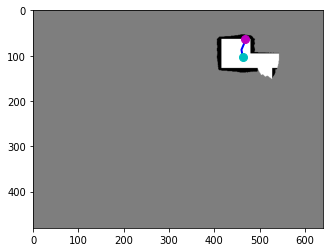

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9708, 0.1141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9708, 0.1141]), 'reward': tensor([-10.]), 'action': tensor([ 0.0323, -0.2821])}
terminal True


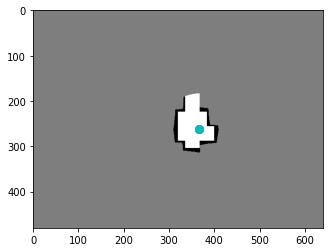

reward -11.600000023841858


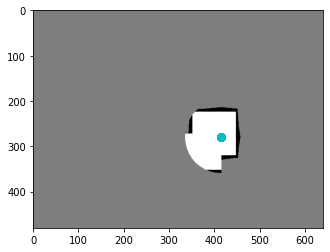

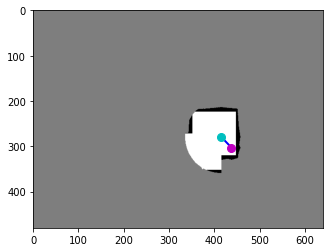

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9125, 0.4734]), 'reward': tensor([-0.8000]), 'action': tensor([0.3196, 0.3437])}
terminal False


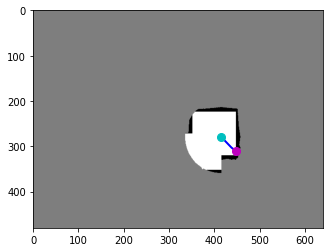

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9125, 0.4734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9125, 0.4734]), 'reward': tensor([-10.]), 'action': tensor([0.3594, 0.2615])}
terminal True


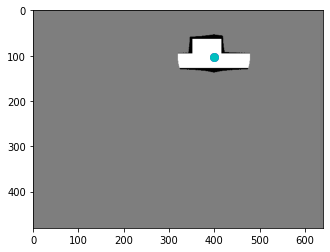

reward -10.800000011920929
step 3600
step 3700
avg iter time 0.8044117200696791


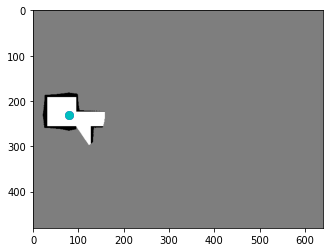

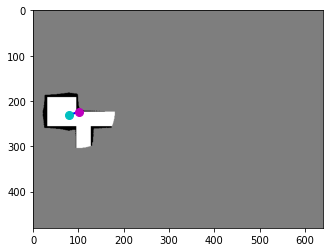

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1646, 0.3609]), 'reward': tensor([-10.]), 'action': tensor([ 0.3426, -0.1175])}
terminal True


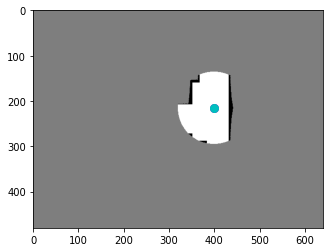

reward -10.0


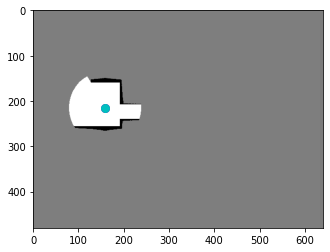

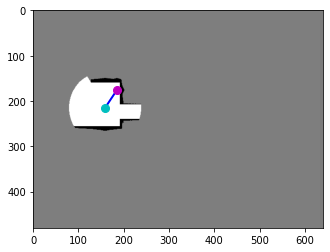

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3854, 0.2750]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3688, -0.5534])}
terminal False


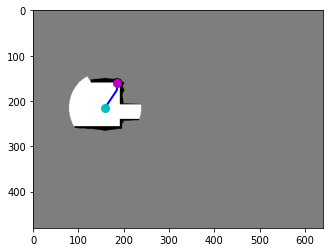

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3854, 0.2750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3854, 0.2750]), 'reward': tensor([-10.]), 'action': tensor([ 0.0240, -0.6274])}
terminal True


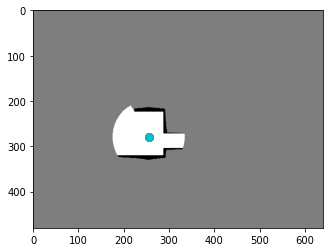

reward -10.800000011920929


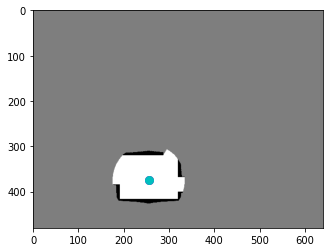

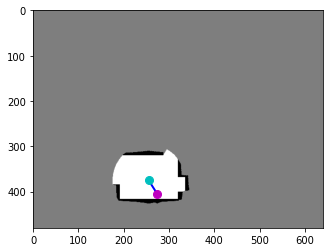

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5708, 0.6328]), 'reward': tensor([-0.8000]), 'action': tensor([0.2755, 0.4280])}
terminal False


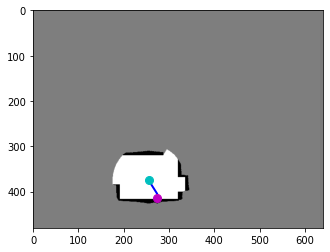

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5708, 0.6328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5708, 0.6328]), 'reward': tensor([-10.]), 'action': tensor([-0.0211,  0.3887])}
terminal True


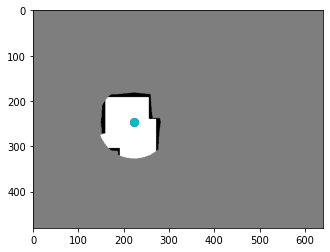

reward -10.800000011920929


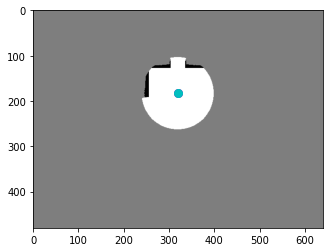

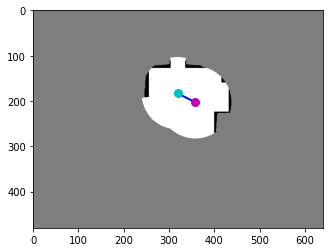

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6646, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7458, 0.3172]), 'reward': tensor([0.7893]), 'action': tensor([0.5543, 0.2758])}
terminal False


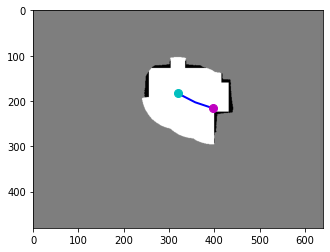

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7458, 0.3172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8271, 0.3375]), 'reward': tensor([0.0954]), 'action': tensor([0.5459, 0.1835])}
terminal False


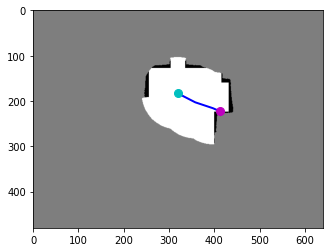

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8271, 0.3375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8271, 0.3375]), 'reward': tensor([-10.]), 'action': tensor([0.7175, 0.3429])}
terminal True


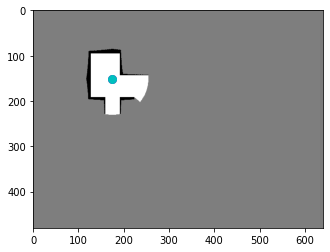

reward -9.115285709500313


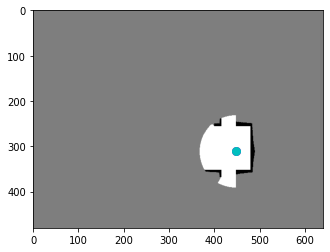

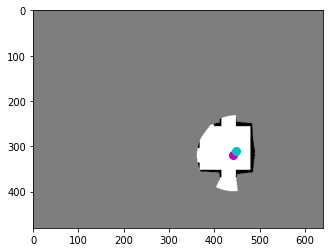

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9187, 0.4984]), 'reward': tensor([0.1197]), 'action': tensor([-0.0125,  0.0152])}
terminal False


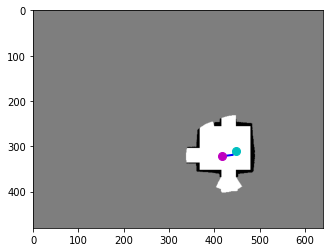

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9187, 0.4984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8687, 0.5031]), 'reward': tensor([0.2056]), 'action': tensor([-0.3386,  0.0402])}
terminal False


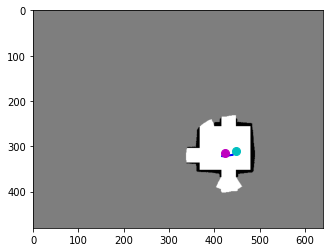

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8687, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8813, 0.4906]), 'reward': tensor([0.0201]), 'action': tensor([ 0.0517, -0.0657])}
terminal False


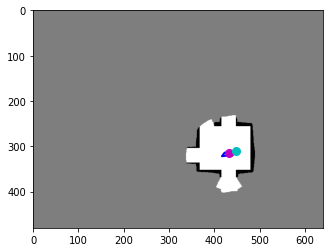

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8813, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9021, 0.4906]), 'reward': tensor([-0.8000]), 'action': tensor([0.1358, 0.0037])}
terminal False


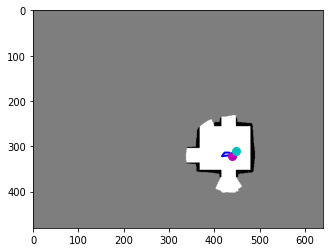

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9021, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9146, 0.5031]), 'reward': tensor([-0.8000]), 'action': tensor([0.0883, 0.1098])}
terminal False


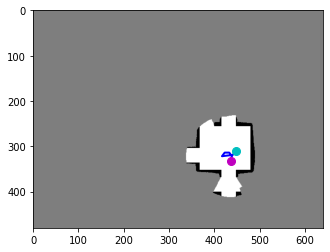

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9146, 0.5031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9083, 0.5188]), 'reward': tensor([0.0574]), 'action': tensor([-0.0469,  0.1418])}
terminal False


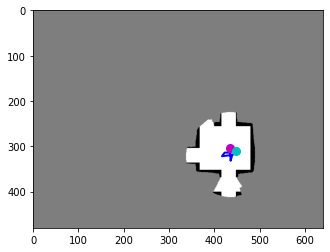

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9083, 0.5188]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9062, 0.4750]), 'reward': tensor([0.0391]), 'action': tensor([-0.0177, -0.3985])}
terminal False


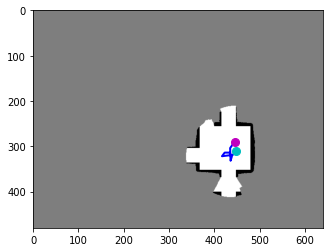

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9062, 0.4750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9271, 0.4531]), 'reward': tensor([0.0621]), 'action': tensor([ 0.1391, -0.2038])}
terminal False


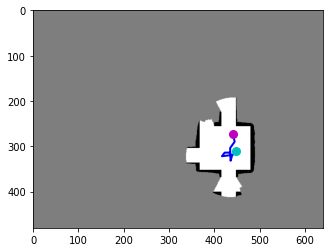

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9271, 0.4531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9187, 0.4250]), 'reward': tensor([0.1187]), 'action': tensor([-0.0510, -0.2552])}
terminal False


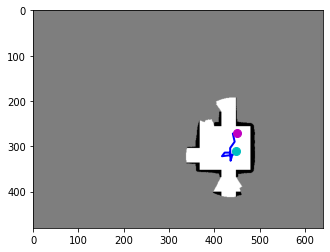

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9187, 0.4250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9396, 0.4234]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0685, -0.0041])}
terminal False


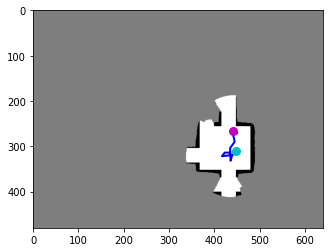

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9396, 0.4234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9208, 0.4172]), 'reward': tensor([0.0319]), 'action': tensor([-0.0680, -0.0302])}
terminal False


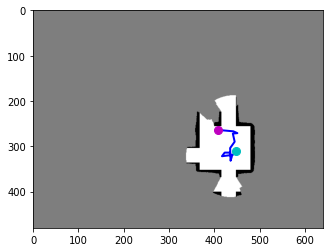

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9208, 0.4172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8521, 0.4125]), 'reward': tensor([0.0247]), 'action': tensor([-0.4682, -0.0397])}
terminal False


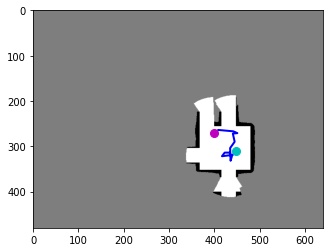

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8521, 0.4125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8333, 0.4234]), 'reward': tensor([0.2210]), 'action': tensor([-0.1319,  0.0998])}
terminal False


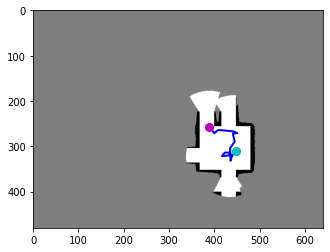

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8333, 0.4234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8104, 0.4016]), 'reward': tensor([0.1634]), 'action': tensor([-0.1531, -0.1957])}
terminal False


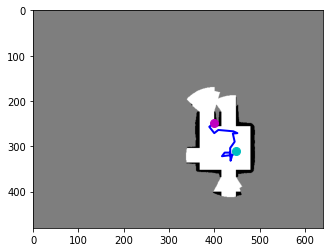

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8104, 0.4016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8104, 0.4016]), 'reward': tensor([-10.]), 'action': tensor([ 0.2384, -0.1789])}
terminal True


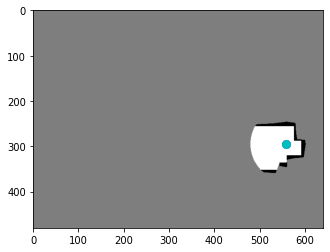

reward -11.33614288829267
step 3700
step 3800
avg iter time 0.805014577225635


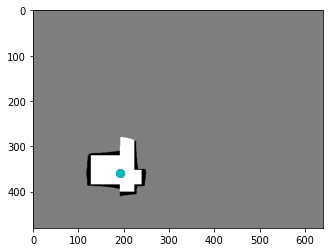

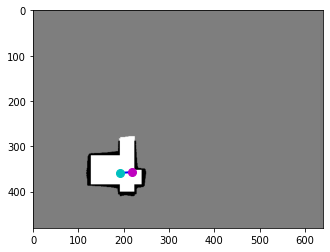

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4563, 0.5578]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3993, -0.0314])}
terminal False


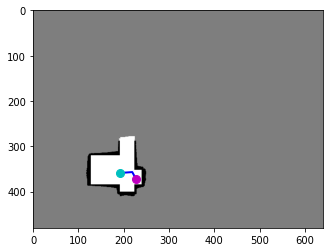

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4563, 0.5578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4729, 0.5813]), 'reward': tensor([-0.8000]), 'action': tensor([0.1114, 0.2109])}
terminal False


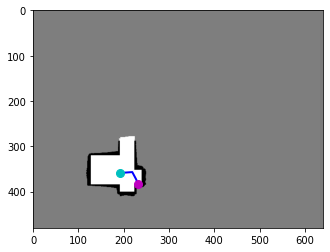

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4729, 0.5813]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4729, 0.5813]), 'reward': tensor([-10.]), 'action': tensor([0.1513, 0.3709])}
terminal True


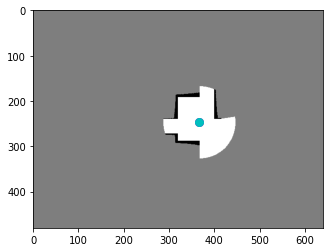

reward -11.600000023841858


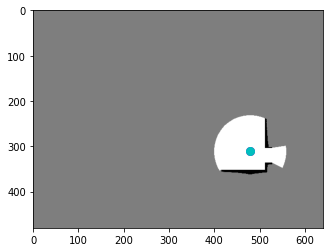

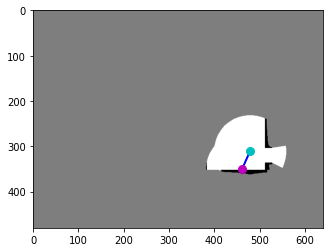

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9979, 0.4859]), 'reward': tensor([-10.]), 'action': tensor([-0.3408,  0.7514])}
terminal True


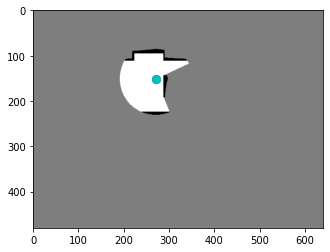

reward -10.0


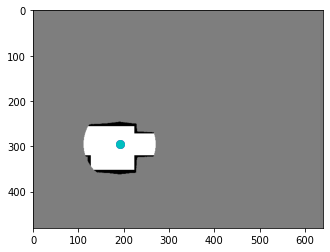

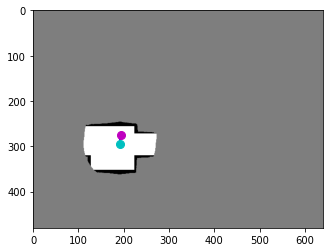

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4021, 0.4313]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0279, -0.2728])}
terminal False


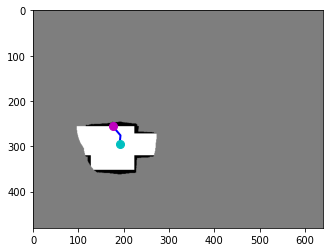

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4021, 0.4313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4021, 0.4313]), 'reward': tensor([-10.]), 'action': tensor([-0.3764, -0.4468])}
terminal True


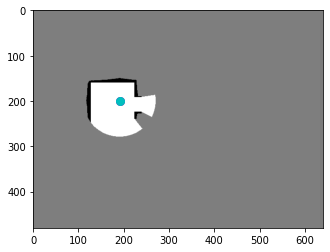

reward -10.800000011920929


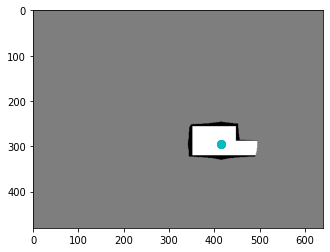

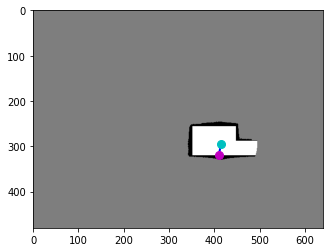

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8646, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([-0.1119,  0.5058])}
terminal True


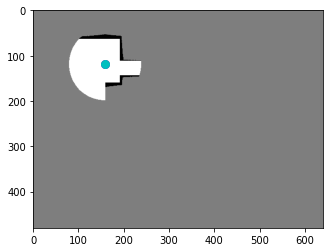

reward -10.0


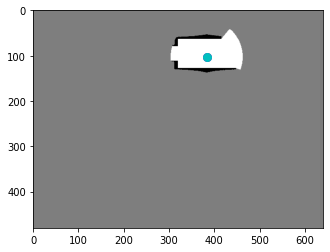

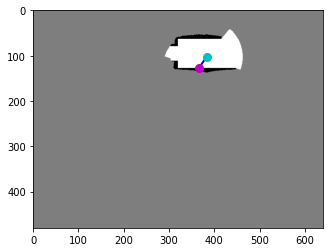

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.1609]), 'reward': tensor([-10.]), 'action': tensor([-0.3638,  0.5237])}
terminal True


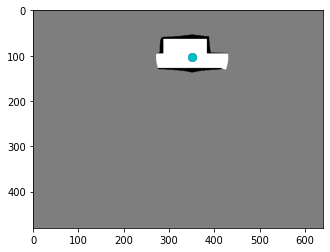

reward -10.0
step 3800
step 3900
avg iter time 0.8046503090858459


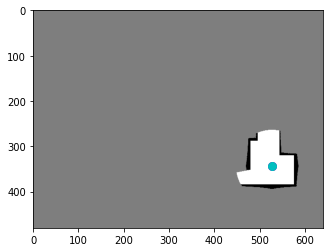

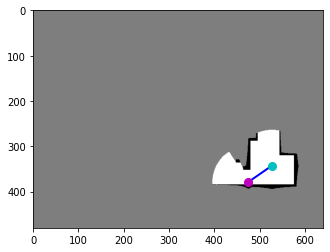

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9896, 0.5922]), 'reward': tensor([0.4690]), 'action': tensor([-0.7382,  0.5069])}
terminal False


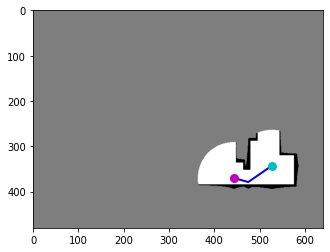

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9896, 0.5922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9229, 0.5781]), 'reward': tensor([0.5246]), 'action': tensor([-0.4463, -0.1209])}
terminal False


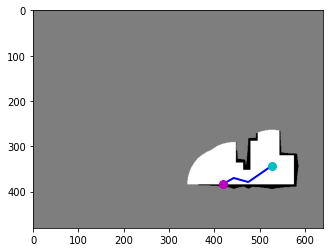

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9229, 0.5781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9229, 0.5781]), 'reward': tensor([-10.]), 'action': tensor([-0.4397,  0.2610])}
terminal True


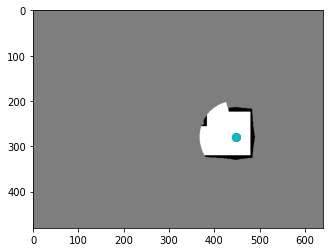

reward -9.006428569555283


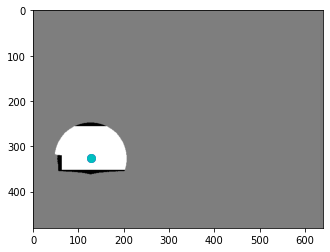

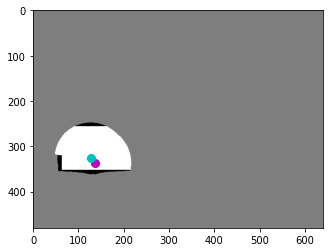

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2854, 0.5250]), 'reward': tensor([0.0833]), 'action': tensor([0.1442, 0.1218])}
terminal False


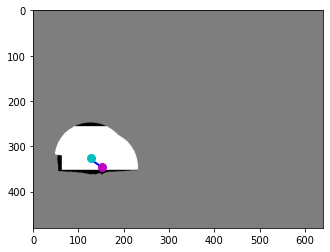

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2854, 0.5250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3167, 0.5406]), 'reward': tensor([0.1147]), 'action': tensor([0.2053, 0.1353])}
terminal False


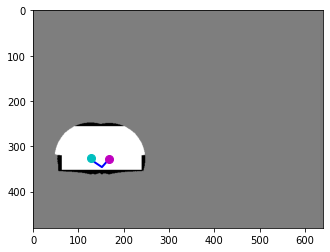

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3167, 0.5406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3500, 0.5125]), 'reward': tensor([0.3253]), 'action': tensor([ 0.2266, -0.2577])}
terminal False


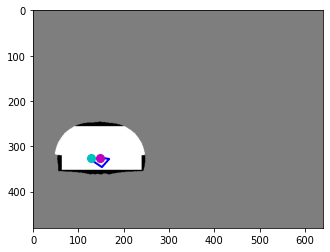

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3500, 0.5125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3083, 0.5078]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2843, -0.0458])}
terminal False


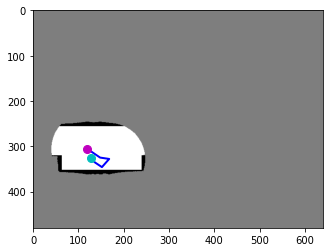

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3083, 0.5078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2500, 0.4781]), 'reward': tensor([0.1523]), 'action': tensor([-0.3942, -0.2755])}
terminal False


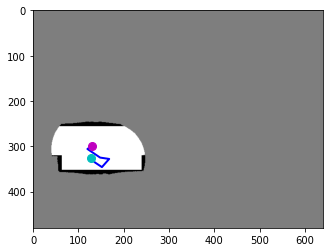

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2500, 0.4781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2708, 0.4672]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1397, -0.1054])}
terminal False


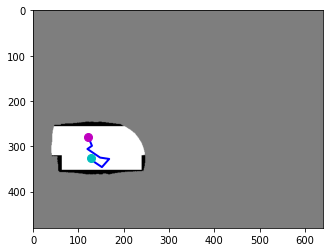

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2708, 0.4672]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2542, 0.4375]), 'reward': tensor([0.0251]), 'action': tensor([-0.1074, -0.2644])}
terminal False


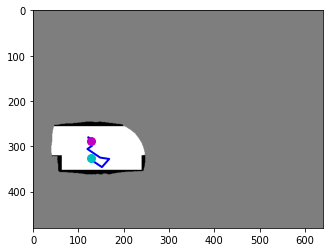

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2542, 0.4375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.4516]), 'reward': tensor([-0.8000]), 'action': tensor([0.0345, 0.0626])}
terminal False


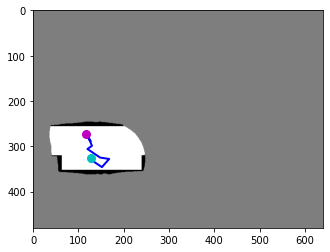

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.4516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2417, 0.4281]), 'reward': tensor([0.0337]), 'action': tensor([-0.1571, -0.2072])}
terminal False


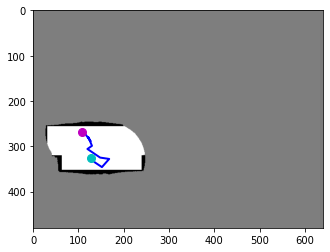

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2417, 0.4281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2229, 0.4203]), 'reward': tensor([0.0449]), 'action': tensor([-0.1196, -0.0687])}
terminal False


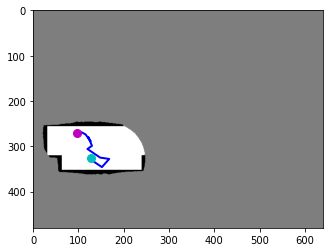

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2229, 0.4203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2021, 0.4234]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0436,  0.0095])}
terminal False


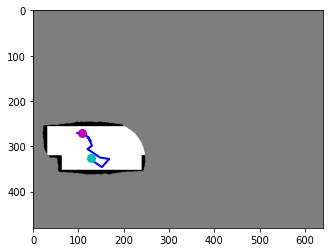

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2021, 0.4234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2229, 0.4234]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0577, -0.0021])}
terminal False


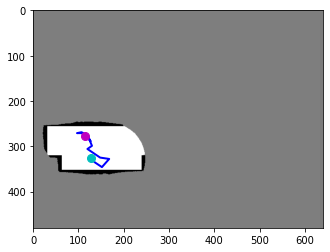

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2229, 0.4234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2396, 0.4328]), 'reward': tensor([-0.8000]), 'action': tensor([0.0796, 0.0582])}
terminal False


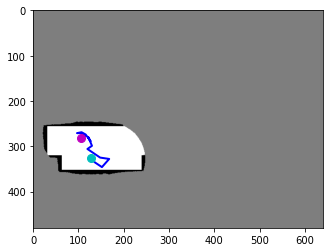

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2396, 0.4328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2188, 0.4406]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1395,  0.0714])}
terminal False


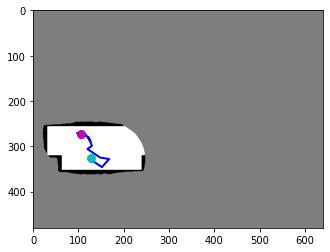

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2188, 0.4406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2208, 0.4250]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0112, -0.0822])}
terminal False


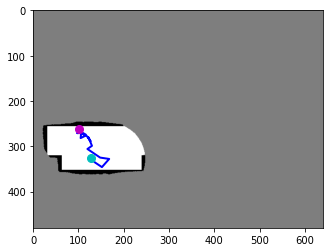

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2208, 0.4250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2104, 0.4109]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0173, -0.0317])}
terminal False


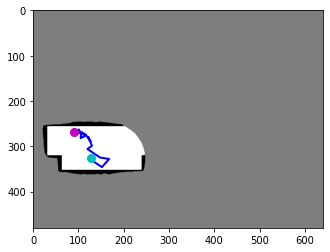

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2104, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1896, 0.4203]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1430,  0.0837])}
terminal False


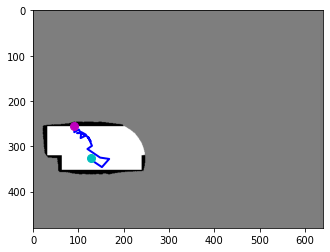

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1896, 0.4203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1896, 0.4203]), 'reward': tensor([-10.]), 'action': tensor([-0.0018, -0.2178])}
terminal True


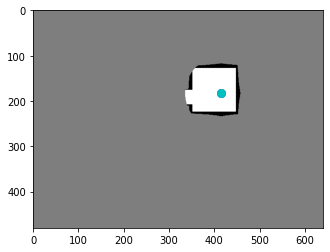

reward -17.22071441821754


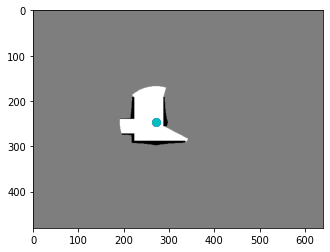

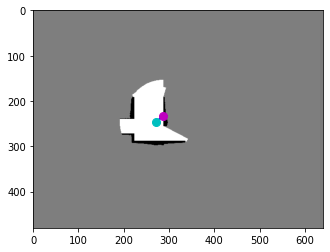

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.3859]), 'reward': tensor([-10.]), 'action': tensor([ 0.6143, -0.5072])}
terminal True


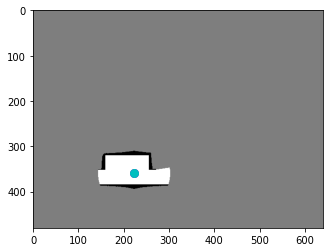

reward -10.0


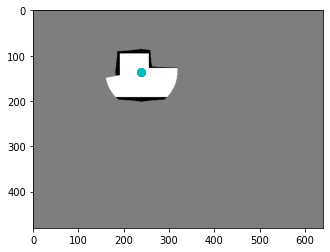

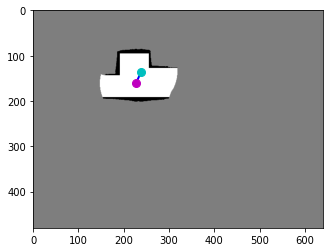

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4729, 0.2516]), 'reward': tensor([0.1473]), 'action': tensor([-0.1698,  0.3677])}
terminal False


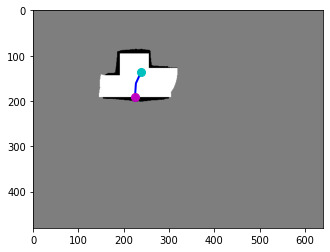

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4729, 0.2516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4729, 0.2516]), 'reward': tensor([-10.]), 'action': tensor([-0.0275,  0.5215])}
terminal True


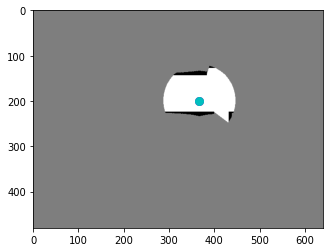

reward -9.852714285254478


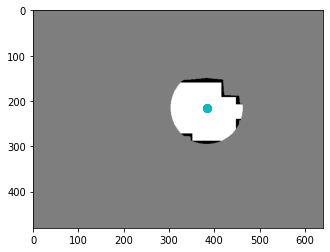

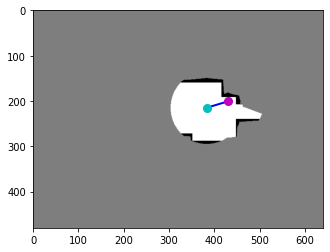

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8958, 0.3141]), 'reward': tensor([0.1371]), 'action': tensor([ 0.6715, -0.1916])}
terminal False


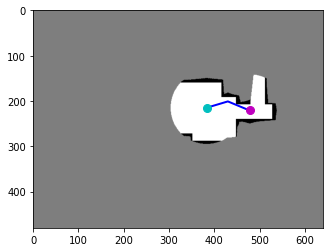

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8958, 0.3141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9958, 0.3453]), 'reward': tensor([0.4446]), 'action': tensor([0.6813, 0.2891])}
terminal False


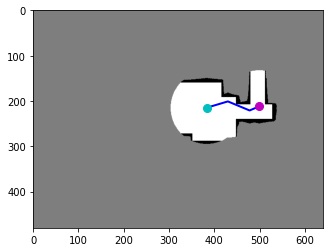

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9958, 0.3453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0396, 0.3313]), 'reward': tensor([0.0804]), 'action': tensor([ 0.2919, -0.1251])}
terminal False


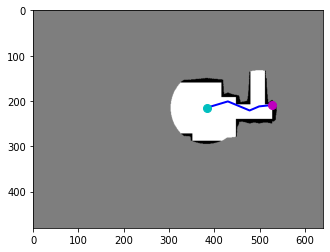

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0396, 0.3313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0396, 0.3313]), 'reward': tensor([-10.]), 'action': tensor([ 0.7436, -0.0760])}
terminal True


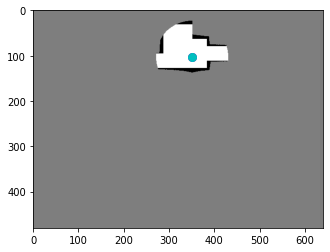

reward -9.337857142090797
step 3900
step 4000
avg iter time 0.8054128394126893


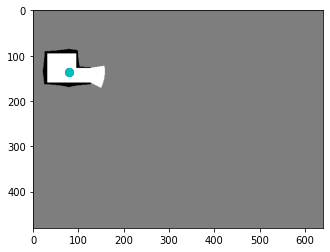

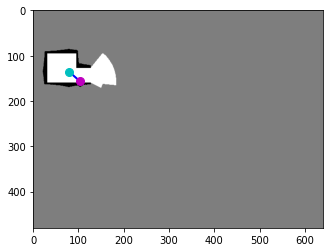

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2167, 0.2453]), 'reward': tensor([0.2496]), 'action': tensor([0.3500, 0.3159])}
terminal False


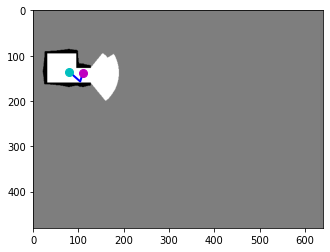

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2167, 0.2453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2292, 0.2156]), 'reward': tensor([0.2369]), 'action': tensor([ 0.0814, -0.2639])}
terminal False


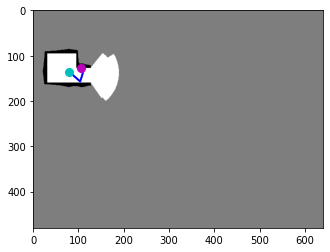

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2292, 0.2156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2292, 0.2156]), 'reward': tensor([-10.]), 'action': tensor([-0.1337, -0.3129])}
terminal True


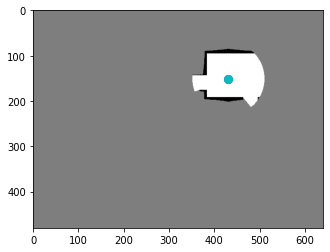

reward -9.513571426272392


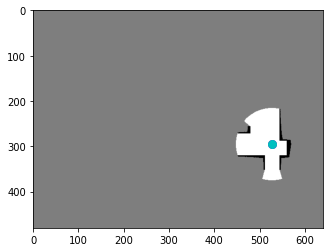

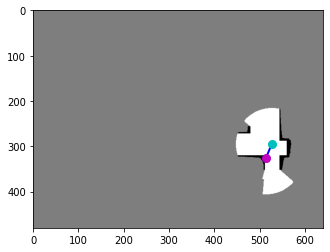

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0708, 0.5094]), 'reward': tensor([0.2624]), 'action': tensor([-0.1779,  0.4341])}
terminal False


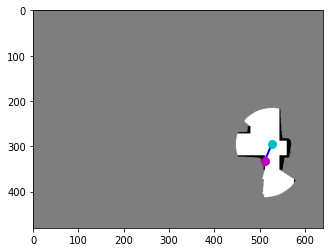

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0708, 0.5094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0708, 0.5094]), 'reward': tensor([-10.]), 'action': tensor([-0.1237,  0.2841])}
terminal True


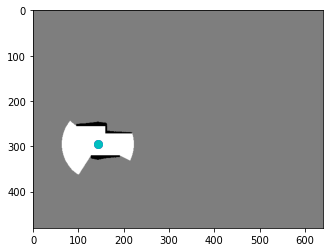

reward -9.73757141828537


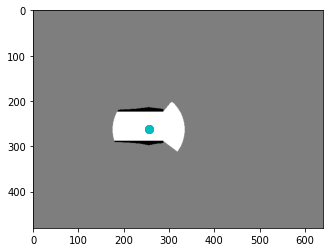

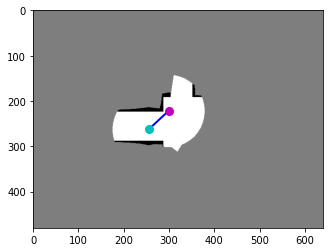

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6229, 0.3469]), 'reward': tensor([0.9701]), 'action': tensor([ 0.6169, -0.5816])}
terminal False


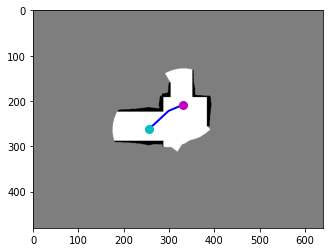

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6229, 0.3469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.3250]), 'reward': tensor([0.3149]), 'action': tensor([ 0.4725, -0.2036])}
terminal False


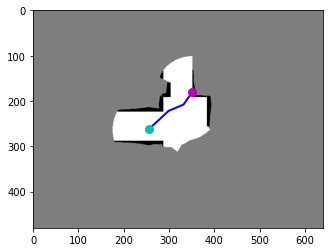

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6917, 0.3250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.3250]), 'reward': tensor([-10.]), 'action': tensor([ 0.4561, -0.6270])}
terminal True


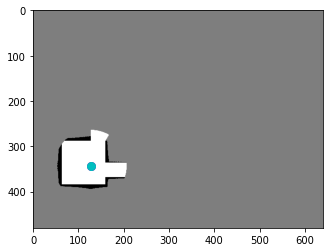

reward -8.715000003576279


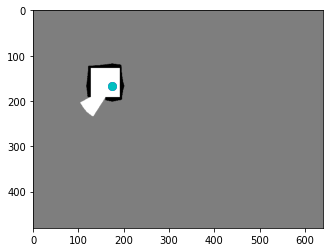

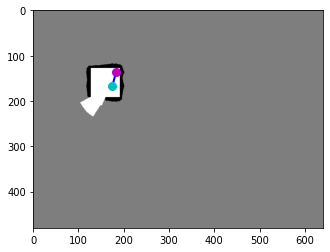

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3812, 0.2141]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1085, -0.4224])}
terminal False


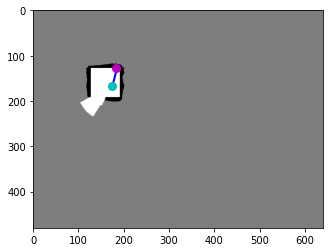

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3812, 0.2141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3812, 0.2141]), 'reward': tensor([-10.]), 'action': tensor([-0.0251, -0.3342])}
terminal True


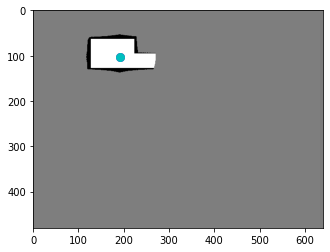

reward -10.800000011920929


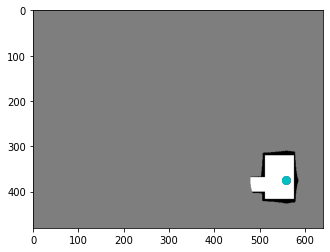

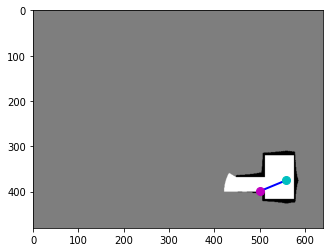

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0438, 0.6234]), 'reward': tensor([0.2734]), 'action': tensor([-0.8248,  0.3388])}
terminal False


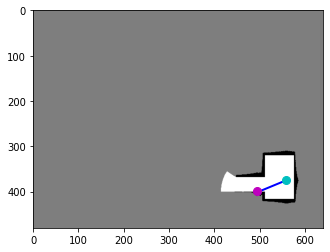

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0438, 0.6234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0438, 0.6234]), 'reward': tensor([-10.]), 'action': tensor([-0.7870,  0.0583])}
terminal True


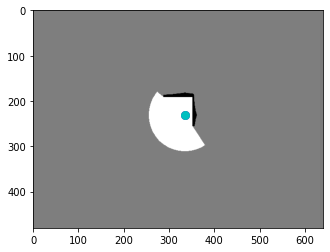

reward -9.726571440696716
step 4000
CRITIC


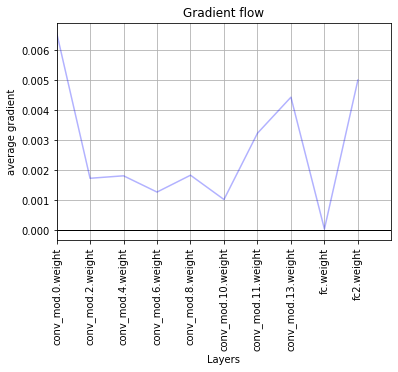

ACTOR


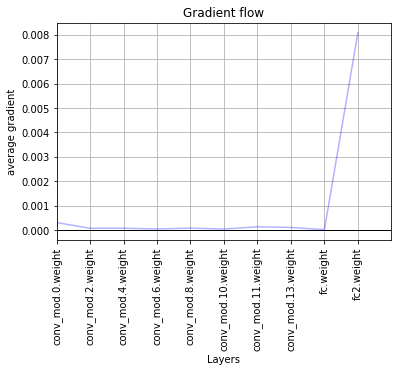

step 4100
avg iter time 0.8049660510551638


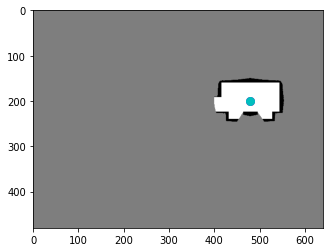

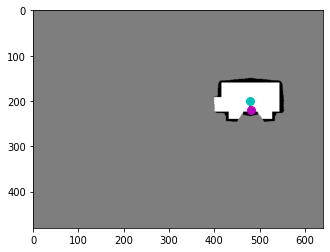

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0000, 0.3438]), 'reward': tensor([-0.8000]), 'action': tensor([0.0208, 0.2925])}
terminal False


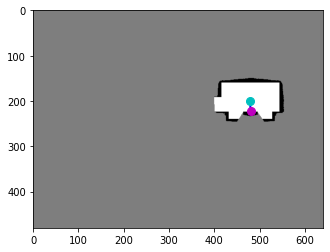

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0000, 0.3438]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0000, 0.3438]), 'reward': tensor([-10.]), 'action': tensor([0.0162, 0.0857])}
terminal True


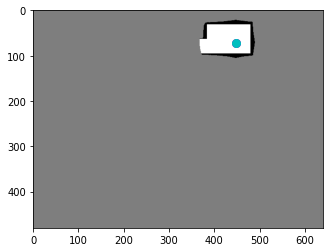

reward -10.800000011920929


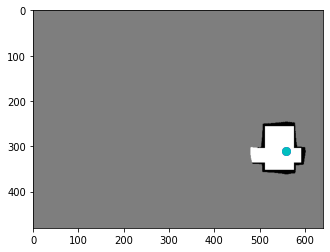

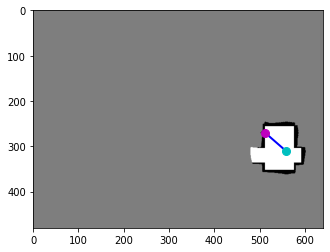

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1646, 0.4859]), 'reward': tensor([-10.]), 'action': tensor([-0.6789, -0.5748])}
terminal True


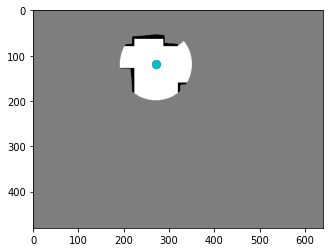

reward -10.0


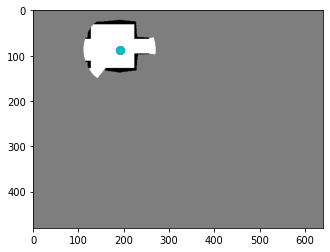

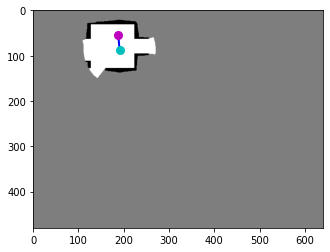

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3917, 0.0859]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0388, -0.4485])}
terminal False


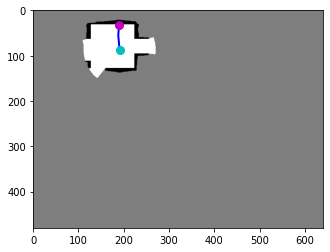

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3917, 0.0859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3917, 0.0859]), 'reward': tensor([-10.]), 'action': tensor([ 0.0354, -0.4396])}
terminal True


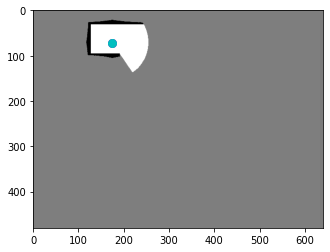

reward -10.800000011920929


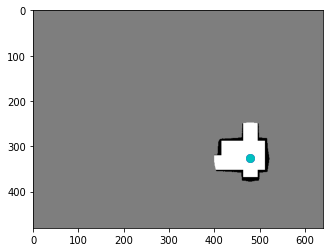

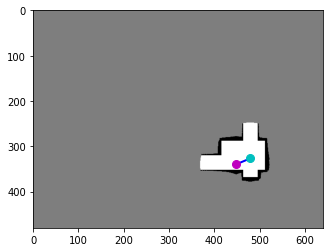

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.5312]), 'reward': tensor([0.1431]), 'action': tensor([-0.4418,  0.1823])}
terminal False


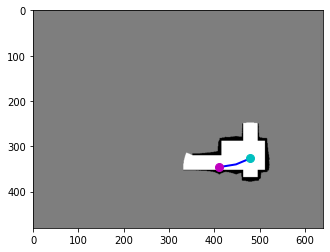

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.5312]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.5406]), 'reward': tensor([0.1736]), 'action': tensor([-0.5277,  0.0877])}
terminal False


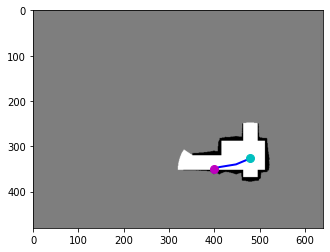

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8562, 0.5406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.5406]), 'reward': tensor([-10.]), 'action': tensor([-0.6152,  0.2855])}
terminal True


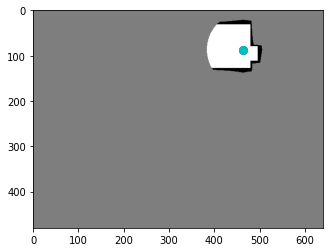

reward -9.6832857131958


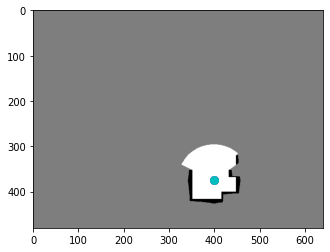

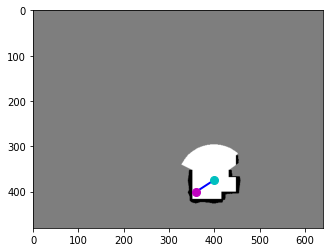

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8313, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7479, 0.6266]), 'reward': tensor([-0.8000]), 'action': tensor([-0.5724,  0.3624])}
terminal False


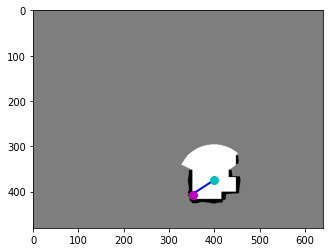

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7479, 0.6266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7479, 0.6266]), 'reward': tensor([-10.]), 'action': tensor([-0.3722,  0.3281])}
terminal True


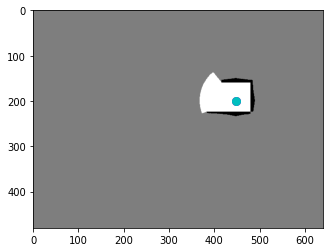

reward -10.800000011920929
step 4100
step 4200
avg iter time 0.8043235403583163


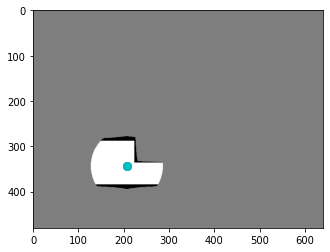

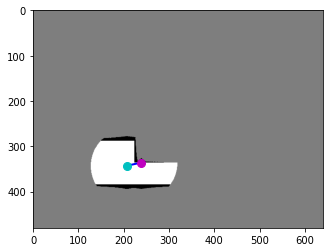

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4313, 0.5359]), 'reward': tensor([-10.]), 'action': tensor([ 0.6607, -0.1576])}
terminal True


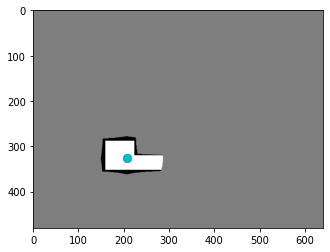

reward -10.0


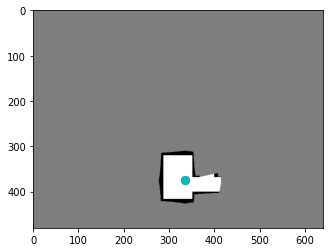

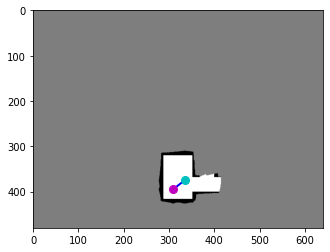

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6438, 0.6172]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3645,  0.2788])}
terminal False


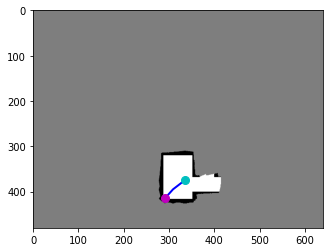

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6438, 0.6172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6438, 0.6172]), 'reward': tensor([-10.]), 'action': tensor([-0.3035,  0.3331])}
terminal True


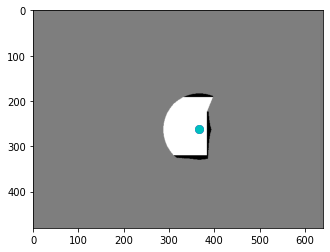

reward -10.800000011920929


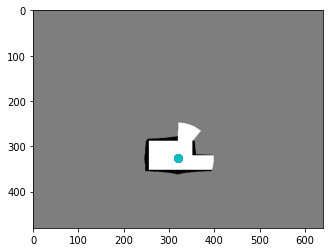

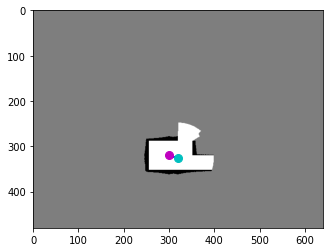

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6646, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6250, 0.4984]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2691, -0.1100])}
terminal False


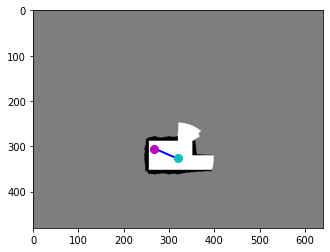

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6250, 0.4984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5583, 0.4766]), 'reward': tensor([-0.8000]), 'action': tensor([-0.4555, -0.1997])}
terminal False


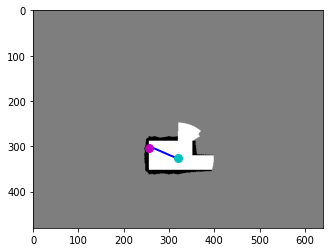

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5583, 0.4766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5583, 0.4766]), 'reward': tensor([-10.]), 'action': tensor([-0.2960, -0.0414])}
terminal True


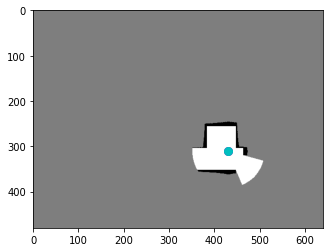

reward -11.600000023841858


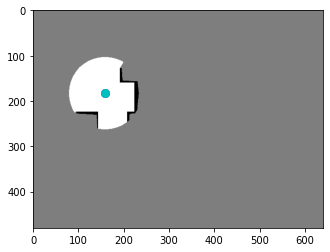

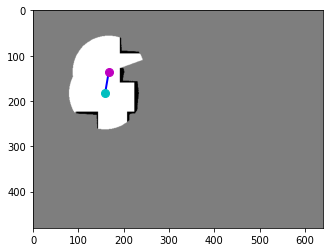

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3479, 0.2125]), 'reward': tensor([0.7916]), 'action': tensor([ 0.1100, -0.6642])}
terminal False


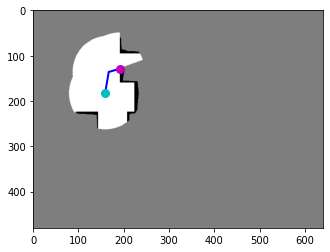

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3479, 0.2125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3479, 0.2125]), 'reward': tensor([-10.]), 'action': tensor([ 0.3667, -0.1056])}
terminal True


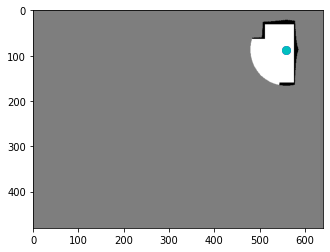

reward -9.20842856168747


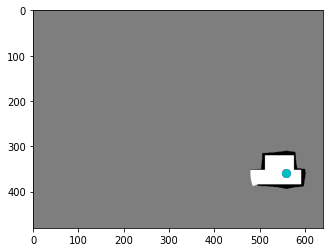

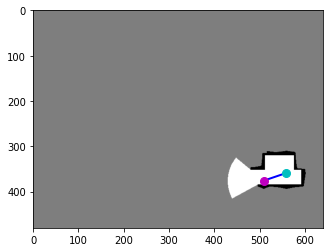

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0604, 0.5875]), 'reward': tensor([0.4729]), 'action': tensor([-0.7019,  0.2405])}
terminal False


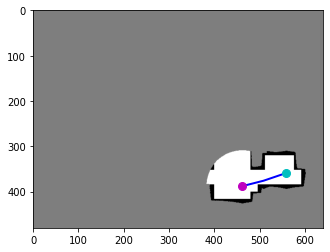

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0604, 0.5875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9625, 0.6062]), 'reward': tensor([0.7680]), 'action': tensor([-0.6636,  0.1662])}
terminal False


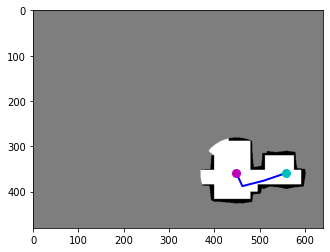

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9625, 0.6062]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9354, 0.5625]), 'reward': tensor([0.4099]), 'action': tensor([-0.1881, -0.3995])}
terminal False


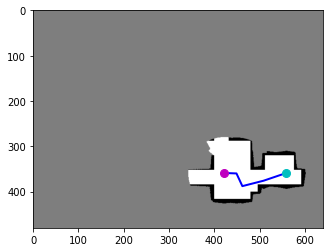

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9354, 0.5625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8792, 0.5609]), 'reward': tensor([0.1879]), 'action': tensor([-0.3865, -0.0139])}
terminal False


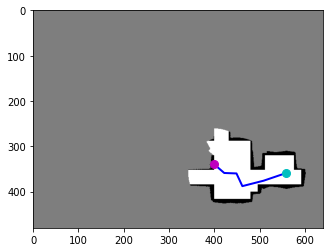

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8792, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8792, 0.5609]), 'reward': tensor([-10.]), 'action': tensor([-0.4720, -0.4007])}
terminal True


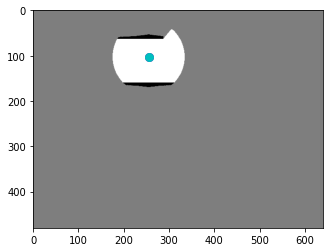

reward -8.161428555846214
step 4200
step 4300
avg iter time 0.804347222184026


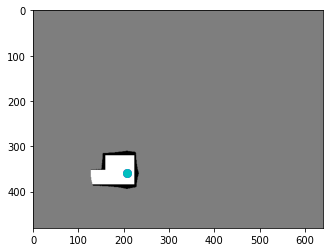

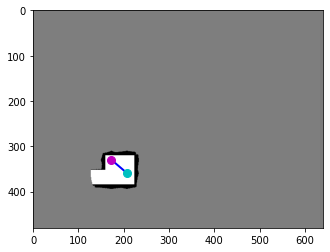

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3604, 0.5156]), 'reward': tensor([-0.8000]), 'action': tensor([-0.4799, -0.4077])}
terminal False


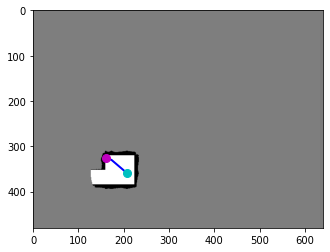

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3604, 0.5156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3604, 0.5156]), 'reward': tensor([-10.]), 'action': tensor([-0.4016, -0.1099])}
terminal True


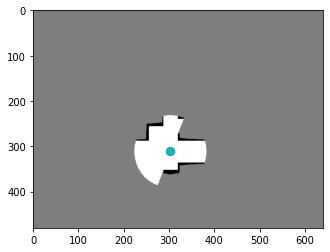

reward -10.800000011920929


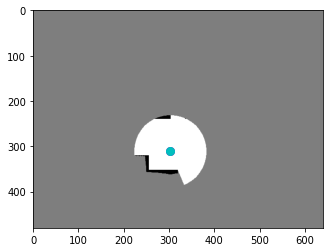

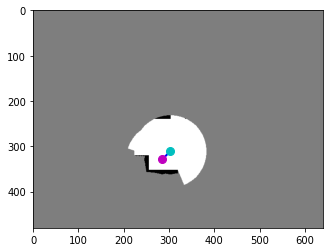

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5938, 0.5141]), 'reward': tensor([0.0543]), 'action': tensor([-0.2535,  0.2514])}
terminal False


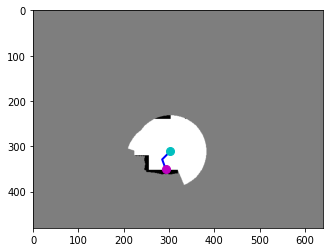

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5938, 0.5141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5938, 0.5141]), 'reward': tensor([-10.]), 'action': tensor([0.1285, 0.3563])}
terminal True


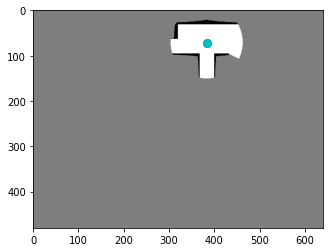

reward -9.94571428745985


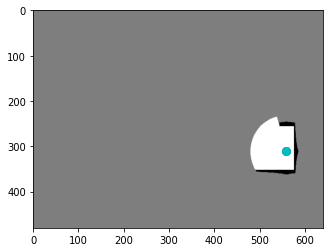

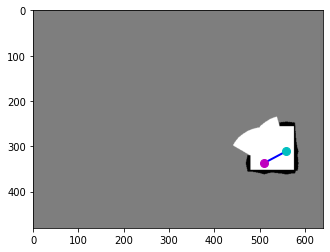

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0625, 0.5266]), 'reward': tensor([0.2397]), 'action': tensor([-0.6940,  0.3675])}
terminal False


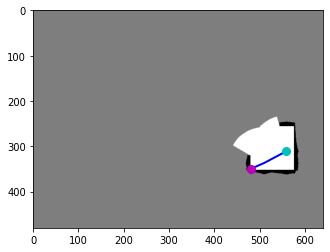

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0625, 0.5266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0625, 0.5266]), 'reward': tensor([-10.]), 'action': tensor([-0.7767,  0.3446])}
terminal True


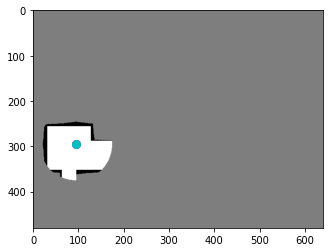

reward -9.760285720229149


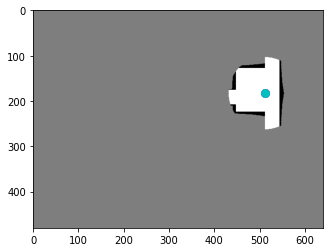

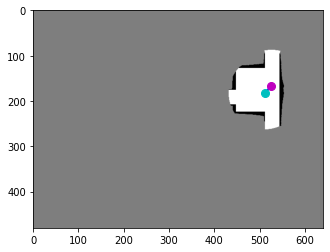

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0958, 0.2609]), 'reward': tensor([0.0827]), 'action': tensor([ 0.2123, -0.2260])}
terminal False


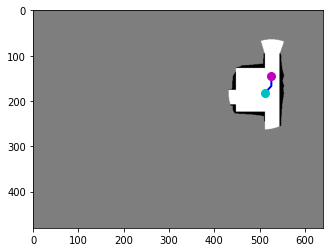

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0958, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0958, 0.2250]), 'reward': tensor([0.1487]), 'action': tensor([-0.0033, -0.3210])}
terminal False


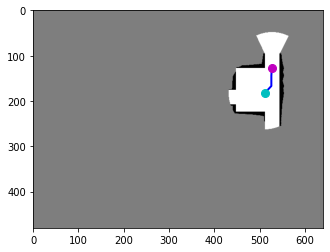

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0958, 0.2250]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0979, 0.2000]), 'reward': tensor([0.1651]), 'action': tensor([ 0.0149, -0.2233])}
terminal False


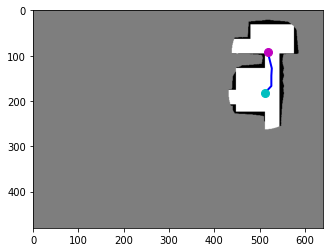

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.2000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0792, 0.1437]), 'reward': tensor([0.7099]), 'action': tensor([-0.1325, -0.5073])}
terminal False


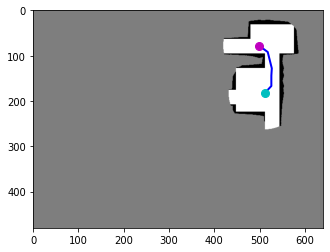

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0792, 0.1437]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0396, 0.1219]), 'reward': tensor([0.0914]), 'action': tensor([-0.2651, -0.1922])}
terminal False


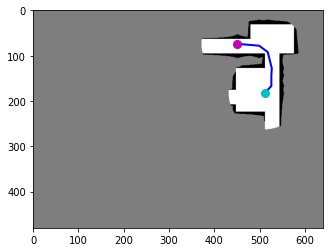

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0396, 0.1219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9396, 0.1156]), 'reward': tensor([0.2186]), 'action': tensor([-0.6853, -0.0522])}
terminal False


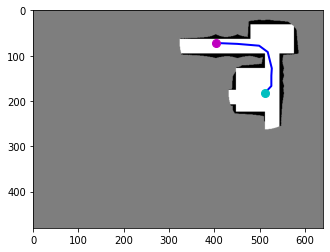

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9396, 0.1156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8396, 0.1125]), 'reward': tensor([0.2189]), 'action': tensor([-0.6825, -0.0281])}
terminal False


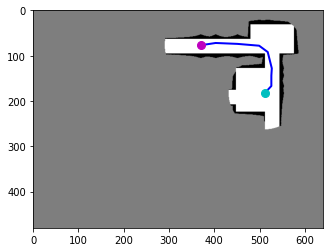

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8396, 0.1125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7708, 0.1203]), 'reward': tensor([0.1521]), 'action': tensor([-0.4673,  0.0753])}
terminal False


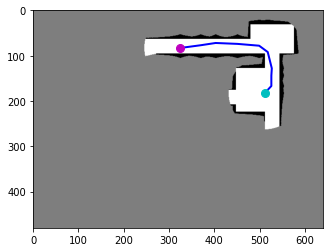

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7708, 0.1203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6771, 0.1297]), 'reward': tensor([0.2173]), 'action': tensor([-0.6363,  0.0855])}
terminal False


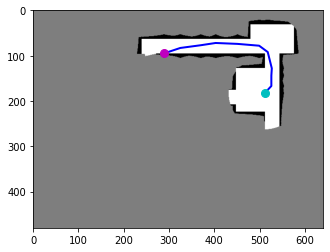

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6771, 0.1297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6771, 0.1297]), 'reward': tensor([-10.]), 'action': tensor([-0.5218,  0.1891])}
terminal True


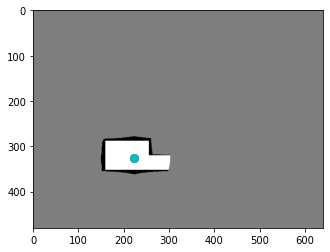

reward -7.995285697281361


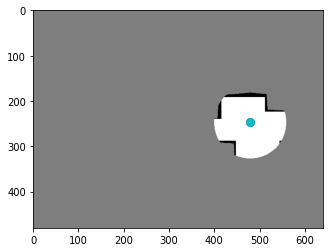

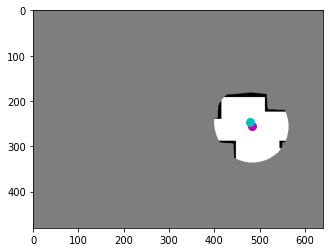

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0083, 0.4000]), 'reward': tensor([0.1903]), 'action': tensor([0.0619, 0.1217])}
terminal False


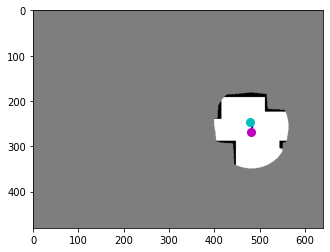

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0083, 0.4000]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0042, 0.4203]), 'reward': tensor([0.1900]), 'action': tensor([-0.0310,  0.1818])}
terminal False


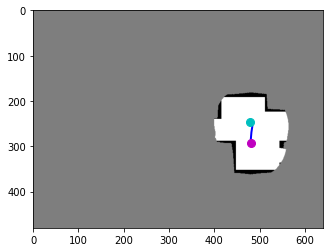

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0042, 0.4203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0000, 0.4563]), 'reward': tensor([0.1596]), 'action': tensor([-0.0270,  0.3191])}
terminal False


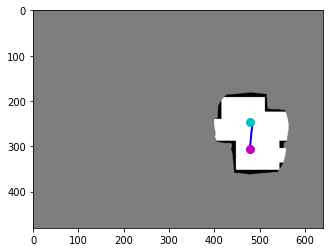

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0000, 0.4563]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9958, 0.4766]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0228,  0.1867])}
terminal False


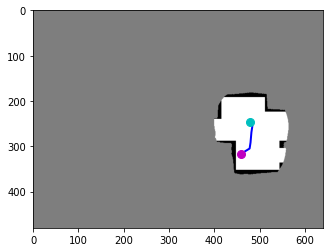

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9958, 0.4766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.4938]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2558,  0.1570])}
terminal False


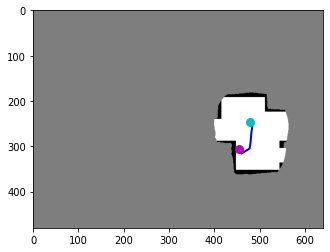

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.4938]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9458, 0.4781]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0862, -0.1354])}
terminal False


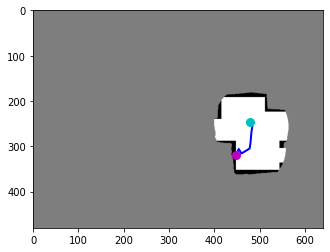

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9458, 0.4781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9458, 0.4781]), 'reward': tensor([-10.]), 'action': tensor([-0.1851,  0.3624])}
terminal True


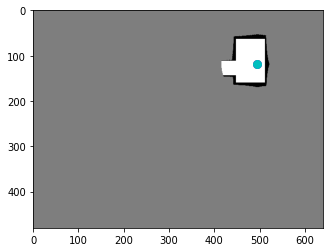

reward -11.860142901539803
step 4300
step 4400
avg iter time 0.8049362230842764


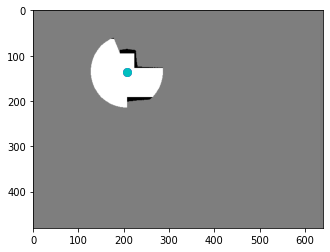

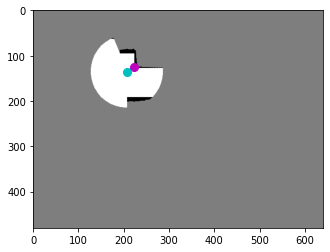

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4313, 0.2109]), 'reward': tensor([-10.]), 'action': tensor([ 0.3673, -0.1949])}
terminal True


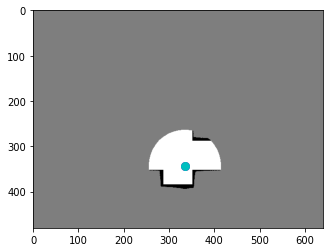

reward -10.0


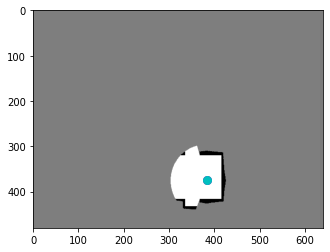

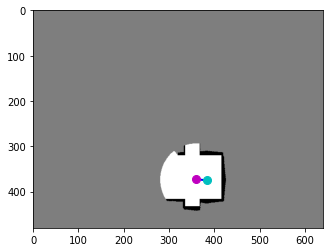

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7500, 0.5828]), 'reward': tensor([0.3837]), 'action': tensor([-0.3237, -0.0250])}
terminal False


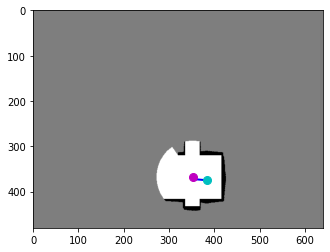

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7500, 0.5828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7333, 0.5734]), 'reward': tensor([0.1734]), 'action': tensor([-0.0577, -0.0489])}
terminal False


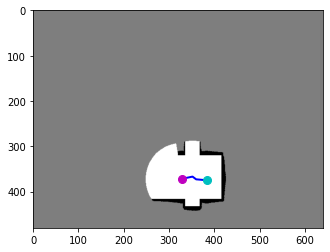

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7333, 0.5734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6833, 0.5813]), 'reward': tensor([0.4043]), 'action': tensor([-0.3356,  0.0665])}
terminal False


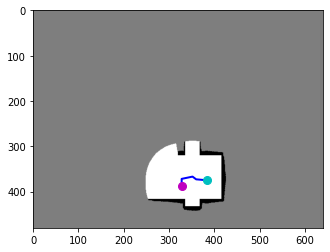

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6833, 0.5813]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6833, 0.6047]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0049,  0.2181])}
terminal False


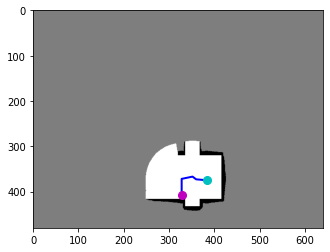

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6833, 0.6047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6833, 0.6359]), 'reward': tensor([-0.8000]), 'action': tensor([0.0045, 0.2856])}
terminal False


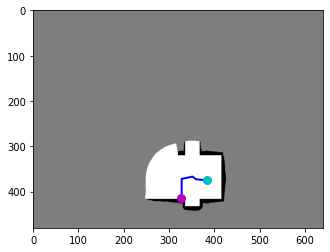

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6833, 0.6359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6833, 0.6359]), 'reward': tensor([-10.]), 'action': tensor([-0.0307,  0.2141])}
terminal True


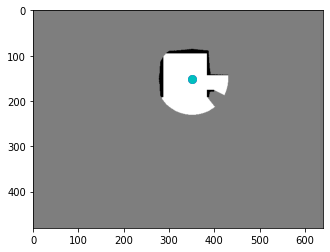

reward -10.638571441173553


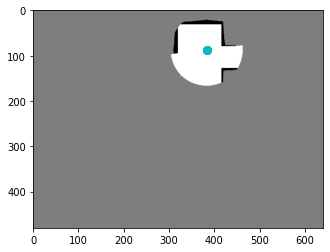

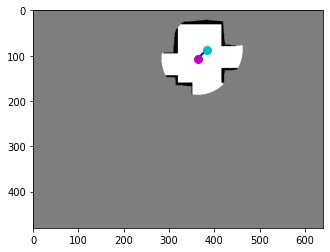

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7563, 0.1672]), 'reward': tensor([0.3806]), 'action': tensor([-0.2798,  0.2856])}
terminal False


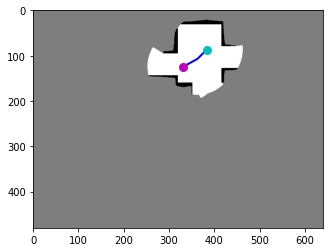

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7563, 0.1672]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.1937]), 'reward': tensor([0.2594]), 'action': tensor([-0.4427,  0.2456])}
terminal False


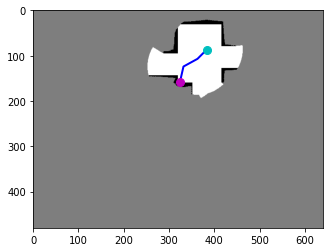

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6917, 0.1937]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.1937]), 'reward': tensor([-10.]), 'action': tensor([-0.1357,  0.5874])}
terminal True


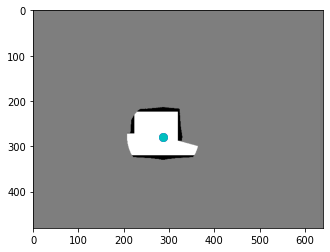

reward -9.360000014305115


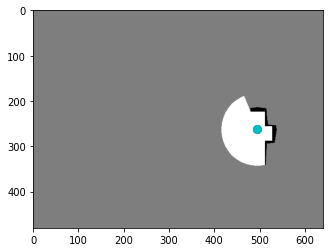

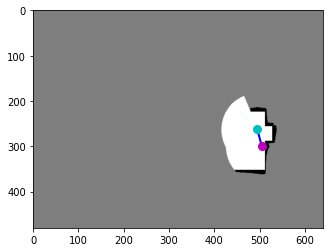

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0521, 0.4688]), 'reward': tensor([0.1841]), 'action': tensor([0.1448, 0.5287])}
terminal False


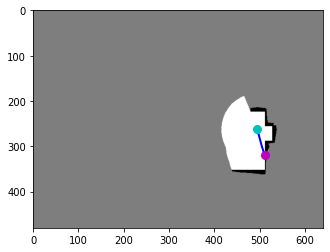

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0521, 0.4688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0521, 0.4688]), 'reward': tensor([-10.]), 'action': tensor([0.0989, 0.2777])}
terminal True


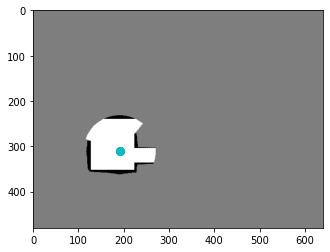

reward -9.815857142210007


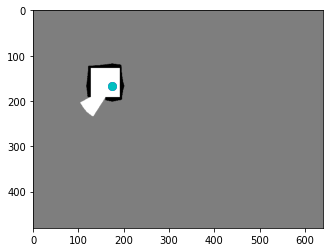

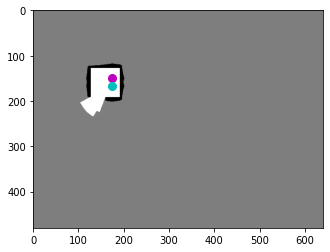

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3646, 0.2344]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0057, -0.2412])}
terminal False


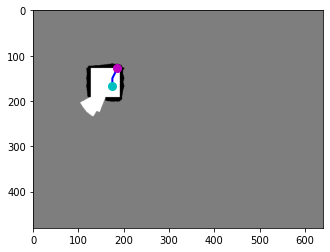

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.2344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3646, 0.2344]), 'reward': tensor([-10.]), 'action': tensor([ 0.2199, -0.4674])}
terminal True


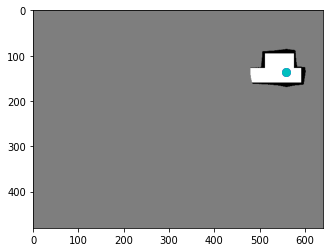

reward -10.800000011920929
step 4400
step 4500
avg iter time 0.8040733892652724


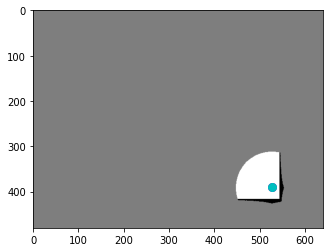

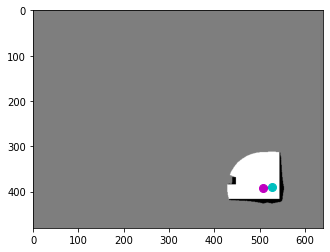

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0583, 0.6125]), 'reward': tensor([0.2263]), 'action': tensor([-0.2720,  0.0087])}
terminal False


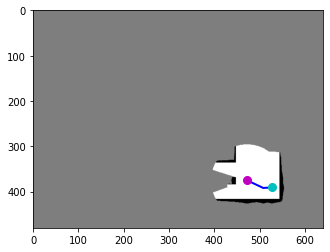

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0583, 0.6125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9833, 0.5859]), 'reward': tensor([0.4383]), 'action': tensor([-0.5067, -0.2434])}
terminal False


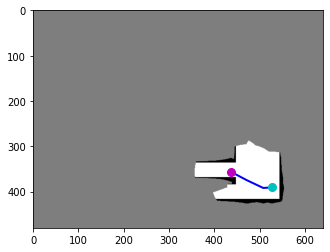

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9833, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9083, 0.5562]), 'reward': tensor([0.2541]), 'action': tensor([-0.5099, -0.2742])}
terminal False


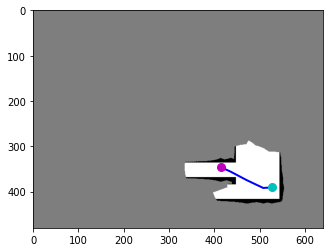

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9083, 0.5562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8625, 0.5406]), 'reward': tensor([0.1003]), 'action': tensor([-0.3058, -0.1474])}
terminal False


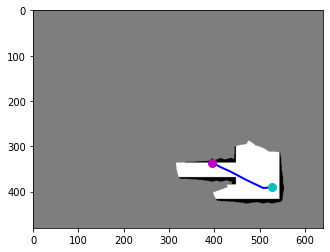

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8625, 0.5406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8625, 0.5406]), 'reward': tensor([-10.]), 'action': tensor([-0.3693, -0.1990])}
terminal True


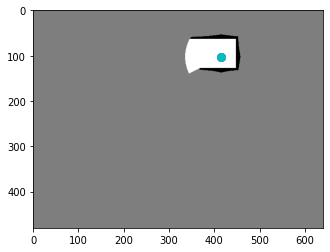

reward -8.981000013649464


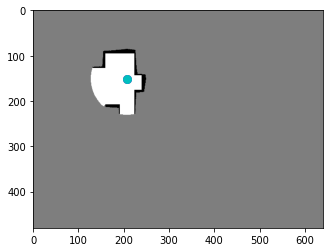

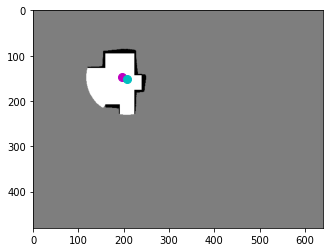

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4104, 0.2313]), 'reward': tensor([0.1113]), 'action': tensor([-0.1119, -0.0331])}
terminal False


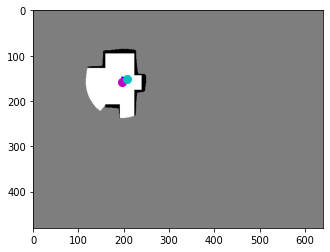

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4104, 0.2313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4083, 0.2469]), 'reward': tensor([0.0870]), 'action': tensor([-0.0124,  0.1449])}
terminal False


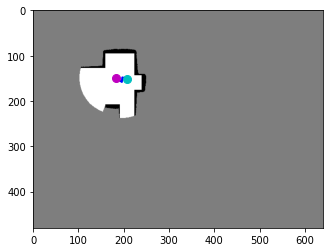

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4083, 0.2469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3792, 0.2328]), 'reward': tensor([0.1477]), 'action': tensor([-0.2033, -0.1309])}
terminal False


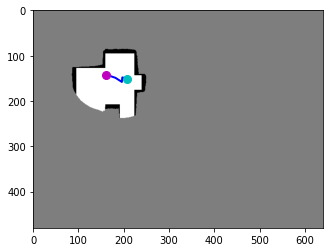

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3792, 0.2328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3375, 0.2219]), 'reward': tensor([0.1359]), 'action': tensor([-0.2821, -0.0936])}
terminal False


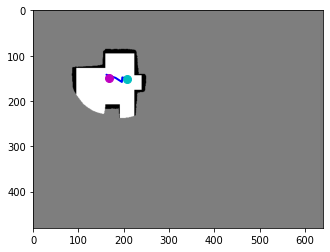

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3375, 0.2219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3500, 0.2344]), 'reward': tensor([0.0354]), 'action': tensor([0.0836, 0.1046])}
terminal False


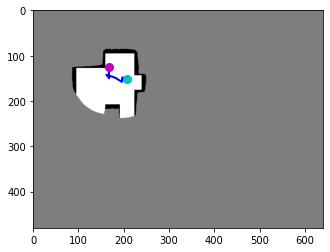

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3500, 0.2344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3479, 0.1969]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0119, -0.3439])}
terminal False


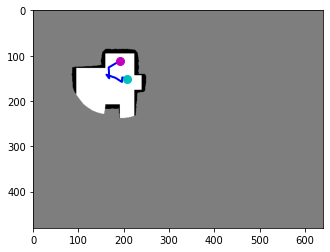

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3479, 0.1969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3979, 0.1750]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3352, -0.1951])}
terminal False


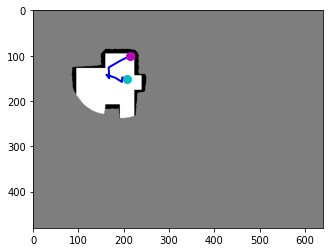

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.1750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4437, 0.1578]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.3129, -0.1622])}
terminal False


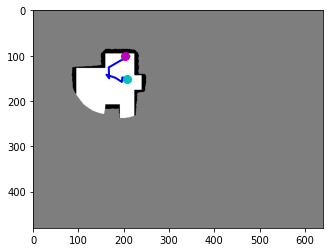

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4437, 0.1578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4229, 0.1578]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0608, -0.0017])}
terminal False


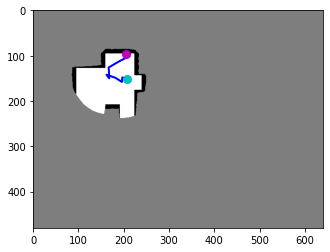

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4229, 0.1578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4229, 0.1578]), 'reward': tensor([-10.]), 'action': tensor([ 0.0586, -0.1359])}
terminal True


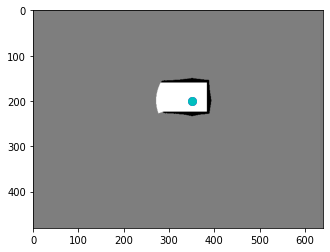

reward -12.682714324444532


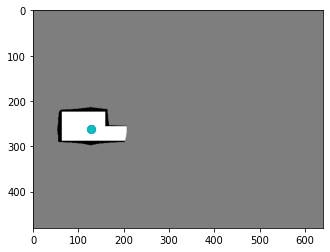

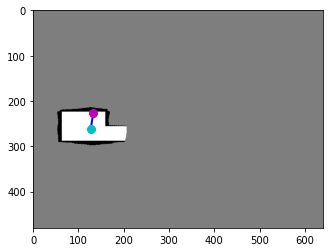

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2771, 0.3531]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0882, -0.5267])}
terminal False


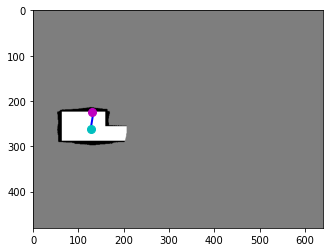

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2771, 0.3531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2771, 0.3531]), 'reward': tensor([-10.]), 'action': tensor([-0.2876, -0.4491])}
terminal True


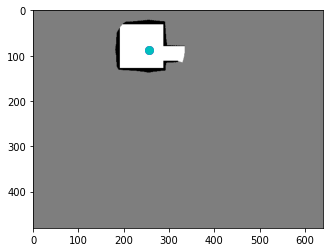

reward -10.800000011920929


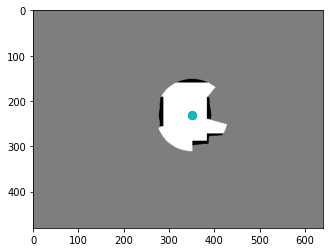

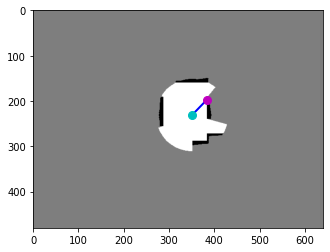

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7312, 0.3609]), 'reward': tensor([-10.]), 'action': tensor([ 0.6769, -0.6827])}
terminal True


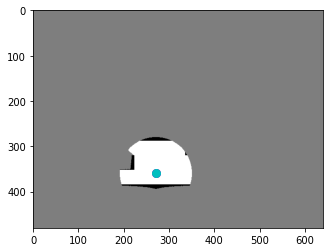

reward -10.0


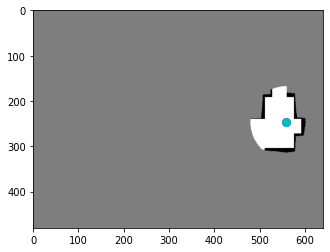

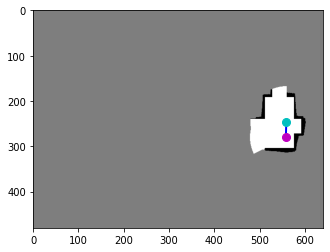

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1625, 0.4375]), 'reward': tensor([0.0830]), 'action': tensor([-0.0079,  0.4706])}
terminal False


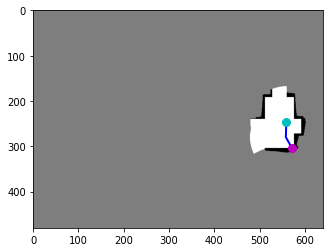

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1625, 0.4375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1625, 0.4375]), 'reward': tensor([-10.]), 'action': tensor([0.2859, 0.4960])}
terminal True


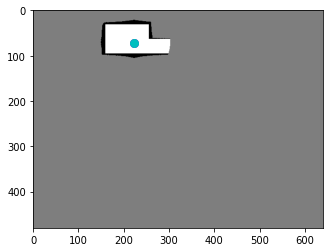

reward -9.917000003159046
step 4500
CRITIC


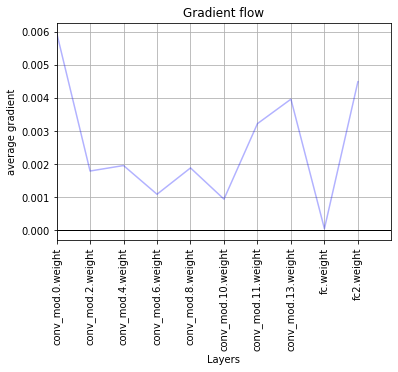

ACTOR


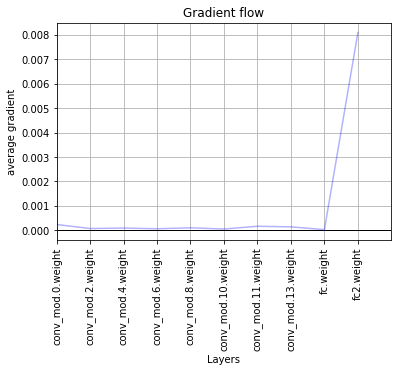

step 4600
avg iter time 0.8042628186163695


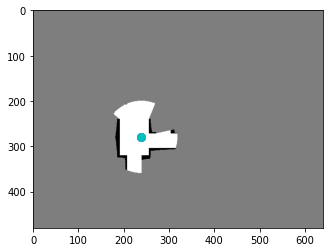

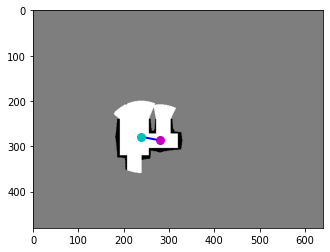

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5833, 0.4484]), 'reward': tensor([0.3193]), 'action': tensor([0.5782, 0.1155])}
terminal False


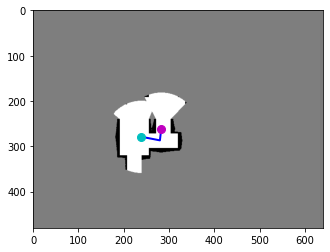

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5833, 0.4484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5896, 0.4078]), 'reward': tensor([0.3084]), 'action': tensor([ 0.0421, -0.3732])}
terminal False


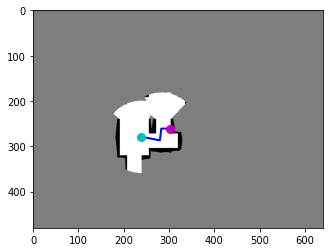

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5896, 0.4078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5896, 0.4078]), 'reward': tensor([-10.]), 'action': tensor([0.4042, 0.0018])}
terminal True


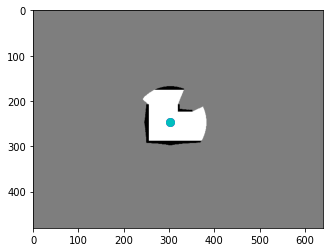

reward -9.372285693883896


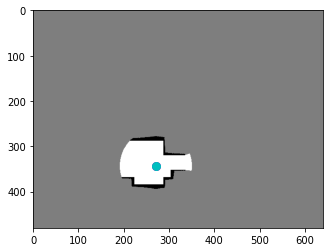

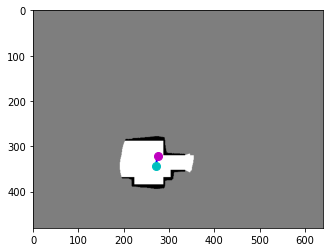

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5729, 0.5016]), 'reward': tensor([0.0394]), 'action': tensor([ 0.0495, -0.3145])}
terminal False


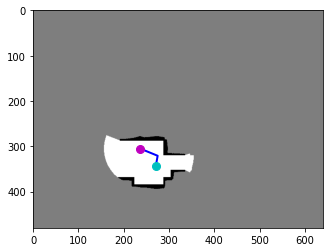

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5729, 0.5016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4917, 0.4766]), 'reward': tensor([0.3864]), 'action': tensor([-0.5544, -0.2299])}
terminal False


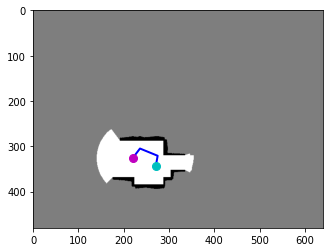

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4917, 0.4766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4583, 0.5094]), 'reward': tensor([0.3024]), 'action': tensor([-0.2307,  0.3039])}
terminal False


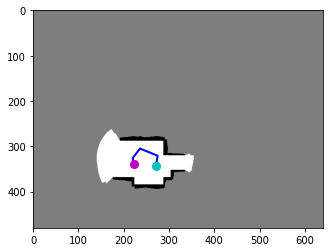

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4583, 0.5094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4625, 0.5312]), 'reward': tensor([-0.8000]), 'action': tensor([0.0254, 0.2001])}
terminal False


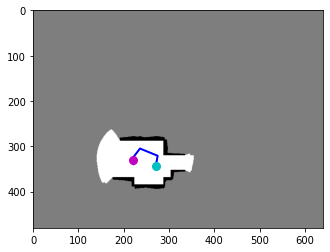

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4625, 0.5312]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4604, 0.5156]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0122, -0.1405])}
terminal False


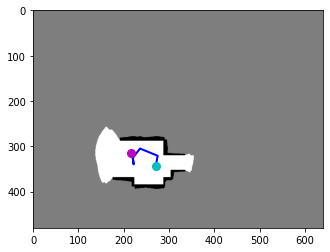

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4604, 0.5156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4521, 0.4906]), 'reward': tensor([0.0771]), 'action': tensor([-0.0556, -0.2304])}
terminal False


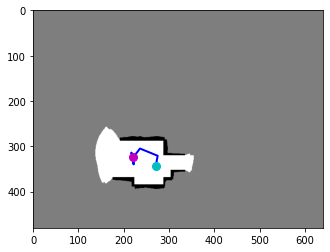

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4521, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4583, 0.5063]), 'reward': tensor([-0.8000]), 'action': tensor([0.0331, 0.1279])}
terminal False


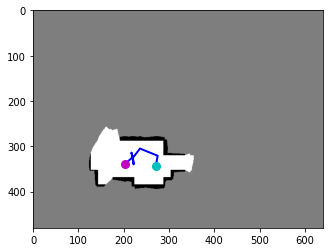

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4583, 0.5063]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4229, 0.5297]), 'reward': tensor([0.1306]), 'action': tensor([-0.2459,  0.2176])}
terminal False


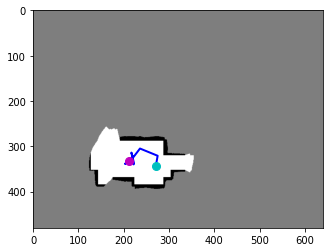

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4229, 0.5297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4396, 0.5203]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0979, -0.0711])}
terminal False


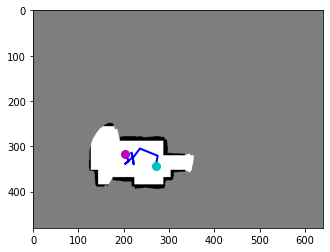

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4396, 0.5203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4250, 0.4969]), 'reward': tensor([0.0873]), 'action': tensor([-0.1021, -0.2100])}
terminal False


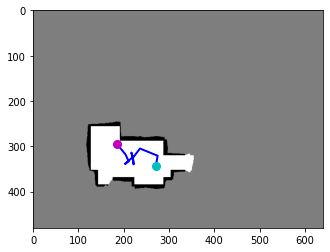

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4250, 0.4969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3875, 0.4625]), 'reward': tensor([0.0814]), 'action': tensor([-0.2568, -0.3151])}
terminal False


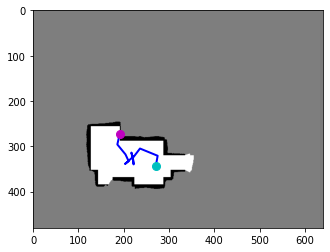

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3875, 0.4625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3875, 0.4625]), 'reward': tensor([-10.]), 'action': tensor([ 0.1502, -0.6261])}
terminal True


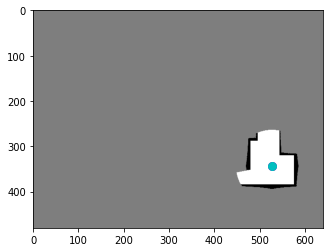

reward -12.095285769551992


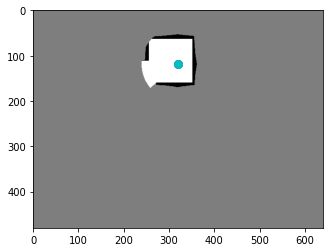

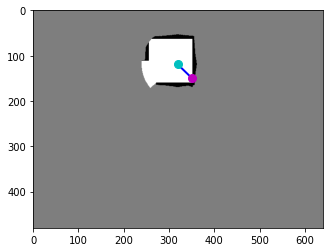

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6646, 0.1859]), 'reward': tensor([-10.]), 'action': tensor([0.4931, 0.4651])}
terminal True


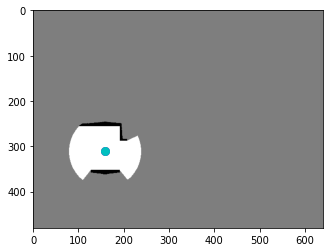

reward -10.0


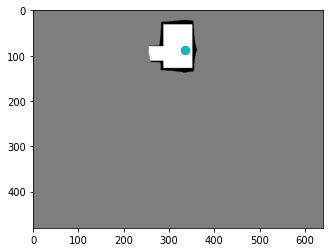

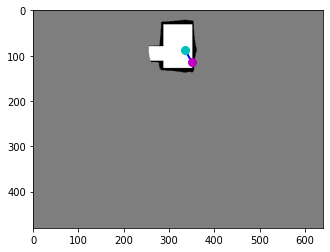

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6979, 0.1359]), 'reward': tensor([-10.]), 'action': tensor([0.4125, 0.6976])}
terminal True


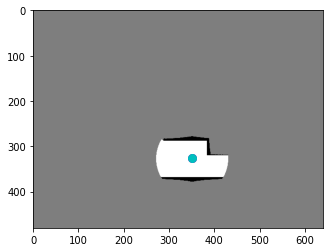

reward -10.0


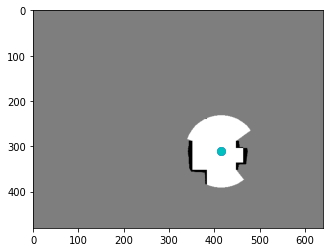

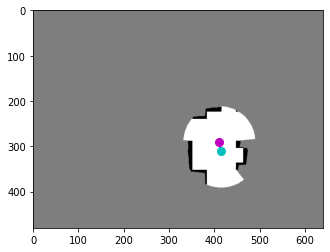

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8646, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.4547]), 'reward': tensor([0.3920]), 'action': tensor([-0.0598, -0.2801])}
terminal False


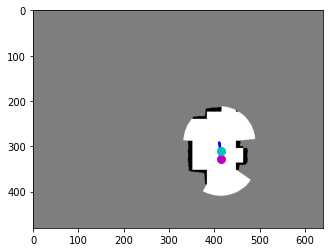

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8562, 0.4547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8625, 0.5141]), 'reward': tensor([0.2650]), 'action': tensor([0.0366, 0.5379])}
terminal False


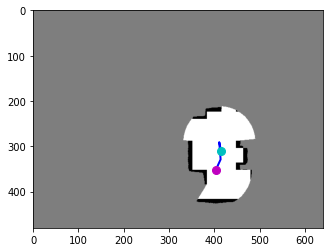

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8625, 0.5141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8396, 0.5516]), 'reward': tensor([0.2197]), 'action': tensor([-0.1525,  0.3371])}
terminal False


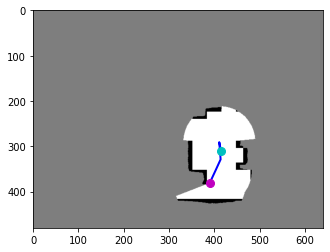

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8396, 0.5516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8125, 0.5953]), 'reward': tensor([0.1511]), 'action': tensor([-0.1857,  0.3974])}
terminal False


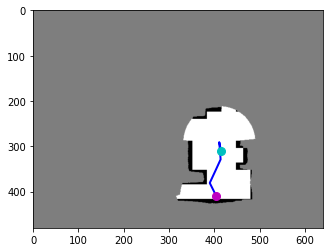

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8125, 0.5953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8417, 0.6391]), 'reward': tensor([0.1357]), 'action': tensor([0.1916, 0.3892])}
terminal False


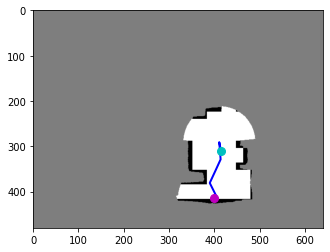

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8417, 0.6391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8417, 0.6391]), 'reward': tensor([-10.]), 'action': tensor([-0.2526,  0.3358])}
terminal True


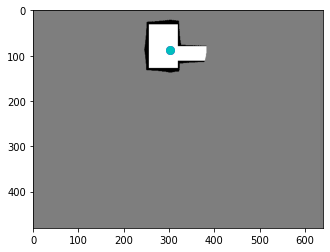

reward -8.836428597569466
step 4600
step 4700
avg iter time 0.805196195967654


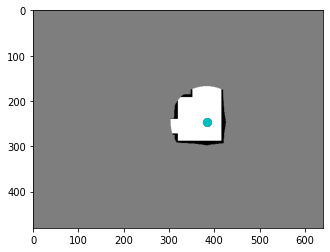

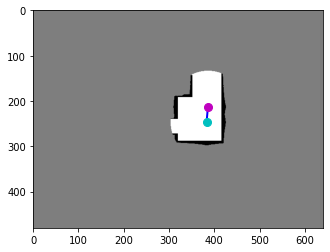

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8042, 0.3328]), 'reward': tensor([0.3137]), 'action': tensor([ 0.0439, -0.4877])}
terminal False


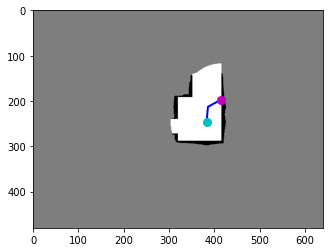

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8042, 0.3328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8042, 0.3328]), 'reward': tensor([-10.]), 'action': tensor([ 0.5384, -0.2827])}
terminal True


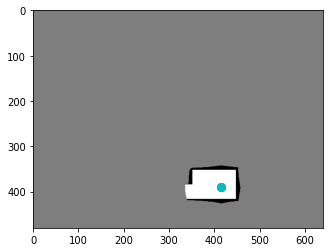

reward -9.686285704374313


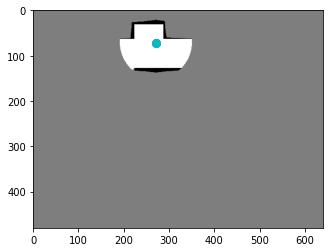

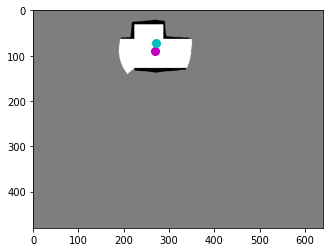

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5604, 0.1391]), 'reward': tensor([0.1039]), 'action': tensor([-0.0322,  0.2525])}
terminal False


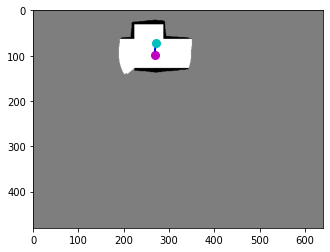

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5604, 0.1391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5604, 0.1547]), 'reward': tensor([0.0310]), 'action': tensor([-0.0029,  0.1054])}
terminal False


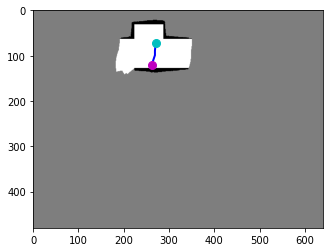

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5604, 0.1547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5458, 0.1875]), 'reward': tensor([0.0489]), 'action': tensor([-0.1012,  0.2922])}
terminal False


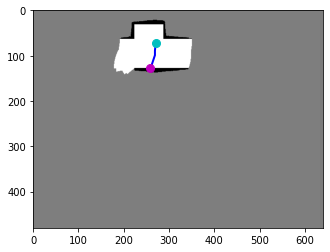

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5458, 0.1875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5458, 0.1875]), 'reward': tensor([-10.]), 'action': tensor([-0.1021,  0.1875])}
terminal True


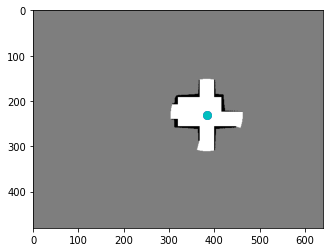

reward -9.816285714507103


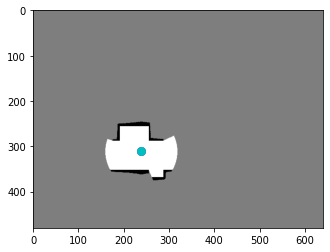

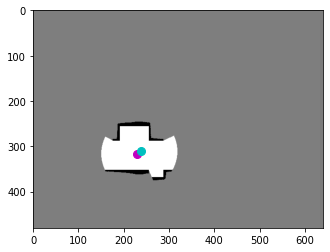

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4792, 0.4938]), 'reward': tensor([0.0960]), 'action': tensor([-0.0694,  0.0408])}
terminal False


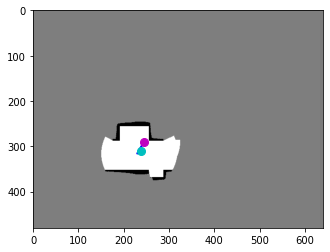

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4792, 0.4938]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5104, 0.4531]), 'reward': tensor([0.0310]), 'action': tensor([ 0.2127, -0.3655])}
terminal False


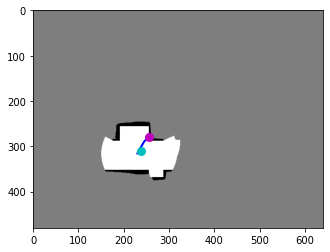

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5104, 0.4531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5104, 0.4531]), 'reward': tensor([-10.]), 'action': tensor([ 0.3205, -0.3560])}
terminal True


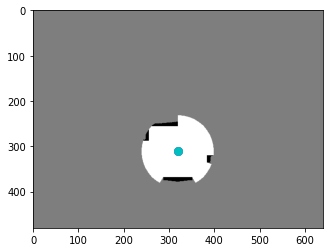

reward -9.872999999672174


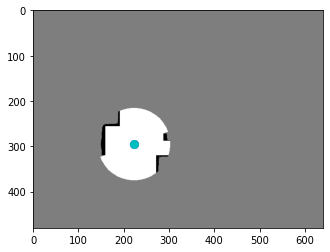

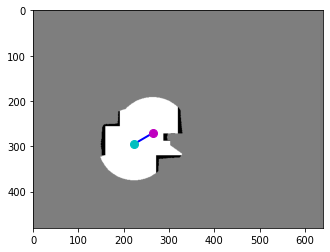

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5500, 0.4234]), 'reward': tensor([0.6517]), 'action': tensor([ 0.5733, -0.3368])}
terminal False


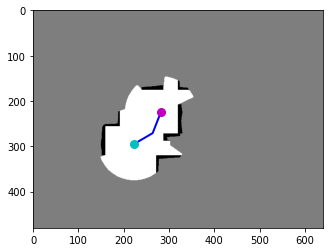

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5500, 0.4234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5875, 0.3516]), 'reward': tensor([0.6031]), 'action': tensor([ 0.2576, -0.6454])}
terminal False


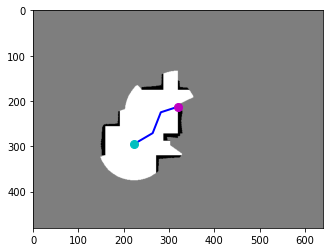

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5875, 0.3516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5875, 0.3516]), 'reward': tensor([-10.]), 'action': tensor([ 0.8610, -0.2626])}
terminal True


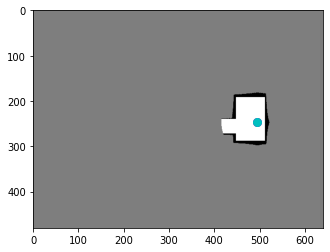

reward -8.745142877101898


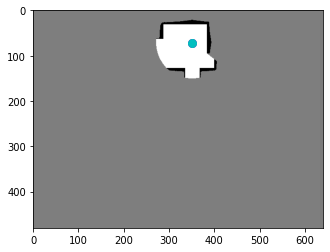

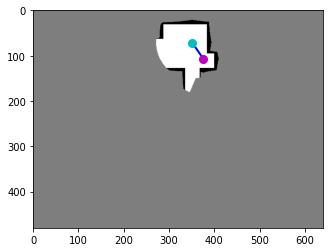

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7312, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7833, 0.1672]), 'reward': tensor([0.0834]), 'action': tensor([0.3473, 0.5133])}
terminal False


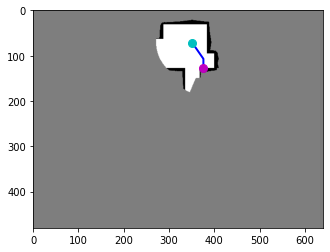

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7833, 0.1672]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7833, 0.1672]), 'reward': tensor([-10.]), 'action': tensor([0.0045, 0.6481])}
terminal True


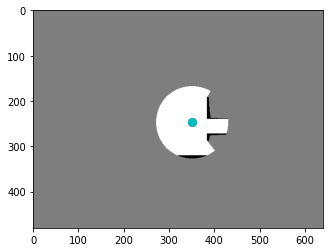

reward -9.91657143086195
step 4700
step 4800
avg iter time 0.8052158911029498


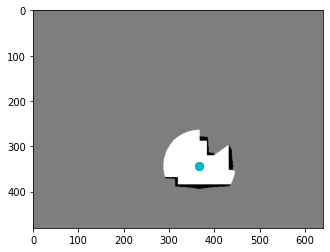

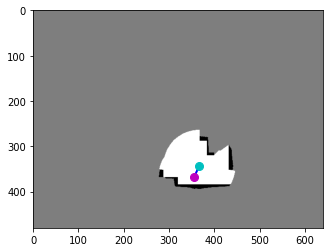

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.5734]), 'reward': tensor([0.0286]), 'action': tensor([-0.1538,  0.3367])}
terminal False


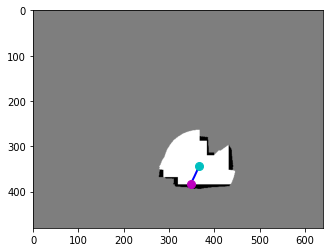

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7417, 0.5734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.5734]), 'reward': tensor([-10.]), 'action': tensor([-0.2348,  0.4786])}
terminal True


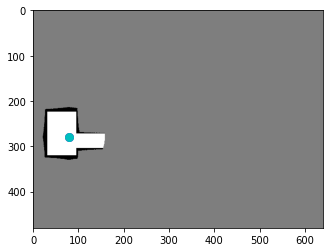

reward -9.971428571268916


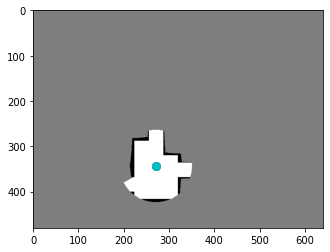

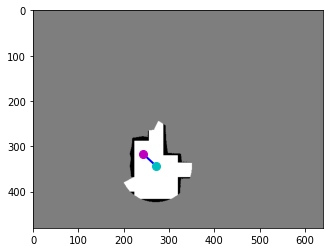

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5042, 0.4938]), 'reward': tensor([0.0410]), 'action': tensor([-0.4128, -0.3844])}
terminal False


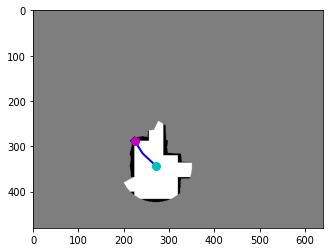

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5042, 0.4938]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5042, 0.4938]), 'reward': tensor([-10.]), 'action': tensor([-0.4411, -0.6632])}
terminal True


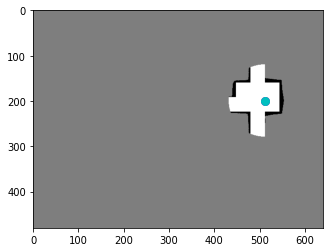

reward -9.958999998867512


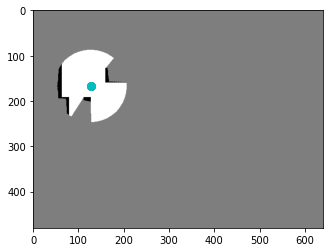

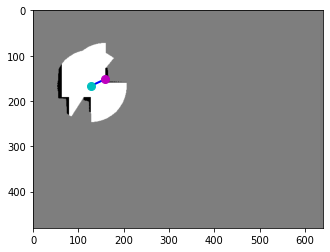

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.2609]), 'reward': tensor([-10.]), 'action': tensor([ 0.4774, -0.2202])}
terminal True


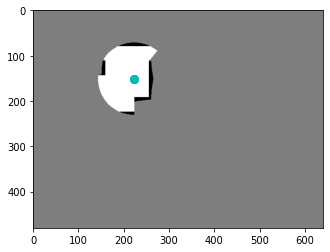

reward -10.0


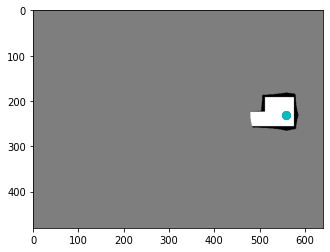

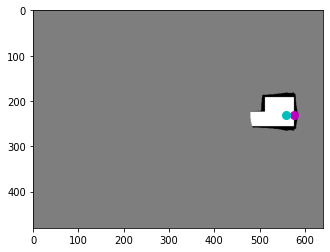

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1646, 0.3609]), 'reward': tensor([-10.]), 'action': tensor([0.4637, 0.0070])}
terminal True


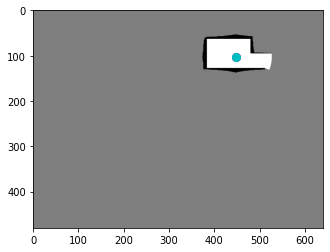

reward -10.0


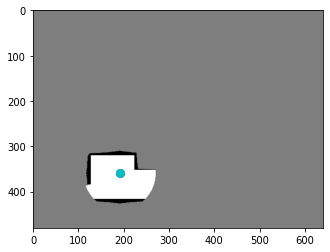

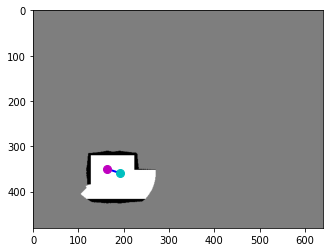

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3417, 0.5469]), 'reward': tensor([0.0476]), 'action': tensor([-0.3792, -0.1313])}
terminal False


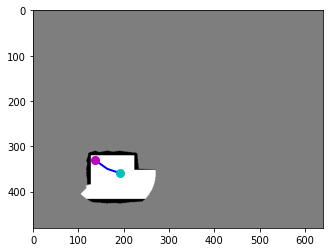

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3417, 0.5469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2854, 0.5172]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3793, -0.2747])}
terminal False


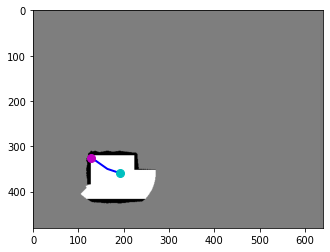

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2854, 0.5172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2854, 0.5172]), 'reward': tensor([-10.]), 'action': tensor([-0.3837, -0.1740])}
terminal True


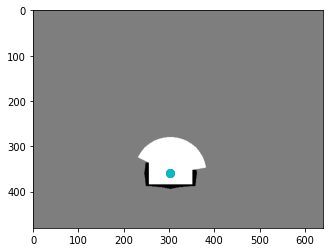

reward -10.752428583800793
step 4800
step 4900
avg iter time 0.8057099958341949


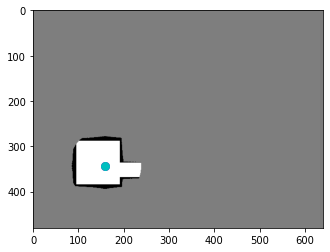

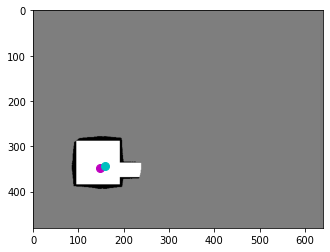

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3063, 0.5437]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1662,  0.0642])}
terminal False


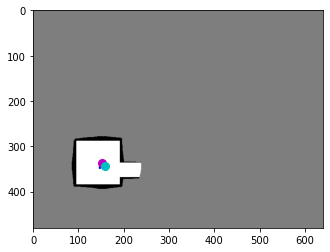

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3063, 0.5437]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3167, 0.5266]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0716, -0.1497])}
terminal False


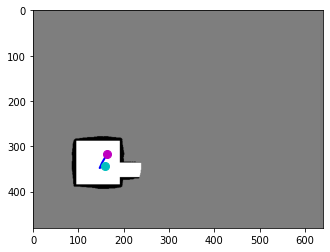

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3167, 0.5266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3417, 0.4938]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1651, -0.2938])}
terminal False


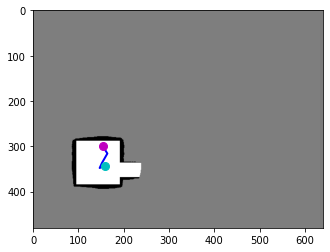

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3417, 0.4938]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3208, 0.4688]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1476, -0.2229])}
terminal False


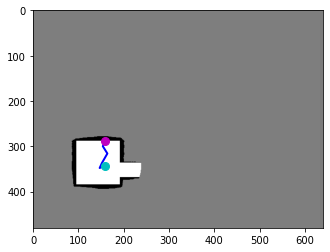

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3208, 0.4688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3208, 0.4688]), 'reward': tensor([-10.]), 'action': tensor([ 0.1742, -0.4227])}
terminal True


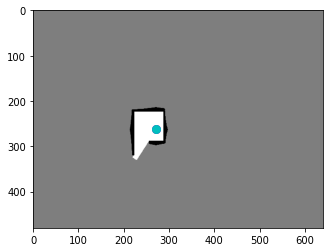

reward -13.200000047683716


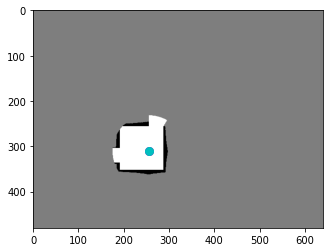

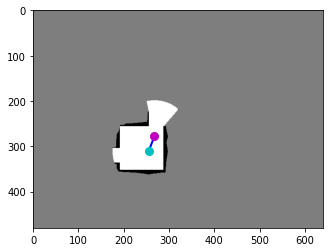

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5583, 0.4344]), 'reward': tensor([0.2994]), 'action': tensor([ 0.1857, -0.4635])}
terminal False


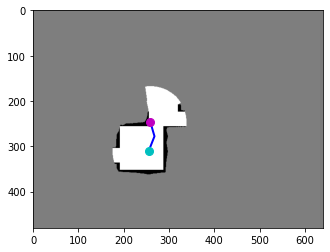

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5583, 0.4344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5396, 0.3859]), 'reward': tensor([0.4510]), 'action': tensor([-0.1341, -0.4433])}
terminal False


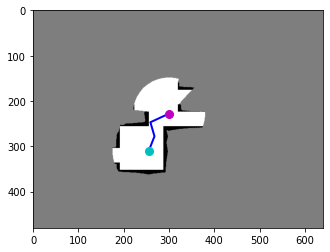

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5396, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6250, 0.3562]), 'reward': tensor([0.6334]), 'action': tensor([ 0.5800, -0.2671])}
terminal False


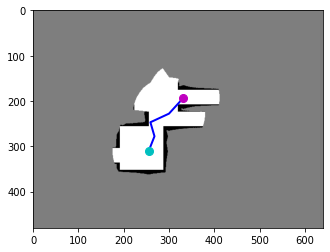

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6250, 0.3562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.3016]), 'reward': tensor([0.4141]), 'action': tensor([ 0.4584, -0.4982])}
terminal False


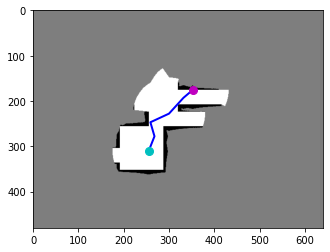

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6917, 0.3016]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6917, 0.3016]), 'reward': tensor([-10.]), 'action': tensor([ 0.4543, -0.3993])}
terminal True


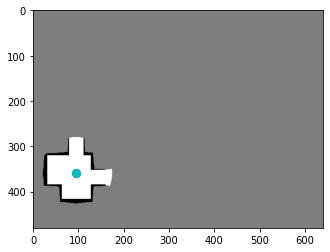

reward -8.201999992132187


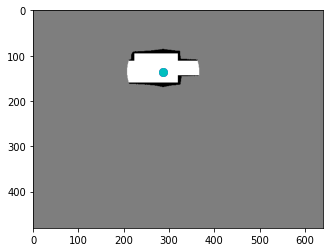

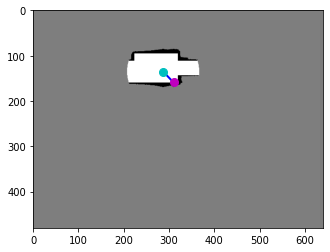

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5979, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5979, 0.2109]), 'reward': tensor([-10.]), 'action': tensor([0.4135, 0.4333])}
terminal True


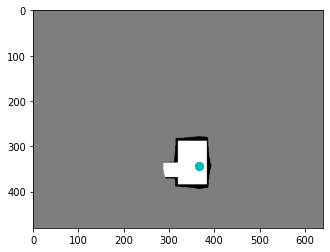

reward -10.0


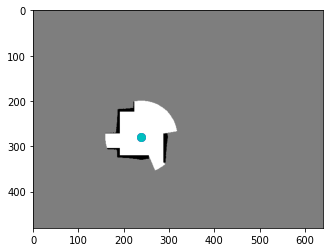

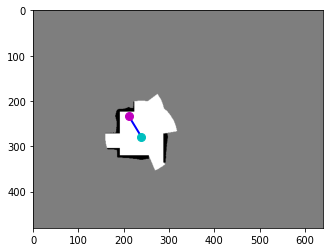

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4396, 0.3641]), 'reward': tensor([0.0634]), 'action': tensor([-0.3953, -0.6439])}
terminal False


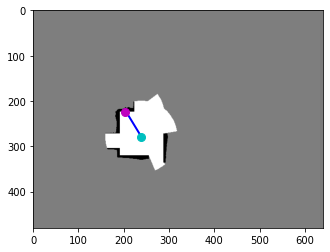

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4396, 0.3641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4396, 0.3641]), 'reward': tensor([-10.]), 'action': tensor([-0.3430, -0.4613])}
terminal True


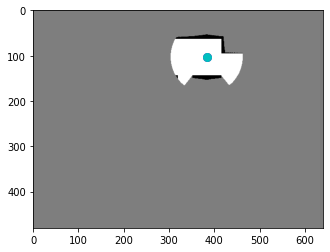

reward -9.936571426689625


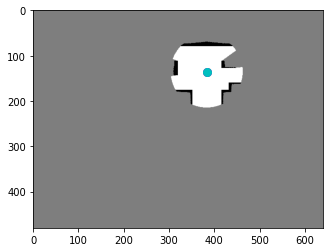

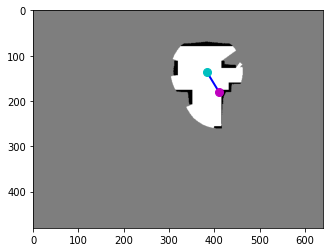

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.2828]), 'reward': tensor([0.4000]), 'action': tensor([0.3972, 0.6570])}
terminal False


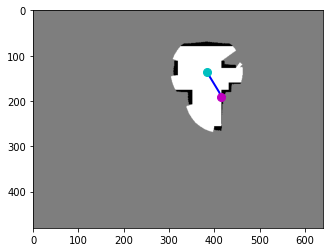

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8562, 0.2828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.2828]), 'reward': tensor([-10.]), 'action': tensor([0.1925, 0.4338])}
terminal True


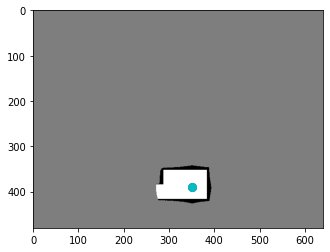

reward -9.599999994039536
step 4900
step 5000
avg iter time 0.8059569676876068


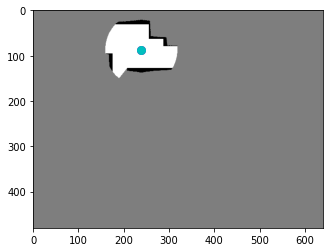

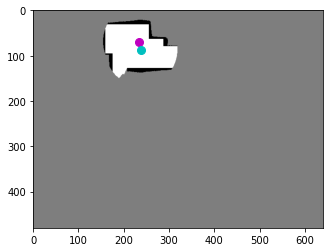

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4875, 0.1078]), 'reward': tensor([0.0559]), 'action': tensor([-0.0704, -0.2557])}
terminal False


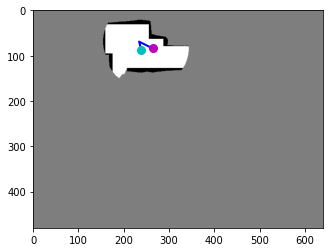

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4875, 0.1078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5500, 0.1312]), 'reward': tensor([0.1663]), 'action': tensor([0.4190, 0.2129])}
terminal False


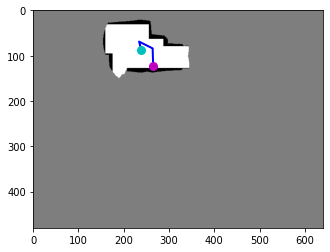

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5500, 0.1312]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5521, 0.1906]), 'reward': tensor([0.0250]), 'action': tensor([0.0159, 0.5441])}
terminal False


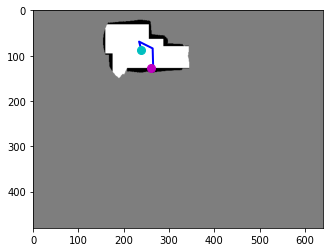

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5521, 0.1906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5521, 0.1906]), 'reward': tensor([-10.]), 'action': tensor([-0.2997,  0.2978])}
terminal True


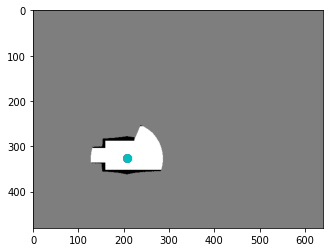

reward -9.752857146784663


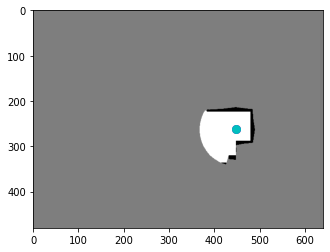

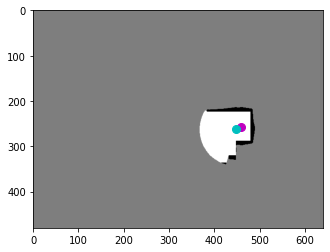

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.4031]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1823, -0.0747])}
terminal False


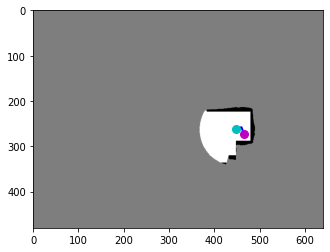

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.4031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9708, 0.4266]), 'reward': tensor([-0.8000]), 'action': tensor([0.0781, 0.2174])}
terminal False


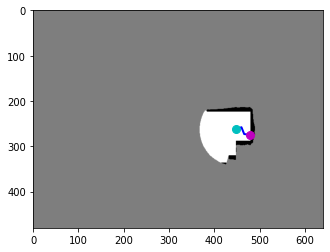

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9708, 0.4266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9708, 0.4266]), 'reward': tensor([-10.]), 'action': tensor([0.3912, 0.0740])}
terminal True


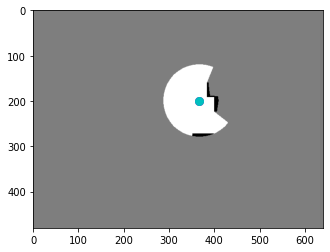

reward -11.600000023841858


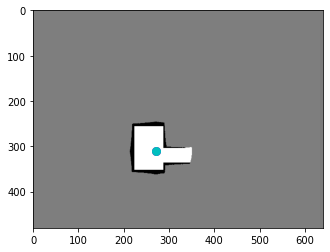

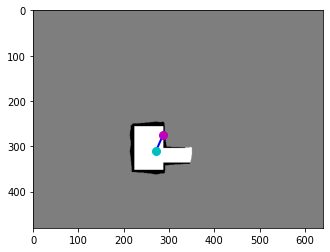

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.4859]), 'reward': tensor([-10.]), 'action': tensor([ 0.2366, -0.5275])}
terminal True


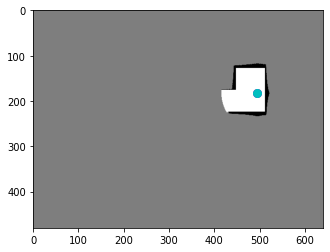

reward -10.0


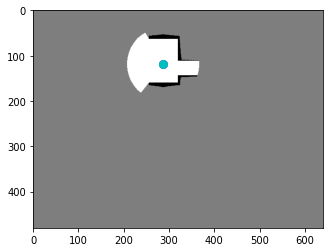

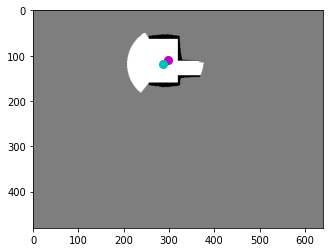

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5979, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6187, 0.1719]), 'reward': tensor([0.0346]), 'action': tensor([ 0.1345, -0.1236])}
terminal False


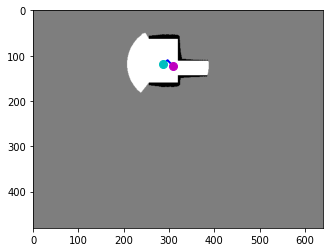

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6187, 0.1719]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6417, 0.1906]), 'reward': tensor([0.0636]), 'action': tensor([0.1626, 0.1644])}
terminal False


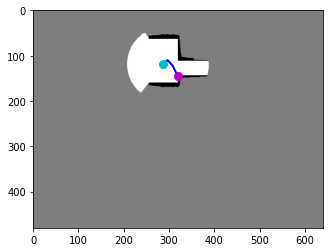

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6417, 0.1906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6417, 0.1906]), 'reward': tensor([-10.]), 'action': tensor([0.1719, 0.3166])}
terminal True


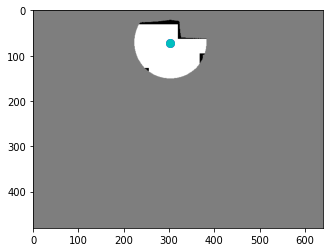

reward -9.901857141405344


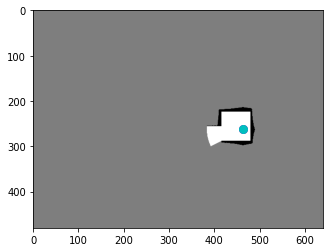

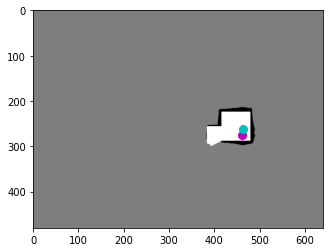

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9625, 0.4313]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0149,  0.1903])}
terminal False


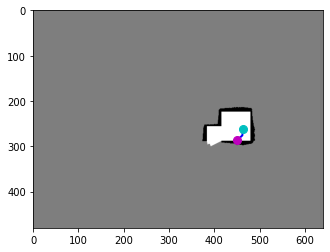

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9625, 0.4313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9375, 0.4484]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1753,  0.1589])}
terminal False


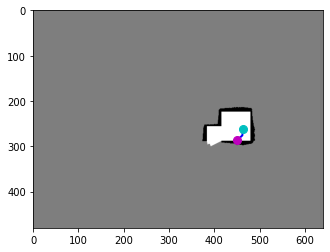

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9375, 0.4484]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9375, 0.4484]), 'reward': tensor([-10.]), 'action': tensor([0.0708, 0.4526])}
terminal True


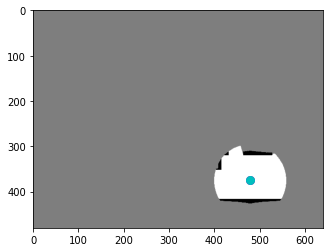

reward -11.600000023841858
step 5000
CRITIC


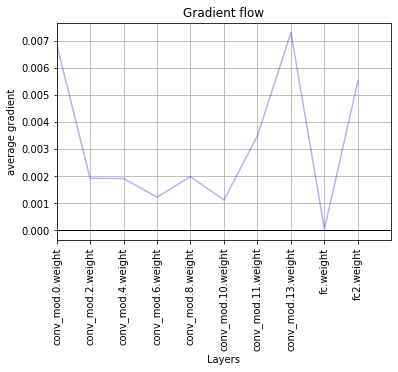

ACTOR


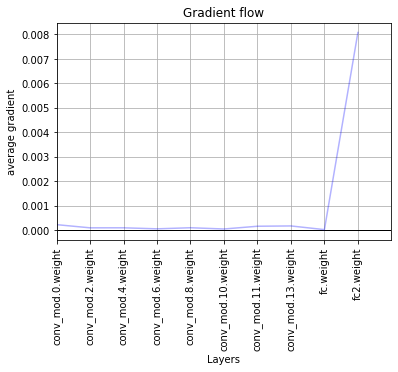

step 5100
avg iter time 0.8065133205114626


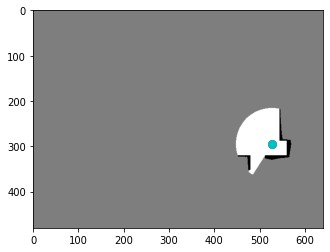

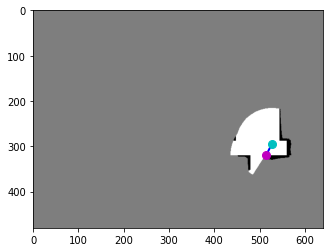

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0729, 0.4984]), 'reward': tensor([0.0524]), 'action': tensor([-0.1678,  0.3396])}
terminal False


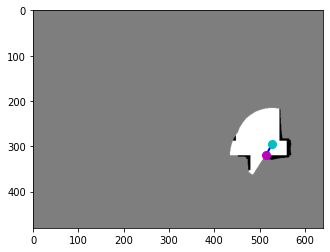

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0729, 0.4984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0729, 0.4984]), 'reward': tensor([-10.]), 'action': tensor([-0.3546,  0.2834])}
terminal True


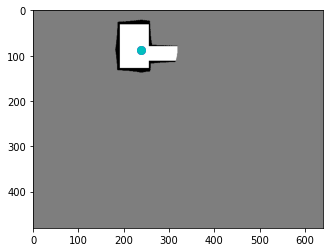

reward -9.94757143035531


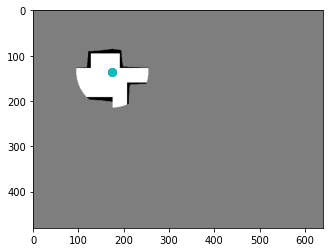

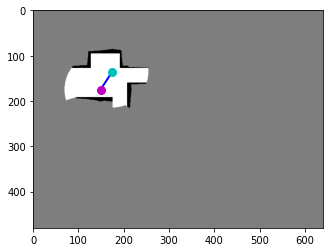

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3104, 0.2734]), 'reward': tensor([0.2743]), 'action': tensor([-0.3607,  0.5717])}
terminal False


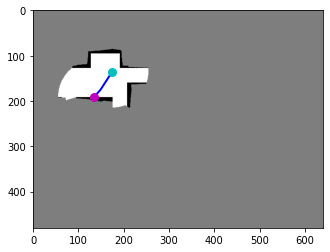

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3104, 0.2734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3104, 0.2734]), 'reward': tensor([-10.]), 'action': tensor([-0.3001,  0.3539])}
terminal True


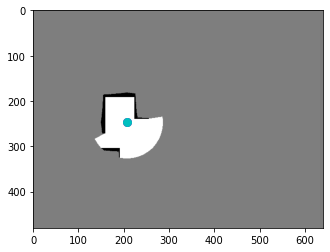

reward -9.725714296102524


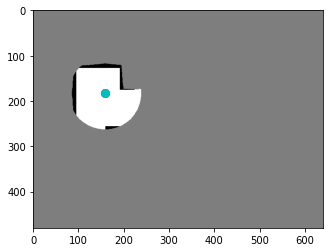

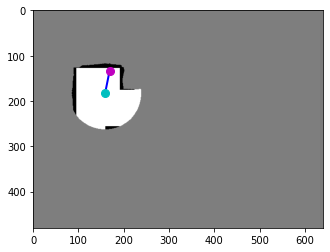

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3521, 0.2078]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1392, -0.7122])}
terminal False


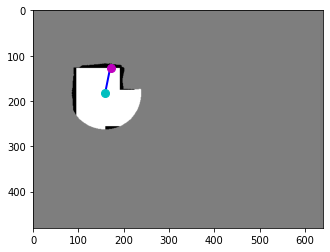

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3521, 0.2078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3521, 0.2078]), 'reward': tensor([-10.]), 'action': tensor([ 0.4531, -0.7012])}
terminal True


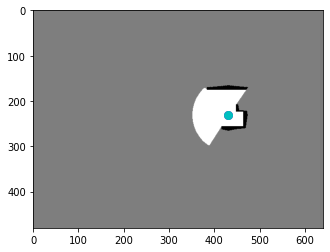

reward -10.800000011920929


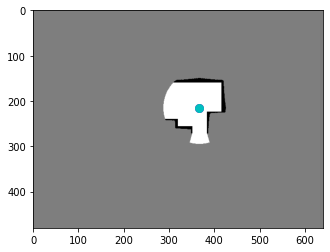

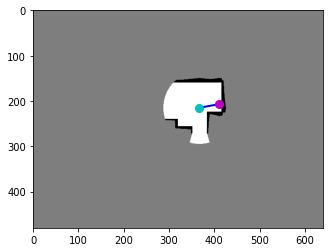

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.3234]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.6290, -0.1201])}
terminal False


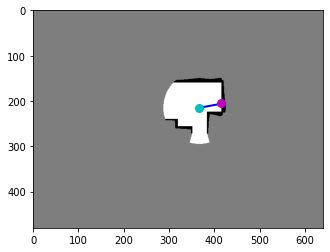

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8562, 0.3234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8562, 0.3234]), 'reward': tensor([-10.]), 'action': tensor([ 0.5986, -0.2241])}
terminal True


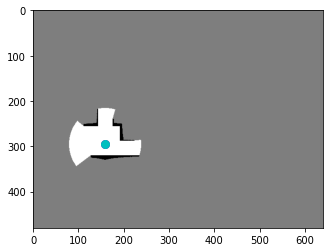

reward -10.800000011920929


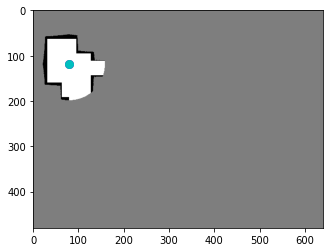

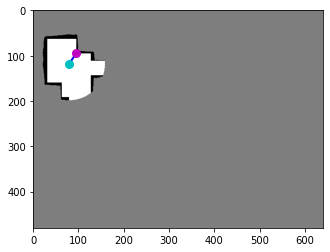

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1646, 0.1859]), 'reward': tensor([-10.]), 'action': tensor([ 0.3700, -0.5113])}
terminal True


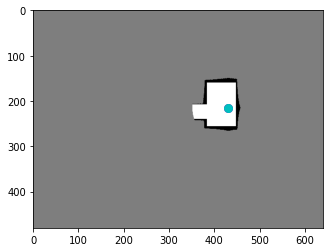

reward -10.0
step 5100
step 5200
avg iter time 0.8066479118512226


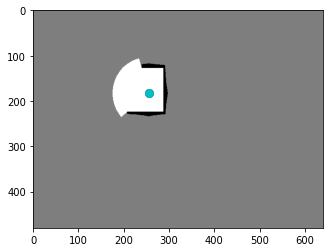

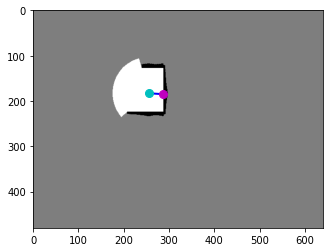

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5312, 0.2859]), 'reward': tensor([-10.]), 'action': tensor([0.5764, 0.0295])}
terminal True


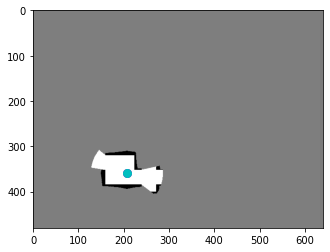

reward -10.0


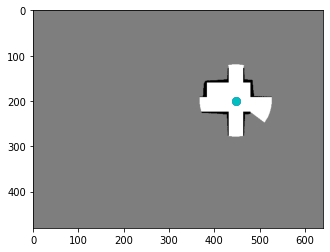

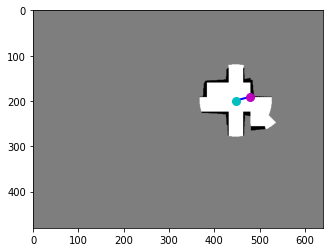

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9312, 0.3109]), 'reward': tensor([-10.]), 'action': tensor([ 0.5008, -0.1195])}
terminal True


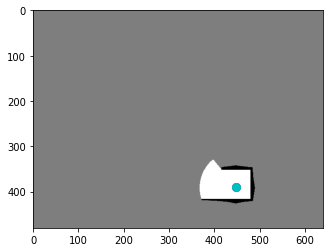

reward -10.0


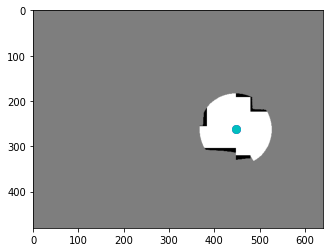

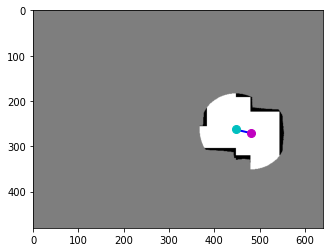

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0021, 0.4234]), 'reward': tensor([0.4891]), 'action': tensor([0.4773, 0.1151])}
terminal False


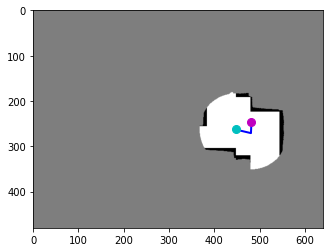

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0021, 0.4234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0042, 0.3859]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0169, -0.3463])}
terminal False


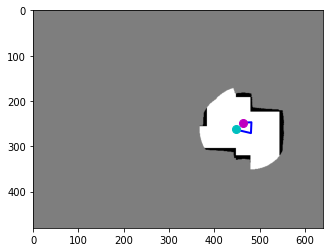

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0042, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9667, 0.3875]), 'reward': tensor([0.0387]), 'action': tensor([-0.2591,  0.0162])}
terminal False


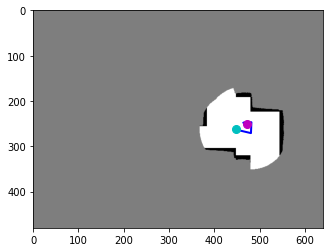

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9667, 0.3875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9854, 0.3922]), 'reward': tensor([-0.8000]), 'action': tensor([0.0279, 0.0103])}
terminal False


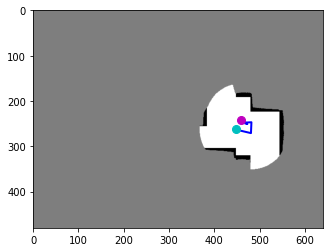

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9854, 0.3922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.3766]), 'reward': tensor([0.0690]), 'action': tensor([-0.1895, -0.1456])}
terminal False


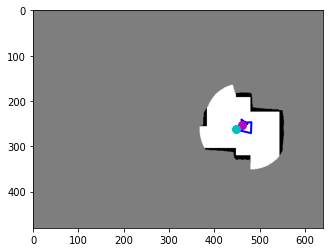

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.3766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9625, 0.3953]), 'reward': tensor([-0.8000]), 'action': tensor([0.0278, 0.1704])}
terminal False


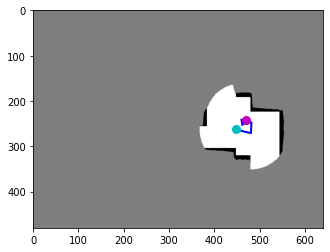

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9625, 0.3953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9812, 0.3781]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1235, -0.1558])}
terminal False


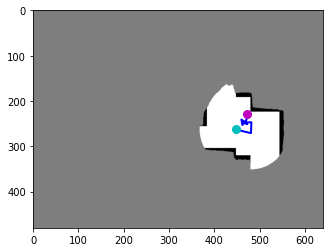

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9812, 0.3781]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9854, 0.3562]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0235, -0.2045])}
terminal False


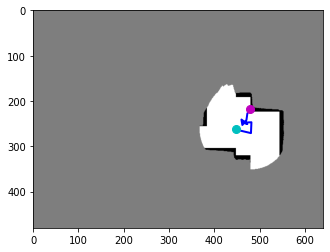

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9854, 0.3562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9854, 0.3562]), 'reward': tensor([-10.]), 'action': tensor([ 0.2565, -0.4246])}
terminal True


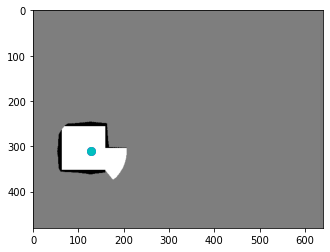

reward -13.403142910450697


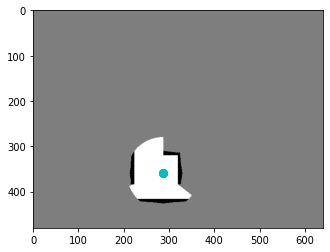

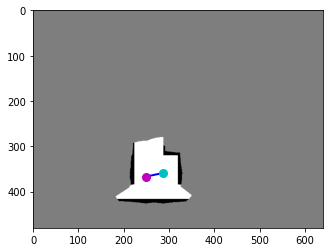

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5188, 0.5734]), 'reward': tensor([0.1317]), 'action': tensor([-0.5333,  0.1151])}
terminal False


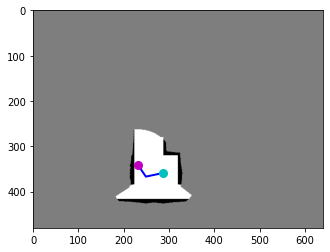

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5188, 0.5734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4833, 0.5344]), 'reward': tensor([0.1533]), 'action': tensor([-0.2454, -0.3574])}
terminal False


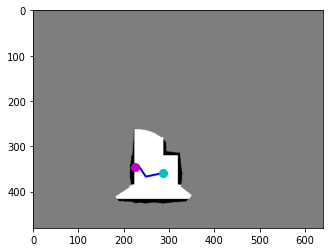

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4833, 0.5344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4833, 0.5344]), 'reward': tensor([-10.]), 'action': tensor([-0.2207,  0.0665])}
terminal True


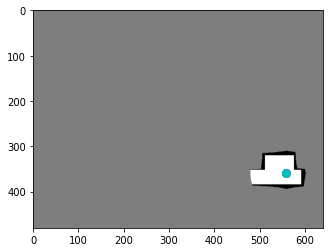

reward -9.715000003576279


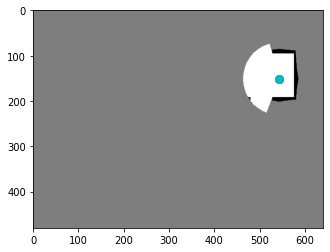

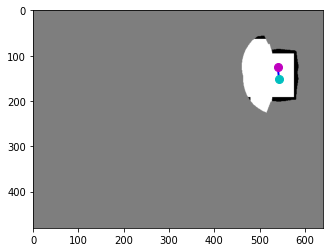

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1313, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1250, 0.1937]), 'reward': tensor([0.2067]), 'action': tensor([-0.0354, -0.3797])}
terminal False


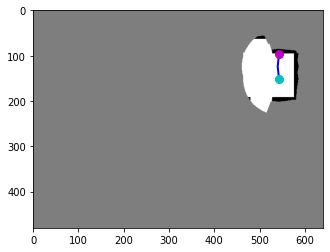

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1250, 0.1937]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1250, 0.1937]), 'reward': tensor([-10.]), 'action': tensor([ 0.0536, -0.5529])}
terminal True


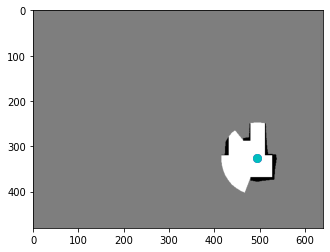

reward -9.793285712599754
step 5200
step 5300
avg iter time 0.8066728346302824


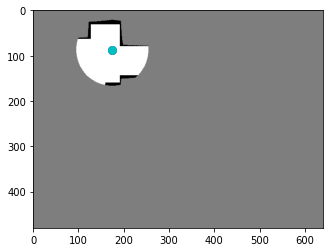

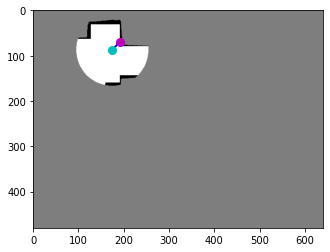

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3646, 0.1359]), 'reward': tensor([-10.]), 'action': tensor([ 0.3173, -0.3311])}
terminal True


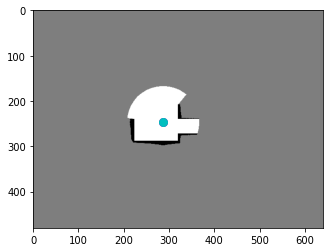

reward -10.0


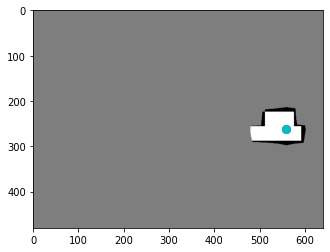

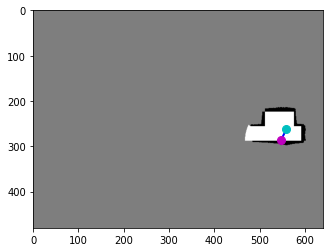

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1646, 0.4109]), 'reward': tensor([-10.]), 'action': tensor([-0.2301,  0.4641])}
terminal True


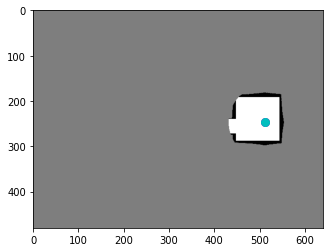

reward -10.0


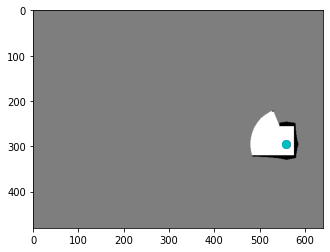

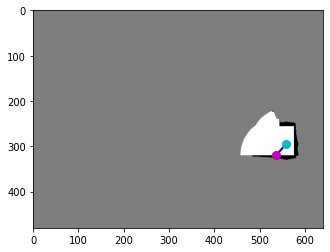

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1646, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([-0.4041,  0.4641])}
terminal True


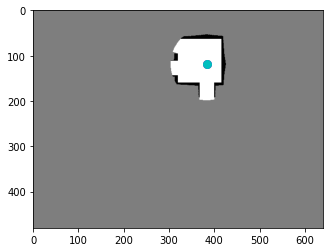

reward -10.0


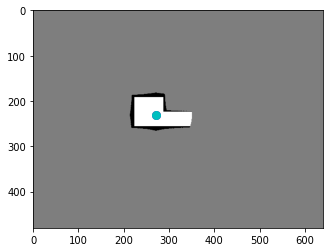

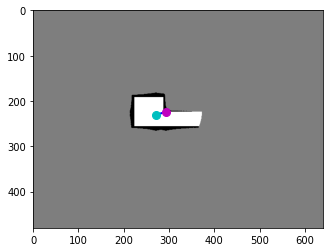

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.3609]), 'reward': tensor([-10.]), 'action': tensor([ 0.4667, -0.1596])}
terminal True


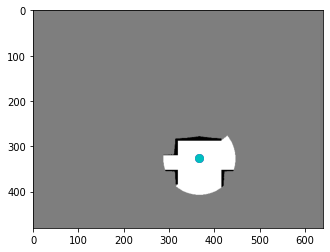

reward -10.0


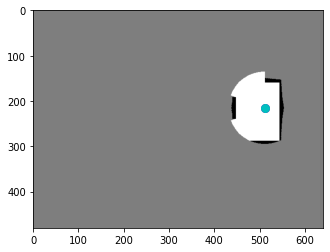

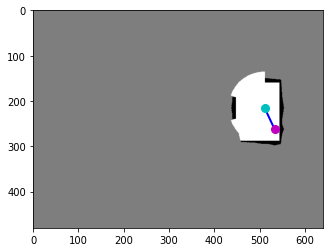

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1104, 0.4094]), 'reward': tensor([0.0209]), 'action': tensor([0.3098, 0.6596])}
terminal False


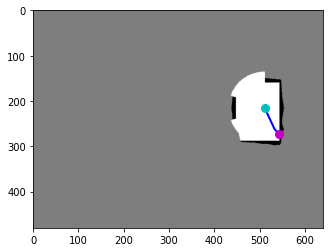

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1104, 0.4094]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1104, 0.4094]), 'reward': tensor([-10.]), 'action': tensor([0.2799, 0.3015])}
terminal True


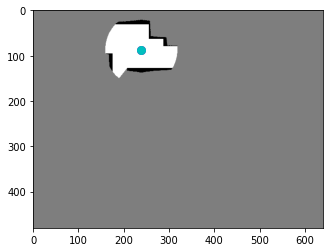

reward -9.979142857715487
step 5300
step 5400
avg iter time 0.8065361319647895


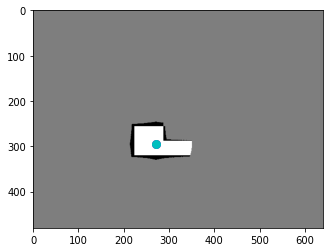

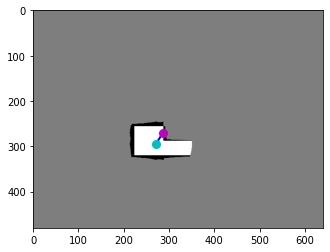

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([ 0.3437, -0.5299])}
terminal True


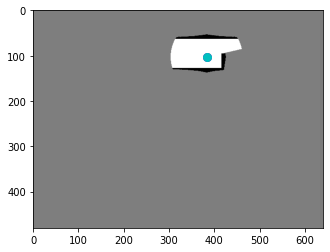

reward -10.0


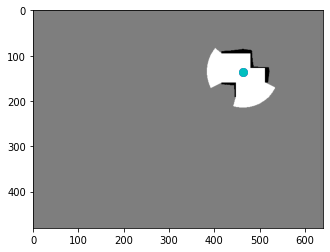

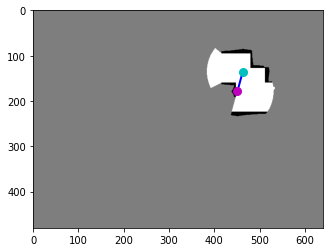

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9396, 0.2797]), 'reward': tensor([0.2069]), 'action': tensor([-0.1767,  0.6156])}
terminal False


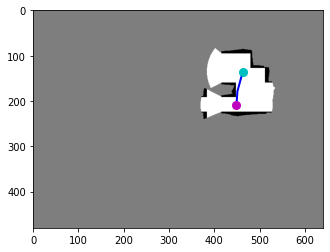

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9396, 0.2797]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9354, 0.3266]), 'reward': tensor([0.4220]), 'action': tensor([-0.0240,  0.4249])}
terminal False


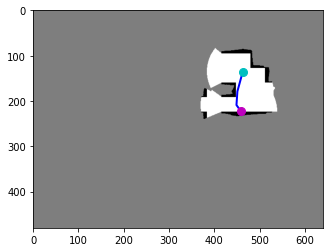

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9354, 0.3266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9354, 0.3266]), 'reward': tensor([-10.]), 'action': tensor([0.2479, 0.3565])}
terminal True


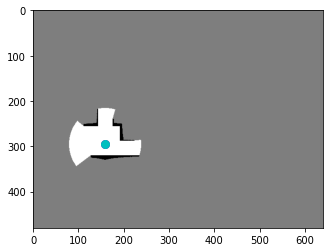

reward -9.371142864227295


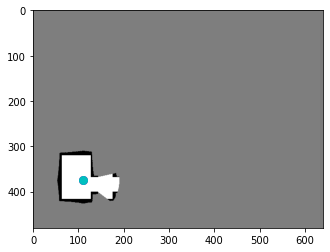

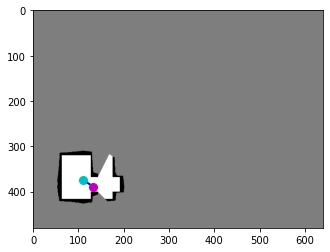

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2771, 0.6078]), 'reward': tensor([0.1380]), 'action': tensor([0.3164, 0.1989])}
terminal False


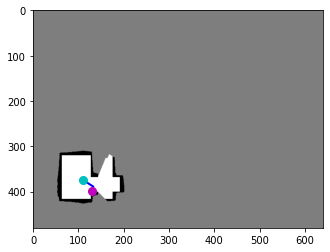

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2771, 0.6078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2771, 0.6078]), 'reward': tensor([-10.]), 'action': tensor([-0.0303,  0.1608])}
terminal True


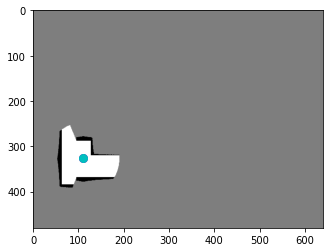

reward -9.86200000345707


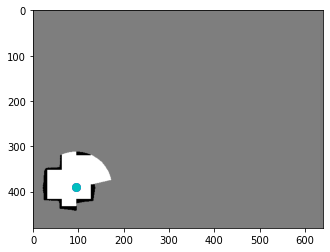

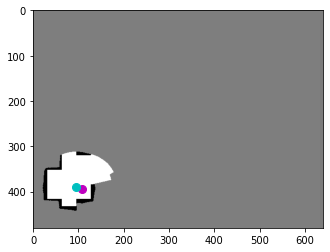

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1979, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2250, 0.6156]), 'reward': tensor([0.0571]), 'action': tensor([0.1889, 0.0466])}
terminal False


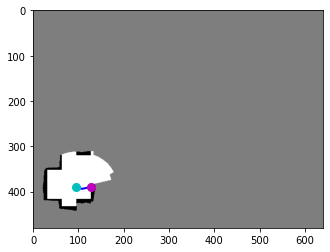

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2250, 0.6156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2250, 0.6156]), 'reward': tensor([-10.]), 'action': tensor([ 0.5852, -0.1291])}
terminal True


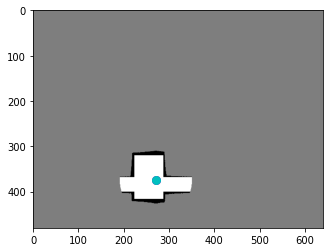

reward -9.942857142537832


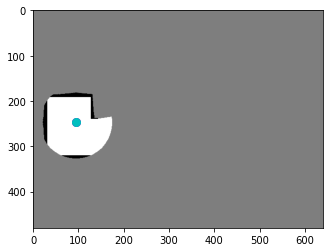

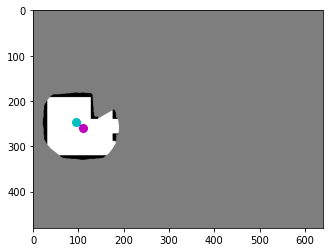

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2292, 0.4047]), 'reward': tensor([0.2391]), 'action': tensor([0.2162, 0.1720])}
terminal False


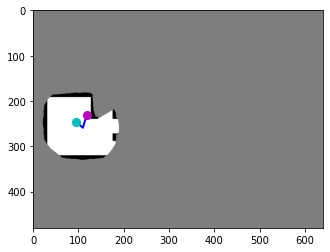

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2292, 0.4047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2458, 0.3625]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1080, -0.3829])}
terminal False


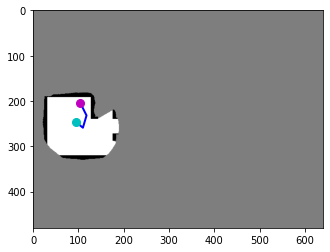

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2458, 0.3625]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2167, 0.3187]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2018, -0.3911])}
terminal False


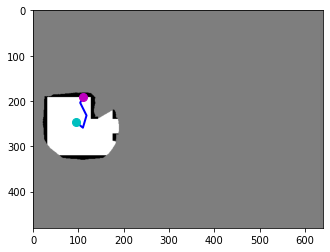

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2167, 0.3187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2167, 0.3187]), 'reward': tensor([-10.]), 'action': tensor([ 0.0967, -0.2170])}
terminal True


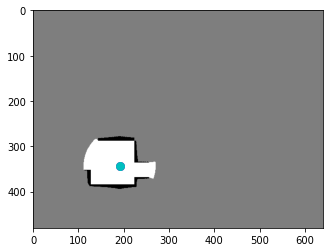

reward -11.360857173800468
step 5400
step 5500
avg iter time 0.8071932002414357


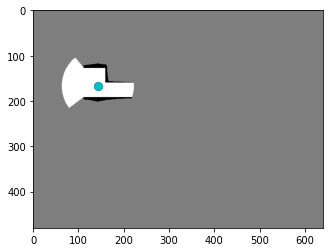

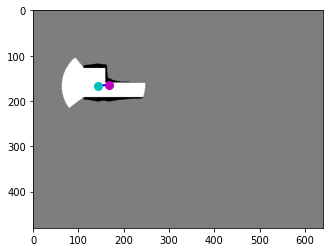

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3500, 0.2562]), 'reward': tensor([0.1126]), 'action': tensor([ 0.3582, -0.0486])}
terminal False


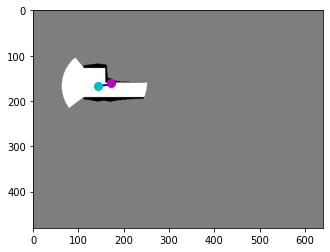

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3500, 0.2562]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3500, 0.2562]), 'reward': tensor([-10.]), 'action': tensor([ 0.3041, -0.3485])}
terminal True


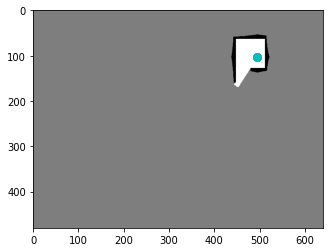

reward -9.88742857426405


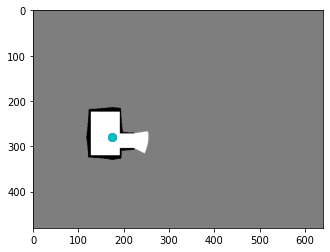

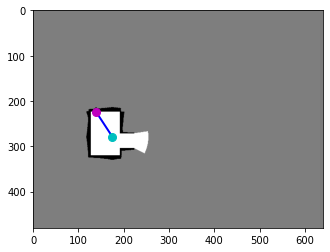

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3646, 0.4359]), 'reward': tensor([-10.]), 'action': tensor([-0.5369, -0.8279])}
terminal True


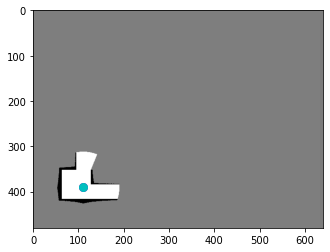

reward -10.0


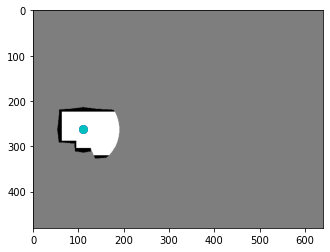

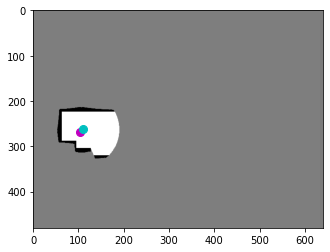

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.4109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2146, 0.4203]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0635,  0.0450])}
terminal False


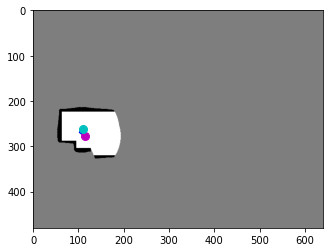

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2146, 0.4203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2375, 0.4328]), 'reward': tensor([0.0589]), 'action': tensor([0.1599, 0.1183])}
terminal False


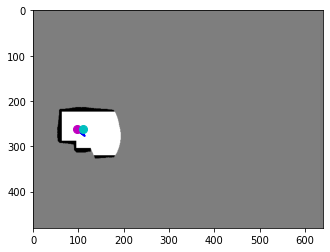

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2375, 0.4328]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2021, 0.4078]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2339, -0.2328])}
terminal False


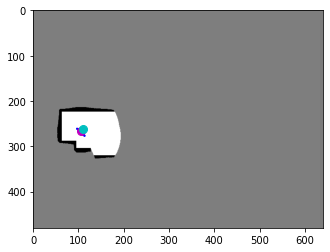

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2021, 0.4078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2208, 0.4156]), 'reward': tensor([-0.8000]), 'action': tensor([0.0399, 0.0247])}
terminal False


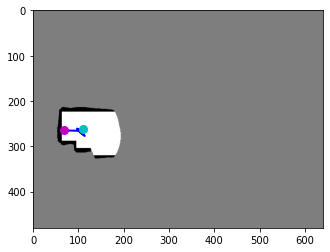

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2208, 0.4156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1417, 0.4141]), 'reward': tensor([-0.8000]), 'action': tensor([-0.5316, -0.0192])}
terminal False


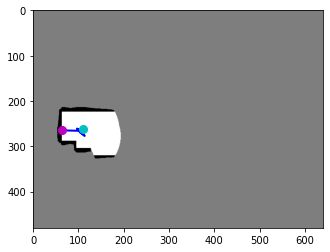

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1417, 0.4141]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1417, 0.4141]), 'reward': tensor([-10.]), 'action': tensor([-0.0898, -0.0108])}
terminal True


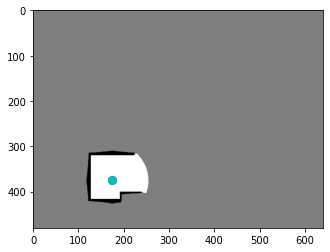

reward -13.141142904758453


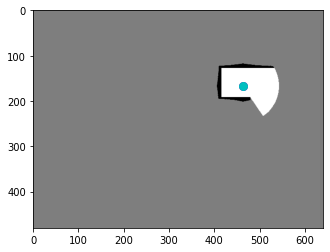

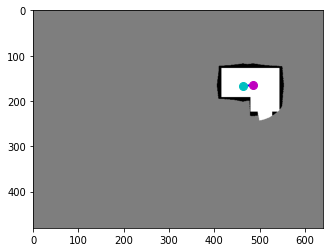

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0104, 0.2578]), 'reward': tensor([0.1900]), 'action': tensor([ 0.3146, -0.0250])}
terminal False


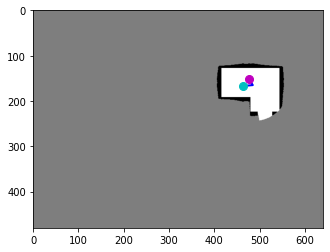

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0104, 0.2578]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9937, 0.2375]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1116, -0.1780])}
terminal False


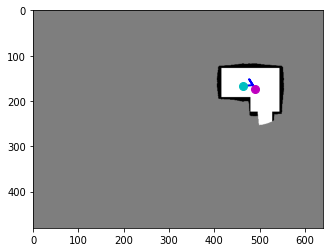

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9937, 0.2375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0229, 0.2719]), 'reward': tensor([0.0499]), 'action': tensor([0.1970, 0.3176])}
terminal False


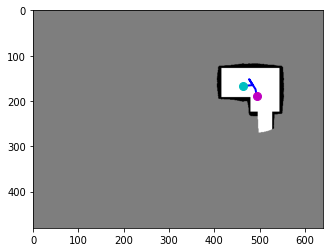

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0229, 0.2719]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0292, 0.2969]), 'reward': tensor([0.0770]), 'action': tensor([0.0441, 0.2310])}
terminal False


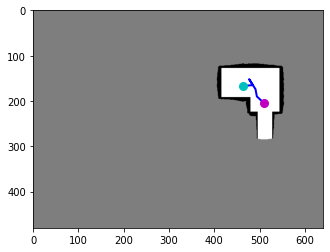

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0292, 0.2969]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0625, 0.3203]), 'reward': tensor([0.0830]), 'action': tensor([0.2285, 0.2052])}
terminal False


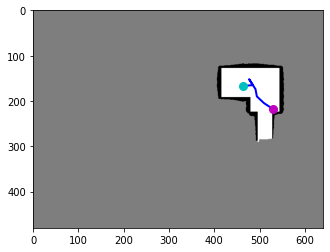

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0625, 0.3203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1042, 0.3406]), 'reward': tensor([-0.8000]), 'action': tensor([0.2776, 0.1837])}
terminal False


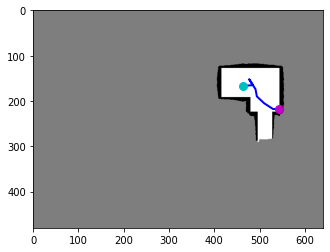

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1042, 0.3406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1042, 0.3406]), 'reward': tensor([-10.]), 'action': tensor([ 0.2721, -0.0217])}
terminal True


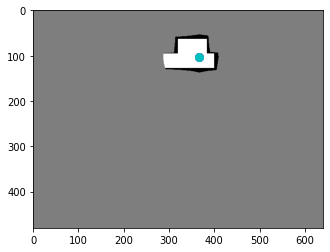

reward -11.20014288648963


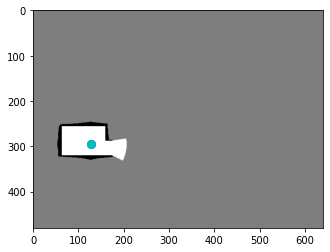

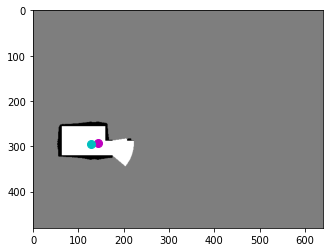

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2979, 0.4563]), 'reward': tensor([0.1260]), 'action': tensor([ 0.2329, -0.0456])}
terminal False


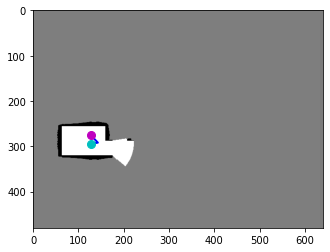

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2979, 0.4563]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.4297]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2292, -0.2417])}
terminal False


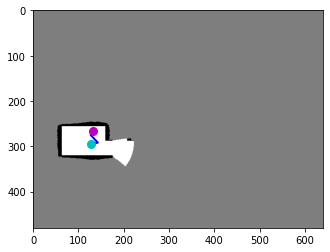

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.4297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2750, 0.4156]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0566, -0.1085])}
terminal False


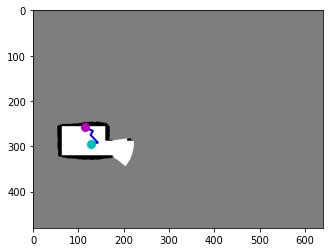

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2750, 0.4156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2375, 0.4031]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2502, -0.1071])}
terminal False


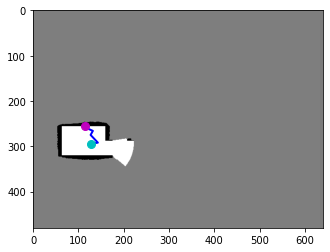

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2375, 0.4031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2375, 0.4031]), 'reward': tensor([-10.]), 'action': tensor([ 0.0060, -0.2899])}
terminal True


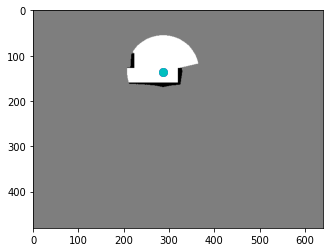

reward -12.274000033736229
step 5500
CRITIC


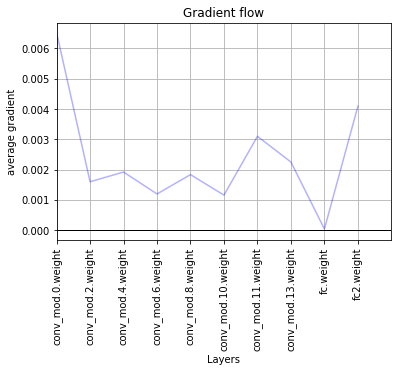

ACTOR


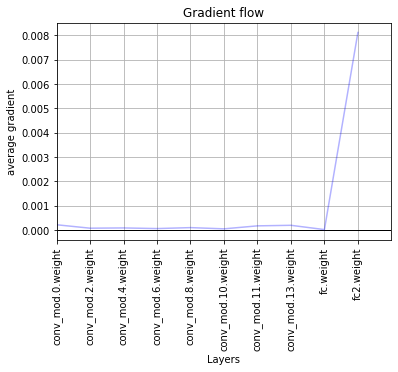

step 5600
avg iter time 0.8082792210153171


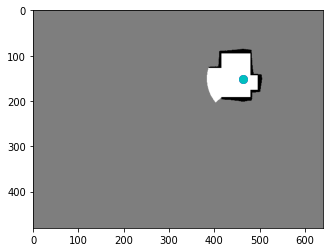

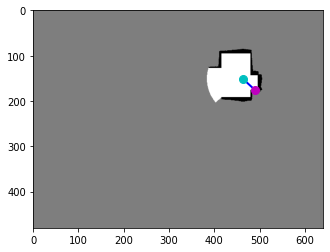

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9646, 0.2359]), 'reward': tensor([-10.]), 'action': tensor([0.5675, 0.5177])}
terminal True


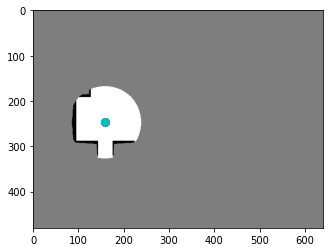

reward -10.0


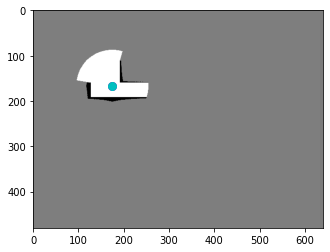

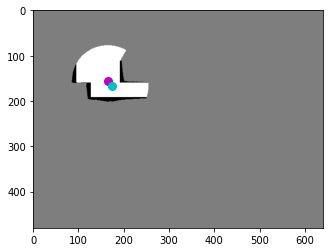

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3438, 0.2453]), 'reward': tensor([0.2409]), 'action': tensor([-0.1352, -0.1414])}
terminal False


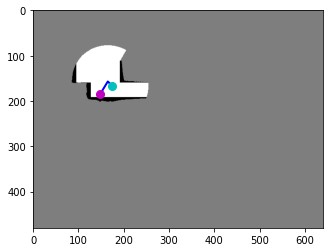

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3438, 0.2453]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3083, 0.2891]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2444,  0.3900])}
terminal False


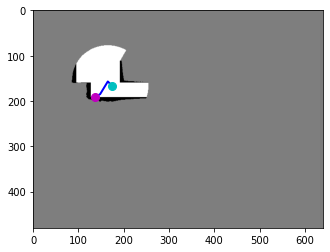

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3083, 0.2891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2854, 0.2984]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1617,  0.0868])}
terminal False


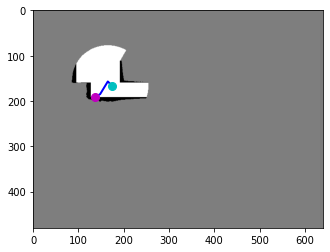

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2854, 0.2984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2854, 0.2984]), 'reward': tensor([-10.]), 'action': tensor([-0.2848,  0.3887])}
terminal True


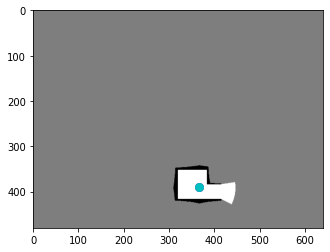

reward -11.359142884612083


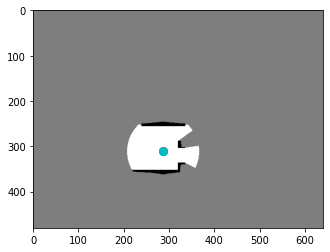

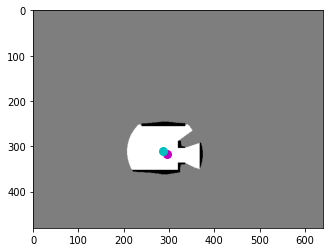

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5979, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6146, 0.4953]), 'reward': tensor([0.0376]), 'action': tensor([0.0796, 0.0627])}
terminal False


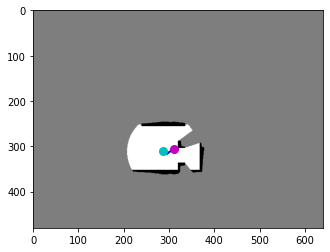

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6146, 0.4953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6479, 0.4766]), 'reward': tensor([0.0230]), 'action': tensor([ 0.2289, -0.1735])}
terminal False


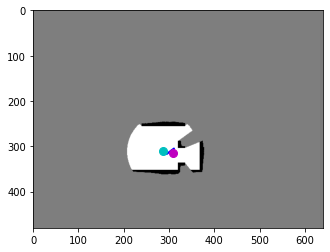

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6479, 0.4766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6417, 0.4922]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0455,  0.1446])}
terminal False


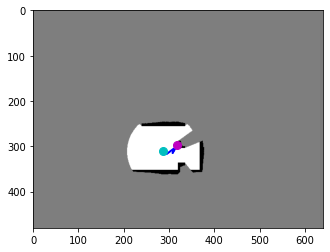

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6417, 0.4922]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6625, 0.4656]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1395, -0.2406])}
terminal False


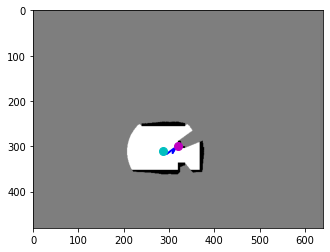

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6625, 0.4656]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6625, 0.4656]), 'reward': tensor([-10.]), 'action': tensor([0.0959, 0.1111])}
terminal True


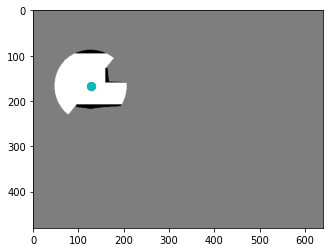

reward -11.539428593590856


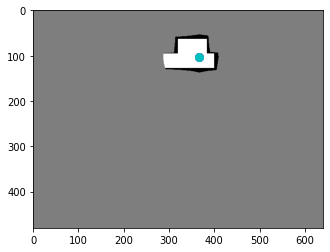

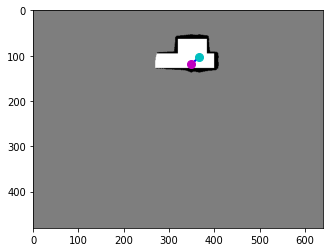

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.1609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7271, 0.1859]), 'reward': tensor([0.0829]), 'action': tensor([-0.2594,  0.2281])}
terminal False


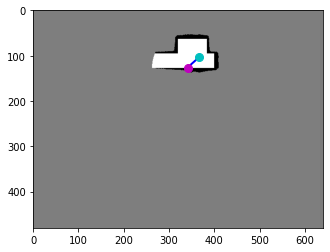

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7271, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7271, 0.1859]), 'reward': tensor([-10.]), 'action': tensor([-0.1942,  0.2347])}
terminal True


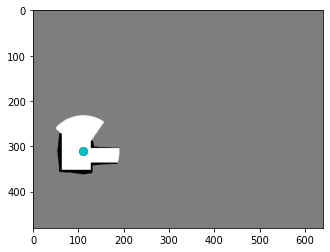

reward -9.917142860591412


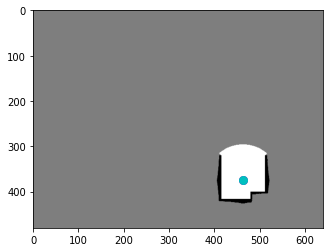

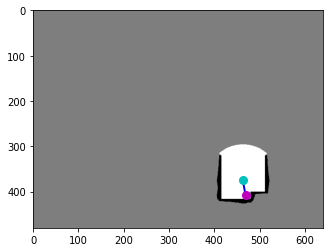

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9771, 0.6375]), 'reward': tensor([-0.8000]), 'action': tensor([0.0806, 0.4720])}
terminal False


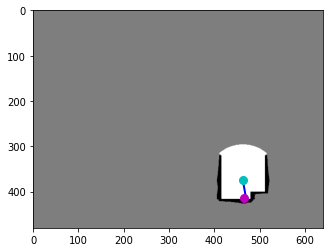

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9771, 0.6375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9771, 0.6375]), 'reward': tensor([-10.]), 'action': tensor([-0.2805,  0.6197])}
terminal True


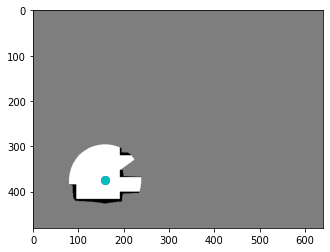

reward -10.800000011920929
step 5600
step 5700
avg iter time 0.8084566148958708


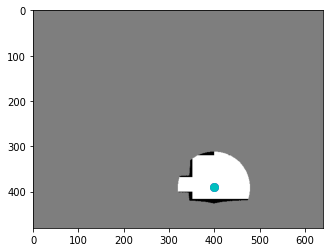

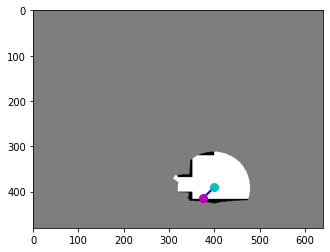

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8313, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8313, 0.6109]), 'reward': tensor([-10.]), 'action': tensor([-0.5402,  0.5543])}
terminal True


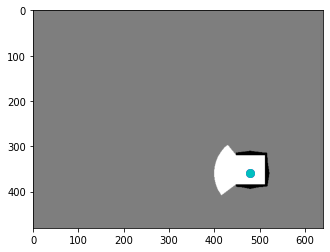

reward -10.0


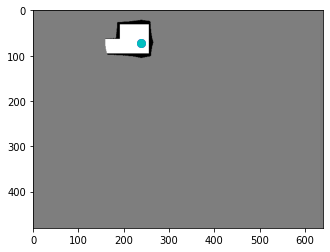

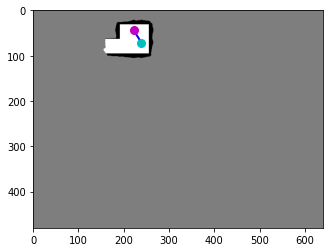

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4979, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4625, 0.0688]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2348, -0.3790])}
terminal False


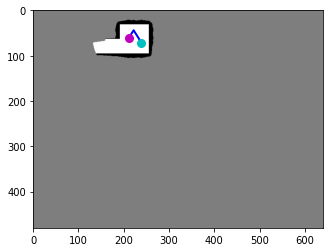

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4625, 0.0688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4396, 0.0953]), 'reward': tensor([0.0886]), 'action': tensor([-0.1504,  0.2365])}
terminal False


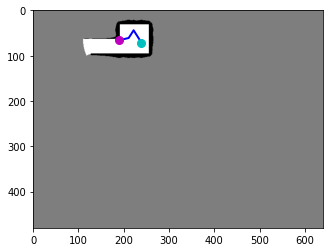

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4396, 0.0953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3958, 0.1031]), 'reward': tensor([0.1289]), 'action': tensor([-0.2927,  0.0702])}
terminal False


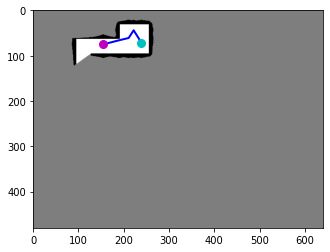

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3958, 0.1031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3229, 0.1172]), 'reward': tensor([0.1263]), 'action': tensor([-0.4881,  0.1341])}
terminal False


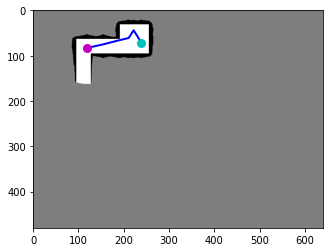

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3229, 0.1172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2479, 0.1297]), 'reward': tensor([0.2483]), 'action': tensor([-0.5128,  0.1126])}
terminal False


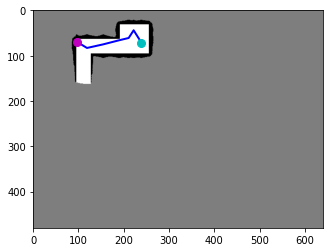

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2479, 0.1297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2479, 0.1297]), 'reward': tensor([-10.]), 'action': tensor([-0.3678, -0.2126])}
terminal True


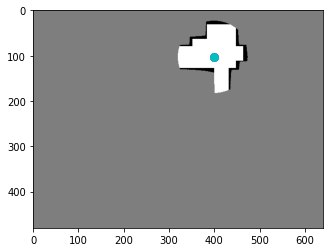

reward -10.208000019192696


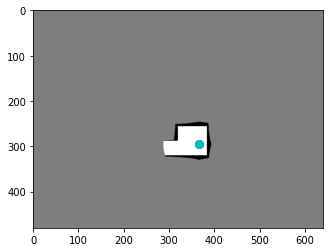

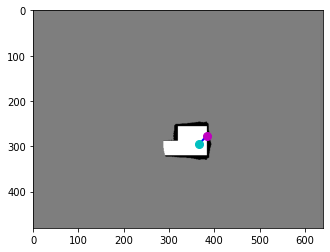

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7646, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([ 0.5411, -0.5939])}
terminal True


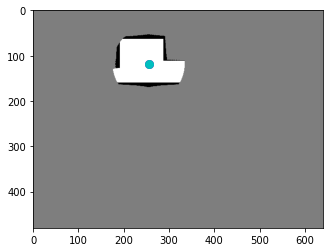

reward -10.0


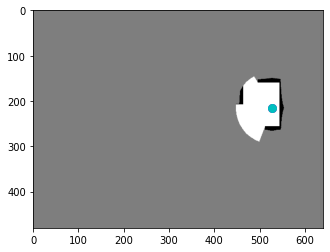

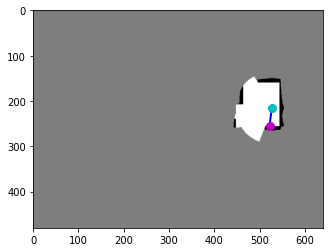

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0979, 0.3359]), 'reward': tensor([-10.]), 'action': tensor([-0.0640,  0.5836])}
terminal True


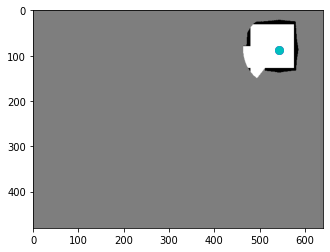

reward -10.0


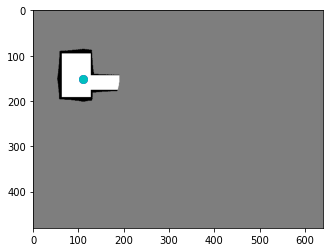

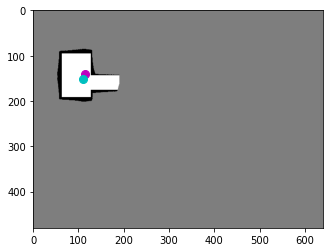

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2375, 0.2188]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0383, -0.1514])}
terminal False


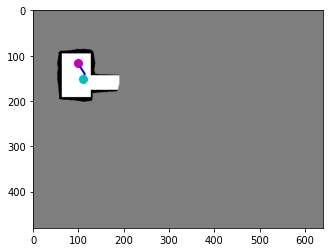

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2375, 0.2188]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2062, 0.1828]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2058, -0.3261])}
terminal False


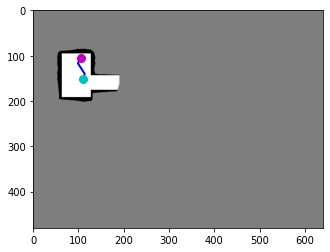

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2062, 0.1828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2188, 0.1641]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0800, -0.1744])}
terminal False


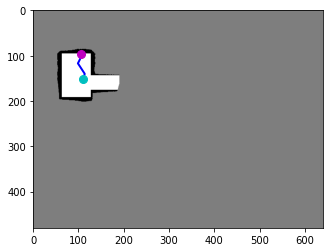

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2188, 0.1641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2188, 0.1641]), 'reward': tensor([-10.]), 'action': tensor([-0.0015, -0.1366])}
terminal True


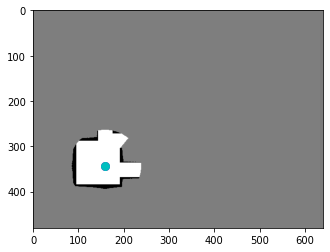

reward -12.400000035762787
step 5700
step 5800
avg iter time 0.808213524160714


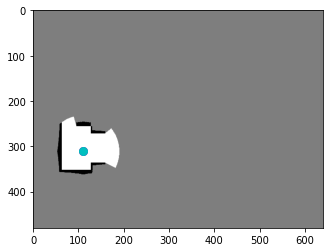

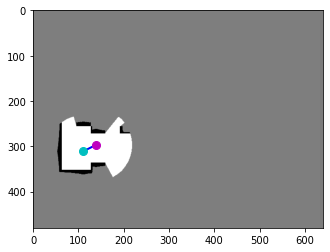

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2896, 0.4641]), 'reward': tensor([0.4546]), 'action': tensor([ 0.3974, -0.2043])}
terminal False


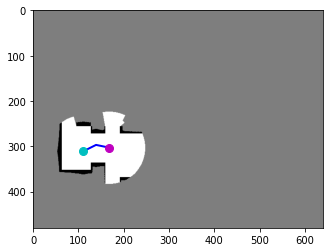

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2896, 0.4641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3500, 0.4734]), 'reward': tensor([0.6779]), 'action': tensor([0.4131, 0.0878])}
terminal False


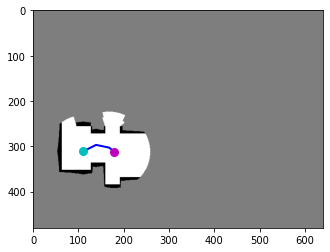

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3500, 0.4734]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3729, 0.4875]), 'reward': tensor([0.1870]), 'action': tensor([0.1617, 0.1243])}
terminal False


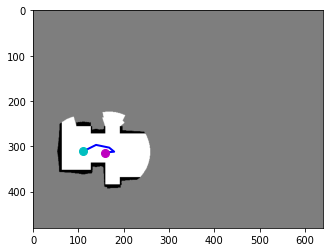

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3729, 0.4875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3292, 0.4906]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2920,  0.0280])}
terminal False


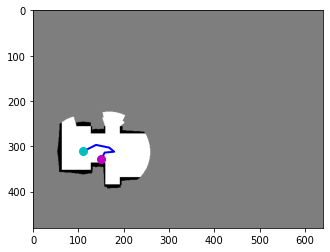

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3292, 0.4906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3146, 0.5125]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1035,  0.2002])}
terminal False


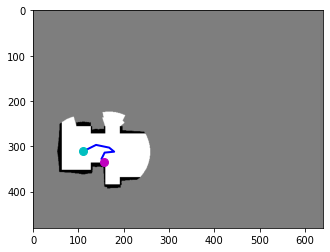

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3146, 0.5125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3146, 0.5125]), 'reward': tensor([-10.]), 'action': tensor([0.0419, 0.0636])}
terminal True


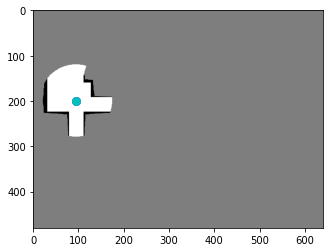

reward -10.280571430921555


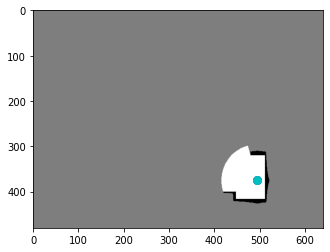

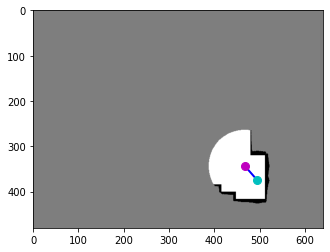

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9729, 0.5359]), 'reward': tensor([0.7639]), 'action': tensor([-0.3951, -0.4585])}
terminal False


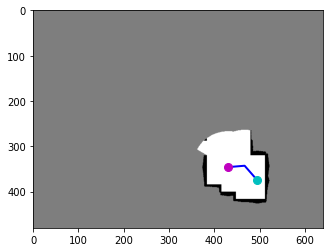

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9729, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.5406]), 'reward': tensor([0.2776]), 'action': tensor([-0.5068,  0.0476])}
terminal False


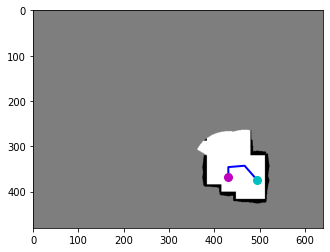

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.5406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.5750]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0070,  0.3146])}
terminal False


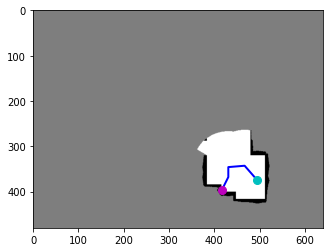

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.5750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8687, 0.6187]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2003,  0.3962])}
terminal False


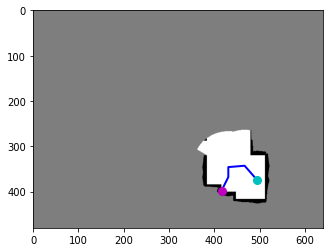

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8687, 0.6187]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8687, 0.6187]), 'reward': tensor([-10.]), 'action': tensor([-0.0004,  0.2975])}
terminal True


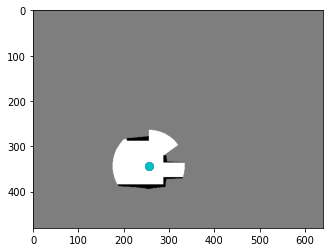

reward -10.558571457862854


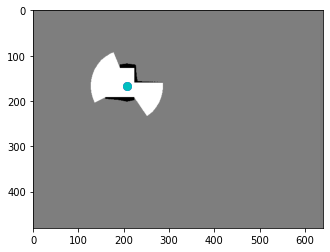

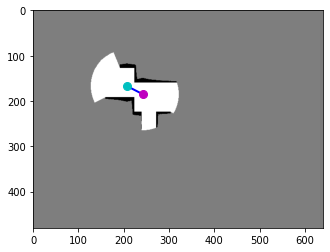

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5042, 0.2891]), 'reward': tensor([0.5710]), 'action': tensor([0.4889, 0.2476])}
terminal False


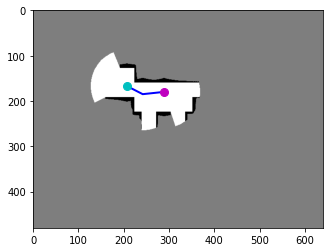

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5042, 0.2891]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6021, 0.2812]), 'reward': tensor([0.4773]), 'action': tensor([ 0.6613, -0.0722])}
terminal False


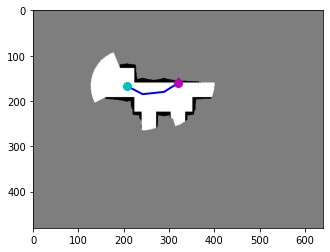

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6021, 0.2812]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6021, 0.2812]), 'reward': tensor([-10.]), 'action': tensor([ 0.5121, -0.3279])}
terminal True


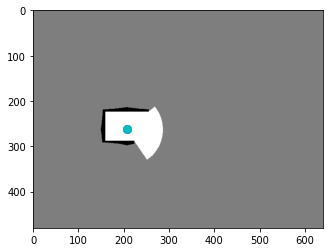

reward -8.951714307069778


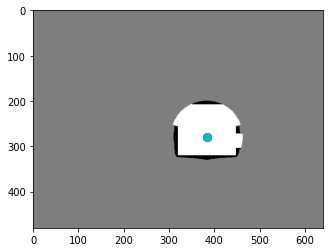

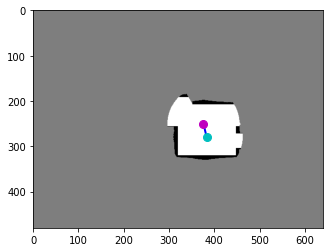

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7833, 0.3906]), 'reward': tensor([0.2820]), 'action': tensor([-0.0970, -0.4058])}
terminal False


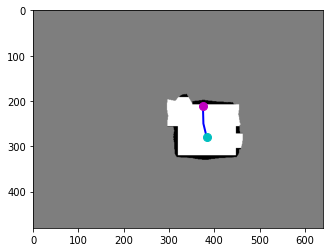

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7833, 0.3906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7812, 0.3313]), 'reward': tensor([0.0603]), 'action': tensor([-0.0080, -0.5369])}
terminal False


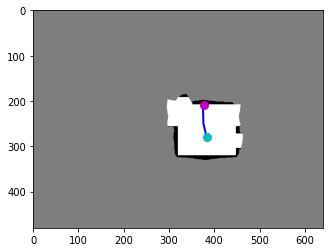

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7812, 0.3313]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7812, 0.3313]), 'reward': tensor([-10.]), 'action': tensor([ 0.1230, -0.1946])}
terminal True


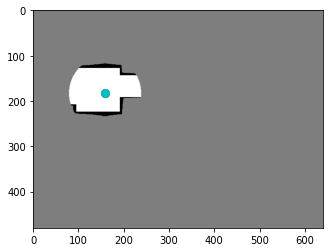

reward -9.657714281231165


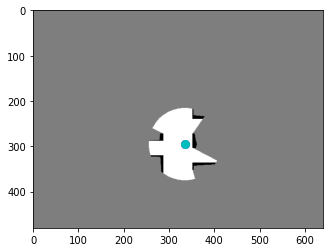

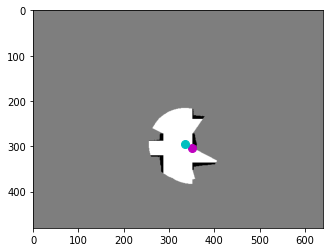

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6979, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([0.5267, 0.2574])}
terminal True


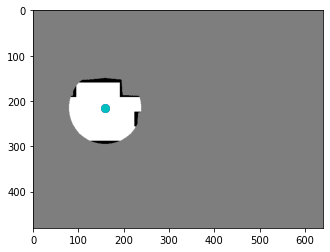

reward -10.0
step 5800
step 5900
avg iter time 0.809169229087183


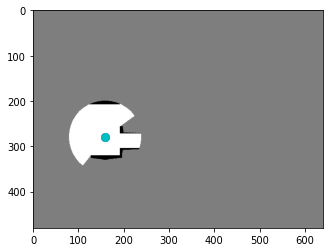

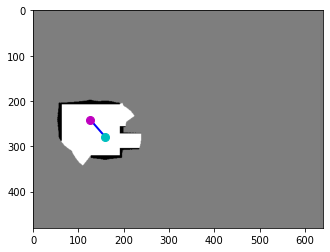

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2625, 0.3766]), 'reward': tensor([0.3539]), 'action': tensor([-0.4632, -0.5426])}
terminal False


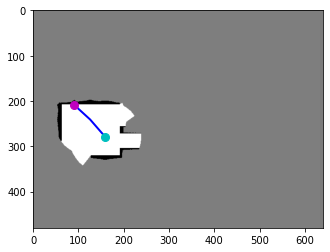

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2625, 0.3766]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1896, 0.3266]), 'reward': tensor([-0.8000]), 'action': tensor([-0.5006, -0.4502])}
terminal False


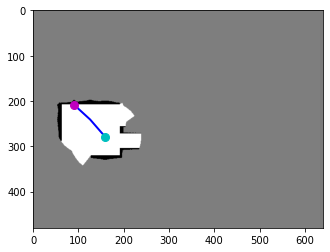

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1896, 0.3266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1896, 0.3266]), 'reward': tensor([-10.]), 'action': tensor([-0.5485, -0.7751])}
terminal True


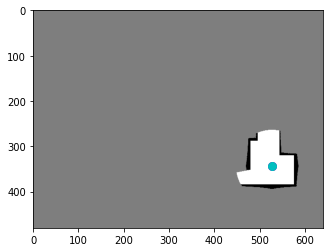

reward -10.446142882108688


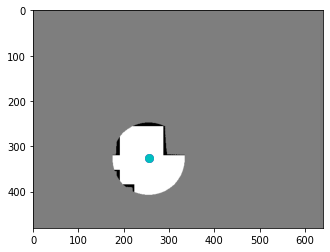

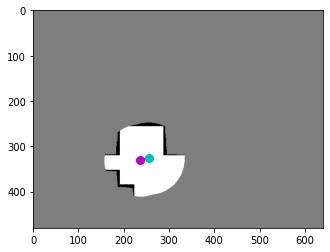

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5312, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4938, 0.5172]), 'reward': tensor([0.1399]), 'action': tensor([-0.2525,  0.0558])}
terminal False


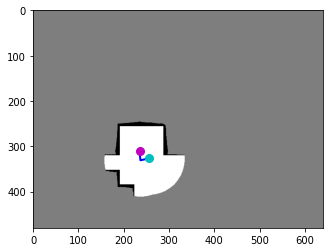

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4938, 0.5172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4896, 0.4844]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0341, -0.3008])}
terminal False


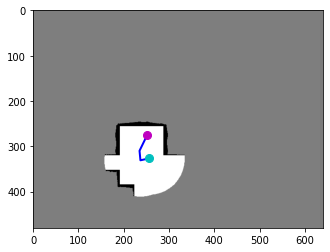

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4896, 0.4844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5250, 0.4297]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.2392, -0.4949])}
terminal False


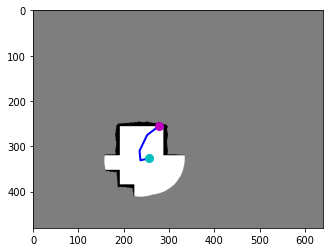

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5250, 0.4297]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5250, 0.4297]), 'reward': tensor([-10.]), 'action': tensor([ 0.3927, -0.3176])}
terminal True


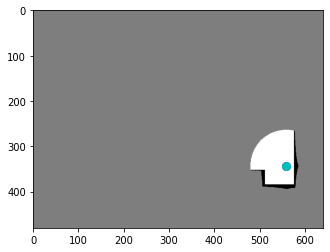

reward -11.460142880678177


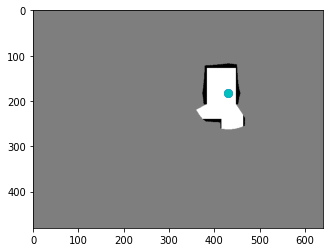

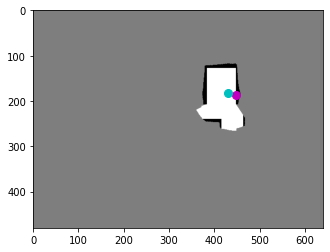

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8979, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8979, 0.2859]), 'reward': tensor([-10.]), 'action': tensor([0.2910, 0.0540])}
terminal True


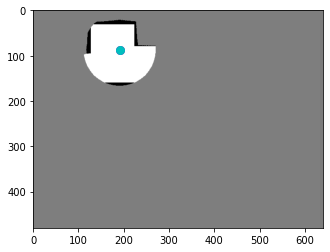

reward -10.0


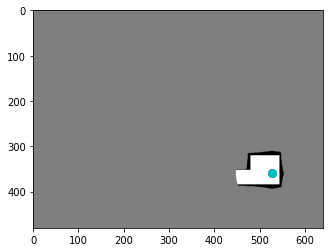

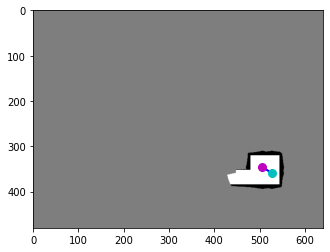

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0542, 0.5406]), 'reward': tensor([0.0590]), 'action': tensor([-0.2993, -0.1824])}
terminal False


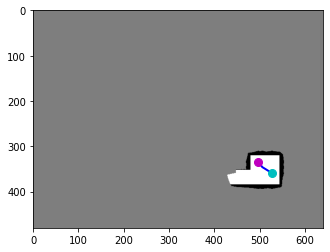

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0542, 0.5406]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0354, 0.5219]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1208, -0.1761])}
terminal False


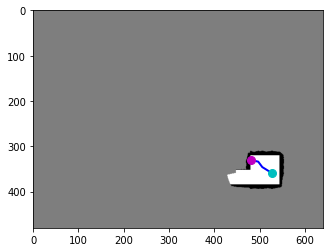

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0354, 0.5219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0354, 0.5219]), 'reward': tensor([-10.]), 'action': tensor([-0.4429, -0.0978])}
terminal True


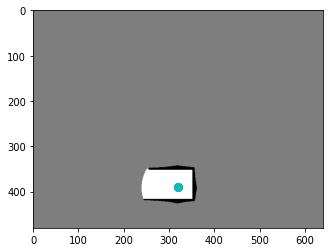

reward -10.741000011563301


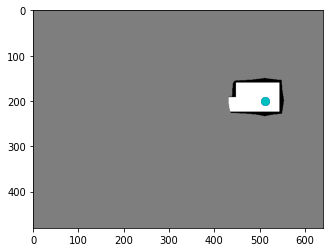

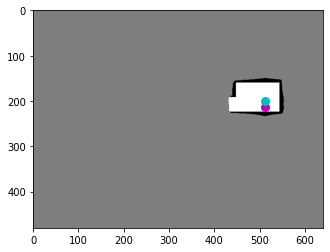

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.3109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0667, 0.3344]), 'reward': tensor([-0.8000]), 'action': tensor([0.0114, 0.2091])}
terminal False


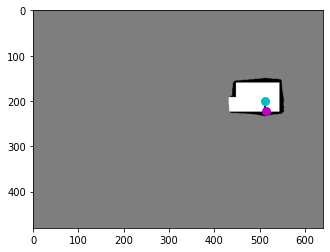

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0667, 0.3344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0667, 0.3344]), 'reward': tensor([-10.]), 'action': tensor([0.0470, 0.1780])}
terminal True


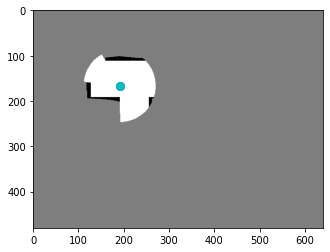

reward -10.800000011920929
step 5900
step 6000
avg iter time 0.8091140336990357


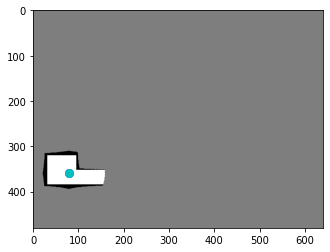

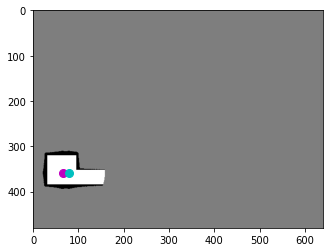

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.5609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1354, 0.5594]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1948, -0.0130])}
terminal False


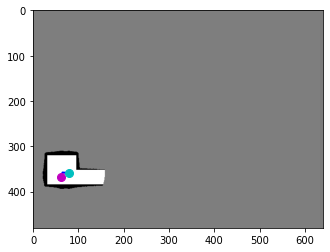

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1354, 0.5594]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1292, 0.5750]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0418,  0.1329])}
terminal False


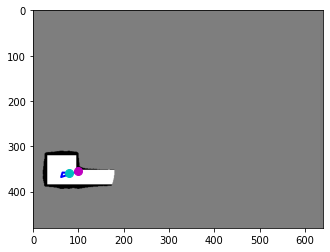

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1292, 0.5750]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2083, 0.5547]), 'reward': tensor([0.0934]), 'action': tensor([ 0.5404, -0.1820])}
terminal False


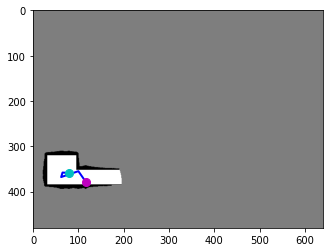

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2083, 0.5547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2417, 0.5906]), 'reward': tensor([0.0746]), 'action': tensor([0.2289, 0.3213])}
terminal False


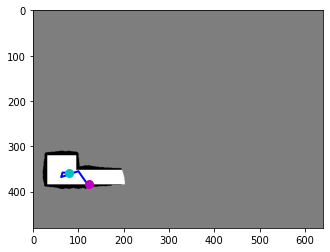

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2417, 0.5906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2417, 0.5906]), 'reward': tensor([-10.]), 'action': tensor([0.0608, 0.0403])}
terminal True


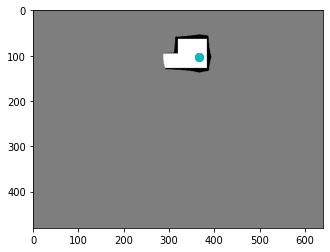

reward -11.432000018656254


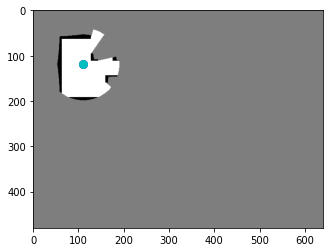

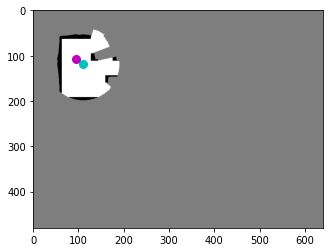

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2313, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1958, 0.1688]), 'reward': tensor([0.0886]), 'action': tensor([-0.2430, -0.1573])}
terminal False


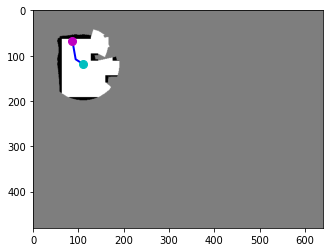

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1958, 0.1688]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1813, 0.1063]), 'reward': tensor([0.0509]), 'action': tensor([-0.1048, -0.5681])}
terminal False


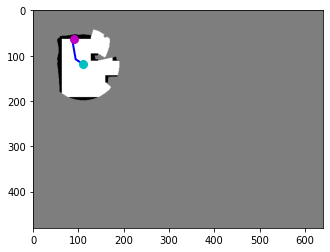

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1813, 0.1063]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1813, 0.1063]), 'reward': tensor([-10.]), 'action': tensor([ 0.2073, -0.3626])}
terminal True


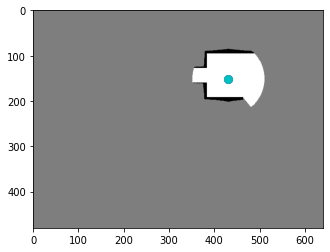

reward -9.860571429133415


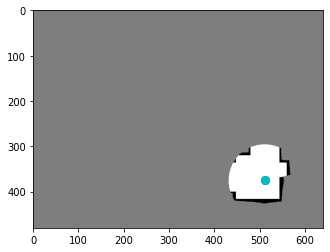

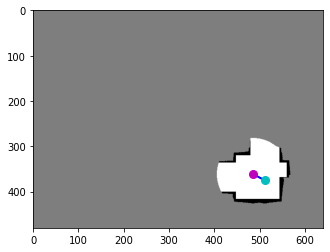

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0104, 0.5641]), 'reward': tensor([0.3299]), 'action': tensor([-0.3682, -0.2027])}
terminal False


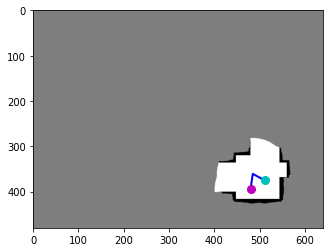

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0104, 0.5641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0000, 0.6172]), 'reward': tensor([0.0350]), 'action': tensor([-0.0723,  0.4809])}
terminal False


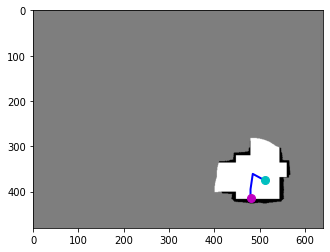

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0000, 0.6172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0000, 0.6172]), 'reward': tensor([-10.]), 'action': tensor([-0.0016,  0.2954])}
terminal True


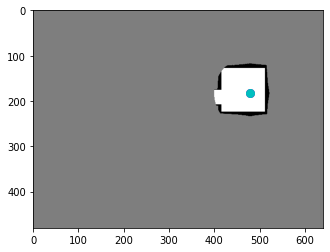

reward -9.635142859071493


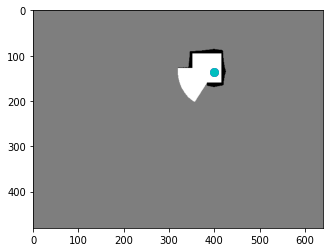

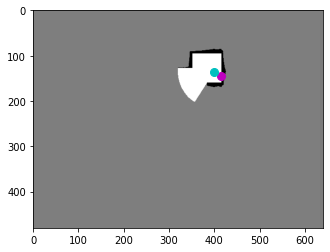

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8313, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8313, 0.2109]), 'reward': tensor([-10.]), 'action': tensor([0.4156, 0.2883])}
terminal True


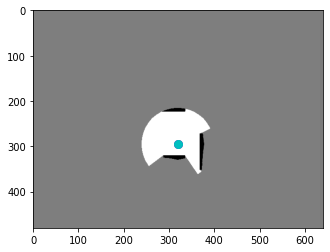

reward -10.0


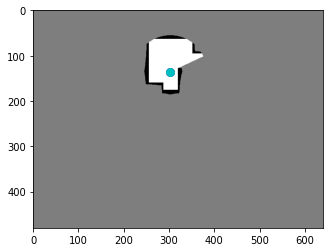

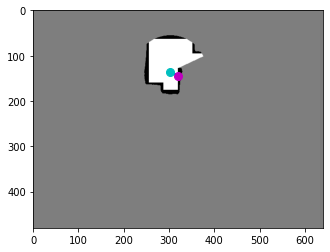

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6313, 0.2109]), 'reward': tensor([-10.]), 'action': tensor([0.7518, 0.4151])}
terminal True


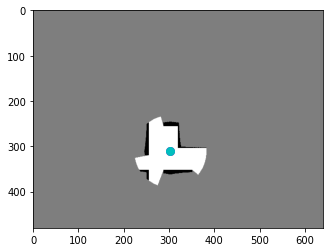

reward -10.0
step 6000
CRITIC


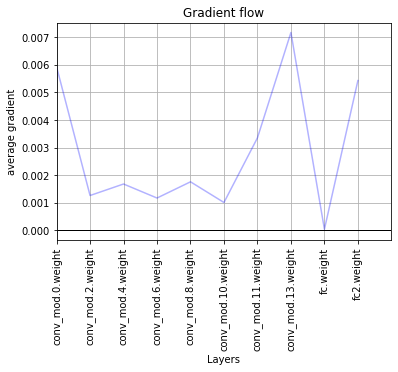

ACTOR


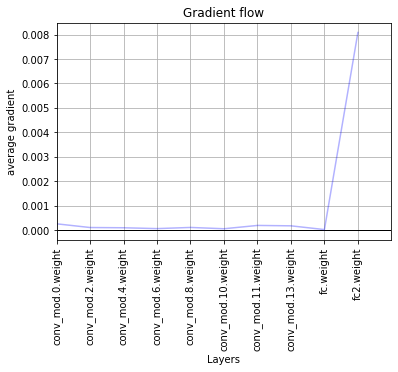

step 6100
avg iter time 0.8094676316370729


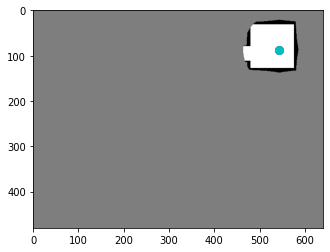

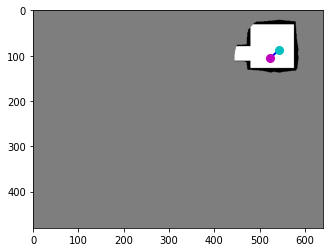

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1313, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0917, 0.1641]), 'reward': tensor([0.0863]), 'action': tensor([-0.2664,  0.2506])}
terminal False


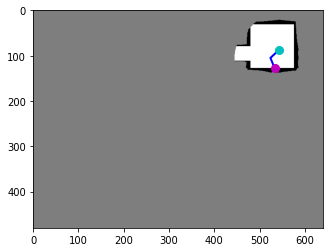

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0917, 0.1641]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1104, 0.1984]), 'reward': tensor([-0.8000]), 'action': tensor([0.1276, 0.3146])}
terminal False


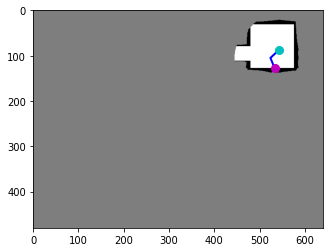

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1104, 0.1984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1104, 0.1984]), 'reward': tensor([-10.]), 'action': tensor([0.1656, 0.4926])}
terminal True


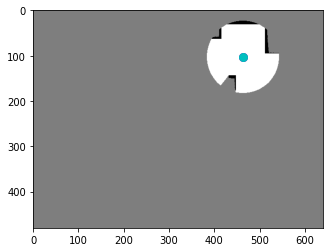

reward -10.71371429413557


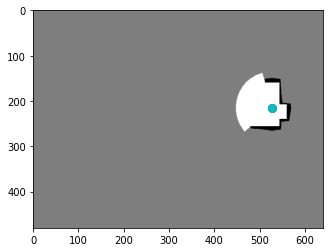

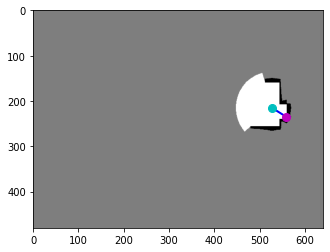

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0979, 0.3359]), 'reward': tensor([-10.]), 'action': tensor([0.6411, 0.3901])}
terminal True


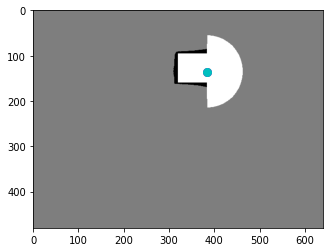

reward -10.0


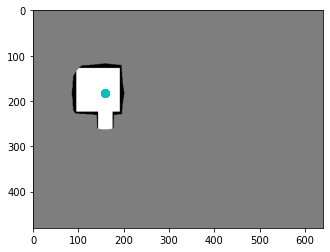

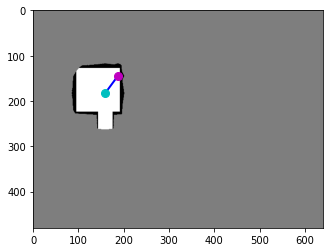

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3313, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3896, 0.2266]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.4017, -0.5343])}
terminal False


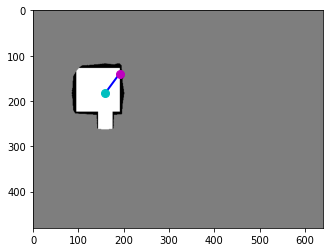

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3896, 0.2266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3896, 0.2266]), 'reward': tensor([-10.]), 'action': tensor([ 0.4193, -0.4794])}
terminal True


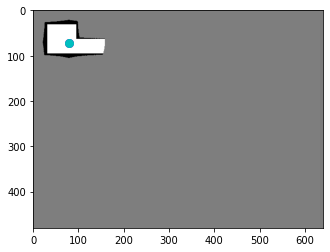

reward -10.800000011920929


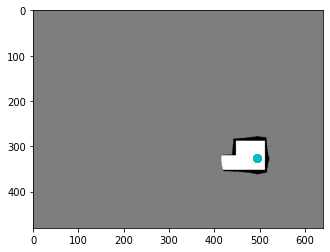

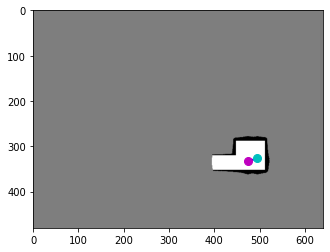

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0312, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9875, 0.5203]), 'reward': tensor([0.0979]), 'action': tensor([-0.2951,  0.0881])}
terminal False


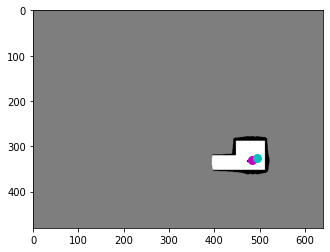

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9875, 0.5203]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.0083, 0.5172]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1031, -0.0196])}
terminal False


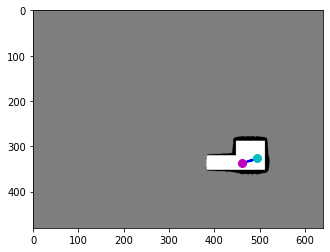

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0083, 0.5172]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9625, 0.5266]), 'reward': tensor([0.0550]), 'action': tensor([-0.3123,  0.0916])}
terminal False


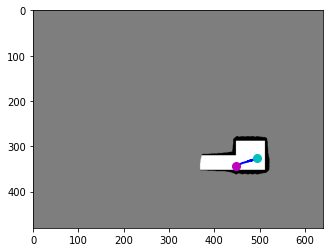

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9625, 0.5266]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9333, 0.5375]), 'reward': tensor([0.0620]), 'action': tensor([-0.1943,  0.1044])}
terminal False


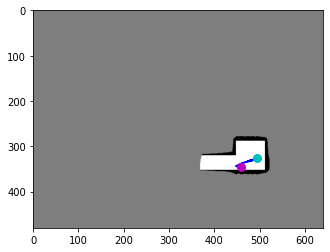

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9333, 0.5375]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9542, 0.5391]), 'reward': tensor([-0.8000]), 'action': tensor([0.0136, 0.0016])}
terminal False


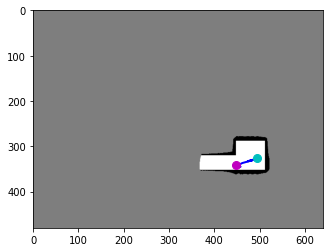

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9542, 0.5391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9312, 0.5344]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1602, -0.0385])}
terminal False


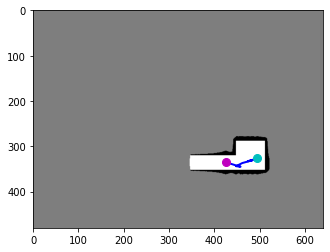

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9312, 0.5344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8854, 0.5234]), 'reward': tensor([0.1019]), 'action': tensor([-0.3176, -0.0956])}
terminal False


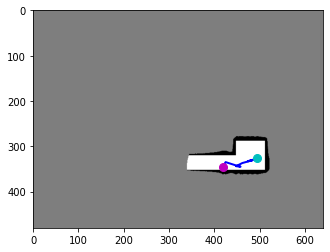

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8854, 0.5234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8729, 0.5391]), 'reward': tensor([0.0247]), 'action': tensor([-0.0825,  0.1384])}
terminal False


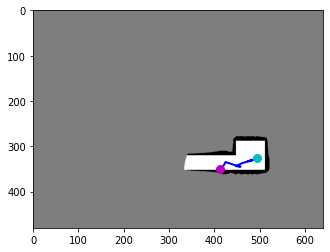

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8729, 0.5391]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8729, 0.5391]), 'reward': tensor([-10.]), 'action': tensor([-0.2622,  0.2940])}
terminal True


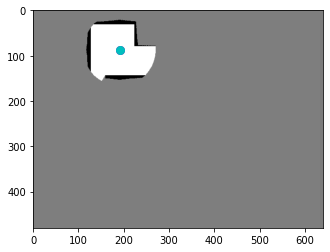

reward -12.05857147090137


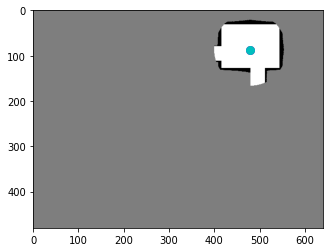

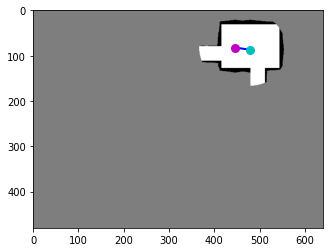

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9292, 0.1281]), 'reward': tensor([0.1506]), 'action': tensor([-0.4622, -0.0680])}
terminal False


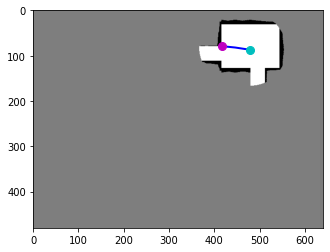

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9292, 0.1281]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9292, 0.1281]), 'reward': tensor([-10.]), 'action': tensor([-0.4605, -0.0359])}
terminal True


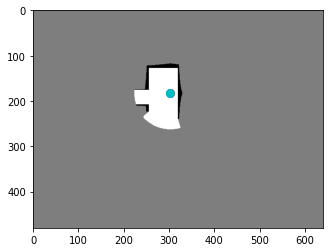

reward -9.849428564310074
step 6100
step 6200
avg iter time 0.8095731654090266


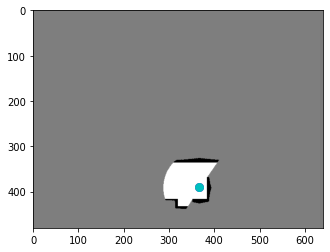

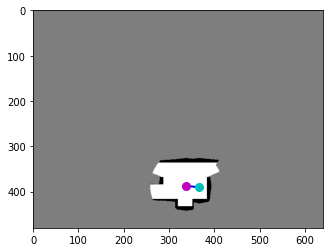

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7042, 0.6047]), 'reward': tensor([0.3080]), 'action': tensor([-0.4141, -0.0628])}
terminal False


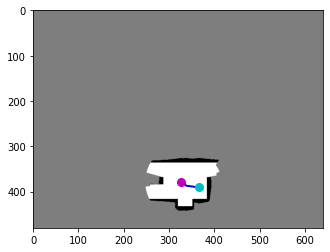

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7042, 0.6047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6812, 0.5906]), 'reward': tensor([0.0991]), 'action': tensor([-0.1545, -0.1249])}
terminal False


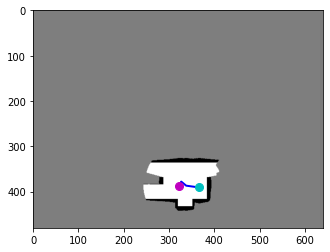

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6812, 0.5906]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6729, 0.6047]), 'reward': tensor([0.0339]), 'action': tensor([-0.0628,  0.1289])}
terminal False


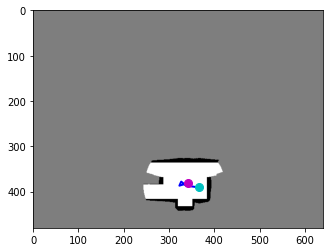

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6729, 0.6047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7146, 0.5953]), 'reward': tensor([0.0270]), 'action': tensor([ 0.2783, -0.0892])}
terminal False


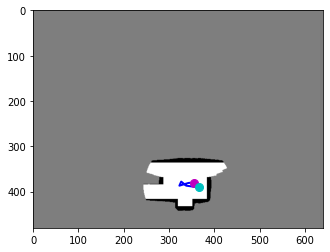

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7146, 0.5953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7396, 0.5938]), 'reward': tensor([0.0263]), 'action': tensor([ 0.1748, -0.0133])}
terminal False


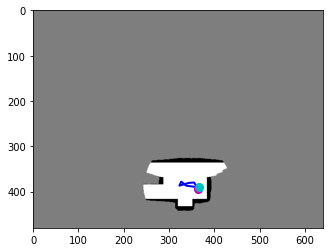

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7396, 0.5938]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7604, 0.6156]), 'reward': tensor([-0.8000]), 'action': tensor([0.1424, 0.2045])}
terminal False


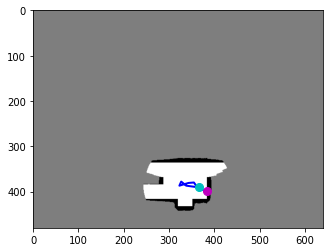

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7604, 0.6156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.6234]), 'reward': tensor([-0.8000]), 'action': tensor([0.2524, 0.0728])}
terminal False


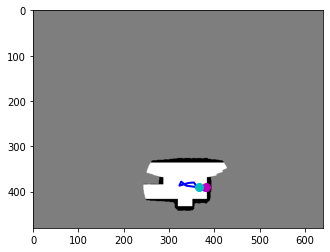

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.6234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7958, 0.6078]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0140, -0.1295])}
terminal False


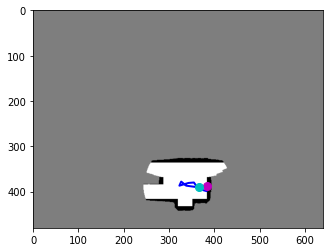

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7958, 0.6078]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7958, 0.6078]), 'reward': tensor([-10.]), 'action': tensor([ 0.1018, -0.1521])}
terminal True


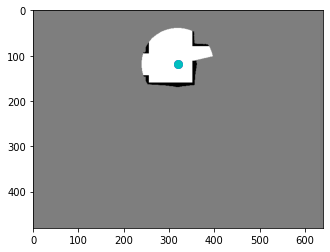

reward -11.905714321881533


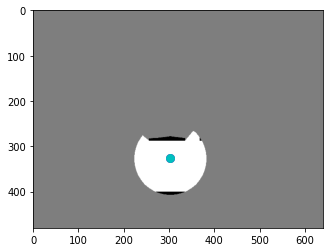

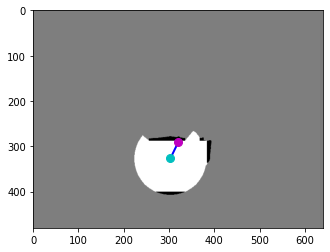

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.5109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6687, 0.4531]), 'reward': tensor([0.0274]), 'action': tensor([ 0.2523, -0.5271])}
terminal False


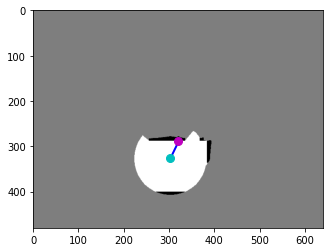

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6687, 0.4531]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6687, 0.4531]), 'reward': tensor([-10.]), 'action': tensor([-0.0578, -0.2558])}
terminal True


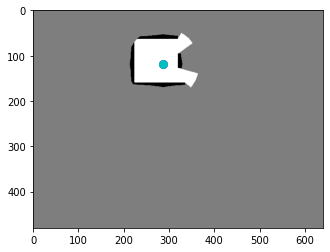

reward -9.972571428865194


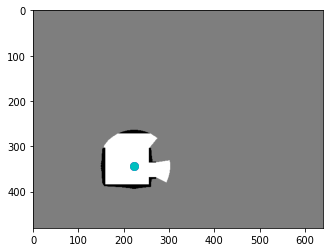

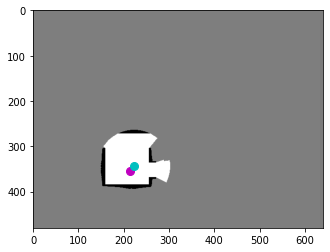

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4646, 0.5359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4437, 0.5547]), 'reward': tensor([-0.8000]), 'action': tensor([-0.1389,  0.1734])}
terminal False


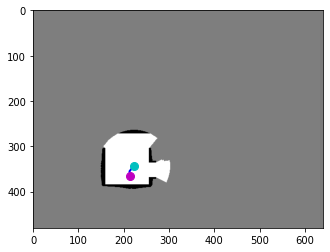

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4437, 0.5547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4437, 0.5703]), 'reward': tensor([-0.8000]), 'action': tensor([0.0004, 0.0304])}
terminal False


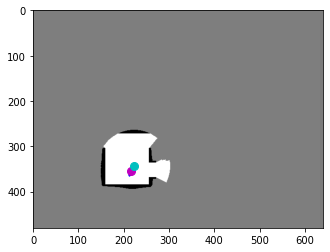

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4437, 0.5703]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4521, 0.5547]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0499, -0.1372])}
terminal False


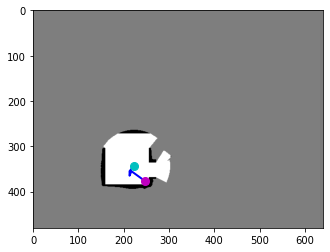

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4521, 0.5547]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5125, 0.5875]), 'reward': tensor([0.0554]), 'action': tensor([0.4051, 0.2904])}
terminal False


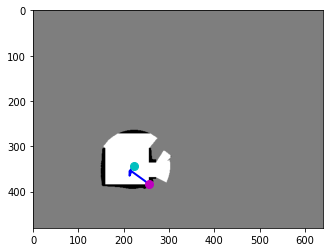

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5125, 0.5875]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5125, 0.5875]), 'reward': tensor([-10.]), 'action': tensor([0.1572, 0.1247])}
terminal True


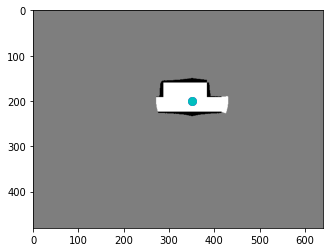

reward -12.344571463763714


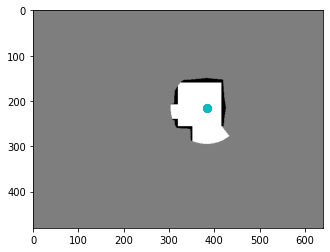

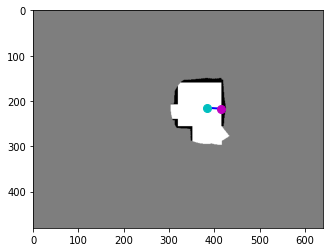

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7979, 0.3359]), 'reward': tensor([-10.]), 'action': tensor([0.6218, 0.0410])}
terminal True


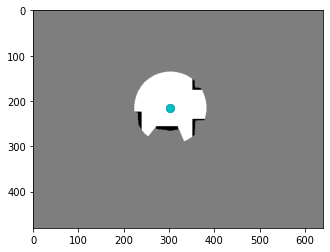

reward -10.0


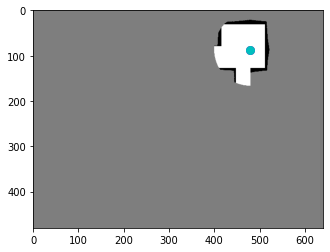

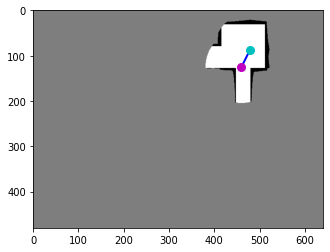

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.1359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.1953]), 'reward': tensor([0.3017]), 'action': tensor([-0.2701,  0.5375])}
terminal False


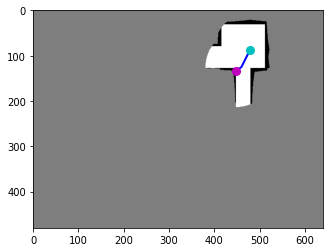

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9583, 0.1953]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9583, 0.1953]), 'reward': tensor([-10.]), 'action': tensor([-0.2816,  0.2125])}
terminal True


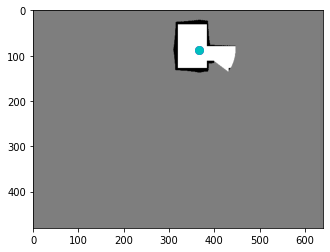

reward -9.698285728693008
step 6200
step 6300
avg iter time 0.8100638797926525


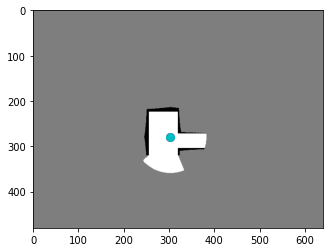

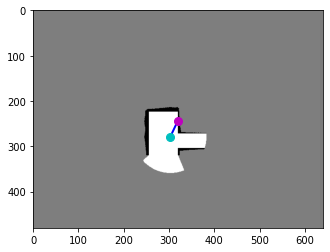

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.4359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6313, 0.4359]), 'reward': tensor([-10.]), 'action': tensor([ 0.2372, -0.5011])}
terminal True


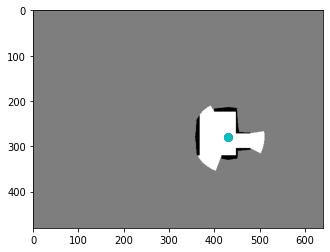

reward -10.0


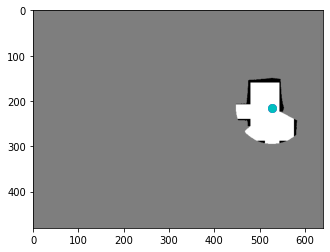

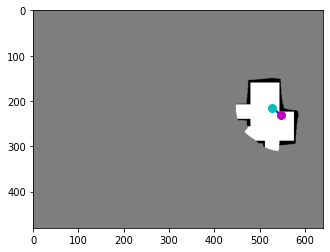

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.0979, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1417, 0.3609]), 'reward': tensor([0.1044]), 'action': tensor([0.3006, 0.2296])}
terminal False


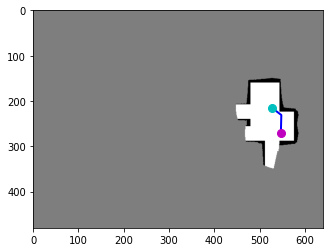

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1417, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1396, 0.4234]), 'reward': tensor([0.1697]), 'action': tensor([-0.0181,  0.5711])}
terminal False


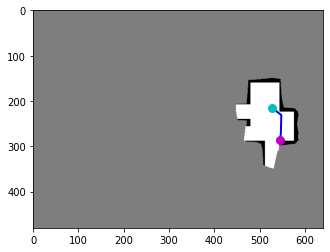

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([1.1396, 0.4234]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([1.1396, 0.4234]), 'reward': tensor([-10.]), 'action': tensor([-0.0468,  0.3426])}
terminal True


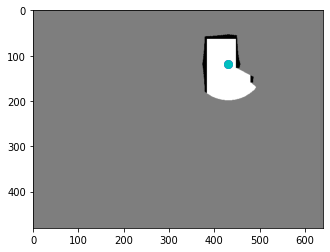

reward -9.725857138633728


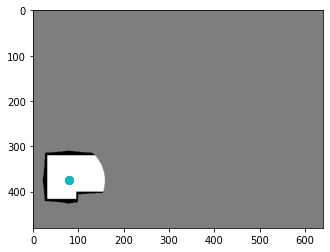

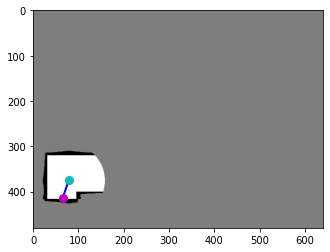

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1646, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1646, 0.5859]), 'reward': tensor([-10.]), 'action': tensor([-0.2076,  0.6290])}
terminal True


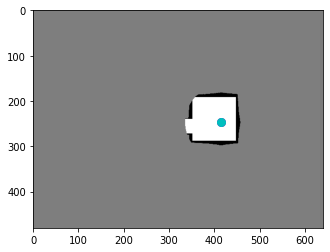

reward -10.0


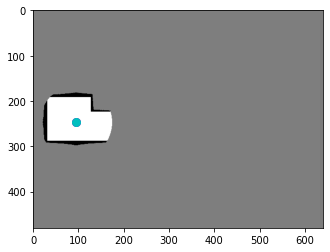

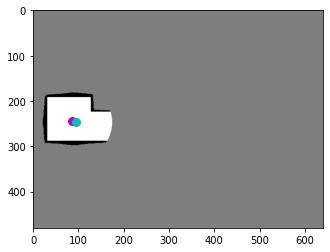

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1979, 0.3859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1771, 0.3828]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0881, -0.0195])}
terminal False


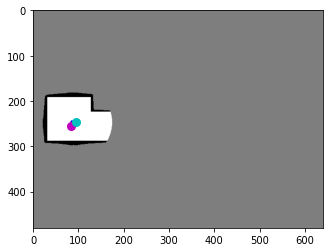

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1771, 0.3828]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1729, 0.3984]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0199,  0.1132])}
terminal False


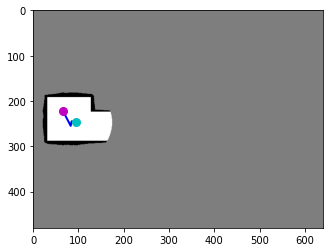

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1729, 0.3984]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1375, 0.3469]), 'reward': tensor([-0.8000]), 'action': tensor([-0.2428, -0.4726])}
terminal False


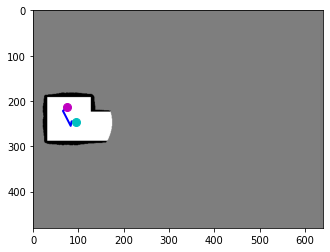

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1375, 0.3469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1562, 0.3344]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.1258, -0.1169])}
terminal False


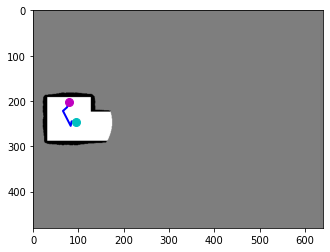

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1562, 0.3344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1667, 0.3156]), 'reward': tensor([-0.8000]), 'action': tensor([ 0.0644, -0.1755])}
terminal False


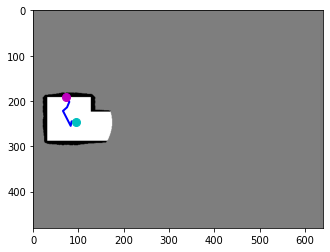

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.1667, 0.3156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.1667, 0.3156]), 'reward': tensor([-10.]), 'action': tensor([-0.1806, -0.2741])}
terminal True


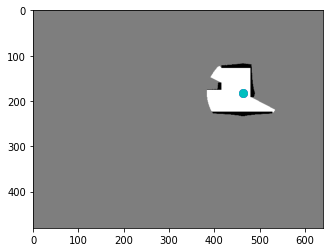

reward -14.000000059604645


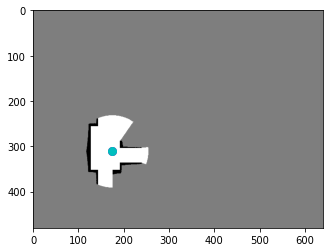

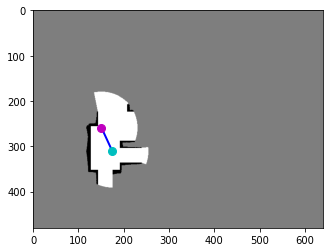

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3646, 0.4859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3146, 0.4047]), 'reward': tensor([0.6544]), 'action': tensor([-0.3361, -0.7316])}
terminal False


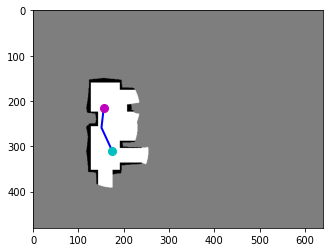

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3146, 0.4047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3250, 0.3359]), 'reward': tensor([0.4360]), 'action': tensor([ 0.0758, -0.6273])}
terminal False


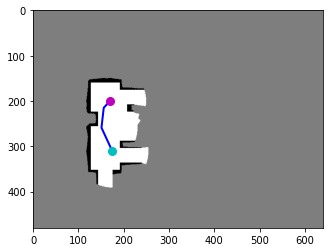

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3250, 0.3359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3542, 0.3125]), 'reward': tensor([0.1013]), 'action': tensor([ 0.1958, -0.2051])}
terminal False


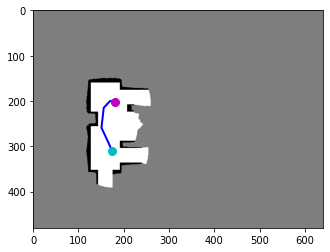

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3542, 0.3125]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3750, 0.3156]), 'reward': tensor([0.0669]), 'action': tensor([0.0864, 0.0214])}
terminal False


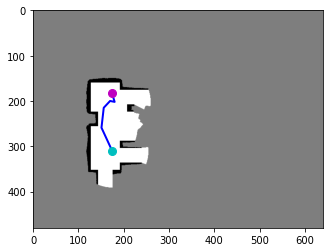

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3750, 0.3156]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3625, 0.2844]), 'reward': tensor([-0.8000]), 'action': tensor([-0.0814, -0.2789])}
terminal False


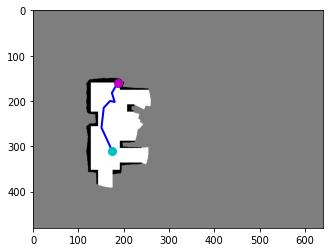

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3625, 0.2844]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3625, 0.2844]), 'reward': tensor([-10.]), 'action': tensor([ 0.2313, -0.3946])}
terminal True


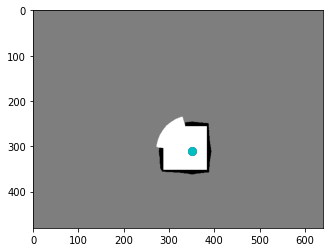

reward -9.541428625583649
step 6300
step 6400
avg iter time 0.811020256653428


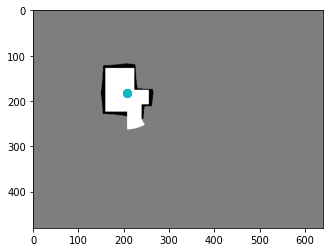

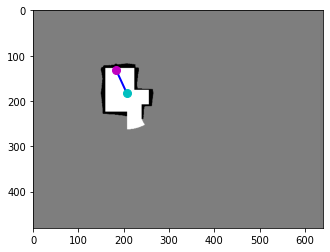

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3812, 0.2047]), 'reward': tensor([-0.8000]), 'action': tensor([-0.3402, -0.7292])}
terminal False


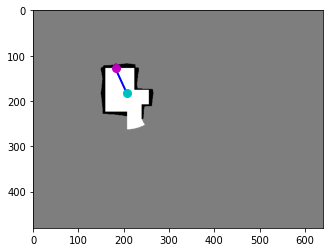

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.3812, 0.2047]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.3812, 0.2047]), 'reward': tensor([-10.]), 'action': tensor([ 0.1811, -0.7501])}
terminal True


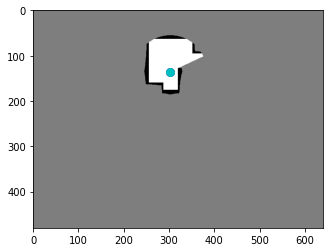

reward -10.800000011920929


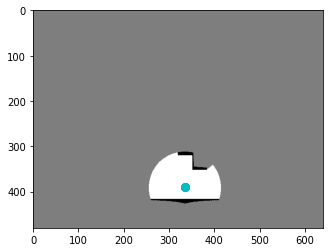

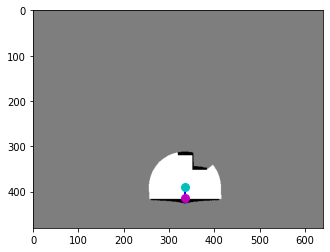

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6979, 0.6109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6979, 0.6109]), 'reward': tensor([-10.]), 'action': tensor([0.0330, 0.4909])}
terminal True


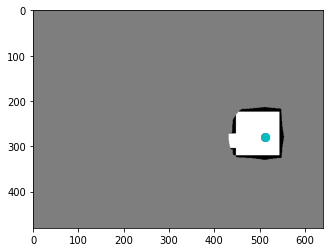

reward -10.0


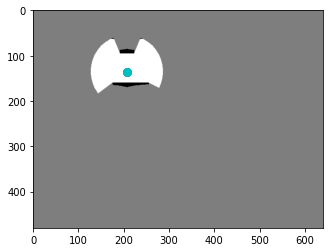

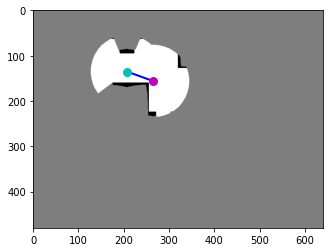

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5521, 0.2438]), 'reward': tensor([1.]), 'action': tensor([0.8145, 0.2946])}
terminal False


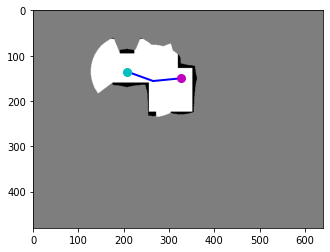

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5521, 0.2438]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6792, 0.2344]), 'reward': tensor([0.2260]), 'action': tensor([ 0.8667, -0.0813])}
terminal False


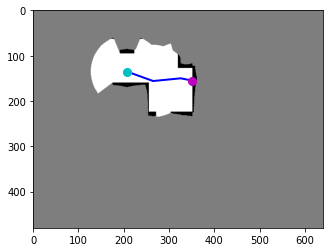

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6792, 0.2344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6792, 0.2344]), 'reward': tensor([-10.]), 'action': tensor([0.7956, 0.1592])}
terminal True


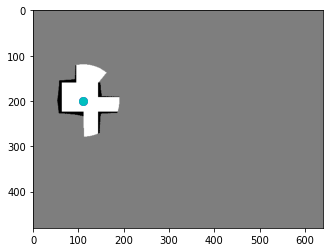

reward -8.774000003933907


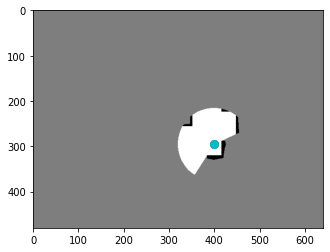

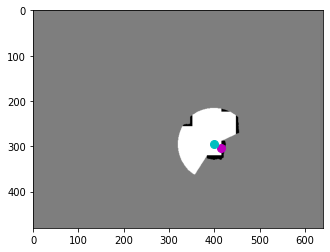

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8313, 0.4609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8313, 0.4609]), 'reward': tensor([-10.]), 'action': tensor([0.5033, 0.2654])}
terminal True


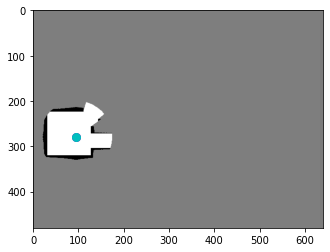

reward -10.0


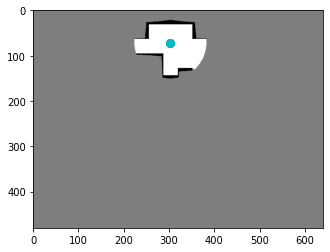

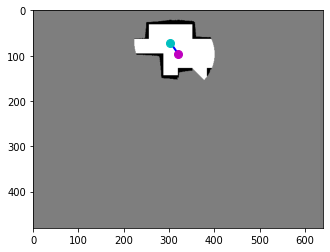

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6313, 0.1109]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.6687, 0.1516]), 'reward': tensor([0.2697]), 'action': tensor([0.2535, 0.3662])}
terminal False


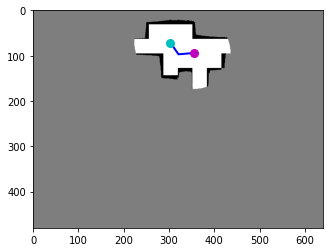

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.6687, 0.1516]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7417, 0.1469]), 'reward': tensor([0.3743]), 'action': tensor([ 0.4913, -0.0416])}
terminal False


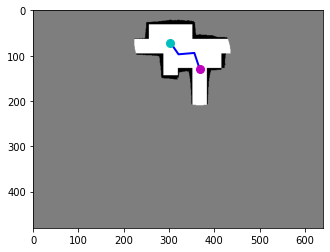

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7417, 0.1469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7667, 0.2031]), 'reward': tensor([0.1686]), 'action': tensor([0.1728, 0.5073])}
terminal False


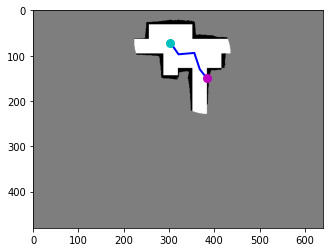

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7667, 0.2031]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7667, 0.2031]), 'reward': tensor([-10.]), 'action': tensor([0.5168, 0.6527])}
terminal True


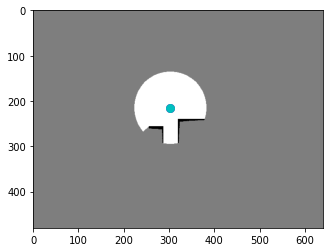

reward -9.187428548932076
step 6400
step 6500
avg iter time 0.8110782180932852


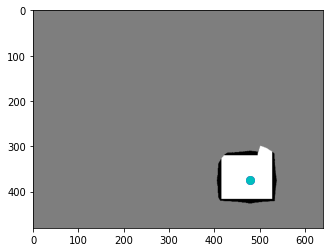

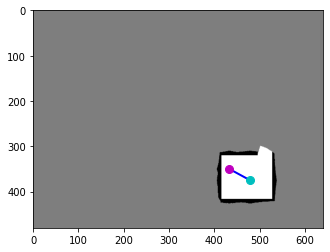

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9979, 0.5859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9021, 0.5469]), 'reward': tensor([-0.8000]), 'action': tensor([-0.6553, -0.3560])}
terminal False


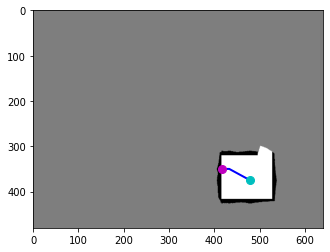

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.9021, 0.5469]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.9021, 0.5469]), 'reward': tensor([-10.]), 'action': tensor([-0.5224,  0.0066])}
terminal True


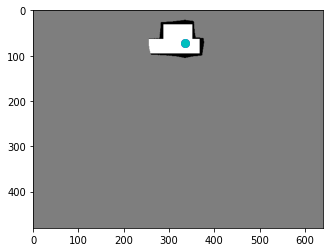

reward -10.800000011920929


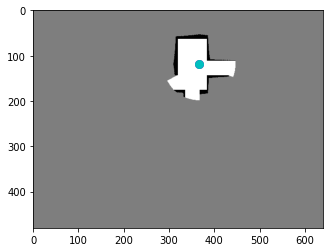

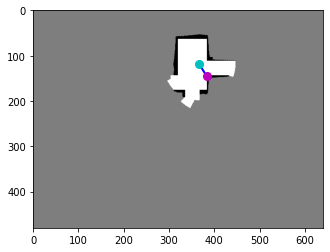

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7646, 0.1859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.7646, 0.1859]), 'reward': tensor([-10.]), 'action': tensor([0.3933, 0.6183])}
terminal True


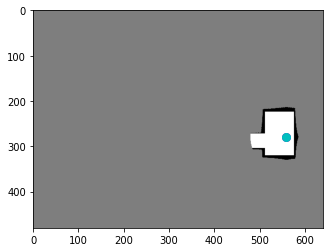

reward -10.0


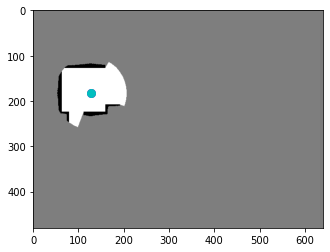

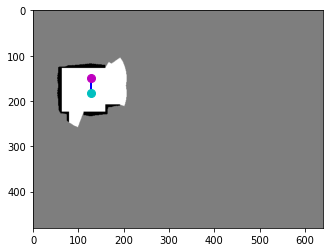

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.2859]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.2344]), 'reward': tensor([0.1089]), 'action': tensor([-0.0024, -0.4622])}
terminal False


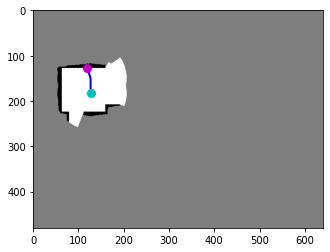

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.2646, 0.2344]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.2646, 0.2344]), 'reward': tensor([-10.]), 'action': tensor([-0.2090, -0.6297])}
terminal True


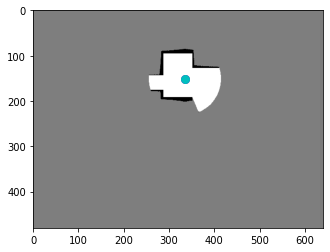

reward -9.89114286005497


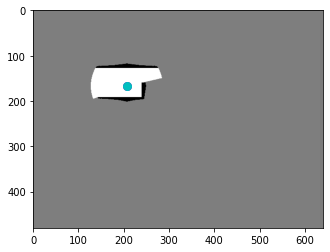

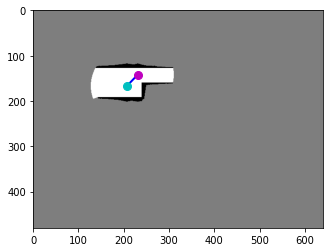

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4313, 0.2609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.4812, 0.2219]), 'reward': tensor([0.1570]), 'action': tensor([ 0.3369, -0.3518])}
terminal False


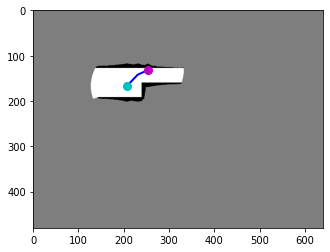

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.4812, 0.2219]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5271, 0.2062]), 'reward': tensor([0.0967]), 'action': tensor([ 0.3147, -0.1417])}
terminal False


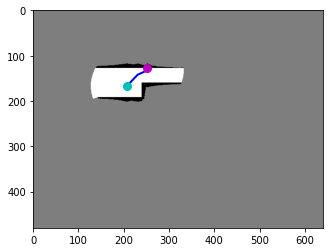

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5271, 0.2062]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5271, 0.2062]), 'reward': tensor([-10.]), 'action': tensor([-0.0241, -0.0656])}
terminal True


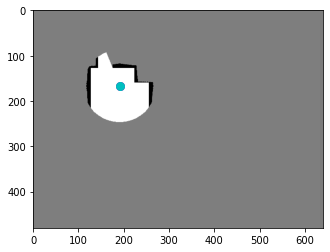

reward -9.7462857067585


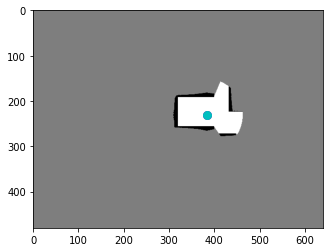

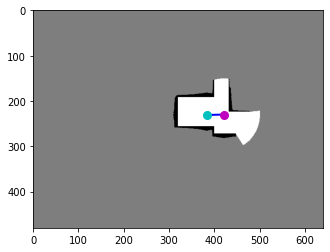

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.7979, 0.3609]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8771, 0.3594]), 'reward': tensor([0.4301]), 'action': tensor([ 0.5445, -0.0152])}
terminal False


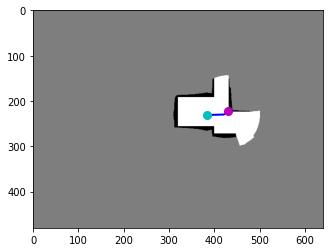

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.8771, 0.3594]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.8771, 0.3594]), 'reward': tensor([-10.]), 'action': tensor([ 0.4186, -0.2943])}
terminal True


KeyboardInterrupt: ignored

In [143]:
 #os.mkdir('/content/drive/My Drive/models')
td3.train(50000)

In [144]:
for name, params in td3.critic2.named_parameters():

  print(name)
  print(params.abs().mean())

conv_mod.0.weight
tensor(0.0612, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.0.bias
tensor(0.0538, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.2.weight
tensor(1.0001, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.2.bias
tensor(0.0014, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.4.weight
tensor(0.0221, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.4.bias
tensor(0.0218, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.6.weight
tensor(1.0000, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.6.bias
tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.8.weight
tensor(0.0208, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.8.bias
tensor(0.0211, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.10.weight
tensor(0.9998, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.10.bias
tensor(0.0018, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.11.weight
tensor(0.0628, device='cuda:0', grad_fn=<MeanBackward0>)
conv_mod.11.bias
tensor(0.0653, de

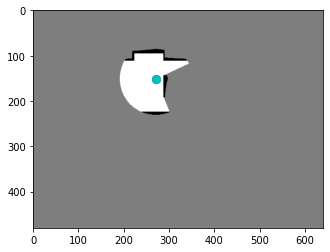

test_position [271 151]


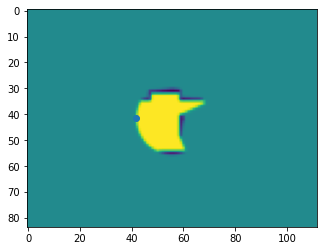

In [159]:
import cv2

test_map, test_position = replay.test_env.reset(replay.test_env.index_map, False)
print('test_position', test_position)
shifted = np.roll(test_map, (240 - test_position[1], 320 - test_position[0]),axis=[0, 1])
sized = resize(shifted, (84, 112))
plt.imshow(sized)
plt.scatter(41.5, 41.5)

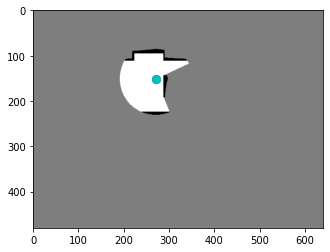

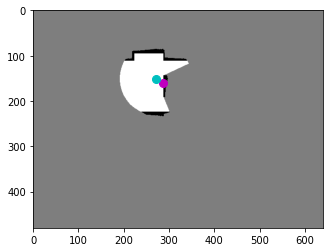

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([0.5646, 0.2359]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5646, 0.2359]), 'reward': tensor([-1.]), 'action': tensor([0.1719, 0.3945])}
terminal True


In [ ]:

#  test_map, test_position = self.replay.test_env.reset()
test_map, test_position = replay.test_env.reset(replay.test_env.index_map, False)
test_map = resize(test_map, (84, 112))
test_map = test_map / 255
test_position = test_position.astype(np.float64)
test_position[0] = test_position[0] / 480
test_position[1] = test_position[1] / 640
test_action = {'map':torch.from_numpy(test_map).float(), 'position':torch.from_numpy(test_position).float()}
x = 0
total_test_reward = 0
while x < 300:
    test_action, test_terminal = replay.generate_step(ActorPolicy(td3.actor), test_action, False, False, True)
    print('action', test_action)
    print('terminal', test_terminal)
    total_test_reward += test_action['reward'].item()

    test_map = resize(test_map, (84, 112))
    test_map = test_map / 255
    test_position = test_position.astype(np.float64)
    test_position[0] = test_position[0] / 480
    test_position[1] = test_position[1] / 640
    test_action = {'map':torch.from_numpy(test_map).float(), 'position':torch.from_numpy(test_position).float()}
    x += 1
    
    if test_terminal:
        break

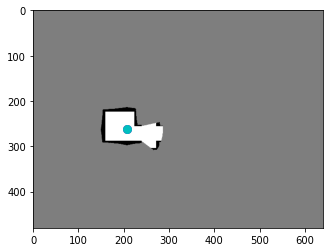

appending [0. 0.]
appending [ 0.46676096 -0.0990099 ]
appending last [0. 0.]
action offset [0. 0.]
row move 0.0
col move 0.0


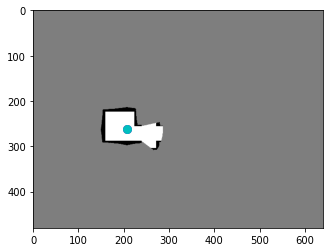

action offset [ 0.46676096 -0.0990099 ]
row move 33.00000009834766
col move -7.000000020861626


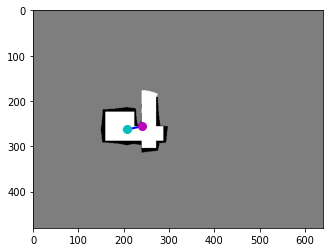

action offset [0. 0.]
row move 0.0
col move 0.0


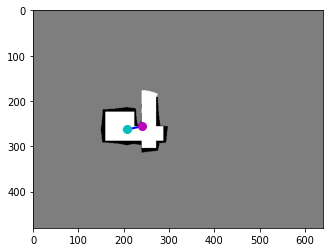

action {'last_map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'last_position': tensor([276.0000, 197.2500]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5000, 0.4000]), 'reward': tensor([-0.8000]), 'action': tensor([0., 0.])}
terminal False
appending [0. 0.]


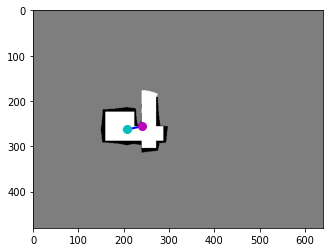

action offset [ 0. -1.]
row move 0.0
col move -70.7


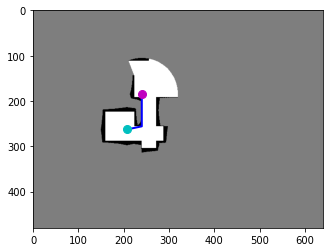

action {'last_map': tensor([[0.0020, 0.0020, 0.0020,  ..., 0.0020, 0.0020, 0.0020],
        [0.0020, 0.0020, 0.0020,  ..., 0.0020, 0.0020, 0.0020],
        [0.0020, 0.0020, 0.0020,  ..., 0.0020, 0.0020, 0.0020],
        ...,
        [0.0020, 0.0020, 0.0020,  ..., 0.0020, 0.0020, 0.0020],
        [0.0020, 0.0020, 0.0020,  ..., 0.0020, 0.0020, 0.0020],
        [0.0020, 0.0020, 0.0020,  ..., 0.0020, 0.0020, 0.0020]]), 'last_position': tensor([0.5750, 0.3082]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980]]), 'position': tensor([0.5000, 0.2891]), 'reward': tensor([0.9304]), 'action': tensor([ 0., -1.])}
terminal False
appending [0. 0.]
app

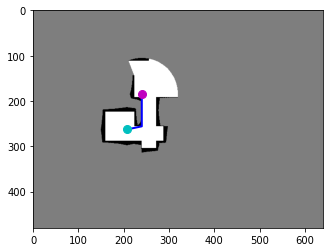

action offset [-0.22630835 -0.5799151 ]
row move -16.000000047683717
col move -40.99999801516533


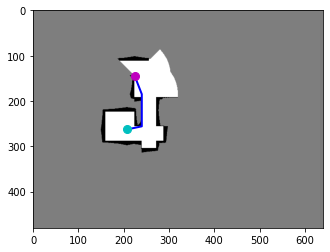

action offset [-0.16973126 -0.43847242]
row move -12.000000035762787
col move -31.0000000923872


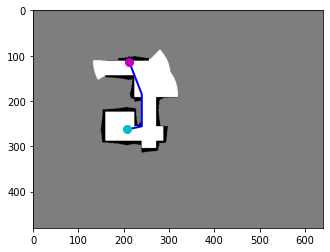

action {'last_map': tensor([[7.6592e-06, 7.6592e-06, 7.6592e-06,  ..., 7.6592e-06, 7.6592e-06,
         7.6592e-06],
        [7.6592e-06, 7.6592e-06, 7.6592e-06,  ..., 7.6592e-06, 7.6592e-06,
         7.6592e-06],
        [7.6592e-06, 7.6592e-06, 7.6592e-06,  ..., 7.6592e-06, 7.6592e-06,
         7.6592e-06],
        ...,
        [7.6592e-06, 7.6592e-06, 7.6592e-06,  ..., 7.6592e-06, 7.6592e-06,
         7.6592e-06],
        [7.6592e-06, 7.6592e-06, 7.6592e-06,  ..., 7.6592e-06, 7.6592e-06,
         7.6592e-06],
        [7.6592e-06, 7.6592e-06, 7.6592e-06,  ..., 7.6592e-06, 7.6592e-06,
         7.6592e-06]]), 'last_position': tensor([0.0012, 0.0005]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],


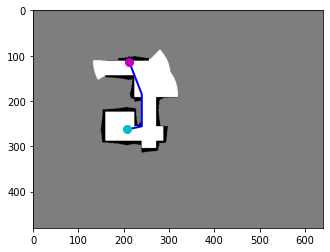

action offset [-0.834512   -0.01414427]
row move -58.99999806880951
col move -1.0000000029802323


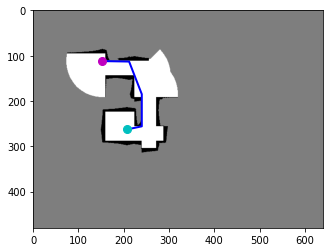

action offset [-0.26874116  0.        ]
row move -19.000000056624412
col move 0.0


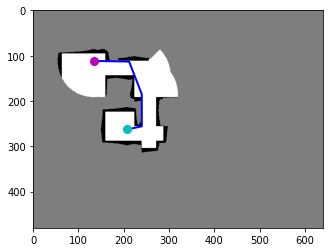

action {'last_map': tensor([[3.0036e-08, 3.0036e-08, 3.0036e-08,  ..., 3.0036e-08, 3.0036e-08,
         3.0036e-08],
        [3.0036e-08, 3.0036e-08, 3.0036e-08,  ..., 3.0036e-08, 3.0036e-08,
         3.0036e-08],
        [3.0036e-08, 3.0036e-08, 3.0036e-08,  ..., 3.0036e-08, 3.0036e-08,
         3.0036e-08],
        ...,
        [3.0036e-08, 3.0036e-08, 3.0036e-08,  ..., 3.0036e-08, 3.0036e-08,
         3.0036e-08],
        [3.0036e-08, 3.0036e-08, 3.0036e-08,  ..., 3.0036e-08, 3.0036e-08,
         3.0036e-08],
        [3.0036e-08, 3.0036e-08, 3.0036e-08,  ..., 3.0036e-08, 3.0036e-08,
         3.0036e-08]]), 'last_position': tensor([2.4957e-06, 7.5245e-07]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

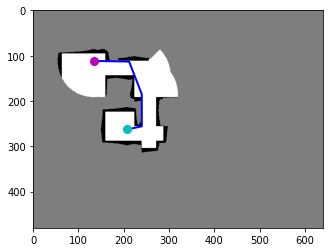

action offset [-0.990099  0.523338]
row move -70.00000020861626
col move 36.9999980032444


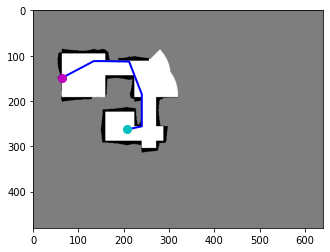

action {'last_map': tensor([[1.1779e-10, 1.1779e-10, 1.1779e-10,  ..., 1.1779e-10, 1.1779e-10,
         1.1779e-10],
        [1.1779e-10, 1.1779e-10, 1.1779e-10,  ..., 1.1779e-10, 1.1779e-10,
         1.1779e-10],
        [1.1779e-10, 1.1779e-10, 1.1779e-10,  ..., 1.1779e-10, 1.1779e-10,
         1.1779e-10],
        ...,
        [1.1779e-10, 1.1779e-10, 1.1779e-10,  ..., 1.1779e-10, 1.1779e-10,
         1.1779e-10],
        [1.1779e-10, 1.1779e-10, 1.1779e-10,  ..., 1.1779e-10, 1.1779e-10,
         1.1779e-10],
        [1.1779e-10, 1.1779e-10, 1.1779e-10,  ..., 1.1779e-10, 1.1779e-10,
         1.1779e-10]]), 'last_position': tensor([5.1993e-09, 1.1757e-09]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

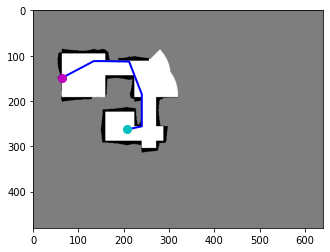

action offset [0.         0.42432815]
row move 0.0
col move 30.000000089406967


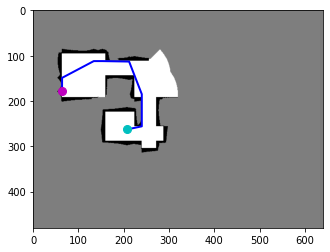

action {'last_map': tensor([[4.6192e-13, 4.6192e-13, 4.6192e-13,  ..., 4.6192e-13, 4.6192e-13,
         4.6192e-13],
        [4.6192e-13, 4.6192e-13, 4.6192e-13,  ..., 4.6192e-13, 4.6192e-13,
         4.6192e-13],
        [4.6192e-13, 4.6192e-13, 4.6192e-13,  ..., 4.6192e-13, 4.6192e-13,
         4.6192e-13],
        ...,
        [4.6192e-13, 4.6192e-13, 4.6192e-13,  ..., 4.6192e-13, 4.6192e-13,
         4.6192e-13],
        [4.6192e-13, 4.6192e-13, 4.6192e-13,  ..., 4.6192e-13, 4.6192e-13,
         4.6192e-13],
        [4.6192e-13, 4.6192e-13, 4.6192e-13,  ..., 4.6192e-13, 4.6192e-13,
         4.6192e-13]]), 'last_position': tensor([1.0832e-11, 1.8370e-12]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

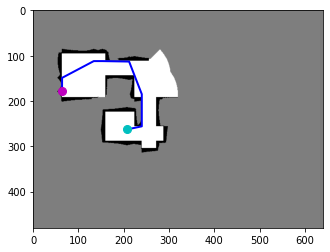

action offset [1.         0.16973126]
row move 70.7
col move 12.000000035762787


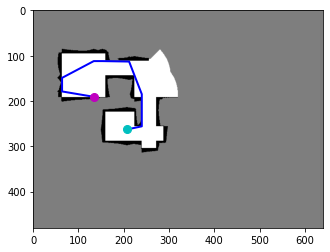

action {'last_map': tensor([[1.8114e-15, 1.8114e-15, 1.8114e-15,  ..., 1.8114e-15, 1.8114e-15,
         1.8114e-15],
        [1.8114e-15, 1.8114e-15, 1.8114e-15,  ..., 1.8114e-15, 1.8114e-15,
         1.8114e-15],
        [1.8114e-15, 1.8114e-15, 1.8114e-15,  ..., 1.8114e-15, 1.8114e-15,
         1.8114e-15],
        ...,
        [1.8114e-15, 1.8114e-15, 1.8114e-15,  ..., 1.8114e-15, 1.8114e-15,
         1.8114e-15],
        [1.8114e-15, 1.8114e-15, 1.8114e-15,  ..., 1.8114e-15, 1.8114e-15,
         1.8114e-15],
        [1.8114e-15, 1.8114e-15, 1.8114e-15,  ..., 1.8114e-15, 1.8114e-15,
         1.8114e-15]]), 'last_position': tensor([2.2566e-14, 2.8704e-15]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

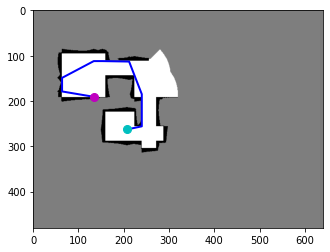

action offset [ 0.33946252 -0.66478074]
row move 24.000000071525573
col move -46.99999803304672


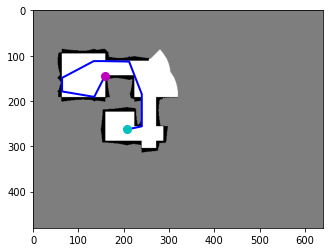

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


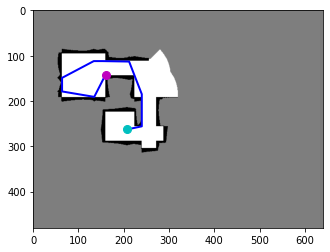

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


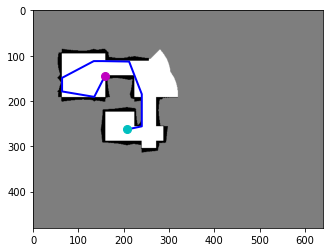

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


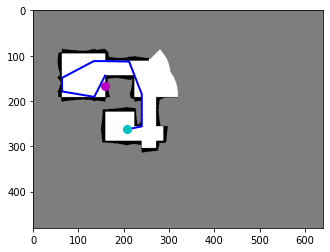

action {'last_map': tensor([[7.1037e-18, 7.1037e-18, 7.1037e-18,  ..., 7.1037e-18, 7.1037e-18,
         7.1037e-18],
        [7.1037e-18, 7.1037e-18, 7.1037e-18,  ..., 7.1037e-18, 7.1037e-18,
         7.1037e-18],
        [7.1037e-18, 7.1037e-18, 7.1037e-18,  ..., 7.1037e-18, 7.1037e-18,
         7.1037e-18],
        ...,
        [7.1037e-18, 7.1037e-18, 7.1037e-18,  ..., 7.1037e-18, 7.1037e-18,
         7.1037e-18],
        [7.1037e-18, 7.1037e-18, 7.1037e-18,  ..., 7.1037e-18, 7.1037e-18,
         7.1037e-18],
        [7.1037e-18, 7.1037e-18, 7.1037e-18,  ..., 7.1037e-18, 7.1037e-18,
         7.1037e-18]]), 'last_position': tensor([4.7013e-17, 4.4849e-18]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

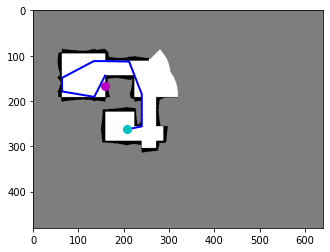

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


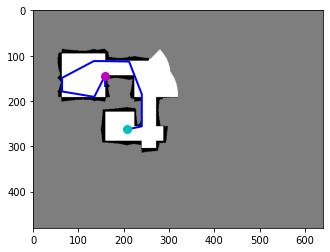

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


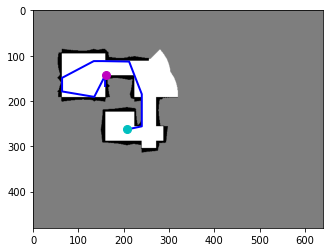

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


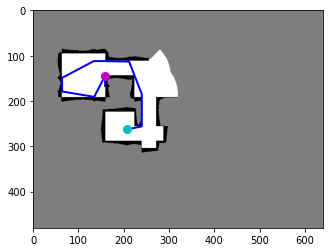

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


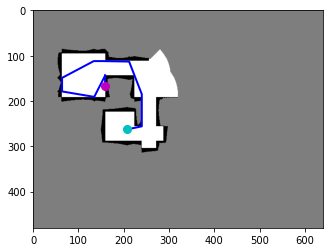

action {'last_map': tensor([[2.7857e-20, 2.7857e-20, 2.7857e-20,  ..., 2.7857e-20, 2.7857e-20,
         2.7857e-20],
        [2.7857e-20, 2.7857e-20, 2.7857e-20,  ..., 2.7857e-20, 2.7857e-20,
         2.7857e-20],
        [2.7857e-20, 2.7857e-20, 2.7857e-20,  ..., 2.7857e-20, 2.7857e-20,
         2.7857e-20],
        ...,
        [2.7857e-20, 2.7857e-20, 2.7857e-20,  ..., 2.7857e-20, 2.7857e-20,
         2.7857e-20],
        [2.7857e-20, 2.7857e-20, 2.7857e-20,  ..., 2.7857e-20, 2.7857e-20,
         2.7857e-20],
        [2.7857e-20, 2.7857e-20, 2.7857e-20,  ..., 2.7857e-20, 2.7857e-20,
         2.7857e-20]]), 'last_position': tensor([9.7944e-20, 7.0077e-21]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

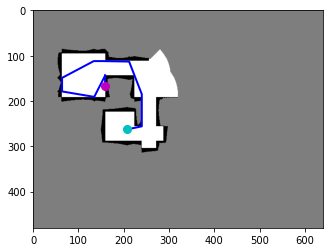

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


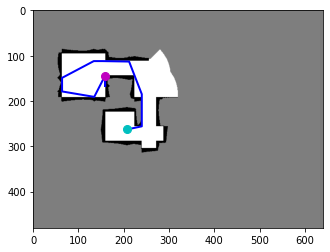

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


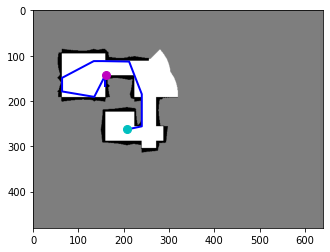

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


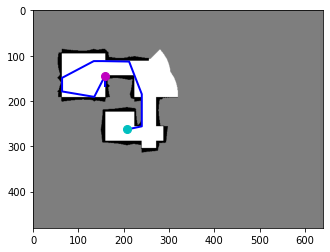

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


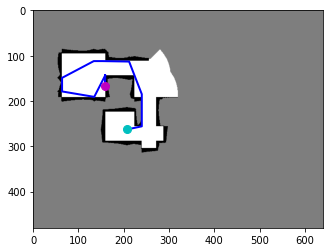

action {'last_map': tensor([[1.0925e-22, 1.0925e-22, 1.0925e-22,  ..., 1.0925e-22, 1.0925e-22,
         1.0925e-22],
        [1.0925e-22, 1.0925e-22, 1.0925e-22,  ..., 1.0925e-22, 1.0925e-22,
         1.0925e-22],
        [1.0925e-22, 1.0925e-22, 1.0925e-22,  ..., 1.0925e-22, 1.0925e-22,
         1.0925e-22],
        ...,
        [1.0925e-22, 1.0925e-22, 1.0925e-22,  ..., 1.0925e-22, 1.0925e-22,
         1.0925e-22],
        [1.0925e-22, 1.0925e-22, 1.0925e-22,  ..., 1.0925e-22, 1.0925e-22,
         1.0925e-22],
        [1.0925e-22, 1.0925e-22, 1.0925e-22,  ..., 1.0925e-22, 1.0925e-22,
         1.0925e-22]]), 'last_position': tensor([2.0405e-22, 1.0950e-23]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

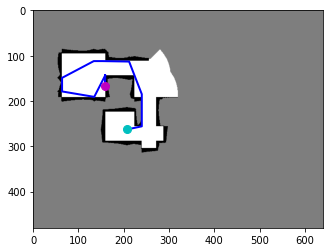

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


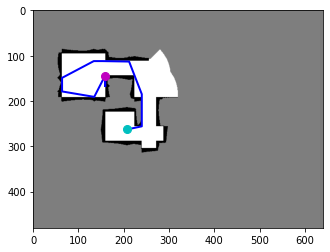

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


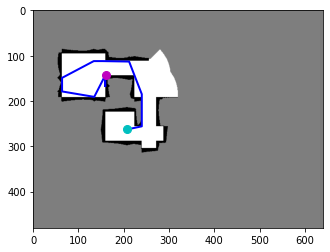

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


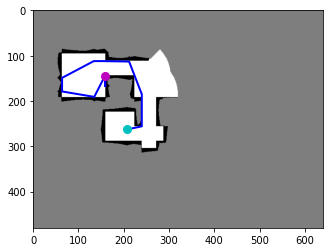

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


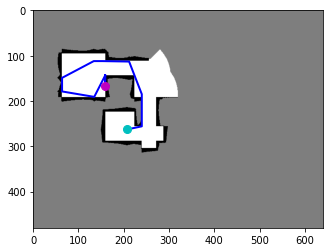

action {'last_map': tensor([[4.2841e-25, 4.2841e-25, 4.2841e-25,  ..., 4.2841e-25, 4.2841e-25,
         4.2841e-25],
        [4.2841e-25, 4.2841e-25, 4.2841e-25,  ..., 4.2841e-25, 4.2841e-25,
         4.2841e-25],
        [4.2841e-25, 4.2841e-25, 4.2841e-25,  ..., 4.2841e-25, 4.2841e-25,
         4.2841e-25],
        ...,
        [4.2841e-25, 4.2841e-25, 4.2841e-25,  ..., 4.2841e-25, 4.2841e-25,
         4.2841e-25],
        [4.2841e-25, 4.2841e-25, 4.2841e-25,  ..., 4.2841e-25, 4.2841e-25,
         4.2841e-25],
        [4.2841e-25, 4.2841e-25, 4.2841e-25,  ..., 4.2841e-25, 4.2841e-25,
         4.2841e-25]]), 'last_position': tensor([4.2511e-25, 1.7109e-26]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

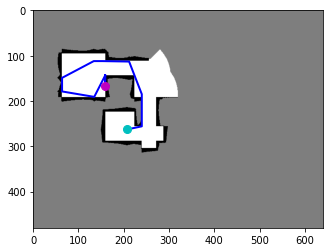

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


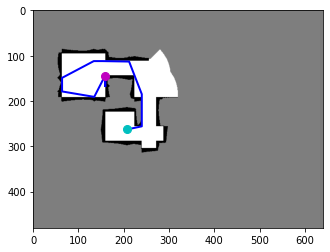

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


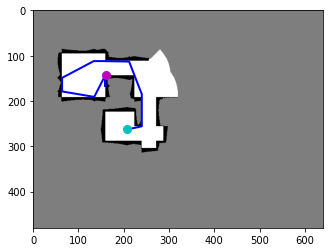

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


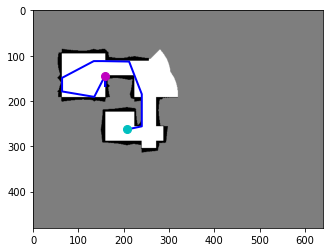

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


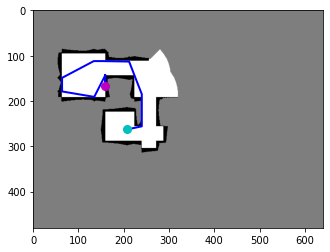

action {'last_map': tensor([[1.6800e-27, 1.6800e-27, 1.6800e-27,  ..., 1.6800e-27, 1.6800e-27,
         1.6800e-27],
        [1.6800e-27, 1.6800e-27, 1.6800e-27,  ..., 1.6800e-27, 1.6800e-27,
         1.6800e-27],
        [1.6800e-27, 1.6800e-27, 1.6800e-27,  ..., 1.6800e-27, 1.6800e-27,
         1.6800e-27],
        ...,
        [1.6800e-27, 1.6800e-27, 1.6800e-27,  ..., 1.6800e-27, 1.6800e-27,
         1.6800e-27],
        [1.6800e-27, 1.6800e-27, 1.6800e-27,  ..., 1.6800e-27, 1.6800e-27,
         1.6800e-27],
        [1.6800e-27, 1.6800e-27, 1.6800e-27,  ..., 1.6800e-27, 1.6800e-27,
         1.6800e-27]]), 'last_position': tensor([8.8564e-28, 2.6732e-29]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

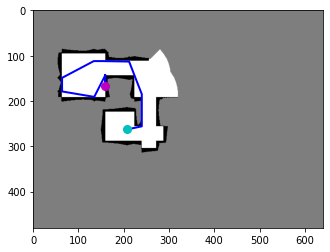

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


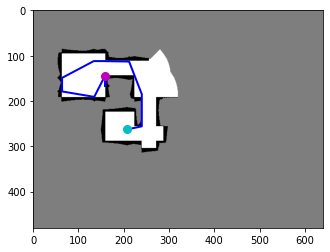

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


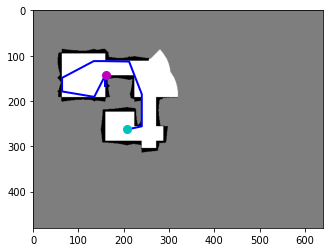

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


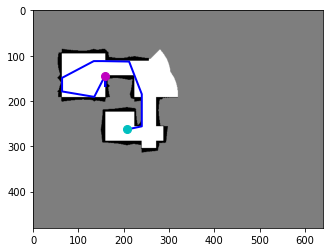

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


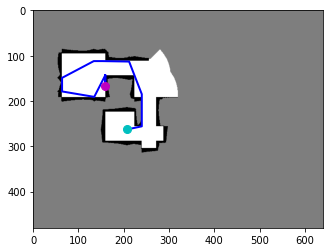

action {'last_map': tensor([[6.5884e-30, 6.5884e-30, 6.5884e-30,  ..., 6.5884e-30, 6.5884e-30,
         6.5884e-30],
        [6.5884e-30, 6.5884e-30, 6.5884e-30,  ..., 6.5884e-30, 6.5884e-30,
         6.5884e-30],
        [6.5884e-30, 6.5884e-30, 6.5884e-30,  ..., 6.5884e-30, 6.5884e-30,
         6.5884e-30],
        ...,
        [6.5884e-30, 6.5884e-30, 6.5884e-30,  ..., 6.5884e-30, 6.5884e-30,
         6.5884e-30],
        [6.5884e-30, 6.5884e-30, 6.5884e-30,  ..., 6.5884e-30, 6.5884e-30,
         6.5884e-30],
        [6.5884e-30, 6.5884e-30, 6.5884e-30,  ..., 6.5884e-30, 6.5884e-30,
         6.5884e-30]]), 'last_position': tensor([1.8451e-30, 4.1769e-32]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

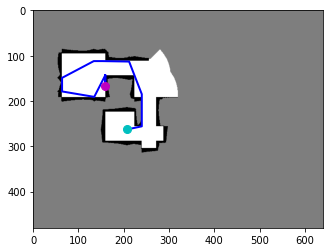

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


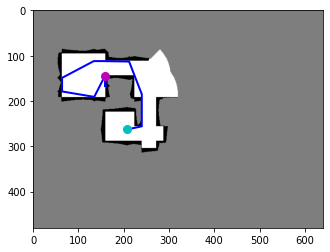

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


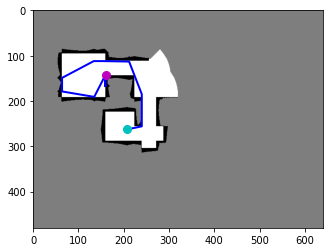

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


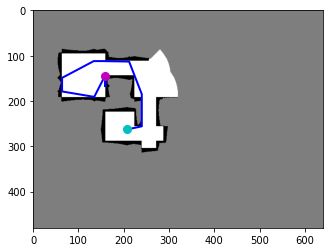

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


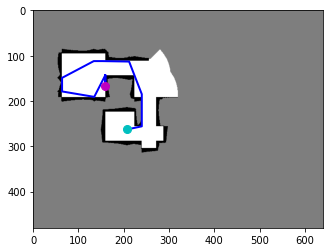

action {'last_map': tensor([[2.5837e-32, 2.5837e-32, 2.5837e-32,  ..., 2.5837e-32, 2.5837e-32,
         2.5837e-32],
        [2.5837e-32, 2.5837e-32, 2.5837e-32,  ..., 2.5837e-32, 2.5837e-32,
         2.5837e-32],
        [2.5837e-32, 2.5837e-32, 2.5837e-32,  ..., 2.5837e-32, 2.5837e-32,
         2.5837e-32],
        ...,
        [2.5837e-32, 2.5837e-32, 2.5837e-32,  ..., 2.5837e-32, 2.5837e-32,
         2.5837e-32],
        [2.5837e-32, 2.5837e-32, 2.5837e-32,  ..., 2.5837e-32, 2.5837e-32,
         2.5837e-32],
        [2.5837e-32, 2.5837e-32, 2.5837e-32,  ..., 2.5837e-32, 2.5837e-32,
         2.5837e-32]]), 'last_position': tensor([3.8439e-33, 6.5265e-35]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

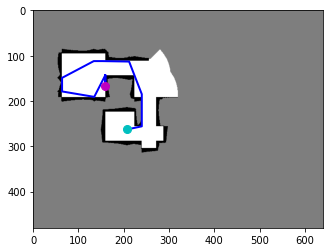

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


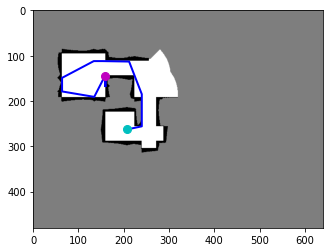

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


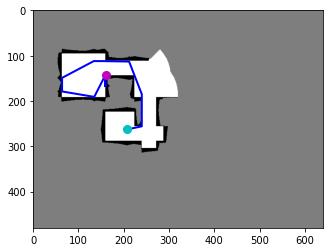

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


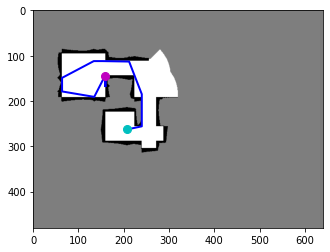

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


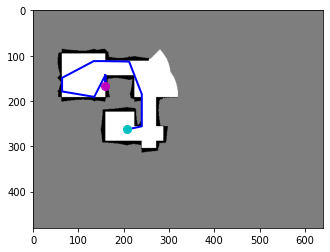

action {'last_map': tensor([[1.0132e-34, 1.0132e-34, 1.0132e-34,  ..., 1.0132e-34, 1.0132e-34,
         1.0132e-34],
        [1.0132e-34, 1.0132e-34, 1.0132e-34,  ..., 1.0132e-34, 1.0132e-34,
         1.0132e-34],
        [1.0132e-34, 1.0132e-34, 1.0132e-34,  ..., 1.0132e-34, 1.0132e-34,
         1.0132e-34],
        ...,
        [1.0132e-34, 1.0132e-34, 1.0132e-34,  ..., 1.0132e-34, 1.0132e-34,
         1.0132e-34],
        [1.0132e-34, 1.0132e-34, 1.0132e-34,  ..., 1.0132e-34, 1.0132e-34,
         1.0132e-34],
        [1.0132e-34, 1.0132e-34, 1.0132e-34,  ..., 1.0132e-34, 1.0132e-34,
         1.0132e-34]]), 'last_position': tensor([8.0081e-36, 1.0198e-37]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

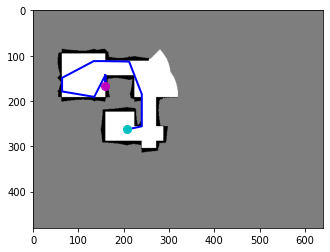

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


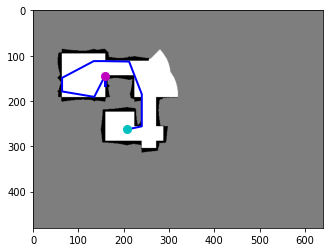

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


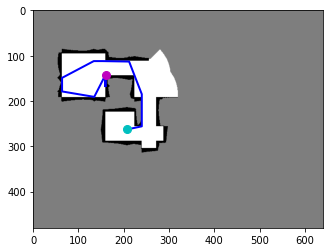

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


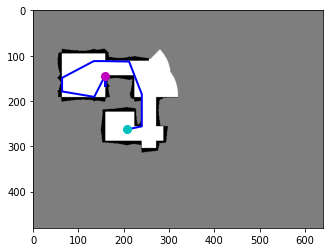

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


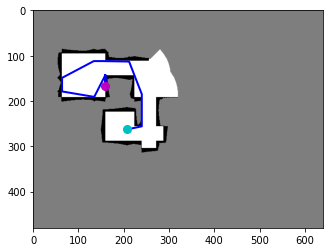

action {'last_map': tensor([[3.9734e-37, 3.9734e-37, 3.9734e-37,  ..., 3.9734e-37, 3.9734e-37,
         3.9734e-37],
        [3.9734e-37, 3.9734e-37, 3.9734e-37,  ..., 3.9734e-37, 3.9734e-37,
         3.9734e-37],
        [3.9734e-37, 3.9734e-37, 3.9734e-37,  ..., 3.9734e-37, 3.9734e-37,
         3.9734e-37],
        ...,
        [3.9734e-37, 3.9734e-37, 3.9734e-37,  ..., 3.9734e-37, 3.9734e-37,
         3.9734e-37],
        [3.9734e-37, 3.9734e-37, 3.9734e-37,  ..., 3.9734e-37, 3.9734e-37,
         3.9734e-37],
        [3.9734e-37, 3.9734e-37, 3.9734e-37,  ..., 3.9734e-37, 3.9734e-37,
         3.9734e-37]]), 'last_position': tensor([1.6684e-38, 1.5941e-40]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

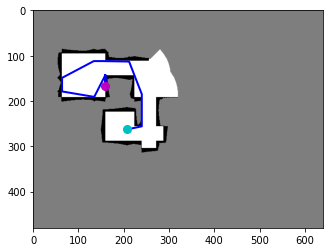

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


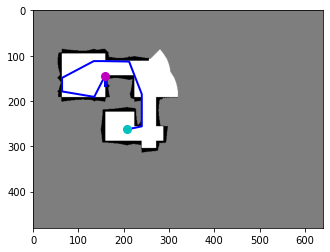

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


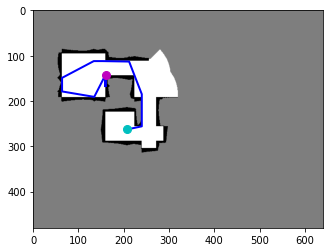

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


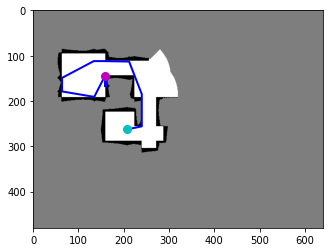

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


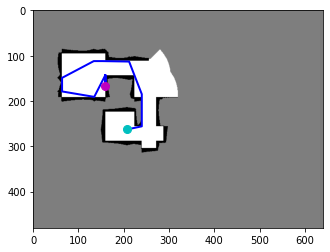

action {'last_map': tensor([[1.5582e-39, 1.5582e-39, 1.5582e-39,  ..., 1.5582e-39, 1.5582e-39,
         1.5582e-39],
        [1.5582e-39, 1.5582e-39, 1.5582e-39,  ..., 1.5582e-39, 1.5582e-39,
         1.5582e-39],
        [1.5582e-39, 1.5582e-39, 1.5582e-39,  ..., 1.5582e-39, 1.5582e-39,
         1.5582e-39],
        ...,
        [1.5582e-39, 1.5582e-39, 1.5582e-39,  ..., 1.5582e-39, 1.5582e-39,
         1.5582e-39],
        [1.5582e-39, 1.5582e-39, 1.5582e-39,  ..., 1.5582e-39, 1.5582e-39,
         1.5582e-39],
        [1.5582e-39, 1.5582e-39, 1.5582e-39,  ..., 1.5582e-39, 1.5582e-39,
         1.5582e-39]]), 'last_position': tensor([3.4976e-41, 0.0000e+00]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0

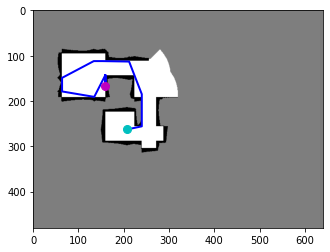

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


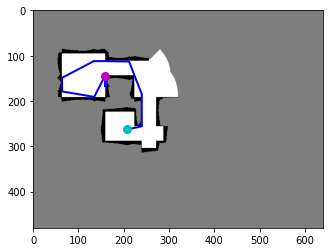

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


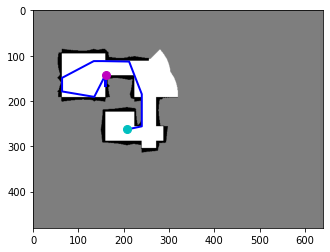

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


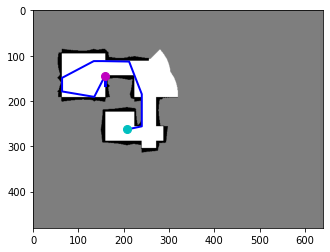

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


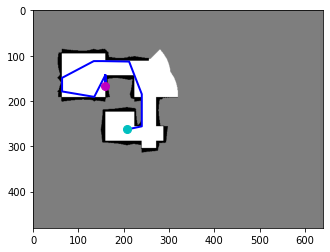

action {'last_map': tensor([[6.1111e-42, 6.1111e-42, 6.1111e-42,  ..., 6.1111e-42, 6.1111e-42,
         6.1111e-42],
        [6.1111e-42, 6.1111e-42, 6.1111e-42,  ..., 6.1111e-42, 6.1111e-42,
         6.1111e-42],
        [6.1111e-42, 6.1111e-42, 6.1111e-42,  ..., 6.1111e-42, 6.1111e-42,
         6.1111e-42],
        ...,
        [6.1111e-42, 6.1111e-42, 6.1111e-42,  ..., 6.1111e-42, 6.1111e-42,
         6.1111e-42],
        [6.1111e-42, 6.1111e-42, 6.1111e-42,  ..., 6.1111e-42, 6.1111e-42,
         6.1111e-42],
        [6.1111e-42, 6.1111e-42, 6.1111e-42,  ..., 6.1111e-42, 6.1111e-42,
         6.1111e-42]]), 'last_position': tensor([0., 0.]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        

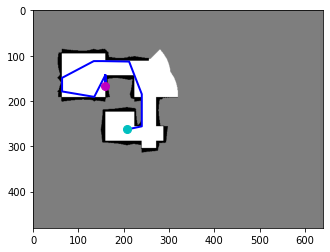

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


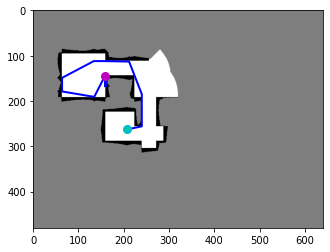

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


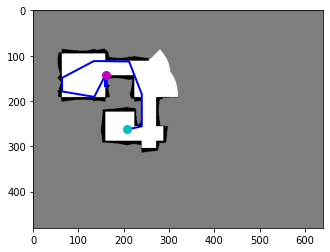

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


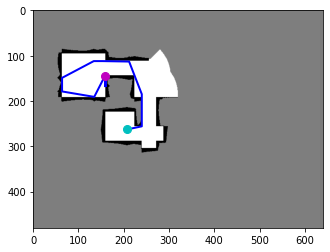

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


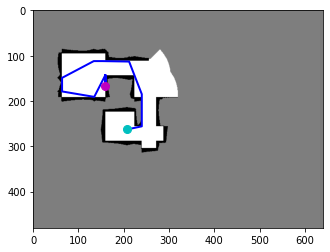

action {'last_map': tensor([[2.3822e-44, 2.3822e-44, 2.3822e-44,  ..., 2.3822e-44, 2.3822e-44,
         2.3822e-44],
        [2.3822e-44, 2.3822e-44, 2.3822e-44,  ..., 2.3822e-44, 2.3822e-44,
         2.3822e-44],
        [2.3822e-44, 2.3822e-44, 2.3822e-44,  ..., 2.3822e-44, 2.3822e-44,
         2.3822e-44],
        ...,
        [2.3822e-44, 2.3822e-44, 2.3822e-44,  ..., 2.3822e-44, 2.3822e-44,
         2.3822e-44],
        [2.3822e-44, 2.3822e-44, 2.3822e-44,  ..., 2.3822e-44, 2.3822e-44,
         2.3822e-44],
        [2.3822e-44, 2.3822e-44, 2.3822e-44,  ..., 2.3822e-44, 2.3822e-44,
         2.3822e-44]]), 'last_position': tensor([0., 0.]), 'map': tensor([[0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        ...,
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        [0.4980, 0.4980, 0.4980,  ..., 0.4980, 0.4980, 0.4980],
        

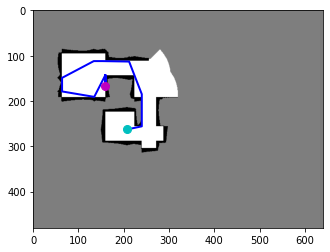

action offset [ 0.         -0.32531825]
row move 0.0
col move -23.000000068545344


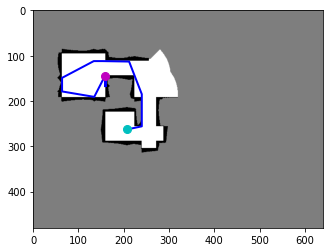

action offset [0.8910891 0.       ]
row move 62.99999808073044
col move 0.0


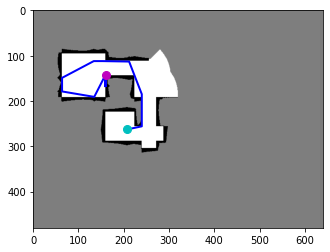

action offset [0.22630835 0.6930693 ]
row move 16.000000047683717
col move 48.99999803900719


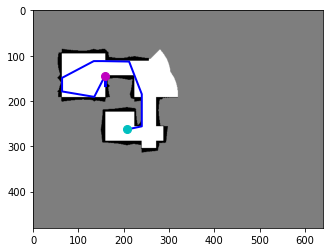

action offset [0.         0.32531825]
row move 0.0
col move 23.000000068545344


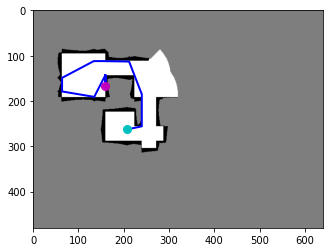

KeyboardInterrupt: ignored

In [ ]:
reward = 0

# test_map, test_position = replay.test_env.reset()
test_map, test_position = replay.test_env.reset()
test_map = resize(test_map, (84, 112))
test_map = test_map / 255
test_position = test_position.astype(np.float64)
test_position[0] = test_position[0] / 480
test_position[1] = test_position[1] / 640
test_action = {'map':torch.from_numpy(test_map).float(), 'position':torch.from_numpy(test_position).float()}
x = 0
test_policy = GuidedExplorationPolicy(1, None, action_space, 0.1)
total_reward = 0
while x < 300:
    test_action, test_terminal = replay.generate_step(test_policy, test_action, add_noise=False, store=False, test=True)
    print('action', test_action)
    print('terminal', test_terminal)
    total_reward += test_action['reward'].item()
    test_map = resize(test_map, (84, 112))
    test_map = test_map / 255
    test_position = test_position.astype(np.float64)
    test_position[0] = test_position[0] / 480
    test_position[1] = test_position[1] / 640
    test_action = {'map':torch.from_numpy(test_map).float(), 'position':torch.from_numpy(test_position).float()}
    if test_terminal:
        break
    x += 1

In [ ]:
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('runs/ddpg_nets')

KeyboardInterrupt: ignored

In [ ]:
td3.critic1

In [ ]:
maps, positions, rewards, actions, last_positions, last_maps = td3.replay.sample_transitions(10)
maps=maps.unsqueeze(1)
last_maps=last_maps.unsqueeze(1)
# target_action = td3.actor_target(last_maps, last_positions)
crit1 = td3.critic1_target(maps, positions, target_action)
# writer.add_graph(td3.actor, (last_maps, last_positions))
writer.add_graph(td3.critic1, (maps, positions, target_action))
writer.close()